In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing import image_dataset_from_directory



#### Saving or loading the model as desired.

In [2]:
from tensorflow.keras.models import load_model

In [3]:
#model.save("model_3_0") creates a folder with the same name as the model

In [4]:
#model_2 = load_model("model_2_after_15_epochs") loads a model from this folder

# Table of contents

[o](#Demonstrating-CNN-use-with-ASL-MNIST-Dataset-and-a-simple-neural-network)Demonstrating CNN use with ASL MNIST Dataset and a simple neural network

[o](#Improvement-paths-from-starting-model)Improvement paths from starting model

[o](#Optimizing-hyperparameters-via-grid-search-(useful-for-smaller-CNN's))Optimizing hyperparameters via grid search (useful for smaller CNN's)

[o](#Implementing-data:-ASL-Alphabet)Implementing data: ASL Alphabet

[o](#Training-with-validation)Training with validation

[o](#Test-with-larger-images)Test with larger images

[o](#Creating-a-single-photo-of-my-hand-signing-'A'-for-demo-purposes)Creating a single photo of my hand signing 'A' for demo purposes

[o](#Transfer-learning)Transfer learning

[o](#Removing-a-dense-layer-to-reduce-overfitting-and-increase-fitting-speed)Removing a dense layer to reduce overfitting and increase fitting speed

[o](#Photo-predictions)Photo predictions

[o](#Heatmap-of-test-data)Heatmap of test data



ToC based on instructions [here](https://stackoverflow.com/questions/49535664/how-to-hyperlink-in-a-jupyter-notebook)

## Demonstrating CNN use with ASL MNIST Dataset and a simple neural network

Importing this CSV data table into a pandas dataframe.

In [5]:
train_data = pd.read_csv('data/sign_mnist_train.csv')

test_data = pd.read_csv('data/sign_mnist_test.csv')


In [6]:
train_data.head(6)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,...,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,...,92,105,105,108,133,163,157,163,164,179
5,16,161,168,172,173,178,184,189,193,196,...,76,74,68,62,53,55,48,238,255,255


Collecting all of the y labels and considering their class balance.

In [7]:
#slicing to specify the labels
y_train = train_data.iloc[:,0]
y_train.head()

0     3
1     6
2     2
3     2
4    13
Name: label, dtype: int64

In [8]:
#tallying the numbers of images with every label
train_label_freq = y_train.groupby(y_train).count()
train_label_freq.head()

label
0    1126
1    1010
2    1144
3    1196
4     957
Name: label, dtype: int64

<AxesSubplot:xlabel='label'>

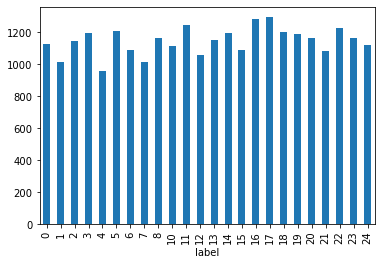

In [9]:
#plotting the counts of each image label in the dataframe
train_label_freq.plot.bar()

This dataset appears balanced enough for training.

Collecting all the pixel information for the training set's input.

In [10]:
X_train = train_data.iloc[:,1:]
X_train.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,107,118,127,134,139,143,146,150,153,156,...,207,207,207,207,206,206,206,204,203,202
1,155,157,156,156,156,157,156,158,158,157,...,69,149,128,87,94,163,175,103,135,149
2,187,188,188,187,187,186,187,188,187,186,...,202,201,200,199,198,199,198,195,194,195
3,211,211,212,212,211,210,211,210,210,211,...,235,234,233,231,230,226,225,222,229,163
4,164,167,170,172,176,179,180,184,185,186,...,92,105,105,108,133,163,157,163,164,179


Repeating the above X-y split for the test dataset.

In [11]:
y_test = test_data.iloc[:,0]
X_test = test_data.iloc[:,1:]

Code below inspired by the BrainStation class notebook's section 

"Building A CNN Using Tensorflow."

In [12]:
# Specific neural network models & layer types
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout


from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten

Performing some quick exploratory data analysis.

Finding the shape data for our dataframes.

In [13]:
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (27455, 784)
y_train shape: (27455,)
X_test shape: (7172, 784)
y_test shape: (7172,)


Finding the scale of X values (pixel intensity integers) and the distinct y values (identifiable letter indexes) from within this data.

In [14]:
# range of x values
print(f'X range: {X_train.min()[0]}-{X_train.max()[0]}') #just for show
# y unique values
print(f'y values: {np.unique(y_train)}')
num_classes = len(np.unique(y_train))
print(f'Number of classes: {num_classes}') #no 9's present

X range: 0-255
y values: [ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Number of classes: 24


Displaying the images that are being fed into our CNN.

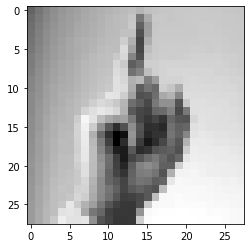

In [12]:
# plt.pyplot.imshow(X_train.iloc[0,:]) 
# error generated: Invalid shape (784,) for image data
#sqrt(784) = 28
sample_image = X_train.iloc[0,:].values.reshape(28,28)
plt.pyplot.imshow(sample_image, cmap = 'gray')

Creating an __X_train__ array of 28x28 images.

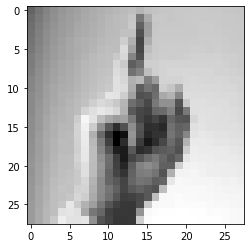

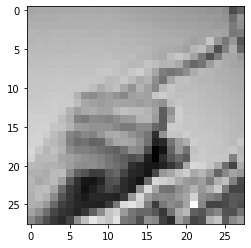

(27455, 28, 28)

In [13]:
X_images_train = []
for n in range(X_train.shape[0]):
    nth_image = X_train.iloc[n,:].values.reshape(28,28)
    X_images_train.append(nth_image)

#showing results
plt.pyplot.imshow(X_images_train[0], cmap = 'gray')
plt.pyplot.show()
plt.pyplot.imshow(X_images_train[1], cmap = 'gray')
plt.pyplot.show()
np.array(X_images_train).shape

Creating a matching __X_test__ array of 28x28 images

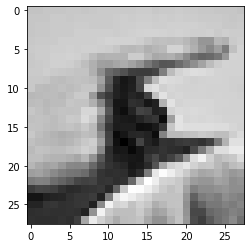

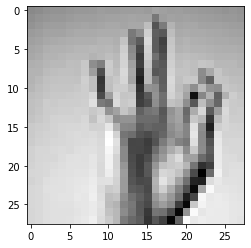

(27455, 28, 28)

In [14]:
X_images_test = []
for n in range(X_test.shape[0]):
    nth_image = X_test.iloc[n,:].values.reshape(28,28)
    X_images_test.append(nth_image)


plt.pyplot.imshow(X_images_test[0], cmap = 'gray')
plt.pyplot.show()
plt.pyplot.imshow(X_images_test[1], cmap = 'gray')
plt.pyplot.show()
np.array(X_images_train).shape

In [15]:
# Define input image dimensions
img_rows, img_cols = 28, 28
# Reshape for Keras model types
X_train = X_train.values.reshape(X_train.shape[0], img_rows, img_cols, 1)
X_test = X_test.values.reshape(X_test.shape[0], img_rows, img_cols, 1)

print(f'X_train shape: {X_train.shape}')
print(f'X_test shape: {X_test.shape}')


X_train shape: (27455, 28, 28, 1)
X_test shape: (7172, 28, 28, 1)


Scaling pixel values from 0-255 to 0-1 linearly (min-max scaling)

In [16]:
X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255

print(f'X_train range: {X_train.min()}-{X_train.max()}')

X_train range: 0.0-1.0


Replicating X_train and X_test for later use in cross validation

In [17]:
X_train_copy = X_train
X_test_copy = X_test

Constructing the CNN model

In [20]:
CNN_model_0 = Sequential()





CNN_model_0.add(Conv2D(32, kernel_size=(3, 3), activation = 'relu', input_shape = (28, 28, 1)))

CNN_model_0.add(Conv2D(64, (3, 3), activation='relu'))
CNN_model_0.add(MaxPooling2D(pool_size=(2, 2))) #avg pooling may also be used

CNN_model_0.add(Dropout(0.25)) #dropout may be varied here



CNN_model_0.add(Flatten())


CNN_model_0.add(Dense(128, activation='relu'))
CNN_model_0.add(Dropout(0.5))

# num_classes was here, but as the labels are missing an int before 24,
# num_classes is too small
# if this results in it guessing a nonexistant class or something
# here may be why
CNN_model_0.add(Dense(num_classes+1, activation='softmax'))

# Print out a summary of the network
CNN_model_0.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 26, 26, 32)        896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)              

Compiling

In [22]:
CNN_model_0.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

Training

In [20]:
X_train, X_vali, y_train, y_vali = train_test_split(X_train, y_train,
                                                    test_size = .32, random_state = 1)

In [21]:
# Fit the model on the training data, defining desired batch_size & number of epochs,
# running validation on the test data after each batch
# THIS WILL TAKE A LONG TIME TO RUN!!!
CNN_model_0.fit(X_train, y_train,
              batch_size = 128,
              epochs = 5,
              verbose = 1,
              validation_data = (X_vali, y_vali))

Epoch 1/5
146/146 [==============================] - 22s 150ms/step - loss: 1.8805 - accuracy: 0.4498 - val_loss: 0.4476 - val_accuracy: 0.9181
Epoch 2/5
146/146 [==============================] - 21s 142ms/step - loss: 0.4916 - accuracy: 0.8407 - val_loss: 0.0847 - val_accuracy: 0.9890
Epoch 3/5
146/146 [==============================] - 20s 140ms/step - loss: 0.2203 - accuracy: 0.9317 - val_loss: 0.0254 - val_accuracy: 0.9987
Epoch 4/5
146/146 [==============================] - 20s 140ms/step - loss: 0.1332 - accuracy: 0.9591 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 5/5
146/146 [==============================] - 20s 140ms/step - loss: 0.0998 - accuracy: 0.9700 - val_loss: 0.0044 - val_accuracy: 1.0000


evaluating via test data

In [22]:
score = CNN_model_0.evaluate(X_test, y_test, verbose=1)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

225/225 [==============================] - 2s 10ms/step - loss: 0.5013 - accuracy: 0.8801
Test loss: 0.5012662410736084
Test accuracy: 0.8800892233848572


Time required for a single image

In [23]:
X_test.shape

(7172, 28, 28, 1)

In [24]:
X_test_one_pic = X_test[0,:,:,:]
y_test_one_pic = y_test[0]

In [25]:
y_test_one_pic

6

In [26]:
X_test_one_pic = X_test_one_pic.reshape(1,
                                        X_test_one_pic.shape[0],
                                        X_test_one_pic.shape[1],
                                        X_test_one_pic.shape[2])

y_test_one_pic = y_test_one_pic.reshape(1)

In [27]:
X_test_one_pic.shape

(1, 28, 28, 1)

In [28]:
type(X_test_one_pic)

numpy.ndarray

In [29]:
y_test_one_pic.shape

(1,)

In [30]:
type(y_test_one_pic)

numpy.ndarray

In [31]:
y_test_one_pic = np.array(y_test_one_pic)

In [32]:
#finding the time for a single image recognition
score = CNN_model.predict(X_test_one_pic, verbose=1)

1/1 [==============================] - 0s 2ms/step


<AxesSubplot:>

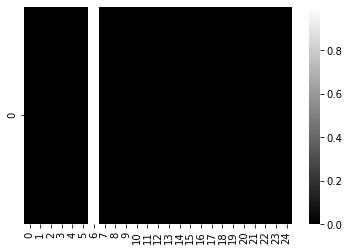

In [33]:
sns.heatmap(score, cmap = 'gray')

## Improvement paths from starting model

Improvement paths:
To improve **accuracy**, try optimizing for epochs and other hyperparameters via [grid search](https://mlfromscratch.com/gridsearch-keras-sklearn/#/). 

To improve **time**, try other short NN's.

To improve **accuracy for video response**, try using the grassnoted dataset as it is more diverse in RGB and in skin tone.

## Optimizing hyperparameters via grid search (useful for smaller CNN's)
Code from the guide [here](https://mlfromscratch.com/gridsearch-keras-sklearn/#/) by Casper Hansen.

In [34]:
#presenting X_train_copy and X_test_copy
X_train_copy
X_test_copy


array([[[[0.58431375],
         [0.58431375],
         [0.5882353 ],
         ...,
         [0.5882353 ],
         [0.5882353 ],
         [0.58431375]],

        [[0.5882353 ],
         [0.5882353 ],
         [0.5882353 ],
         ...,
         [0.5921569 ],
         [0.5882353 ],
         [0.5921569 ]],

        [[0.5882353 ],
         [0.5921569 ],
         [0.5921569 ],
         ...,
         [0.5921569 ],
         [0.5921569 ],
         [0.59607846]],

        ...,

        [[0.27058825],
         [0.27058825],
         [0.3019608 ],
         ...,
         [0.45490196],
         [0.44313726],
         [0.4627451 ]],

        [[0.2901961 ],
         [0.29411766],
         [0.29803923],
         ...,
         [0.43137255],
         [0.45490196],
         [0.44313726]],

        [[0.29411766],
         [0.2901961 ],
         [0.2901961 ],
         ...,
         [0.4392157 ],
         [0.47058824],
         [0.41960785]]],


       [[[0.49411765],
         [0.5019608 ],
         [0.51

**! vv The code in this section is not by me. vv !**

In [4]:
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

Setting the input shape that the model should expect for each photo.

In [36]:
input_shape = (28, 28, 1)

Preparing a function to create CNN models. As GridSearchCV comes from Sci-kit Learn, rather than Keras, the ways in which GridSearchCV adjusts parameters (using in-built methods) do not work. The model thus needs to be rebuilt with different parameters when testing each node in the search grid.

In [37]:
# Readying neural network model
def build_cnn(activation = 'relu',
              dropout_rate = 0.2,
              optimizer = 'Adam'):
    model = Sequential()
    
    model.add(Conv2D(32, kernel_size=(3, 3),
              activation=activation,
              input_shape=input_shape))
    model.add(Conv2D(64, (3, 3), activation=activation))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    model.add(Flatten())
    model.add(Dense(128, activation=activation))
    model.add(Dropout(dropout_rate))
    model.add(Dense(num_classes, activation='softmax')) #  M. changed input[0] to num_classes
    
    model.compile(
        loss='categorical_crossentropy', 
        optimizer=optimizer, 
        metrics=['accuracy']
    )
    
    return model

In [47]:
def algorithm_pipeline(X_train_data, X_test_data, y_train_data, y_test_data, 
                       model, param_grid, cv=10, scoring_fit='neg_mean_squared_error',
                       do_probabilities = False):
    gs = GridSearchCV(
        estimator=model,
        param_grid=param_grid, 
        cv=cv, 
        n_jobs=7, #  M. -1, or the maximum, caused my OS to kill off a worker
        scoring=scoring_fit,
        verbose=2
    )
    fitted_model = gs.fit(X_train_data, y_train_data)
    
    if do_probabilities:
      pred = fitted_model.predict_proba(X_test_data)
    else:
      pred = fitted_model.predict(X_test_data)
    
    return fitted_model, pred

In [39]:
param_grid = {
              'epochs':[1,2,3],
              'batch_size':[128]
              #'epochs' :              [100,150,200],
              #'batch_size' :          [32, 128],
              #'optimizer' :           ['Adam', 'Nadam'],
              #'dropout_rate' :        [0.2, 0.3],
              #'activation' :          ['relu', 'elu']
             }

In [40]:
model = KerasClassifier(build_fn = build_cnn, verbose=1)

grid_model_0, pred = algorithm_pipeline(X_train, X_test, y_train, y_test, model,
                                        param_grid, cv=5, scoring_fit='accuracy')
#M. optimized for accuracy via scoring_fit=
#M. renamed optimized output model to model_1

Fitting 5 folds for each of 3 candidates, totalling 15 fits


[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  10 out of  15 | elapsed:  4.7min remaining:  2.3min
[Parallel(n_jobs=7)]: Done  15 out of  15 | elapsed:  6.9min finished


Epoch 1/3
146/146 [==============================] - 21s 146ms/step - loss: 1.5582 - accuracy: 0.5608
Epoch 2/3
146/146 [==============================] - 21s 146ms/step - loss: 0.2566 - accuracy: 0.9251
Epoch 3/3
146/146 [==============================] - 22s 147ms/step - loss: 0.0811 - accuracy: 0.9804
Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
57/57 [==============================] - 2s 38ms/step


In [49]:
print(model_1.best_score_)
print(model_1.best_params_)

0.9988215816002011
{'batch_size': 128, 'epochs': 3}


GridSearchCV(cv=5,
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x0000023DD36BD0D0>,
             n_jobs=7, param_grid={'batch_size': [128], 'epochs': [1, 2, 3]},
             scoring='accuracy', verbose=2)

**! ^^ The code in this section is not by me. ^^ !**

Next, we will declare, train and evaluate a model based on these optimized parameters

In [79]:
CNN_model_1 = Sequential()





CNN_model_1.add(Conv2D(32, kernel_size=(3, 3), activation = 'relu', input_shape = (28, 28, 1)))

CNN_model_1.add(Conv2D(64, (3, 3), activation='relu'))
CNN_model_1.add(MaxPooling2D(pool_size=(2, 2))) #avg pooling may also be used

CNN_model_1.add(Dropout(0.25)) #dropout may be varied here



CNN_model_1.add(Flatten())


CNN_model_1.add(Dense(128, activation='relu'))
CNN_model_1.add(Dropout(0.5))

# num_classes was here, but as the labels are missing an int before 24,
# num_classes is too small
# if this results in it guessing a nonexistant class or something
# here may be why
CNN_model_1.add(Dense(num_classes+1, activation='softmax'))

# Print out a summary of the network
CNN_model_1.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)              

Compiling

In [83]:
CNN_model_1.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

Training

In [84]:
CNN_model_1.fit(X_train, y_train,
              batch_size = 128,
              epochs = 3,
              verbose = 1,
              validation_data = (X_vali, y_vali))

Epoch 1/3
146/146 [==============================] - 25s 173ms/step - loss: 2.3360 - accuracy: 0.3051 - val_loss: 0.7460 - val_accuracy: 0.8485
Epoch 2/3
146/146 [==============================] - 24s 165ms/step - loss: 0.8438 - accuracy: 0.7236 - val_loss: 0.1818 - val_accuracy: 0.9696
Epoch 3/3
146/146 [==============================] - 24s 163ms/step - loss: 0.4318 - accuracy: 0.8560 - val_loss: 0.0603 - val_accuracy: 0.9942


In [85]:
score = CNN_model_1.evaluate(X_test, y_test, verbose=1)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

225/225 [==============================] - 3s 12ms/step - loss: 0.4821 - accuracy: 0.8558
Test loss: 0.4821213483810425
Test accuracy: 0.8558282256126404


In [50]:
# from sklearn.metrics import SCORERS
# sorted(SCORERS.keys())

## Implementing data: ASL Alphabet

Data source page [here](https://www.kaggle.com/grassknoted/asl-alphabet/data).
To learn more about dataset pipelines in keras, see its documentation [here](https://www.tensorflow.org/guide/data#using_tfdata_with_tfkeras).

In [4]:
#import data from local directory
train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(28, 28), # default 256,256
                                          shuffle=True,
                                          seed=None,
                                          validation_split=None,
                                          subset=None,
                                          interpolation="bilinear",
                                          follow_links=False
                                          )

Found 87000 files belonging to 29 classes.


In [5]:
num_classes = 29

Dataset objects function quite smoothly within keras. 

In [24]:
CNN_model_0.fit(train_ds, epochs = 2)

Epoch 1/2
2719/2719 [==============================] - 250s 92ms/step - loss: 3.3684 - accuracy: 0.0329
Epoch 2/2
2719/2719 [==============================] - 255s 94ms/step - loss: 3.3677 - accuracy: 0.0327


In [25]:
loss, accuracy = CNN_model_0.evaluate(train_data)
print("Loss :", loss)
print("Accuracy :", accuracy)

2719/2719 [==============================] - 122s 45ms/step - loss: 3.3674 - accuracy: 0.0345
Loss : 3.367393970489502
Accuracy : 0.03448275849223137


This was a quick test run with the previously-built CNN_model_0.

Its accuracy seems rather low. In order to improve the accuracy, I will test, with CNN_model_1, cross-validation and larger images, separately.

## Training with validation

In [28]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(28, 28), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(28, 28), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


In [29]:
#declaring model
CNN_model_1 = Sequential()





CNN_model_1.add(Conv2D(32, kernel_size=(3, 3), activation = 'relu', input_shape = (28, 28, 3)))

CNN_model_1.add(Conv2D(64, (3, 3), activation='relu'))
CNN_model_1.add(MaxPooling2D(pool_size=(2, 2))) #avg pooling may also be used

CNN_model_1.add(Dropout(0.25)) #dropout may be varied here



CNN_model_1.add(Flatten())


CNN_model_1.add(Dense(128, activation='relu'))
CNN_model_1.add(Dropout(0.5))

# num_classes was here, but as the labels are missing an int before 24,
# num_classes is too small
# if this results in it guessing a nonexistant class or something
# here may be why
CNN_model_1.add(Dense(num_classes, activation='softmax'))

# Print out a summary of the network
CNN_model_1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 26, 26, 32)        896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)              

In [30]:
CNN_model_1.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [31]:
CNN_model_1.fit(grassnoted_train_ds, epochs = 2, validation_data = grassnoted_vali_ds)

Epoch 1/2
1904/1904 [==============================] - 185s 97ms/step - loss: 5.3472 - accuracy: 0.0341 - val_loss: 3.3677 - val_accuracy: 0.0330
Epoch 2/2
1904/1904 [==============================] - 197s 103ms/step - loss: 3.3676 - accuracy: 0.0310 - val_loss: 3.3677 - val_accuracy: 0.0332


In [37]:
loss, accuracy = CNN_model_1.evaluate(grassnoted_train_ds)
print("Loss :", loss)
print("Accuracy :", accuracy)

1904/1904 [==============================] - 88s 46ms/step - loss: 3.3673 - accuracy: 0.0350
Loss : 3.3673107624053955
Accuracy : 0.03502463176846504


The use of validation data has slightly improved training performance. Accuracy has increased from .0345 to .0350. 

In [39]:
CNN_model_1.fit(grassnoted_train_ds, epochs = 1, validation_data = grassnoted_vali_ds, verbose = 1)

1904/1904 [==============================] - 192s 101ms/step - loss: 3.3676 - accuracy: 0.0330 - val_loss: 3.3677 - val_accuracy: 0.0332


Attempting to gain plottable info about training accuracy and validation accuracy per epoch.
As described in [this thread](https://stackoverflow.com/questions/36952763/how-to-return-history-of-validation-loss-in-keras)

In [40]:
print(CNN_model_1.history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


In [49]:
print(f"Validation accuracy:{CNN_model_1.history.history['val_accuracy']}")
print(f"Training accuracy:{CNN_model_1.history.history['accuracy']}")

Validation accuracy:[0.0332183912396431]
Training accuracy:[0.03298850730061531]


This information will be useful when optimizing the hyperparameter epochs.
As such, a validation set will be used going forward.

## Test with larger images

As an image_size of the original photo is 200x200 and that goes beyond my computer's memory,  and the default 256x256 images made my kernel into a dead kernel, this test will be run with 30.

In [13]:
#plain data photos are 200x200
#import data from local directory
grassnoted_image_size_30_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(30, 30), # default 256,256
                                          shuffle=True,
                                          seed=None,
                                          validation_split=None,
                                          subset=None,
                                          interpolation="bilinear",
                                          follow_links=False
                                          )

Found 87000 files belonging to 29 classes.


In [15]:
#declaring model
CNN_model_1 = Sequential()





CNN_model_1.add(Conv2D(32, kernel_size=(3, 3), activation = 'relu', input_shape = (30, 30, 3)))

CNN_model_1.add(Conv2D(64, (3, 3), activation='relu'))
CNN_model_1.add(MaxPooling2D(pool_size=(2, 2))) #avg pooling may also be used

CNN_model_1.add(Dropout(0.25)) #dropout may be varied here



CNN_model_1.add(Flatten())


CNN_model_1.add(Dense(128, activation='relu'))
CNN_model_1.add(Dropout(0.5))


CNN_model_1.add(Dense(num_classes, activation='softmax'))

# Print out a summary of the network
CNN_model_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 28, 28, 32)        896       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 26, 26, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 13, 13, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 13, 13, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 10816)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               1384576   
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)              

In [16]:
CNN_model_1.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [18]:
CNN_model_1.fit(grassnoted_image_size_30_ds, epochs = 2, verbose = 1)

Epoch 1/2
2719/2719 [==============================] - 240s 88ms/step - loss: 1.4811 - accuracy: 0.5155
Epoch 2/2
2719/2719 [==============================] - 239s 88ms/step - loss: 0.7525 - accuracy: 0.7409


In [25]:
loss, accuracy = CNN_model_1.evaluate(grassnoted_image_size_30_ds)
print("Loss :", loss)
print("Accuracy :", accuracy)

2719/2719 [==============================] - 122s 45ms/step - loss: 3.3674 - accuracy: 0.0345
Loss : 3.367393970489502
Accuracy : 0.03448275849223137


Increasing the image size to 30x30 has increased the accuracy from .0345 to .03

In [ ]:
As increasing the image size to 

## Creating a single photo of my hand signing 'A' for demo purposes

[Keras documentation](https://keras.io/api/preprocessing/image/) shows an easy way to load images and to convert them into numpy arrays.

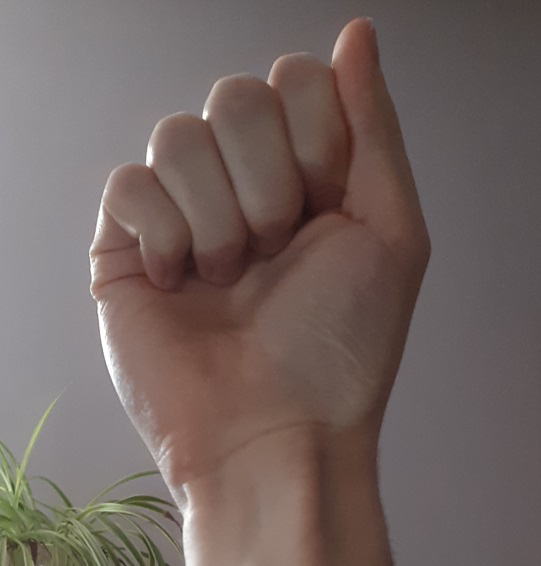

In [59]:
my_a = image.load_img('data/self_photos/a_crop_with_plant.jpg',
               grayscale=False,
               color_mode="rgb",
               target_size=None,
               interpolation="nearest")
my_a

In [60]:
my_a = image.load_img('data/self_photos/a_crop_with_plant.jpg',
               color_mode="grayscale",
               target_size=[28,28],
               interpolation="nearest")
my_a

In [67]:
my_o = image.load_img('data/self_photos/o_crop.jpg',
               color_mode="grayscale",
               target_size=[28,28],
               interpolation="nearest")
my_o

In [68]:
my_k = image.load_img('data/self_photos/k_crop.jpg',
               color_mode="grayscale",
               target_size=[28,28],
               interpolation="nearest")
my_k

Predictions for my signs: 'a' (0), 'o' (13), and 'k' (9)

In [90]:
input_arr = image.img_to_array(my_a)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = CNN_model_1.predict(input_arr)
print(f'Testing my a, correct answer 0, model predicts 0:')
predictions

Testing my a, correct answer 0, model predicts 0:


array([[9.9980074e-01, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 1.9928021e-04, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00]], dtype=float32)

In [92]:
input_arr = image.img_to_array(my_o)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = CNN_model_1.predict(input_arr)
print(f'Testing my o, correct answer 13, model predicts 15:')
predictions

Testing my o, correct answer 13, model predicts 15:


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        6.6767954e-33]], dtype=float32)

In [94]:
input_arr = image.img_to_array(my_k)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = CNN_model_1.predict(input_arr)
print(f'Testing my k, correct answer 9, model predicts 10:')
predictions

Testing my k, correct answer 9, model predicts 10:


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

This is not A-OK.

## Transfer learning

In order to improve recognition accuracy without sacrificing too much reaction time, I will use MobileNetV2. It is currently the smallest application [on Keras](https://keras.io/api/applications/). It is also a network architecture designed with hyperparameters that can trade-off between latency and accuracy, giving us case-specific optimization options.

Transfer learning involves importing new NN architecture that has been trained on a different dataset. Keras applications are usually trained with the imagenet dataset, which has over 14 million images and over 100 categories. This broad experience may improve recognition accuracy for the task at hand.

In [5]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

First, the model is imported and the final classification layers are removed.

In [5]:
experienced_model = MobileNetV2(weights='imagenet', include_top=False, input_shape = (32,32,3))
#input shape minimum is 32x32

Adapting interpeter from class notebook.

In [6]:
# Assign the output of this base_model to a variable:
base_model_out = experienced_model.output



# Add a pooling layer:
base_model_out = GlobalAveragePooling2D()(base_model_out)

# Add 3 dense layers so that the model can learn aspects of our new dataset 
# and classify for better results.
base_model_out = Dense(243, activation='relu')(base_model_out) 
base_model_out = Dense(243, activation='relu')(base_model_out)
base_model_out = Dense(81, activation='relu')(base_model_out)

# Add a final layer with num_classes == 29 neurons, one for each class in our dataset 
# using a softmabase_model_out activation function:
preds = Dense(29, activation='softmax')(base_model_out)




# Instantiate our final model, where we specify what are the inputs and 
# the outputs will look like
model = Model(inputs = experienced_model.input, 
              outputs = preds)

We can find the number of nodes in the topless MobileNetV2 by looking at the index of the pooling layer. These should be locked in order to preserve their weights.

!code from class notebook

In [94]:
for i, layer in enumerate(model.layers):
    print(i, layer.name)

0 input_6
1 Conv1
2 bn_Conv1
3 Conv1_relu
4 expanded_conv_depthwise
5 expanded_conv_depthwise_BN
6 expanded_conv_depthwise_relu
7 expanded_conv_project
8 expanded_conv_project_BN
9 block_1_expand
10 block_1_expand_BN
11 block_1_expand_relu
12 block_1_pad
13 block_1_depthwise
14 block_1_depthwise_BN
15 block_1_depthwise_relu
16 block_1_project
17 block_1_project_BN
18 block_2_expand
19 block_2_expand_BN
20 block_2_expand_relu
21 block_2_depthwise
22 block_2_depthwise_BN
23 block_2_depthwise_relu
24 block_2_project
25 block_2_project_BN
26 block_2_add
27 block_3_expand
28 block_3_expand_BN
29 block_3_expand_relu
30 block_3_pad
31 block_3_depthwise
32 block_3_depthwise_BN
33 block_3_depthwise_relu
34 block_3_project
35 block_3_project_BN
36 block_4_expand
37 block_4_expand_BN
38 block_4_expand_relu
39 block_4_depthwise
40 block_4_depthwise_BN
41 block_4_depthwise_relu
42 block_4_project
43 block_4_project_BN
44 block_4_add
45 block_5_expand
46 block_5_expand_BN
47 block_5_expand_relu
48 b

!code from class notebook

In [7]:
for layer in model.layers[:154]:
    layer.trainable=False
    
for layer in model.layers[154:]:
    print(layer.name)
    layer.trainable=True

global_average_pooling2d
dense
dense_1
dense_2
dense_3


In [8]:
model.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

I am repeating the data import and preprocessing from above in order to improve this section's readability.

In [9]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(32, 32), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(32, 32), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 32, 32, 3), (None,)), types: (tf.float32, tf.int32)>

In [106]:
model.fit(grassnoted_train_ds, epochs = 3, validation_data = grassnoted_vali_ds, verbose = 1)

Epoch 1/3
1904/1904 [==============================] - 145s 76ms/step - loss: 3.1683 - accuracy: 0.0984 - val_loss: 3.1718 - val_accuracy: 0.0970
Epoch 2/3
1904/1904 [==============================] - 147s 77ms/step - loss: 3.1578 - accuracy: 0.1002 - val_loss: 3.1651 - val_accuracy: 0.0999
Epoch 3/3
1904/1904 [==============================] - 146s 77ms/step - loss: 3.1477 - accuracy: 0.1039 - val_loss: 3.1636 - val_accuracy: 0.1011


 !vadapted from class notebook codev

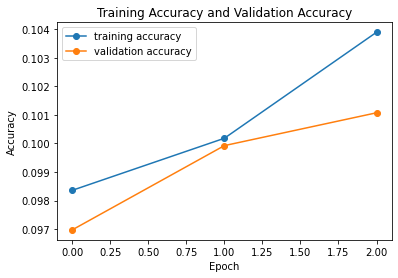

In [107]:
plt.figure()
plt.plot(model.history.history['accuracy'], marker='o', label='training accuracy')
plt.plot(model.history.history['val_accuracy'], marker='o', label='validation accuracy')
plt.title('Training Accuracy and Validation Accuracy')
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

!^adapted from class notebook^

Making a model with larger image-size inputs with the hope of improving starting accuracy.

First, the model is imported and the final classification layers are removed.

In [109]:
experienced_model = MobileNetV2(weights='imagenet', include_top=False, input_shape = (60,60,3))
#input shape minimum is 32x32
#this warning is all bark and no bite

Adapting interpeter from class notebook.

In [110]:
# Assign the output of this base_model to a variable:
base_model_out = experienced_model.output



# Add a pooling layer:
base_model_out = GlobalAveragePooling2D()(base_model_out)

# Add 3 dense layers so that the model can learn aspects of our new dataset 
# and classify for better results.
base_model_out = Dense(243, activation='relu')(base_model_out) 
base_model_out = Dense(243, activation='relu')(base_model_out)
base_model_out = Dense(81, activation='relu')(base_model_out)

# Add a final layer with num_classes == 29 neurons, one for each class in our dataset 
# using a softmabase_model_out activation function:
preds = Dense(29, activation='softmax')(base_model_out)




# Instantiate our final model, where we specify what are the inputs and 
# the outputs will look like
model = Model(inputs = experienced_model.input, 
              outputs = preds)

We can find the number of nodes in the topless MobileNetV2 by looking at the index of the pooling layer. These should be locked in order to preserve their weights.

!code from class notebook

In [111]:
for i, layer in enumerate(model.layers):
    print(i, layer.name)

0 input_8
1 Conv1
2 bn_Conv1
3 Conv1_relu
4 expanded_conv_depthwise
5 expanded_conv_depthwise_BN
6 expanded_conv_depthwise_relu
7 expanded_conv_project
8 expanded_conv_project_BN
9 block_1_expand
10 block_1_expand_BN
11 block_1_expand_relu
12 block_1_pad
13 block_1_depthwise
14 block_1_depthwise_BN
15 block_1_depthwise_relu
16 block_1_project
17 block_1_project_BN
18 block_2_expand
19 block_2_expand_BN
20 block_2_expand_relu
21 block_2_depthwise
22 block_2_depthwise_BN
23 block_2_depthwise_relu
24 block_2_project
25 block_2_project_BN
26 block_2_add
27 block_3_expand
28 block_3_expand_BN
29 block_3_expand_relu
30 block_3_pad
31 block_3_depthwise
32 block_3_depthwise_BN
33 block_3_depthwise_relu
34 block_3_project
35 block_3_project_BN
36 block_4_expand
37 block_4_expand_BN
38 block_4_expand_relu
39 block_4_depthwise
40 block_4_depthwise_BN
41 block_4_depthwise_relu
42 block_4_project
43 block_4_project_BN
44 block_4_add
45 block_5_expand
46 block_5_expand_BN
47 block_5_expand_relu
48 b

In [112]:
!code from class notebook

In [113]:
for layer in model.layers[:154]:
    layer.trainable=False
    
for layer in model.layers[154:]:
    print(layer.name)
    layer.trainable=True

global_average_pooling2d_4
dense_22
dense_23
dense_24
dense_25


In [114]:
model.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [115]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(60, 60), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(60, 60), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 60, 60, 3), (None,)), types: (tf.float32, tf.int32)>

In [116]:
model.fit(grassnoted_train_ds, epochs = 3, validation_data = grassnoted_vali_ds, verbose = 1)

Epoch 1/3
1904/1904 [==============================] - 283s 147ms/step - loss: 2.0581 - accuracy: 0.3780 - val_loss: 1.2164 - val_accuracy: 0.5989
Epoch 2/3
1904/1904 [==============================] - 292s 153ms/step - loss: 1.0632 - accuracy: 0.6482 - val_loss: 0.9557 - val_accuracy: 0.6836
Epoch 3/3
1904/1904 [==============================] - 294s 154ms/step - loss: 0.8475 - accuracy: 0.7171 - val_loss: 0.8826 - val_accuracy: 0.7090


 !Vadapted from class notebook codeV

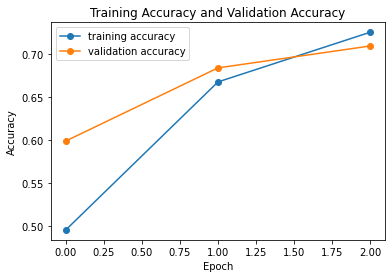

In [118]:
plt.figure()
plt.plot(model.history.history['accuracy'], marker='o', label='training accuracy')
plt.plot(model.history.history['val_accuracy'], marker='o', label='validation accuracy')
plt.title('Training Accuracy and Validation Accuracy')
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

Both starting accuracies are substantially improved. A validation of between 60% and 70% for a set of 29 classes is getting to be good.

The training accuracy spiking up at a greater rate than the validation accuracy seems like potential overfitting has occurred.

## Removing a dense layer to reduce overfitting and increase fitting speed

First, the model is imported and the final classification layers are removed.

In [11]:
experienced_model = MobileNetV2(weights='imagenet', include_top=False, input_shape = (60,60,3))
#input shape minimum is 32x32
#this warning is all bark and no bite

Adapting interpeter from class notebook.

In [12]:
# Assign the output of this base_model to a variable:
base_model_out = experienced_model.output



# Add a pooling layer:
base_model_out = GlobalAveragePooling2D()(base_model_out)

# Add 3 dense layers so that the model can learn aspects of our new dataset 
# and classify for better results.
base_model_out = Dense(243, activation='relu')(base_model_out) 
#base_model_out = Dense(243, activation='relu')(base_model_out)
base_model_out = Dense(81, activation='relu')(base_model_out)

# Add a final layer with num_classes == 29 neurons, one for each class in our dataset 
# using a softmabase_model_out activation function:
preds = Dense(29, activation='softmax')(base_model_out)




# Instantiate our final model, where we specify what are the inputs and 
# the outputs will look like
model = Model(inputs = experienced_model.input, 
              outputs = preds)

We can find the number of nodes in the topless MobileNetV2 by looking at the index of the pooling layer. These should be locked in order to preserve their weights.

!code from class notebook

In [13]:
for i, layer in enumerate(model.layers):
    print(i, layer.name)

0 input_2
1 Conv1
2 bn_Conv1
3 Conv1_relu
4 expanded_conv_depthwise
5 expanded_conv_depthwise_BN
6 expanded_conv_depthwise_relu
7 expanded_conv_project
8 expanded_conv_project_BN
9 block_1_expand
10 block_1_expand_BN
11 block_1_expand_relu
12 block_1_pad
13 block_1_depthwise
14 block_1_depthwise_BN
15 block_1_depthwise_relu
16 block_1_project
17 block_1_project_BN
18 block_2_expand
19 block_2_expand_BN
20 block_2_expand_relu
21 block_2_depthwise
22 block_2_depthwise_BN
23 block_2_depthwise_relu
24 block_2_project
25 block_2_project_BN
26 block_2_add
27 block_3_expand
28 block_3_expand_BN
29 block_3_expand_relu
30 block_3_pad
31 block_3_depthwise
32 block_3_depthwise_BN
33 block_3_depthwise_relu
34 block_3_project
35 block_3_project_BN
36 block_4_expand
37 block_4_expand_BN
38 block_4_expand_relu
39 block_4_depthwise
40 block_4_depthwise_BN
41 block_4_depthwise_relu
42 block_4_project
43 block_4_project_BN
44 block_4_add
45 block_5_expand
46 block_5_expand_BN
47 block_5_expand_relu
48 b

!code from class notebook

In [14]:
for layer in model.layers[:154]:
    layer.trainable=False
    
for layer in model.layers[154:]:
    print(layer.name)
    layer.trainable=True

global_average_pooling2d_1
dense_4
dense_5
dense_6


In [15]:
model.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [16]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(60, 60), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=32,
                                          image_size=(60, 60), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 60, 60, 3), (None,)), types: (tf.float32, tf.int32)>

In [17]:
model.fit(grassnoted_train_ds, epochs = 3, validation_data = grassnoted_vali_ds, verbose = 1)

Epoch 1/3
1904/1904 [==============================] - 322s 167ms/step - loss: 2.0728 - accuracy: 0.3814 - val_loss: 1.1947 - val_accuracy: 0.6044
Epoch 2/3
1904/1904 [==============================] - 233s 122ms/step - loss: 1.0578 - accuracy: 0.6513 - val_loss: 0.9538 - val_accuracy: 0.6820
Epoch 3/3
1904/1904 [==============================] - 237s 125ms/step - loss: 0.8672 - accuracy: 0.7140 - val_loss: 0.9135 - val_accuracy: 0.6959


 !Vadapted from class notebook codeV

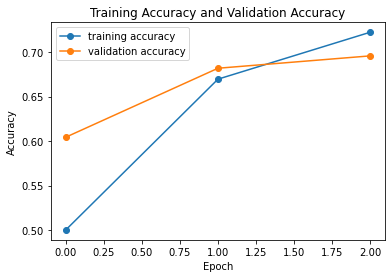

In [18]:
plt.figure()
plt.plot(model.history.history['accuracy'], marker='o', label='training accuracy')
plt.plot(model.history.history['val_accuracy'], marker='o', label='validation accuracy')
plt.title('Training Accuracy and Validation Accuracy')
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

The validation accuracy has a similar bend at epoch 2, but may have fit slightly faster. This model may be worth fitting for more epochs to see how the fitting progresses.

In [20]:
#recompiling to remove previous training weights
model.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [21]:
model.fit(grassnoted_train_ds, epochs = 6, validation_data = grassnoted_vali_ds, verbose = 1)

Epoch 1/6
1904/1904 [==============================] - 272s 141ms/step - loss: 0.6553 - accuracy: 0.7794 - val_loss: 0.8187 - val_accuracy: 0.7387
Epoch 2/6
1904/1904 [==============================] - 278s 146ms/step - loss: 0.6061 - accuracy: 0.7950 - val_loss: 0.8019 - val_accuracy: 0.7435
Epoch 3/6
1904/1904 [==============================] - 282s 148ms/step - loss: 0.5500 - accuracy: 0.8154 - val_loss: 0.8203 - val_accuracy: 0.7433
Epoch 4/6
1904/1904 [==============================] - 274s 144ms/step - loss: 0.5082 - accuracy: 0.8279 - val_loss: 0.8538 - val_accuracy: 0.7420
Epoch 5/6
1904/1904 [==============================] - 255s 134ms/step - loss: 0.4742 - accuracy: 0.8379 - val_loss: 0.8069 - val_accuracy: 0.7563
Epoch 6/6
1904/1904 [==============================] - 253s 133ms/step - loss: 0.4424 - accuracy: 0.8504 - val_loss: 0.8443 - val_accuracy: 0.7568


 !Vadapted from class notebook codeV

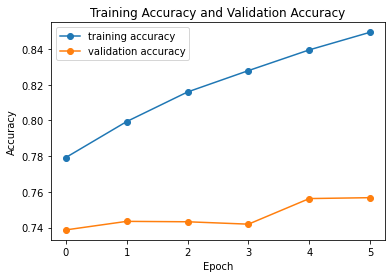

In [22]:
plt.figure()
plt.plot(model.history.history['accuracy'], marker='o', label='training accuracy')
plt.plot(model.history.history['val_accuracy'], marker='o', label='validation accuracy')
plt.title('Training Accuracy and Validation Accuracy')
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

Overfitting still appears to be occurring, so I will return to the larger dataset and increase dropout to improve underfitting and image size to improve starting accuracy. I will also increase the batch size in order to get more stable training results.

Incorporating larger images and dropout layer.

In [54]:
experienced_model = MobileNetV2(weights='imagenet', include_top=False, input_shape = (80,80,3))
#input shape minimum is 32x32
#this warning is all bark and no bite

Adapting interpeter from class notebook.

In [55]:
# Assign the output of this base_model to a variable:
base_model_out = experienced_model.output



# Add a pooling layer:
base_model_out = GlobalAveragePooling2D()(base_model_out)

# Add 3 dense layers so that the model can learn aspects of our new dataset 
# and classify for better results.
base_model_out = Dense(243, activation='relu')(base_model_out) 
base_model_out = Dense(243, activation='relu')(base_model_out)
base_model_out = Dropout(.2, input_shape=(243,))(base_model_out, training=True)
base_model_out = Dense(81, activation='relu')(base_model_out)

# Add a final layer with num_classes == 29 neurons, one for each class in our dataset 
# using a softmabase_model_out activation function:
preds = Dense(29, activation='softmax')(base_model_out)




# Instantiate our final model, where we specify what are the inputs and 
# the outputs will look like
model = Model(inputs = experienced_model.input, 
              outputs = preds)

We can find the number of nodes in the topless MobileNetV2 by looking at the index of the pooling layer. These should be locked in order to preserve their weights.

!code from class notebook

In [56]:
for i, layer in enumerate(model.layers):
    print(i, layer.name)

0 input_5
1 Conv1
2 bn_Conv1
3 Conv1_relu
4 expanded_conv_depthwise
5 expanded_conv_depthwise_BN
6 expanded_conv_depthwise_relu
7 expanded_conv_project
8 expanded_conv_project_BN
9 block_1_expand
10 block_1_expand_BN
11 block_1_expand_relu
12 block_1_pad
13 block_1_depthwise
14 block_1_depthwise_BN
15 block_1_depthwise_relu
16 block_1_project
17 block_1_project_BN
18 block_2_expand
19 block_2_expand_BN
20 block_2_expand_relu
21 block_2_depthwise
22 block_2_depthwise_BN
23 block_2_depthwise_relu
24 block_2_project
25 block_2_project_BN
26 block_2_add
27 block_3_expand
28 block_3_expand_BN
29 block_3_expand_relu
30 block_3_pad
31 block_3_depthwise
32 block_3_depthwise_BN
33 block_3_depthwise_relu
34 block_3_project
35 block_3_project_BN
36 block_4_expand
37 block_4_expand_BN
38 block_4_expand_relu
39 block_4_depthwise
40 block_4_depthwise_BN
41 block_4_depthwise_relu
42 block_4_project
43 block_4_project_BN
44 block_4_add
45 block_5_expand
46 block_5_expand_BN
47 block_5_expand_relu
48 b

!code from class notebook

In [57]:
for layer in model.layers[:154]:
    layer.trainable=False
    
for layer in model.layers[154:]:
    print(layer.name)
    layer.trainable=True

global_average_pooling2d_8
dense_25
dense_26
dropout_5
dense_27
dense_28


In [58]:
model.compile(loss = 'sparse_categorical_crossentropy', #loss function
                  optimizer = 'Adam',
                  metrics = ['accuracy']) #value to maximize

In [10]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,#
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 80, 80, 3), (None,)), types: (tf.float32, tf.int32)>

In [66]:
model.fit(grassnoted_train_ds, epochs = 15, validation_data = grassnoted_vali_ds, verbose = 1)

Epoch 1/15
609/609 [==============================] - 310s 508ms/step - loss: 0.4504 - accuracy: 0.8438 - val_loss: 0.5621 - val_accuracy: 0.8142
Epoch 2/15
609/609 [==============================] - 307s 504ms/step - loss: 0.4244 - accuracy: 0.8527 - val_loss: 0.5356 - val_accuracy: 0.8207
Epoch 3/15
609/609 [==============================] - 307s 503ms/step - loss: 0.4040 - accuracy: 0.8608 - val_loss: 0.5572 - val_accuracy: 0.8176
Epoch 4/15
609/609 [==============================] - 337s 552ms/step - loss: 0.3765 - accuracy: 0.8684 - val_loss: 0.5449 - val_accuracy: 0.8191
Epoch 5/15
609/609 [==============================] - 307s 503ms/step - loss: 0.3625 - accuracy: 0.8745 - val_loss: 0.5270 - val_accuracy: 0.8271
Epoch 6/15
609/609 [==============================] - 304s 498ms/step - loss: 0.3524 - accuracy: 0.8773 - val_loss: 0.5229 - val_accuracy: 0.8310
Epoch 7/15
609/609 [==============================] - 315s 516ms/step - loss: 0.3391 - accuracy: 0.8805 - val_loss: 0.5002 -

 !Vadapted from class notebook codeV

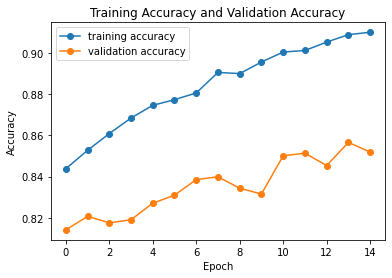

In [69]:
plt.figure()
plt.plot(model.history.history['accuracy'], marker='o', label='training accuracy')
plt.plot(model.history.history['val_accuracy'], marker='o', label='validation accuracy')
plt.title('Training Accuracy and Validation Accuracy')
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

In [4]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,#
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 80, 80, 3), (None,)), types: (tf.float32, tf.int32)>

## Photo predictions

We are well on our way to making predictions on video snapshots. 
Next, we will start small and make a function that has the model make predictions based on a few input images.
More information can be found in [the documentation](https://keras.io/api/preprocessing/image/#loadimg-function).

In [123]:
def load_and_predict_letter(model, photo_path):
    pass

In [5]:
label_map = grassnoted_train_ds.class_names
#going from (29,1) to (29)
label_map = np.reshape(label_map, [29])

In [7]:
#method that returns info on the image shape needed.
model_2.input_shape

NameError: name 'model' is not defined

In [126]:
#inputs a keras model and the filepath for a photo of a hand relative to the local directory
#photo must be RGB
#returns an array that sums to 1 with prediction weights for each class the model can detect.
def load_and_predict_photo(model, path):
    #loading photo
    photo = image.load_img(path,
                           grayscale=False,
                           color_mode="rgb",
                           target_size=model.input_shape[1:3],
                           interpolation="nearest")
    input_arr = image.img_to_array(photo)
    input_arr = np.array([input_arr])  #this model predicts based on batches. Making solo batch.
    predictions = model.predict(input_arr)
    return predictions

In [60]:
def chart_predictions(predictions, labels):
    predictions = np.reshape(predictions, 29)
    plt.figure(figsize=[26,8])
    plt.bar(height = predictions, x = labels)
    plt.tight_layout()
    plt.show()
    pass

### A

In [61]:
%%time
probs = load_and_predict_photo(model_2, 'data/self_photos/a_crop_with_plant.jpg')

index = probs.argmax()
label_map[index]

KeyError: 0

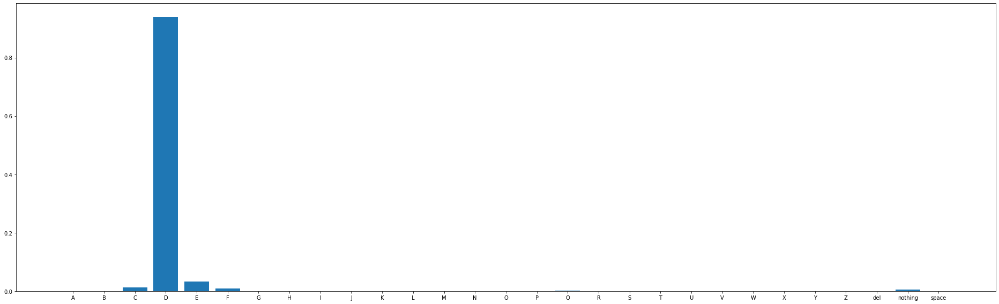

In [150]:

chart_predictions(labels = label_map, predictions = probs)


### O

In [151]:
%%time
probs = load_and_predict_photo(model_2, 'data/self_photos/o_crop.jpg')

index = probs.argmax()
label_map[index]

Wall time: 69 ms


'D'

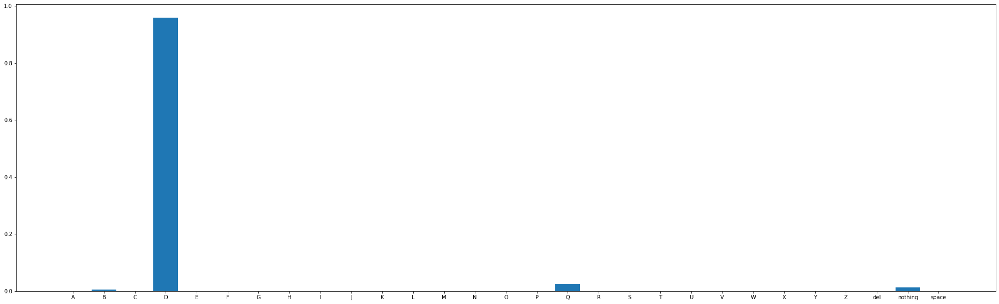

In [152]:

chart_predictions(labels = label_map, predictions = probs)


### K

In [155]:
%%time
probs = load_and_predict_photo(model_2, 'data/self_photos/k_crop.jpg')


index = probs.argmax()
label_map[index]

Wall time: 78.2 ms


'D'

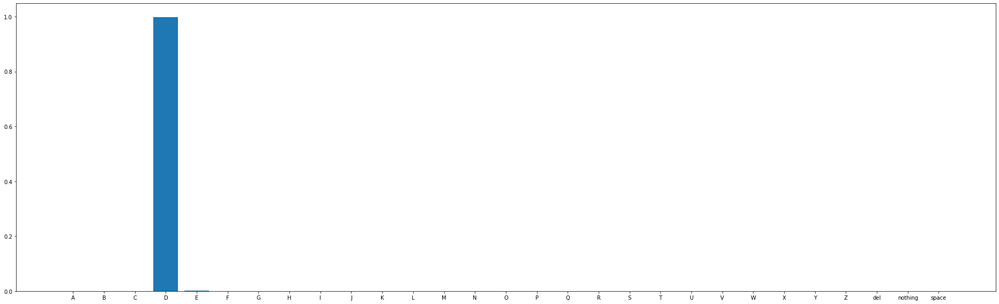

In [156]:

chart_predictions(labels = label_map, predictions = probs)


### C webcam test

In [163]:
%%time
probs = load_and_predict_photo(model_2, 'data/self_photos/capture.png')

index = probs.argmax()
label_map[index]

Wall time: 66 ms


'del'

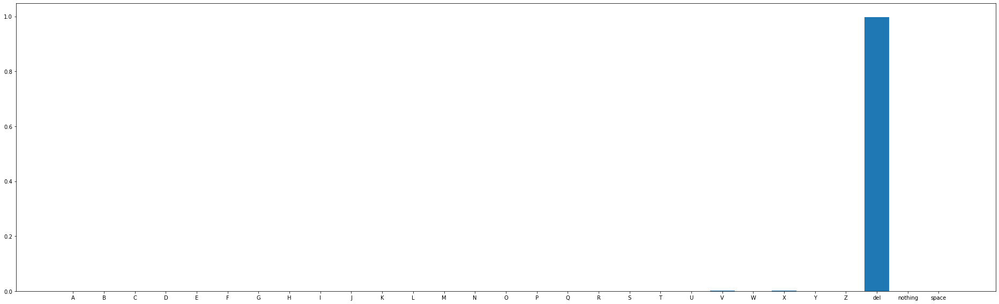

In [164]:
chart_predictions(labels = label_map, predictions = probs)

architecture

In [254]:
for i, layer in enumerate(model_2.layers):
    print(i, layer.name)

0 input_5
1 Conv1
2 bn_Conv1
3 Conv1_relu
4 expanded_conv_depthwise
5 expanded_conv_depthwise_BN
6 expanded_conv_depthwise_relu
7 expanded_conv_project
8 expanded_conv_project_BN
9 block_1_expand
10 block_1_expand_BN
11 block_1_expand_relu
12 block_1_pad
13 block_1_depthwise
14 block_1_depthwise_BN
15 block_1_depthwise_relu
16 block_1_project
17 block_1_project_BN
18 block_2_expand
19 block_2_expand_BN
20 block_2_expand_relu
21 block_2_depthwise
22 block_2_depthwise_BN
23 block_2_depthwise_relu
24 block_2_project
25 block_2_project_BN
26 block_2_add
27 block_3_expand
28 block_3_expand_BN
29 block_3_expand_relu
30 block_3_pad
31 block_3_depthwise
32 block_3_depthwise_BN
33 block_3_depthwise_relu
34 block_3_project
35 block_3_project_BN
36 block_4_expand
37 block_4_expand_BN
38 block_4_expand_relu
39 block_4_depthwise
40 block_4_depthwise_BN
41 block_4_depthwise_relu
42 block_4_project
43 block_4_project_BN
44 block_4_add
45 block_5_expand
46 block_5_expand_BN
47 block_5_expand_relu
48 b

## Heatmap of test data

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix

In [261]:
def heatmap_generator(model, directory, label_map):
    test_datagen = ImageDataGenerator(preprocessing_function=None)
    
    test_generator = test_datagen.flow_from_directory(directory,
                                                 target_size=model.input_shape[1:3],
                                                 color_mode='rgb',
                                                 batch_size=32,
                                                 class_mode='categorical',
                                                 shuffle=True)
    prediction = model.predict(test_generator, steps = 1, verbose=1)
    test_true = test_generator.classes
    test_pred = prediction.argmax(axis=1)
    #add label map automation if able later
    # Instantiating the encoder:
    my_encoder = LabelEncoder()

    # Fitting the encoder with the labels from 'label_map':
    my_encoder.fit(list(label_map))

    my_encoder.inverse_transform(test_pred)
    
    print(confusion_matrix(test_true, test_pred).shape)  
    
    nums = pd.DataFrame(confusion_matrix(test_true,test_pred),
                index = ['True:  A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','del','nothing','space'],
                columns =  ['predicted: A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','del','nothing','space'])
    return nums

In [285]:
label_map = grassnoted_train_ds.class_names
#going from (29,1) to (29)
label_map = np.reshape(label_map, [29])

In [286]:
heatmap_generator(model_2, 'data/grassnoted/asl_alphabet_test_folders/', label_map)

Found 29 images belonging to 29 classes.
1/1 [==============================] - 0s 138ms/step
(29, 29)


,predicted: A,B,C,D,E,F,G,H,I,J,...,T,U,V,W,X,Y,Z,del,nothing,space
True: A,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
C,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
D,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
E,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
F,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
G,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
H,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
I,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
J,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [287]:
heatmap_generator(model_2, 'data/grassnoted/asl_alphabet_train/', label_map)

Found 87000 images belonging to 29 classes.
1/1 [==============================] - 0s 154ms/step


ValueError: Found input variables with inconsistent numbers of samples: [87000, 32]

In [257]:
test_datagen = ImageDataGenerator(preprocessing_function=None)

In [258]:
test_generator = test_datagen.flow_from_directory('data/grassnoted/asl_alphabet_test_folders/', 
                                                 target_size=model_2.input_shape[1:3],
                                                 color_mode='rgb',
                                                 batch_size=32,
                                                 class_mode='categorical',
                                                 shuffle=True)

Found 29 images belonging to 29 classes.


In [10]:
#import data from local directory
#split into training and validation
grassnoted_train_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,#
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #
                                          validation_split=.3, #
                                          subset="training", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds = image_dataset_from_directory(
                                          'data/grassnoted/asl_alphabet_train',#
                                          labels="inferred", #
                                          label_mode="int",
                                          class_names=None,
                                          color_mode="rgb", #
                                          batch_size=100,
                                          image_size=(80, 80), # default 256,256
                                          shuffle=True,
                                          seed=1, #seeds must match to prevent overlap
                                          validation_split=.3, #
                                          subset="validation", #
                                          interpolation="bilinear",
                                          follow_links=False
                                          )
grassnoted_vali_ds

Found 87000 files belonging to 29 classes.
Using 60900 files for training.
Found 87000 files belonging to 29 classes.
Using 26100 files for validation.


<BatchDataset shapes: ((None, 80, 80, 3), (None,)), types: (tf.float32, tf.int32)>

In [265]:
dir(grassnoted_train_ds)

['_GeneratorState',
 '__abstractmethods__',
 '__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_add_variable_with_custom_getter',
 '_apply_options',
 '_as_serialized_graph',
 '_batch_size',
 '_checkpoint_dependencies',
 '_consumers',
 '_deferred_dependencies',
 '_drop_remainder',
 '_flat_shapes',
 '_flat_structure',
 '_flat_types',
 '_functions',
 '_gather_saveables_for_checkpoint',
 '_graph',
 '_graph_attr',
 '_handle_deferred_dependencies',
 '_has_captured_ref',
 '_input_dataset',
 '_inputs',
 '_list_extra_dependencies_for_serialization',
 '_list_functions_for_serialization',
 '_lookup_de

In [269]:
for i in grassnoted_train_ds.enumerate():
    print(i)

(<tf.Tensor: shape=(), dtype=int64, numpy=0>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.331250e+02],
         [4.687500e+00, 3.187500e+00, 1.904375e+02],
         [5.250000e+00, 9.062500e+00, 1.941250e+02],
         ...,
         [4.125000e+00, 4.937500e+00, 1.975000e+02],
         [9.000000e+00, 1.687500e+00, 2.029375e+02],
         [2.250000e+00, 4.125000e+00, 2.196875e+02]],

        [[6.937500e+00, 1.312500e+00, 1.937500e+02],
         [1.442500e+02, 1.344375e+02, 1.223750e+02],
         [1.526875e+02, 1.365625e+02, 1.268125e+02],
         ...,
         [1.318750e+02, 1.188125e+02, 1.176250e+02],
         [1.459375e+02, 1.318750e+02, 1.148750e+02],
         [1.086250e+02, 1.025625e+02, 1.946875e+02]],

        [[2.812500e+00, 7.562500e+00, 1.965625e+02],
         [1.920000e+02, 1.828750e+02, 1.596250e+02],
         [1.981250e+02, 1.818125e+02, 1.578125e+02],
         ...,
         [1.654375e+02, 1.483125e+02, 1.256875e+02],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=1>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 6.250000e-02, 2.380625e+02],
         [6.187500e+00, 5.750000e+00, 1.967500e+02],
         [5.625000e+00, 7.250000e+00, 1.966250e+02],
         ...,
         [5.812500e+00, 5.437500e+00, 1.986875e+02],
         [7.687500e+00, 3.000000e+00, 1.940000e+02],
         [3.562500e+00, 1.687500e+00, 2.176875e+02]],

        [[9.750000e+00, 3.312500e+00, 1.983750e+02],
         [6.287500e+01, 5.281250e+01, 4.750000e+01],
         [7.068750e+01, 5.431250e+01, 4.393750e+01],
         ...,
         [2.073125e+02, 1.921875e+02, 1.795000e+02],
         [1.941875e+02, 1.776875e+02, 1.530625e+02],
         [1.426875e+02, 1.305000e+02, 2.164375e+02]],

        [[6.000000e+00, 6.562500e+00, 1.987500e+02],
         [7.137500e+01, 5.406250e+01, 4.956250e+01],
         [7.412500e+01, 5.475000e+01, 3.925000e+01],
         ...,
         [2.119375e+02, 1.951875e+02, 1.764375e+02],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=2>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.375 , 227.    ],
         [  3.75  ,   1.3125, 195.4375],
         [  5.625 ,   5.4375, 199.4375],
         ...,
         [  2.4375,   2.0625, 196.125 ],
         [  6.75  ,   4.125 , 198.3125],
         [  2.8125,   2.625 , 214.625 ]],

        [[  8.0625,   1.125 , 195.75  ],
         [134.875 , 124.8125, 115.875 ],
         [145.3125, 130.5   , 118.125 ],
         ...,
         [124.5   , 109.375 , 106.875 ],
         [137.4375, 122.    , 107.0625],
         [107.25  ,  98.8125, 191.875 ]],

        [[  1.125 ,   6.    , 196.8125],
         [188.5   , 179.4375, 155.4375],
         [197.9375, 180.25  , 152.9375],
         ...,
         [161.0625, 138.8125, 116.5625],
         [156.6875, 127.875 ,  96.0625],
         [101.625 ,  91.375 , 170.375 ]],

        ...,

        [[  2.8125,   4.6875, 202.6875],
         [ 88.875 ,  90.5625,  91.8125],
         [ 93

(<tf.Tensor: shape=(), dtype=int64, numpy=3>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 4.687500e+00, 2.398125e+02],
         [6.750000e+00, 5.812500e+00, 2.060000e+02],
         [5.250000e+00, 6.437500e+00, 2.023750e+02],
         ...,
         [4.500000e+00, 6.187500e+00, 2.006875e+02],
         [7.125000e+00, 5.375000e+00, 1.993750e+02],
         [4.500000e+00, 5.500000e+00, 2.223125e+02]],

        [[1.256250e+01, 6.187500e+00, 1.987500e+02],
         [1.393750e+01, 9.687500e+00, 5.437500e+00],
         [1.193750e+01, 1.050000e+01, 3.375000e+00],
         ...,
         [6.550000e+01, 4.868750e+01, 4.512500e+01],
         [6.525000e+01, 5.512500e+01, 3.831250e+01],
         [4.112500e+01, 3.375000e+01, 1.303125e+02]],

        [[6.000000e+00, 5.125000e+00, 2.011250e+02],
         [2.368750e+01, 7.062500e+00, 4.125000e+00],
         [2.043750e+01, 9.812500e+00, 2.812500e+00],
         ...,
         [6.493750e+01, 5.737500e+01, 4.806250e+01],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=4>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.353750e+02],
         [7.687500e+00, 3.187500e+00, 1.999375e+02],
         [7.125000e+00, 7.125000e+00, 2.000625e+02],
         ...,
         [6.000000e+00, 5.125000e+00, 1.953125e+02],
         [1.068750e+01, 5.312500e+00, 1.948125e+02],
         [6.187500e+00, 4.812500e+00, 2.185625e+02]],

        [[3.250000e+00, 4.562500e+00, 1.937500e+02],
         [9.275000e+01, 9.775000e+01, 8.718750e+01],
         [1.012500e+02, 9.793750e+01, 8.643750e+01],
         ...,
         [5.000000e+01, 2.437500e+01, 2.368750e+01],
         [6.018750e+01, 3.818750e+01, 2.212500e+01],
         [4.781250e+01, 3.356250e+01, 1.253125e+02]],

        [[4.687500e+00, 7.875000e+00, 1.988125e+02],
         [1.102500e+02, 1.170000e+02, 1.185000e+02],
         [1.166250e+02, 1.184375e+02, 1.132500e+02],
         ...,
         [6.400000e+01, 3.293750e+01, 2.050000e+01],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=5>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.336875e+02],
         [3.562500e+00, 2.437500e+00, 2.010000e+02],
         [6.375000e+00, 7.062500e+00, 2.036875e+02],
         ...,
         [4.687500e+00, 4.687500e+00, 2.023750e+02],
         [8.062500e+00, 2.062500e+00, 1.988750e+02],
         [3.000000e+00, 4.750000e+00, 2.173125e+02]],

        [[5.500000e+00, 3.062500e+00, 1.960000e+02],
         [1.051250e+02, 1.027500e+02, 1.032500e+02],
         [1.069375e+02, 1.023750e+02, 9.993750e+01],
         ...,
         [1.275625e+02, 1.140000e+02, 1.168750e+02],
         [1.385000e+02, 1.247500e+02, 1.068750e+02],
         [1.094375e+02, 1.039375e+02, 1.955625e+02]],

        [[3.937500e+00, 6.812500e+00, 2.018750e+02],
         [1.210625e+02, 1.150000e+02, 1.150000e+02],
         [1.261250e+02, 1.180625e+02, 1.140625e+02],
         ...,
         [1.396875e+02, 1.213125e+02, 1.078125e+02],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=6>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.295000e+02],
         [4.062500e+00, 3.750000e-01, 1.966250e+02],
         [8.312500e+00, 4.500000e+00, 2.004375e+02],
         ...,
         [7.125000e+00, 4.500000e+00, 2.006875e+02],
         [8.375000e+00, 6.250000e-01, 1.971875e+02],
         [2.437500e+00, 2.437500e+00, 2.172500e+02]],

        [[3.000000e+00, 1.187500e+00, 1.901875e+02],
         [1.205000e+02, 1.109375e+02, 9.831250e+01],
         [1.173125e+02, 1.083125e+02, 9.137500e+01],
         ...,
         [1.278750e+02, 1.120000e+02, 1.073125e+02],
         [1.271875e+02, 1.106250e+02, 8.931250e+01],
         [9.793750e+01, 9.068750e+01, 1.781250e+02]],

        [[8.250000e+00, 9.562500e+00, 2.033750e+02],
         [1.791250e+02, 1.689375e+02, 1.460625e+02],
         [1.994375e+02, 1.849375e+02, 1.558750e+02],
         ...,
         [1.563125e+02, 1.334375e+02, 1.205000e+02],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=7>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 5.625000e-01, 2.338750e+02],
         [8.812500e+00, 2.062500e+00, 1.960625e+02],
         [9.562500e+00, 8.250000e+00, 2.024375e+02],
         ...,
         [6.187500e+00, 5.437500e+00, 2.018750e+02],
         [8.437500e+00, 5.812500e+00, 1.940625e+02],
         [5.625000e-01, 4.125000e+00, 2.196250e+02]],

        [[7.937500e+00, 5.062500e+00, 1.937500e+02],
         [1.204375e+02, 1.080625e+02, 8.481250e+01],
         [1.345625e+02, 1.136875e+02, 9.250000e+01],
         ...,
         [7.875000e+01, 6.281250e+01, 5.462500e+01],
         [1.095000e+02, 9.306250e+01, 7.031250e+01],
         [8.218750e+01, 7.137500e+01, 1.654375e+02]],

        [[7.687500e+00, 3.062500e+00, 1.930000e+02],
         [9.825000e+01, 7.925000e+01, 5.275000e+01],
         [1.024375e+02, 8.587500e+01, 5.268750e+01],
         ...,
         [1.101875e+02, 1.058125e+02, 9.156250e+01],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=8>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.325625e+02],
         [3.750000e+00, 2.062500e+00, 1.910625e+02],
         [5.625000e+00, 7.125000e+00, 1.965000e+02],
         ...,
         [3.937500e+00, 4.500000e+00, 2.002500e+02],
         [8.812500e+00, 2.687500e+00, 2.005625e+02],
         [1.125000e+00, 3.000000e+00, 2.165000e+02]],

        [[7.875000e+00, 1.125000e+00, 1.982500e+02],
         [1.242500e+02, 1.161875e+02, 1.066250e+02],
         [1.321875e+02, 1.174375e+02, 1.116875e+02],
         ...,
         [1.058125e+02, 9.331250e+01, 8.943750e+01],
         [1.176250e+02, 1.028125e+02, 9.025000e+01],
         [8.518750e+01, 7.887500e+01, 1.736875e+02]],

        [[2.625000e+00, 4.687500e+00, 1.993125e+02],
         [1.632500e+02, 1.534375e+02, 1.366875e+02],
         [1.788750e+02, 1.596250e+02, 1.406875e+02],
         ...,
         [1.335000e+02, 1.163750e+02, 9.481250e+01],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=9>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.368750e+02],
         [1.118750e+01, 2.562500e+00, 1.981875e+02],
         [8.437500e+00, 7.125000e+00, 1.948750e+02],
         ...,
         [6.187500e+00, 2.875000e+00, 1.986250e+02],
         [8.625000e+00, 3.750000e-01, 1.926250e+02],
         [0.000000e+00, 0.000000e+00, 2.140000e+02]],

        [[9.062500e+00, 3.937500e+00, 1.960000e+02],
         [8.125000e+01, 6.006250e+01, 5.787500e+01],
         [8.581250e+01, 6.600000e+01, 5.487500e+01],
         ...,
         [2.236875e+02, 2.075625e+02, 1.947500e+02],
         [2.200000e+02, 1.947500e+02, 1.712500e+02],
         [1.544375e+02, 1.388750e+02, 2.221250e+02]],

        [[5.250000e+00, 7.375000e+00, 1.952500e+02],
         [8.687500e+01, 6.450000e+01, 5.756250e+01],
         [9.043750e+01, 6.862500e+01, 5.631250e+01],
         ...,
         [2.316250e+02, 2.116250e+02, 1.959375e+02],
 

(<tf.Tensor: shape=(), dtype=int64, numpy=10>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.062500e+00, 2.309375e+02],
         [4.875000e+00, 1.875000e+00, 1.983750e+02],
         [8.500000e+00, 7.187500e+00, 2.045000e+02],
         ...,
         [3.187500e+00, 5.625000e+00, 1.991875e+02],
         [7.125000e+00, 4.750000e+00, 1.990000e+02],
         [1.125000e+00, 2.687500e+00, 2.148750e+02]],

        [[5.187500e+00, 8.125000e-01, 1.944375e+02],
         [1.234375e+02, 1.161250e+02, 1.191250e+02],
         [1.236875e+02, 1.156875e+02, 1.110625e+02],
         ...,
         [1.213750e+02, 1.146250e+02, 1.121875e+02],
         [1.395000e+02, 1.259375e+02, 1.118750e+02],
         [1.043125e+02, 9.718750e+01, 1.925625e+02]],

        [[6.375000e+00, 7.000000e+00, 2.009375e+02],
         [1.408750e+02, 1.393750e+02, 1.283750e+02],
         [1.479375e+02, 1.448750e+02, 1.253125e+02],
         ...,
         [1.493125e+02, 1.304375e+02, 1.140625e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=11>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 232.4375],
         [  1.5625,   1.875 , 193.625 ],
         [  6.    ,   6.9375, 200.9375],
         ...,
         [  4.125 ,   6.25  , 202.5   ],
         [  9.    ,   2.625 , 199.4375],
         [  5.0625,   6.3125, 221.3125]],

        [[  6.125 ,   1.875 , 201.1875],
         [ 96.875 , 108.1875, 111.125 ],
         [101.125 , 109.625 , 112.5625],
         ...,
         [ 77.375 ,  68.875 ,  78.125 ],
         [ 76.1875,  66.9375,  59.5625],
         [ 55.5625,  52.4375, 146.5   ]],

        [[  3.9375,  10.5   , 202.4375],
         [118.4375, 140.875 , 137.625 ],
         [116.6875, 139.5   , 131.9375],
         ...,
         [ 69.375 ,  63.1875,  65.8125],
         [ 67.375 ,  57.9375,  49.    ],
         [ 42.8125,  39.9375, 131.375 ]],

        ...,

        [[  3.375 ,   8.25  , 212.625 ],
         [ 33.375 ,  35.375 ,  58.125 ],
         [ 3

(<tf.Tensor: shape=(), dtype=int64, numpy=12>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 3.437500e+00, 2.393125e+02],
         [8.062500e+00, 7.187500e+00, 2.031250e+02],
         [1.875000e+00, 9.250000e+00, 2.021250e+02],
         ...,
         [6.250000e+00, 5.250000e+00, 2.042500e+02],
         [6.562500e+00, 4.625000e+00, 1.962500e+02],
         [4.500000e+00, 5.937500e+00, 2.238750e+02]],

        [[9.750000e+00, 5.062500e+00, 2.036875e+02],
         [1.718750e+01, 5.187500e+00, 9.687500e+00],
         [1.556250e+01, 6.750000e+00, 5.250000e+00],
         ...,
         [5.981250e+01, 5.431250e+01, 5.350000e+01],
         [6.718750e+01, 6.156250e+01, 4.731250e+01],
         [3.912500e+01, 3.300000e+01, 1.295625e+02]],

        [[6.562500e+00, 8.437500e+00, 1.965625e+02],
         [2.231250e+01, 8.562500e+00, 2.625000e+00],
         [1.881250e+01, 1.175000e+01, 0.000000e+00],
         ...,
         [5.950000e+01, 5.806250e+01, 5.525000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=13>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.349375e+02],
         [4.125000e+00, 1.687500e+00, 1.946875e+02],
         [5.812500e+00, 5.937500e+00, 1.976875e+02],
         ...,
         [6.000000e+00, 5.812500e+00, 1.995000e+02],
         [7.125000e+00, 1.875000e+00, 1.988750e+02],
         [0.000000e+00, 1.312500e+00, 2.165000e+02]],

        [[4.312500e+00, 1.312500e+00, 1.938125e+02],
         [1.573125e+02, 1.602500e+02, 1.526250e+02],
         [1.626875e+02, 1.611250e+02, 1.483750e+02],
         ...,
         [1.223125e+02, 1.091875e+02, 1.091250e+02],
         [1.248750e+02, 1.130000e+02, 9.587500e+01],
         [9.137500e+01, 8.700000e+01, 1.790000e+02]],

        [[5.375000e+00, 7.187500e+00, 1.955000e+02],
         [1.730625e+02, 1.775625e+02, 1.683125e+02],
         [1.952500e+02, 1.929375e+02, 1.826250e+02],
         ...,
         [1.525625e+02, 1.371875e+02, 1.190000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=14>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.375000e-01, 2.361875e+02],
         [1.500000e+00, 1.312500e+00, 1.974375e+02],
         [6.750000e+00, 7.125000e+00, 2.000625e+02],
         ...,
         [1.068750e+01, 6.562500e+00, 2.045000e+02],
         [1.206250e+01, 2.500000e+00, 1.985000e+02],
         [6.750000e+00, 5.750000e+00, 2.220000e+02]],

        [[7.875000e+00, 1.312500e+00, 1.964375e+02],
         [1.172500e+02, 1.220000e+02, 1.243125e+02],
         [1.229375e+02, 1.236250e+02, 1.211875e+02],
         ...,
         [7.200000e+01, 5.337500e+01, 4.693750e+01],
         [8.256250e+01, 5.906250e+01, 3.831250e+01],
         [5.681250e+01, 4.418750e+01, 1.321875e+02]],

        [[2.375000e+00, 7.125000e+00, 2.010625e+02],
         [1.462500e+02, 1.632500e+02, 1.645000e+02],
         [1.504375e+02, 1.656250e+02, 1.561250e+02],
         ...,
         [7.650000e+01, 5.318750e+01, 4.068750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=15>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.346875e+02],
         [5.812500e+00, 1.687500e+00, 1.941875e+02],
         [1.000000e+01, 7.312500e+00, 1.998125e+02],
         ...,
         [7.375000e+00, 4.375000e+00, 2.004375e+02],
         [1.350000e+01, 3.750000e+00, 1.994375e+02],
         [8.687500e+00, 3.625000e+00, 2.211250e+02]],

        [[3.375000e+00, 3.812500e+00, 1.941875e+02],
         [1.155000e+02, 1.208750e+02, 1.164375e+02],
         [1.258125e+02, 1.230000e+02, 1.158750e+02],
         ...,
         [6.806250e+01, 4.981250e+01, 3.925000e+01],
         [8.068750e+01, 5.981250e+01, 3.493750e+01],
         [5.625000e+01, 4.243750e+01, 1.281250e+02]],

        [[3.812500e+00, 8.312500e+00, 2.007500e+02],
         [1.470000e+02, 1.581250e+02, 1.572500e+02],
         [1.516250e+02, 1.573125e+02, 1.538125e+02],
         ...,
         [7.087500e+01, 4.493750e+01, 2.962500e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=16>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.355625e+02],
         [4.937500e+00, 4.125000e+00, 1.978750e+02],
         [6.562500e+00, 7.500000e+00, 2.031250e+02],
         ...,
         [4.875000e+00, 5.875000e+00, 2.039375e+02],
         [1.068750e+01, 4.125000e+00, 1.970625e+02],
         [5.625000e+00, 5.437500e+00, 2.204375e+02]],

        [[3.625000e+00, 5.312500e+00, 2.052500e+02],
         [9.062500e+01, 1.051875e+02, 1.087500e+02],
         [9.843750e+01, 1.074375e+02, 1.093750e+02],
         ...,
         [5.531250e+01, 4.312500e+01, 4.918750e+01],
         [6.125000e+01, 4.712500e+01, 3.931250e+01],
         [4.131250e+01, 3.525000e+01, 1.335000e+02]],

        [[7.687500e+00, 1.031250e+01, 2.022500e+02],
         [1.290000e+02, 1.474375e+02, 1.470625e+02],
         [1.283750e+02, 1.472500e+02, 1.444375e+02],
         ...,
         [5.118750e+01, 3.762500e+01, 3.618750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=17>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.937500e+00, 2.373750e+02],
         [9.812500e+00, 4.625000e+00, 1.981875e+02],
         [9.187500e+00, 7.312500e+00, 1.966250e+02],
         ...,
         [5.625000e+00, 4.937500e+00, 1.988750e+02],
         [8.250000e+00, 3.562500e+00, 1.934375e+02],
         [6.000000e+00, 3.562500e+00, 2.218125e+02]],

        [[8.250000e+00, 3.375000e+00, 1.950000e+02],
         [1.188750e+02, 1.063750e+02, 9.943750e+01],
         [1.298750e+02, 1.150000e+02, 9.543750e+01],
         ...,
         [9.718750e+01, 8.375000e+01, 7.412500e+01],
         [1.295625e+02, 1.211875e+02, 9.525000e+01],
         [9.518750e+01, 8.781250e+01, 1.783125e+02]],

        [[7.187500e+00, 5.312500e+00, 1.960000e+02],
         [8.493750e+01, 7.412500e+01, 6.368750e+01],
         [1.030000e+02, 8.756250e+01, 7.025000e+01],
         ...,
         [1.346250e+02, 1.263750e+02, 1.151875e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=18>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.352500e+02],
         [8.125000e-01, 3.750000e-01, 1.998125e+02],
         [6.000000e+00, 7.125000e+00, 2.009375e+02],
         ...,
         [5.625000e+00, 6.812500e+00, 2.063125e+02],
         [1.050000e+01, 2.625000e+00, 1.981875e+02],
         [6.937500e+00, 6.875000e+00, 2.251250e+02]],

        [[2.875000e+00, 2.812500e+00, 1.974375e+02],
         [9.668750e+01, 1.056875e+02, 1.063750e+02],
         [1.005000e+02, 1.076875e+02, 1.104375e+02],
         ...,
         [7.587500e+01, 6.618750e+01, 8.156250e+01],
         [8.118750e+01, 7.150000e+01, 6.431250e+01],
         [5.618750e+01, 5.206250e+01, 1.504375e+02]],

        [[2.750000e+00, 7.562500e+00, 2.026875e+02],
         [1.173125e+02, 1.372500e+02, 1.351875e+02],
         [1.166875e+02, 1.386875e+02, 1.336250e+02],
         ...,
         [6.568750e+01, 5.868750e+01, 6.806250e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=19>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 1.500000e+00, 2.382500e+02],
         [9.687500e+00, 3.812500e+00, 2.011875e+02],
         [7.687500e+00, 8.375000e+00, 1.966250e+02],
         ...,
         [4.500000e+00, 2.250000e+00, 2.006875e+02],
         [2.625000e+00, 2.437500e+00, 1.968750e+02],
         [3.750000e+00, 5.812500e+00, 2.226250e+02]],

        [[6.750000e+00, 7.500000e+00, 1.937500e+02],
         [8.043750e+01, 7.875000e+01, 7.312500e+01],
         [8.762500e+01, 8.075000e+01, 6.587500e+01],
         ...,
         [8.931250e+01, 8.762500e+01, 8.193750e+01],
         [1.295625e+02, 1.360000e+02, 1.155625e+02],
         [9.331250e+01, 9.912500e+01, 1.916875e+02]],

        [[7.687500e+00, 4.687500e+00, 2.008125e+02],
         [5.800000e+01, 5.537500e+01, 4.381250e+01],
         [5.987500e+01, 5.318750e+01, 3.825000e+01],
         ...,
         [1.430000e+02, 1.532500e+02, 1.446250e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=20>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 6.437500e+00, 2.433750e+02],
         [1.043750e+01, 4.375000e+00, 2.025000e+02],
         [5.437500e+00, 5.687500e+00, 2.024375e+02],
         ...,
         [4.687500e+00, 3.750000e+00, 2.039375e+02],
         [4.875000e+00, 5.250000e+00, 1.986250e+02],
         [4.500000e+00, 6.875000e+00, 2.216875e+02]],

        [[1.187500e+01, 6.000000e+00, 2.067500e+02],
         [2.206250e+01, 1.068750e+01, 1.331250e+01],
         [1.231250e+01, 6.812500e+00, 3.750000e-01],
         ...,
         [7.043750e+01, 6.212500e+01, 6.225000e+01],
         [6.568750e+01, 6.662500e+01, 5.050000e+01],
         [4.181250e+01, 4.593750e+01, 1.380000e+02]],

        [[9.562500e+00, 4.562500e+00, 1.996875e+02],
         [2.768750e+01, 1.243750e+01, 3.750000e+00],
         [2.400000e+01, 1.450000e+01, 5.625000e-01],
         ...,
         [7.006250e+01, 6.650000e+01, 5.587500e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=21>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.437500e+00, 2.348125e+02],
         [8.062500e+00, 3.750000e+00, 1.953750e+02],
         [9.562500e+00, 1.031250e+01, 1.984375e+02],
         ...,
         [4.687500e+00, 2.437500e+00, 1.980000e+02],
         [4.312500e+00, 2.812500e+00, 1.940000e+02],
         [2.812500e+00, 3.000000e+00, 2.227500e+02]],

        [[7.125000e+00, 3.812500e+00, 1.980625e+02],
         [1.061250e+02, 8.800000e+01, 7.106250e+01],
         [1.075625e+02, 9.318750e+01, 7.331250e+01],
         ...,
         [1.011250e+02, 8.931250e+01, 8.831250e+01],
         [1.474375e+02, 1.451875e+02, 1.250000e+02],
         [1.068125e+02, 1.065000e+02, 1.955000e+02]],

        [[4.875000e+00, 6.125000e+00, 1.969375e+02],
         [7.050000e+01, 5.518750e+01, 4.243750e+01],
         [8.225000e+01, 6.856250e+01, 5.318750e+01],
         ...,
         [1.565625e+02, 1.497500e+02, 1.470000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=22>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.373125e+02],
         [8.062500e+00, 3.750000e+00, 1.945000e+02],
         [1.050000e+01, 1.012500e+01, 1.946875e+02],
         ...,
         [6.000000e+00, 4.687500e+00, 2.026875e+02],
         [1.000000e+01, 1.687500e+00, 1.958750e+02],
         [5.062500e+00, 4.500000e+00, 2.232500e+02]],

        [[9.187500e+00, 6.562500e+00, 1.942500e+02],
         [1.327500e+02, 1.099375e+02, 9.193750e+01],
         [1.413750e+02, 1.086250e+02, 8.800000e+01],
         ...,
         [7.781250e+01, 6.493750e+01, 4.943750e+01],
         [1.204375e+02, 1.085625e+02, 8.112500e+01],
         [8.556250e+01, 8.112500e+01, 1.674375e+02]],

        [[6.187500e+00, 5.500000e+00, 1.928125e+02],
         [9.875000e+01, 7.793750e+01, 6.231250e+01],
         [1.160000e+02, 9.025000e+01, 6.531250e+01],
         ...,
         [1.326875e+02, 1.153750e+02, 1.085625e+02],


       17,  7, 10, 21, 19,  7,  4, 15,  5, 19, 24,  7, 18, 14, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=24>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.350625e+02],
         [9.562500e+00, 3.562500e+00, 1.904375e+02],
         [1.025000e+01, 8.125000e+00, 1.998125e+02],
         ...,
         [5.062500e+00, 3.750000e+00, 2.010000e+02],
         [1.012500e+01, 2.625000e+00, 1.963750e+02],
         [4.125000e+00, 3.625000e+00, 2.222500e+02]],

        [[8.375000e+00, 3.562500e+00, 1.953750e+02],
         [1.293750e+02, 1.154375e+02, 9.143750e+01],
         [1.415000e+02, 1.205625e+02, 8.862500e+01],
         ...,
         [8.906250e+01, 6.868750e+01, 6.318750e+01],
         [1.197500e+02, 1.021875e+02, 8.125000e+01],
         [8.250000e+01, 7.243750e+01, 1.638750e+02]],

        [[8.625000e+00, 3.375000e+00, 1.920000e+02],
         [1.118125e+02, 8.337500e+01, 6.593750e+01],
         [1.201250e+02, 9.306250e+01, 6.400000e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=25>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.125000e+00, 2.375625e+02],
         [8.437500e+00, 5.625000e+00, 2.053125e+02],
         [2.625000e+00, 8.187500e+00, 2.014375e+02],
         ...,
         [6.750000e+00, 6.812500e+00, 2.021875e+02],
         [3.000000e+00, 4.500000e+00, 1.902500e+02],
         [4.500000e+00, 6.812500e+00, 2.215000e+02]],

        [[1.043750e+01, 6.937500e+00, 2.029375e+02],
         [1.250000e+01, 1.450000e+01, 9.937500e+00],
         [9.125000e+00, 1.212500e+01, 1.312500e+00],
         ...,
         [6.850000e+01, 6.537500e+01, 4.587500e+01],
         [7.700000e+01, 7.712500e+01, 4.237500e+01],
         [5.262500e+01, 4.962500e+01, 1.390000e+02]],

        [[6.187500e+00, 6.125000e+00, 1.983750e+02],
         [2.000000e+01, 1.706250e+01, 6.562500e+00],
         [1.900000e+01, 1.650000e+01, 1.125000e+00],
         ...,
         [7.993750e+01, 8.443750e+01, 6.443750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=26>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.000000e-01, 2.360000e+02],
         [5.062500e+00, 3.937500e+00, 1.973125e+02],
         [7.687500e+00, 8.625000e+00, 1.984375e+02],
         ...,
         [3.937500e+00, 3.937500e+00, 2.005625e+02],
         [7.687500e+00, 3.562500e+00, 1.951875e+02],
         [2.062500e+00, 1.125000e+00, 2.186250e+02]],

        [[9.812500e+00, 3.000000e+00, 1.976875e+02],
         [1.044375e+02, 9.362500e+01, 7.950000e+01],
         [1.031250e+02, 9.006250e+01, 6.800000e+01],
         ...,
         [8.856250e+01, 8.093750e+01, 7.112500e+01],
         [1.405625e+02, 1.354375e+02, 1.144375e+02],
         [1.073125e+02, 1.023750e+02, 1.985625e+02]],

        [[2.250000e+00, 7.562500e+00, 1.954375e+02],
         [6.806250e+01, 4.906250e+01, 4.200000e+01],
         [7.825000e+01, 5.987500e+01, 4.231250e+01],
         ...,
         [1.534375e+02, 1.494375e+02, 1.396875e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=27>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.375 , 227.875 ],
         [  4.6875,   2.0625, 201.25  ],
         [  7.125 ,   6.75  , 202.9375],
         ...,
         [  3.375 ,   3.375 , 200.8125],
         [  8.8125,   3.1875, 199.9375],
         [  1.125 ,   2.6875, 216.5625]],

        [[  7.    ,   1.3125, 198.5625],
         [113.5   , 109.    , 106.75  ],
         [118.625 , 111.3125, 104.875 ],
         ...,
         [123.5625, 109.75  , 109.6875],
         [145.    , 130.9375, 112.9375],
         [108.0625, 102.3125, 194.875 ]],

        [[  4.875 ,   6.    , 198.6875],
         [127.4375, 122.1875, 116.25  ],
         [132.125 , 129.    , 114.6875],
         ...,
         [147.25  , 126.25  , 116.5   ],
         [136.4375, 111.4375,  87.875 ],
         [ 90.8125,  79.    , 166.9375]],

        ...,

        [[  1.125 ,   6.625 , 204.625 ],
         [ 79.6875,  86.3125,  89.875 ],
         [ 8

(<tf.Tensor: shape=(), dtype=int64, numpy=28>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 6.312500e+00, 2.378750e+02],
         [1.000000e+01, 4.687500e+00, 2.029375e+02],
         [6.875000e+00, 5.562500e+00, 2.002500e+02],
         ...,
         [6.375000e+00, 6.875000e+00, 2.051250e+02],
         [6.000000e+00, 3.812500e+00, 1.957500e+02],
         [4.125000e+00, 5.375000e+00, 2.218750e+02]],

        [[1.081250e+01, 6.562500e+00, 2.058750e+02],
         [1.056250e+01, 9.312500e+00, 1.043750e+01],
         [1.343750e+01, 9.187500e+00, 4.500000e+00],
         ...,
         [7.356250e+01, 6.718750e+01, 6.693750e+01],
         [6.618750e+01, 6.581250e+01, 5.412500e+01],
         [4.256250e+01, 4.087500e+01, 1.428750e+02]],

        [[7.062500e+00, 5.875000e+00, 2.015625e+02],
         [1.937500e+01, 1.606250e+01, 4.500000e+00],
         [1.987500e+01, 1.793750e+01, 0.000000e+00],
         ...,
         [7.012500e+01, 6.656250e+01, 5.775000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=29>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.687500e+00, 2.370625e+02],
         [9.500000e+00, 3.500000e+00, 1.930000e+02],
         [9.750000e+00, 8.125000e+00, 1.988125e+02],
         ...,
         [6.562500e+00, 4.125000e+00, 2.029375e+02],
         [9.750000e+00, 4.750000e+00, 1.952500e+02],
         [3.937500e+00, 2.125000e+00, 2.168125e+02]],

        [[7.875000e+00, 4.875000e+00, 1.933125e+02],
         [1.080000e+02, 1.043125e+02, 8.537500e+01],
         [1.161250e+02, 1.031875e+02, 7.900000e+01],
         ...,
         [9.100000e+01, 7.906250e+01, 7.162500e+01],
         [1.326250e+02, 1.225625e+02, 1.008125e+02],
         [9.593750e+01, 8.687500e+01, 1.786875e+02]],

        [[4.562500e+00, 4.500000e+00, 1.981250e+02],
         [7.931250e+01, 7.706250e+01, 6.031250e+01],
         [9.650000e+01, 9.006250e+01, 6.468750e+01],
         ...,
         [1.359375e+02, 1.261250e+02, 1.170000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=30>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   6.    , 237.625 ],
         [  9.    ,   3.9375, 203.3125],
         [  6.75  ,   6.0625, 202.9375],
         ...,
         [  3.1875,   5.5625, 200.875 ],
         [  6.    ,   3.9375, 198.0625],
         [  3.375 ,   4.6875, 219.1875]],

        [[ 10.1875,   6.9375, 206.5   ],
         [ 11.9375,   8.5   ,  18.5   ],
         [ 12.375 ,   8.625 ,   8.75  ],
         ...,
         [ 68.25  ,  67.875 ,  58.75  ],
         [ 64.    ,  65.875 ,  51.3125],
         [ 42.375 ,  44.0625, 137.4375]],

        [[  7.875 ,   4.25  , 198.0625],
         [ 23.25  ,  10.625 ,   6.9375],
         [ 22.5625,  10.9375,   0.    ],
         ...,
         [ 71.5625,  73.8125,  58.6875],
         [ 61.    ,  64.75  ,  45.375 ],
         [ 42.4375,  44.9375, 134.8125]],

        ...,

        [[  3.375 ,   7.    , 203.0625],
         [150.75  , 150.8125, 147.0625],
         [15

(<tf.Tensor: shape=(), dtype=int64, numpy=31>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.344375e+02],
         [1.256250e+01, 1.125000e+00, 1.984375e+02],
         [6.000000e+00, 6.125000e+00, 2.033750e+02],
         ...,
         [4.500000e+00, 3.250000e+00, 1.968125e+02],
         [7.312500e+00, 2.250000e+00, 1.932500e+02],
         [1.687500e+00, 0.000000e+00, 2.136875e+02]],

        [[6.000000e+00, 3.750000e+00, 1.970000e+02],
         [7.275000e+01, 5.981250e+01, 5.056250e+01],
         [7.575000e+01, 6.193750e+01, 5.000000e+01],
         ...,
         [2.125625e+02, 1.951250e+02, 1.828750e+02],
         [2.091250e+02, 1.908125e+02, 1.630000e+02],
         [1.512500e+02, 1.374375e+02, 2.208750e+02]],

        [[5.625000e+00, 6.125000e+00, 1.994375e+02],
         [8.262500e+01, 6.462500e+01, 4.843750e+01],
         [8.656250e+01, 6.450000e+01, 4.293750e+01],
         ...,
         [2.210625e+02, 2.003125e+02, 1.840625e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=32>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.062500e+00, 2.308750e+02],
         [7.875000e+00, 1.875000e+00, 1.953125e+02],
         [6.500000e+00, 5.000000e+00, 2.010000e+02],
         ...,
         [5.250000e+00, 5.500000e+00, 2.000000e+02],
         [5.812500e+00, 3.375000e+00, 1.981250e+02],
         [1.687500e+00, 6.250000e-01, 2.175000e+02]],

        [[6.625000e+00, 1.312500e+00, 1.986250e+02],
         [1.496875e+02, 1.405625e+02, 1.337500e+02],
         [1.535000e+02, 1.411875e+02, 1.285000e+02],
         ...,
         [1.196250e+02, 1.056250e+02, 1.068750e+02],
         [1.261875e+02, 1.111875e+02, 9.856250e+01],
         [9.412500e+01, 8.731250e+01, 1.823125e+02]],

        [[4.937500e+00, 6.312500e+00, 1.959375e+02],
         [1.833750e+02, 1.855625e+02, 1.661875e+02],
         [2.026875e+02, 1.971250e+02, 1.758125e+02],
         ...,
         [1.549375e+02, 1.359375e+02, 1.206250e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=33>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.342500e+02],
         [2.000000e+00, 2.250000e+00, 1.955625e+02],
         [6.375000e+00, 7.687500e+00, 2.018750e+02],
         ...,
         [4.312500e+00, 6.375000e+00, 2.041250e+02],
         [1.031250e+01, 2.625000e+00, 1.998750e+02],
         [5.062500e+00, 4.437500e+00, 2.221875e+02]],

        [[4.312500e+00, 4.562500e+00, 2.009375e+02],
         [9.075000e+01, 1.020625e+02, 1.026875e+02],
         [9.981250e+01, 1.075625e+02, 1.078125e+02],
         ...,
         [7.512500e+01, 6.156250e+01, 7.506250e+01],
         [7.668750e+01, 6.262500e+01, 6.012500e+01],
         [5.518750e+01, 4.887500e+01, 1.528125e+02]],

        [[9.375000e-01, 8.500000e+00, 2.000000e+02],
         [1.182500e+02, 1.351250e+02, 1.335625e+02],
         [1.197500e+02, 1.327500e+02, 1.297500e+02],
         ...,
         [6.975000e+01, 5.562500e+01, 6.418750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=34>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 0.000000e+00, 2.339375e+02],
         [3.375000e+00, 3.812500e+00, 1.919375e+02],
         [7.687500e+00, 8.062500e+00, 1.969375e+02],
         ...,
         [5.625000e+00, 5.437500e+00, 1.990625e+02],
         [8.625000e+00, 2.125000e+00, 2.016875e+02],
         [3.750000e-01, 1.312500e+00, 2.175000e+02]],

        [[4.125000e+00, 9.375000e-01, 1.950625e+02],
         [1.502500e+02, 1.562500e+02, 1.392500e+02],
         [1.597500e+02, 1.570625e+02, 1.396250e+02],
         ...,
         [1.068125e+02, 9.212500e+01, 9.043750e+01],
         [1.150000e+02, 1.005000e+02, 8.312500e+01],
         [8.581250e+01, 7.975000e+01, 1.720000e+02]],

        [[1.812500e+00, 6.312500e+00, 1.938125e+02],
         [1.692500e+02, 1.745000e+02, 1.571250e+02],
         [1.860000e+02, 1.844375e+02, 1.638125e+02],
         ...,
         [1.378750e+02, 1.186875e+02, 9.718750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=35>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.308750e+02],
         [2.625000e+00, 2.062500e+00, 1.966250e+02],
         [7.250000e+00, 6.187500e+00, 2.068125e+02],
         ...,
         [6.187500e+00, 6.687500e+00, 2.061875e+02],
         [1.012500e+01, 2.250000e+00, 1.977500e+02],
         [5.625000e+00, 5.250000e+00, 2.216875e+02]],

        [[5.437500e+00, 1.437500e+00, 2.053125e+02],
         [9.525000e+01, 1.045625e+02, 1.096875e+02],
         [1.032500e+02, 1.115000e+02, 1.125625e+02],
         ...,
         [7.956250e+01, 6.993750e+01, 8.512500e+01],
         [7.981250e+01, 7.012500e+01, 6.293750e+01],
         [5.687500e+01, 5.275000e+01, 1.511250e+02]],

        [[3.750000e-01, 8.625000e+00, 2.040625e+02],
         [1.175625e+02, 1.421250e+02, 1.381875e+02],
         [1.162500e+02, 1.411875e+02, 1.320625e+02],
         ...,
         [6.681250e+01, 5.981250e+01, 6.918750e+01],


        8, 15, 24,  0, 18, 16, 19,  6, 12,  2,  1,  6,  8,  3,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=37>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.356875e+02],
         [6.750000e+00, 4.000000e+00, 1.948125e+02],
         [1.350000e+01, 9.687500e+00, 1.988750e+02],
         ...,
         [4.312500e+00, 3.562500e+00, 2.008125e+02],
         [9.125000e+00, 1.312500e+00, 1.918125e+02],
         [8.750000e+00, 4.687500e+00, 2.224375e+02]],

        [[6.750000e+00, 4.687500e+00, 1.983125e+02],
         [1.283750e+02, 1.073750e+02, 8.200000e+01],
         [1.472500e+02, 1.089375e+02, 8.575000e+01],
         ...,
         [8.012500e+01, 6.887500e+01, 5.937500e+01],
         [1.115625e+02, 1.070000e+02, 7.981250e+01],
         [7.700000e+01, 7.487500e+01, 1.663750e+02]],

        [[8.437500e+00, 7.250000e+00, 1.950000e+02],
         [1.070000e+02, 8.443750e+01, 6.168750e+01],
         [1.155000e+02, 9.037500e+01, 5.537500e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=38>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   5.1875, 241.4375],
         [  6.9375,   5.3125, 202.625 ],
         [  6.25  ,   6.1875, 198.0625],
         ...,
         [  5.3125,   4.9375, 200.75  ],
         [  9.    ,   3.9375, 193.6875],
         [  6.0625,   2.625 , 221.8125]],

        [[ 10.25  ,   5.8125, 201.9375],
         [  7.5   ,   8.4375,   6.75  ],
         [ 13.25  ,   8.125 ,   5.0625],
         ...,
         [ 62.5625,  57.375 ,  61.    ],
         [ 65.5   ,  65.    ,  52.625 ],
         [ 41.375 ,  38.125 , 135.6875]],

        [[  6.625 ,   7.5   , 201.3125],
         [ 16.875 ,  13.25  ,   5.    ],
         [ 20.9375,  11.9375,   0.    ],
         ...,
         [ 63.5   ,  58.5   ,  59.75  ],
         [ 57.0625,  57.5   ,  41.625 ],
         [ 37.9375,  39.9375, 129.75  ]],

        ...,

        [[  5.0625,   6.75  , 205.75  ],
         [144.8125, 146.375 , 137.1875],
         [15

(<tf.Tensor: shape=(), dtype=int64, numpy=39>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.875000e-01, 2.320000e+02],
         [6.500000e+00, 2.062500e+00, 2.012500e+02],
         [7.125000e+00, 5.625000e+00, 2.040625e+02],
         ...,
         [5.250000e+00, 6.000000e+00, 2.025000e+02],
         [6.937500e+00, 2.625000e+00, 1.963750e+02],
         [1.875000e-01, 3.562500e+00, 2.180625e+02]],

        [[5.875000e+00, 1.875000e+00, 2.005625e+02],
         [1.039375e+02, 1.008125e+02, 1.060000e+02],
         [1.073750e+02, 1.020625e+02, 1.030625e+02],
         ...,
         [1.293750e+02, 1.160000e+02, 1.178750e+02],
         [1.390000e+02, 1.255625e+02, 1.127500e+02],
         [1.063750e+02, 9.987500e+01, 1.950625e+02]],

        [[3.625000e+00, 7.000000e+00, 2.017500e+02],
         [1.199375e+02, 1.172500e+02, 1.183750e+02],
         [1.252500e+02, 1.208750e+02, 1.186875e+02],
         ...,
         [1.420625e+02, 1.231250e+02, 1.120000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=40>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.343125e+02],
         [1.312500e+00, 1.125000e+00, 1.925625e+02],
         [6.375000e+00, 7.875000e+00, 1.984375e+02],
         ...,
         [8.625000e+00, 4.312500e+00, 2.025000e+02],
         [1.056250e+01, 1.687500e+00, 1.958125e+02],
         [8.687500e+00, 5.312500e+00, 2.204375e+02]],

        [[4.875000e+00, 1.687500e+00, 2.008750e+02],
         [1.147500e+02, 1.196250e+02, 1.206875e+02],
         [1.222500e+02, 1.222500e+02, 1.173125e+02],
         ...,
         [6.662500e+01, 4.606250e+01, 3.675000e+01],
         [7.556250e+01, 5.487500e+01, 3.075000e+01],
         [6.018750e+01, 4.406250e+01, 1.314375e+02]],

        [[2.625000e+00, 8.062500e+00, 1.999375e+02],
         [1.511250e+02, 1.693750e+02, 1.683750e+02],
         [1.543125e+02, 1.667500e+02, 1.641875e+02],
         ...,
         [8.062500e+01, 5.118750e+01, 3.631250e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=41>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 6.500000e+00, 2.380625e+02],
         [5.437500e+00, 4.687500e+00, 2.035625e+02],
         [4.125000e+00, 4.875000e+00, 2.005625e+02],
         ...,
         [5.250000e+00, 5.562500e+00, 2.018125e+02],
         [7.937500e+00, 3.312500e+00, 1.950000e+02],
         [6.375000e+00, 3.750000e+00, 2.223750e+02]],

        [[1.268750e+01, 5.250000e+00, 2.032500e+02],
         [1.556250e+01, 1.056250e+01, 8.062500e+00],
         [1.625000e+01, 7.250000e+00, 2.250000e+00],
         ...,
         [6.262500e+01, 4.581250e+01, 5.575000e+01],
         [7.600000e+01, 6.837500e+01, 5.675000e+01],
         [4.293750e+01, 3.993750e+01, 1.368750e+02]],

        [[6.687500e+00, 5.187500e+00, 1.988125e+02],
         [1.975000e+01, 8.500000e+00, 2.625000e+00],
         [2.043750e+01, 9.750000e+00, 5.625000e-01],
         ...,
         [7.275000e+01, 5.650000e+01, 6.325000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=42>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.381875e+02],
         [4.937500e+00, 3.750000e+00, 1.973750e+02],
         [4.937500e+00, 5.062500e+00, 1.983750e+02],
         ...,
         [6.000000e+00, 6.000000e+00, 2.008750e+02],
         [1.087500e+01, 4.125000e+00, 1.988125e+02],
         [2.812500e+00, 4.750000e+00, 2.233125e+02]],

        [[7.937500e+00, 3.937500e+00, 2.003750e+02],
         [6.868750e+01, 7.937500e+01, 7.931250e+01],
         [7.387500e+01, 8.281250e+01, 8.037500e+01],
         ...,
         [3.275000e+01, 1.837500e+01, 2.387500e+01],
         [3.956250e+01, 2.362500e+01, 1.306250e+01],
         [2.581250e+01, 1.818750e+01, 1.160625e+02]],

        [[3.250000e+00, 6.000000e+00, 2.019375e+02],
         [8.912500e+01, 1.100625e+02, 1.068750e+02],
         [9.093750e+01, 1.102500e+02, 1.047500e+02],
         ...,
         [3.775000e+01, 2.531250e+01, 2.437500e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=43>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.875000e-01, 2.305000e+02],
         [6.937500e+00, 1.125000e+00, 1.920625e+02],
         [5.625000e+00, 6.250000e+00, 1.929375e+02],
         ...,
         [5.437500e+00, 4.500000e+00, 2.066250e+02],
         [6.000000e+00, 3.937500e+00, 2.078125e+02],
         [3.750000e-01, 3.812500e+00, 2.216250e+02]],

        [[6.187500e+00, 1.687500e+00, 1.938125e+02],
         [1.523750e+02, 1.426250e+02, 1.222500e+02],
         [1.611875e+02, 1.430625e+02, 1.180000e+02],
         ...,
         [1.151875e+02, 9.600000e+01, 1.089375e+02],
         [1.252500e+02, 1.101875e+02, 1.130000e+02],
         [1.043125e+02, 9.675000e+01, 2.024375e+02]],

        [[5.687500e+00, 5.937500e+00, 1.974375e+02],
         [1.748125e+02, 1.691875e+02, 1.543125e+02],
         [1.793750e+02, 1.667500e+02, 1.469375e+02],
         ...,
         [1.246875e+02, 9.756250e+01, 7.825000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=44>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 235.1875],
         [  4.125 ,   2.25  , 195.    ],
         [  8.125 ,   7.6875, 200.4375],
         ...,
         [  4.5   ,   5.5625, 205.    ],
         [ 11.4375,   6.    , 198.125 ],
         [  3.375 ,   5.125 , 221.    ]],

        [[  5.125 ,   2.8125, 205.25  ],
         [ 97.125 , 106.4375, 112.5625],
         [105.5625, 110.75  , 116.    ],
         ...,
         [ 71.9375,  67.    ,  77.3125],
         [ 79.0625,  73.4375,  66.5   ],
         [ 52.5   ,  50.75  , 148.4375]],

        [[  5.3125,   7.5   , 205.125 ],
         [115.625 , 136.1875, 137.375 ],
         [114.9375, 138.6875, 133.1875],
         ...,
         [ 60.5625,  58.75  ,  62.9375],
         [ 59.125 ,  54.0625,  43.0625],
         [ 36.1875,  37.25  , 128.5   ]],

        ...,

        [[  3.75  ,   7.    , 209.5625],
         [ 33.1875,  33.1875,  59.3125],
         [ 3

(<tf.Tensor: shape=(), dtype=int64, numpy=45>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.335000e+02],
         [5.625000e-01, 3.187500e+00, 1.992500e+02],
         [6.000000e+00, 7.500000e+00, 2.048125e+02],
         ...,
         [5.625000e+00, 9.062500e+00, 2.045625e+02],
         [1.031250e+01, 3.937500e+00, 1.954375e+02],
         [7.125000e+00, 5.375000e+00, 2.210000e+02]],

        [[3.375000e+00, 1.125000e+00, 1.996250e+02],
         [1.006875e+02, 1.153125e+02, 1.210625e+02],
         [1.105625e+02, 1.191250e+02, 1.193125e+02],
         ...,
         [6.662500e+01, 5.468750e+01, 6.281250e+01],
         [6.962500e+01, 5.631250e+01, 4.312500e+01],
         [5.131250e+01, 4.418750e+01, 1.375000e+02]],

        [[7.500000e-01, 8.812500e+00, 2.016875e+02],
         [1.310625e+02, 1.561250e+02, 1.551875e+02],
         [1.391250e+02, 1.571875e+02, 1.476250e+02],
         ...,
         [6.000000e+01, 4.625000e+01, 4.681250e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=46>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.375000e+00, 2.312500e+00, 2.400000e+02],
         [4.875000e+00, 7.687500e+00, 2.025625e+02],
         [5.062500e+00, 5.187500e+00, 2.028750e+02],
         ...,
         [6.437500e+00, 3.750000e+00, 2.030000e+02],
         [7.812500e+00, 2.875000e+00, 1.964375e+02],
         [5.750000e+00, 4.625000e+00, 2.226250e+02]],

        [[1.037500e+01, 5.437500e+00, 2.010625e+02],
         [1.112500e+01, 1.093750e+01, 9.812500e+00],
         [1.537500e+01, 7.562500e+00, 6.562500e+00],
         ...,
         [7.306250e+01, 6.143750e+01, 6.468750e+01],
         [8.056250e+01, 7.768750e+01, 6.393750e+01],
         [4.950000e+01, 4.975000e+01, 1.435625e+02]],

        [[6.437500e+00, 6.500000e+00, 1.996250e+02],
         [2.868750e+01, 1.087500e+01, 7.312500e+00],
         [2.675000e+01, 1.250000e+01, 0.000000e+00],
         ...,
         [7.512500e+01, 7.125000e+01, 7.168750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=47>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.358125e+02],
         [7.562500e+00, 2.062500e+00, 1.968125e+02],
         [5.625000e+00, 7.125000e+00, 1.969375e+02],
         ...,
         [4.687500e+00, 4.125000e+00, 1.983125e+02],
         [7.937500e+00, 1.125000e+00, 2.006875e+02],
         [0.000000e+00, 1.500000e+00, 2.185000e+02]],

        [[3.562500e+00, 2.062500e+00, 1.912500e+02],
         [1.495000e+02, 1.466875e+02, 1.273125e+02],
         [1.535625e+02, 1.465000e+02, 1.216250e+02],
         ...,
         [1.147500e+02, 1.006250e+02, 8.918750e+01],
         [1.203125e+02, 1.071875e+02, 8.075000e+01],
         [9.031250e+01, 8.487500e+01, 1.716250e+02]],

        [[3.250000e+00, 5.500000e+00, 1.937500e+02],
         [1.829375e+02, 1.777500e+02, 1.586250e+02],
         [2.043750e+02, 1.912500e+02, 1.635000e+02],
         ...,
         [1.490625e+02, 1.280000e+02, 1.047500e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=48>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.437500e+00, 2.400625e+02],
         [1.006250e+01, 4.937500e+00, 2.056250e+02],
         [6.312500e+00, 3.937500e+00, 2.006875e+02],
         ...,
         [5.062500e+00, 5.625000e+00, 1.978750e+02],
         [9.687500e+00, 3.562500e+00, 2.022500e+02],
         [4.687500e+00, 4.875000e+00, 2.246875e+02]],

        [[1.287500e+01, 5.437500e+00, 1.968125e+02],
         [1.743750e+01, 9.562500e+00, 1.012500e+01],
         [1.856250e+01, 5.312500e+00, 4.687500e+00],
         ...,
         [6.456250e+01, 5.837500e+01, 5.393750e+01],
         [6.487500e+01, 6.375000e+01, 4.825000e+01],
         [4.218750e+01, 4.137500e+01, 1.356875e+02]],

        [[6.062500e+00, 5.500000e+00, 2.003125e+02],
         [1.718750e+01, 1.212500e+01, 4.687500e+00],
         [2.193750e+01, 1.043750e+01, 0.000000e+00],
         ...,
         [8.062500e+01, 6.012500e+01, 6.387500e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=49>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.375 , 235.25  ],
         [  9.375 ,   4.875 , 197.6875],
         [  8.25  ,   6.5   , 202.75  ],
         ...,
         [  4.6875,   4.3125, 198.4375],
         [  6.    ,   3.5625, 192.9375],
         [  3.9375,   3.    , 220.25  ]],

        [[  9.375 ,   4.125 , 196.8125],
         [100.875 ,  87.125 ,  77.    ],
         [111.0625,  86.625 ,  77.6875],
         ...,
         [102.0625,  88.3125,  84.25  ],
         [150.3125, 147.9375, 128.9375],
         [109.625 , 110.875 , 205.0625]],

        [[  7.1875,   6.9375, 202.75  ],
         [ 64.4375,  59.875 ,  40.0625],
         [ 84.4375,  70.625 ,  52.4375],
         ...,
         [161.6875, 152.375 , 138.5   ],
         [148.6875, 149.625 , 129.6875],
         [107.6875, 115.0625, 204.8125]],

        ...,

        [[  2.4375,   5.625 , 204.3125],
         [175.5625, 188.9375, 192.5   ],
         [18

(<tf.Tensor: shape=(), dtype=int64, numpy=50>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.333750e+02],
         [9.375000e+00, 1.312500e+00, 1.940000e+02],
         [5.625000e+00, 9.437500e+00, 1.962500e+02],
         ...,
         [3.187500e+00, 2.062500e+00, 2.017500e+02],
         [6.000000e+00, 3.375000e+00, 1.954375e+02],
         [5.250000e+00, 4.375000e+00, 2.208750e+02]],

        [[5.062500e+00, 3.687500e+00, 1.967500e+02],
         [1.242500e+02, 1.109375e+02, 9.656250e+01],
         [1.356250e+02, 1.192500e+02, 9.450000e+01],
         ...,
         [7.762500e+01, 6.381250e+01, 5.662500e+01],
         [1.087500e+02, 1.032500e+02, 7.787500e+01],
         [7.168750e+01, 7.031250e+01, 1.581875e+02]],

        [[4.500000e+00, 3.500000e+00, 1.961250e+02],
         [1.077500e+02, 8.300000e+01, 5.993750e+01],
         [1.152500e+02, 9.037500e+01, 6.112500e+01],
         ...,
         [1.147500e+02, 1.073750e+02, 9.387500e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=51>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.303750e+02],
         [7.687500e+00, 4.437500e+00, 1.899375e+02],
         [9.375000e+00, 1.068750e+01, 2.002500e+02],
         ...,
         [4.687500e+00, 4.500000e+00, 1.997500e+02],
         [6.937500e+00, 5.000000e+00, 1.940625e+02],
         [3.937500e+00, 2.250000e+00, 2.160625e+02]],

        [[7.875000e+00, 5.125000e+00, 1.960000e+02],
         [1.262500e+02, 1.090625e+02, 8.712500e+01],
         [1.355625e+02, 1.090000e+02, 8.031250e+01],
         ...,
         [7.906250e+01, 5.656250e+01, 4.906250e+01],
         [1.158750e+02, 9.968750e+01, 7.731250e+01],
         [8.243750e+01, 7.218750e+01, 1.656875e+02]],

        [[6.937500e+00, 5.812500e+00, 1.952500e+02],
         [1.007500e+02, 8.106250e+01, 5.262500e+01],
         [1.110625e+02, 8.787500e+01, 5.587500e+01],
         ...,
         [1.126250e+02, 9.818750e+01, 9.000000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=52>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.312500e+00, 1.500000e+00, 2.366250e+02],
         [4.187500e+00, 3.750000e+00, 1.983750e+02],
         [6.375000e+00, 7.937500e+00, 2.024375e+02],
         ...,
         [3.937500e+00, 2.812500e+00, 2.026250e+02],
         [4.125000e+00, 2.250000e+00, 1.961875e+02],
         [3.562500e+00, 2.625000e+00, 2.206250e+02]],

        [[3.375000e+00, 4.312500e+00, 1.934375e+02],
         [8.325000e+01, 8.318750e+01, 6.593750e+01],
         [9.818750e+01, 8.768750e+01, 5.837500e+01],
         ...,
         [9.318750e+01, 8.612500e+01, 7.937500e+01],
         [1.407500e+02, 1.395000e+02, 1.175625e+02],
         [1.067500e+02, 1.070625e+02, 1.985625e+02]],

        [[3.187500e+00, 5.937500e+00, 1.996875e+02],
         [5.775000e+01, 5.881250e+01, 4.393750e+01],
         [7.662500e+01, 7.043750e+01, 4.075000e+01],
         ...,
         [1.496875e+02, 1.506875e+02, 1.410625e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=53>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.365000e+02],
         [8.625000e+00, 2.875000e+00, 1.885625e+02],
         [1.143750e+01, 9.187500e+00, 1.958125e+02],
         ...,
         [6.375000e+00, 6.187500e+00, 2.044375e+02],
         [9.812500e+00, 2.437500e+00, 1.933750e+02],
         [5.250000e+00, 3.000000e+00, 2.234375e+02]],

        [[1.012500e+01, 2.875000e+00, 1.931875e+02],
         [1.326875e+02, 1.130000e+02, 8.587500e+01],
         [1.411250e+02, 1.258750e+02, 9.175000e+01],
         ...,
         [7.862500e+01, 6.343750e+01, 5.618750e+01],
         [1.092500e+02, 9.950000e+01, 7.218750e+01],
         [7.743750e+01, 7.550000e+01, 1.646875e+02]],

        [[6.937500e+00, 3.562500e+00, 1.971875e+02],
         [1.125000e+02, 8.775000e+01, 6.587500e+01],
         [1.088750e+02, 8.862500e+01, 5.593750e+01],
         ...,
         [1.194375e+02, 1.036875e+02, 9.268750e+01],


        1, 10,  2, 22, 26, 15, 23,  4, 15, 22,  4, 28,  2, 26, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=55>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.750000e-01, 3.750000e-01, 2.321250e+02],
         [7.312500e+00, 3.000000e+00, 1.929375e+02],
         [1.068750e+01, 9.937500e+00, 1.941875e+02],
         ...,
         [6.750000e+00, 3.750000e+00, 1.996250e+02],
         [8.812500e+00, 9.375000e-01, 1.922500e+02],
         [6.000000e+00, 5.187500e+00, 2.210625e+02]],

        [[7.125000e+00, 4.000000e+00, 1.954375e+02],
         [1.286875e+02, 1.151875e+02, 9.306250e+01],
         [1.412500e+02, 1.133125e+02, 8.906250e+01],
         ...,
         [7.675000e+01, 6.525000e+01, 5.343750e+01],
         [1.137500e+02, 1.045000e+02, 7.968750e+01],
         [7.593750e+01, 7.175000e+01, 1.610000e+02]],

        [[3.562500e+00, 3.125000e+00, 1.913125e+02],
         [1.064375e+02, 8.568750e+01, 5.868750e+01],
         [1.148750e+02, 8.406250e+01, 5.475000e+0

       21, 16,  4,  9, 26,  1, 25, 17, 27,  9, 15, 28, 28, 21, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=57>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.356875e+02],
         [9.187500e+00, 4.250000e+00, 1.933750e+02],
         [7.875000e+00, 9.937500e+00, 1.946875e+02],
         ...,
         [6.000000e+00, 2.250000e+00, 2.020625e+02],
         [1.031250e+01, 4.312500e+00, 2.027500e+02],
         [4.937500e+00, 2.625000e+00, 2.199375e+02]],

        [[9.000000e+00, 4.062500e+00, 1.910000e+02],
         [1.307500e+02, 1.155000e+02, 8.981250e+01],
         [1.359375e+02, 1.158125e+02, 8.525000e+01],
         ...,
         [7.900000e+01, 6.325000e+01, 5.750000e+01],
         [1.150000e+02, 1.059375e+02, 9.181250e+01],
         [8.125000e+01, 7.412500e+01, 1.694375e+02]],

        [[4.312500e+00, 7.000000e+00, 1.970000e+02],
         [1.045000e+02, 8.681250e+01, 5.868750e+01],
         [1.105000e+02, 8.768750e+01, 5.718750e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=58>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.336875e+02],
         [1.168750e+01, 2.687500e+00, 1.917500e+02],
         [7.687500e+00, 9.562500e+00, 1.956875e+02],
         ...,
         [7.500000e+00, 5.062500e+00, 2.021250e+02],
         [6.750000e+00, 4.500000e+00, 1.911250e+02],
         [6.187500e+00, 6.000000e+00, 2.195000e+02]],

        [[7.375000e+00, 4.187500e+00, 1.945625e+02],
         [1.201875e+02, 1.086875e+02, 7.668750e+01],
         [1.312500e+02, 1.142500e+02, 7.462500e+01],
         ...,
         [7.475000e+01, 6.125000e+01, 5.700000e+01],
         [1.068750e+02, 1.023750e+02, 7.231250e+01],
         [7.450000e+01, 7.037500e+01, 1.619375e+02]],

        [[6.375000e+00, 3.562500e+00, 1.925625e+02],
         [9.781250e+01, 8.056250e+01, 5.100000e+01],
         [1.024375e+02, 7.825000e+01, 4.350000e+01],
         ...,
         [1.161875e+02, 1.064375e+02, 9.550000e+01],


       11, 16, 24,  7, 13, 16, 11,  9,  6,  3,  7,  5,  8, 24, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=60>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.338125e+02],
         [2.062500e+00, 3.187500e+00, 1.965000e+02],
         [4.125000e+00, 6.937500e+00, 2.005000e+02],
         ...,
         [4.687500e+00, 8.562500e+00, 2.046250e+02],
         [8.812500e+00, 3.375000e+00, 2.015000e+02],
         [4.500000e+00, 5.937500e+00, 2.225625e+02]],

        [[6.437500e+00, 1.687500e+00, 2.060625e+02],
         [1.004375e+02, 1.129375e+02, 1.163125e+02],
         [1.062500e+02, 1.180000e+02, 1.178750e+02],
         ...,
         [7.562500e+01, 6.625000e+01, 7.587500e+01],
         [7.756250e+01, 6.806250e+01, 6.606250e+01],
         [5.525000e+01, 5.093750e+01, 1.527500e+02]],

        [[7.500000e-01, 9.562500e+00, 2.014375e+02],
         [1.235625e+02, 1.505000e+02, 1.485625e+02],
         [1.269375e+02, 1.524375e+02, 1.467500e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=61>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.875 , 234.6875],
         [  6.    ,   4.125 , 195.1875],
         [  9.375 ,   6.375 , 198.75  ],
         ...,
         [  4.5   ,   6.    , 199.75  ],
         [  8.25  ,   1.875 , 198.5625],
         [  0.5625,   1.6875, 215.8125]],

        [[  7.1875,   1.3125, 196.4375],
         [161.75  , 159.5625, 157.8125],
         [168.3125, 165.6875, 157.5   ],
         ...,
         [122.125 , 110.125 , 111.    ],
         [124.3125, 110.5625,  94.9375],
         [ 96.375 ,  90.3125, 183.0625]],

        [[  3.625 ,   7.75  , 197.25  ],
         [176.4375, 181.1875, 175.125 ],
         [192.0625, 194.25  , 178.5625],
         ...,
         [150.875 , 134.9375, 116.8125],
         [151.125 , 132.    ,  99.8125],
         [102.25  ,  93.1875, 175.375 ]],

        ...,

        [[  0.9375,   4.0625, 201.25  ],
         [ 91.625 , 104.375 , 106.6875],
         [10

(<tf.Tensor: shape=(), dtype=int64, numpy=62>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.377500e+02],
         [7.125000e+00, 3.562500e+00, 1.956875e+02],
         [7.875000e+00, 8.062500e+00, 1.956250e+02],
         ...,
         [4.312500e+00, 1.937500e+00, 1.978750e+02],
         [7.687500e+00, 3.562500e+00, 1.941250e+02],
         [3.000000e+00, 1.125000e+00, 2.174375e+02]],

        [[6.375000e+00, 4.312500e+00, 1.937500e+02],
         [1.148750e+02, 1.026250e+02, 8.425000e+01],
         [1.174375e+02, 1.010000e+02, 7.712500e+01],
         ...,
         [9.300000e+01, 7.493750e+01, 6.212500e+01],
         [1.254375e+02, 1.131875e+02, 8.743750e+01],
         [9.031250e+01, 8.350000e+01, 1.721250e+02]],

        [[8.625000e+00, 3.187500e+00, 1.925000e+02],
         [8.618750e+01, 7.937500e+01, 5.793750e+01],
         [9.443750e+01, 8.018750e+01, 5.962500e+01],
         ...,
         [1.298125e+02, 1.175000e+02, 1.026875e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=63>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.250000e+00, 2.435625e+02],
         [1.262500e+01, 2.625000e+00, 2.086875e+02],
         [5.437500e+00, 4.875000e+00, 2.021250e+02],
         ...,
         [4.875000e+00, 5.375000e+00, 2.025625e+02],
         [7.125000e+00, 4.687500e+00, 1.990000e+02],
         [3.937500e+00, 5.187500e+00, 2.201875e+02]],

        [[1.143750e+01, 7.875000e+00, 2.013125e+02],
         [1.575000e+01, 9.312500e+00, 6.937500e+00],
         [1.481250e+01, 1.081250e+01, 2.812500e+00],
         ...,
         [5.550000e+01, 4.768750e+01, 4.400000e+01],
         [5.975000e+01, 5.725000e+01, 3.937500e+01],
         [4.243750e+01, 3.993750e+01, 1.310000e+02]],

        [[5.312500e+00, 5.750000e+00, 2.011875e+02],
         [1.937500e+01, 1.112500e+01, 5.437500e+00],
         [2.056250e+01, 9.937500e+00, 2.250000e+00],
         ...,
         [5.875000e+01, 5.168750e+01, 4.950000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=64>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.75  ,   0.9375, 238.6875],
         [ 10.3125,   4.875 , 197.5625],
         [  6.75  ,  11.125 , 196.9375],
         ...,
         [  7.875 ,   5.4375, 204.125 ],
         [  6.75  ,   3.1875, 191.3125],
         [  4.875 ,   3.    , 216.375 ]],

        [[  5.4375,   2.75  , 198.0625],
         [ 97.8125,  77.5625,  74.875 ],
         [117.    ,  92.1875,  78.875 ],
         ...,
         [118.625 , 106.25  , 103.625 ],
         [158.75  , 153.75  , 137.4375],
         [111.4375, 108.25  , 207.5625]],

        [[  6.5625,   7.25  , 197.875 ],
         [ 81.9375,  57.1875,  55.875 ],
         [ 93.25  ,  63.8125,  51.5   ],
         ...,
         [159.3125, 154.8125, 148.    ],
         [152.9375, 153.625 , 136.75  ],
         [114.0625, 116.875 , 206.875 ]],

        ...,

        [[  1.875 ,   3.5625, 203.8125],
         [179.3125, 192.8125, 199.75  ],
         [18

(<tf.Tensor: shape=(), dtype=int64, numpy=65>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.398125e+02],
         [1.031250e+01, 3.187500e+00, 1.980625e+02],
         [5.875000e+00, 5.750000e+00, 1.996250e+02],
         ...,
         [7.125000e+00, 4.312500e+00, 2.002500e+02],
         [9.187500e+00, 5.625000e-01, 1.932500e+02],
         [2.250000e+00, 1.312500e+00, 2.143750e+02]],

        [[1.093750e+01, 3.500000e+00, 1.986875e+02],
         [6.856250e+01, 5.725000e+01, 5.100000e+01],
         [7.275000e+01, 6.131250e+01, 4.656250e+01],
         ...,
         [2.172500e+02, 2.017500e+02, 1.827500e+02],
         [2.156250e+02, 1.946250e+02, 1.673750e+02],
         [1.530625e+02, 1.406875e+02, 2.210625e+02]],

        [[4.187500e+00, 6.750000e+00, 1.956875e+02],
         [7.631250e+01, 6.393750e+01, 5.512500e+01],
         [8.525000e+01, 6.550000e+01, 4.462500e+01],
         ...,
         [2.275625e+02, 2.099375e+02, 1.861875e+02],


       22, 21, 23, 23, 10,  5, 21, 10,  5, 16,  0, 18,  2, 27,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=67>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 3.937500e+00, 2.421250e+02],
         [6.562500e+00, 6.437500e+00, 2.045000e+02],
         [4.875000e+00, 6.000000e+00, 2.013750e+02],
         ...,
         [4.687500e+00, 6.562500e+00, 2.011875e+02],
         [1.125000e+01, 3.937500e+00, 2.015625e+02],
         [8.250000e+00, 3.000000e+00, 2.177500e+02]],

        [[1.118750e+01, 6.000000e+00, 2.033125e+02],
         [1.512500e+01, 9.125000e+00, 8.250000e+00],
         [1.618750e+01, 5.875000e+00, 2.250000e+00],
         ...,
         [6.006250e+01, 4.643750e+01, 4.593750e+01],
         [6.750000e+01, 5.856250e+01, 4.606250e+01],
         [3.850000e+01, 3.337500e+01, 1.301250e+02]],

        [[5.562500e+00, 5.500000e+00, 2.000000e+02],
         [2.137500e+01, 1.387500e+01, 7.687500e+00],
         [1.825000e+01, 1.156250e+01, 5.625000e-0

(<tf.Tensor: shape=(), dtype=int64, numpy=68>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   4.1875, 233.625 ],
         [  7.6875,   4.6875, 201.4375],
         [  5.0625,   7.0625, 204.    ],
         ...,
         [  5.8125,   3.5625, 199.1875],
         [  6.5625,   8.0625, 198.125 ],
         [  0.5625,   4.25  , 220.8125]],

        [[  6.5625,   5.25  , 201.8125],
         [ 76.25  ,  70.0625,  69.6875],
         [ 88.625 ,  78.5625,  72.0625],
         ...,
         [ 80.125 ,  79.125 ,  75.6875],
         [113.75  , 121.5625,  99.375 ],
         [ 88.0625,  94.4375, 186.125 ]],

        [[  5.25  ,   7.1875, 198.3125],
         [ 53.1875,  53.0625,  37.875 ],
         [ 67.375 ,  65.8125,  37.0625],
         ...,
         [120.8125, 127.9375, 125.625 ],
         [118.625 , 131.375 , 117.3125],
         [ 91.25  , 102.    , 191.4375]],

        ...,

        [[  0.5625,   3.375 , 200.3125],
         [188.875 , 185.125 , 189.375 ],
         [21

(<tf.Tensor: shape=(), dtype=int64, numpy=69>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.361875e+02],
         [2.437500e+00, 3.750000e+00, 1.966875e+02],
         [4.500000e+00, 5.812500e+00, 2.008125e+02],
         ...,
         [6.375000e+00, 8.375000e+00, 2.040000e+02],
         [1.150000e+01, 4.250000e+00, 1.994375e+02],
         [6.375000e+00, 4.125000e+00, 2.225000e+02]],

        [[8.125000e+00, 9.375000e-01, 1.995000e+02],
         [8.775000e+01, 9.850000e+01, 9.812500e+01],
         [9.612500e+01, 1.055000e+02, 1.022500e+02],
         ...,
         [5.031250e+01, 3.481250e+01, 4.793750e+01],
         [5.975000e+01, 4.225000e+01, 3.425000e+01],
         [4.506250e+01, 3.693750e+01, 1.346875e+02]],

        [[1.875000e+00, 9.750000e+00, 2.010000e+02],
         [1.168750e+02, 1.411875e+02, 1.393750e+02],
         [1.161250e+02, 1.393125e+02, 1.338125e+02],
         ...,
         [5.906250e+01, 4.081250e+01, 4.875000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=70>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.1875, 229.5   ],
         [  6.375 ,   0.5625, 196.6875],
         [  4.875 ,   6.75  , 197.1875],
         ...,
         [  3.9375,   3.375 , 200.5625],
         [  9.    ,   1.6875, 199.3125],
         [  2.25  ,   1.5   , 217.    ]],

        [[  5.8125,   0.9375, 195.5625],
         [126.5   , 110.625 ,  96.    ],
         [129.6875, 109.8125,  94.6875],
         ...,
         [123.3125, 107.8125, 104.125 ],
         [125.9375, 110.3125,  87.375 ],
         [ 95.625 ,  88.625 , 177.8125]],

        [[  5.4375,   7.0625, 202.5   ],
         [183.4375, 168.5625, 148.3125],
         [201.75  , 184.6875, 156.9375],
         ...,
         [154.    , 137.4375, 120.5625],
         [151.1875, 130.25  , 100.6875],
         [100.375 ,  91.9375, 173.125 ]],

        ...,

        [[  2.8125,   8.    , 205.5   ],
         [ 87.625 ,  85.75  ,  90.875 ],
         [ 9

(<tf.Tensor: shape=(), dtype=int64, numpy=71>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e-01, 2.360000e+02],
         [4.312500e+00, 1.875000e+00, 1.950000e+02],
         [7.312500e+00, 6.187500e+00, 2.000625e+02],
         ...,
         [6.375000e+00, 3.625000e+00, 1.986875e+02],
         [1.075000e+01, 3.250000e+00, 1.951875e+02],
         [9.000000e+00, 4.312500e+00, 2.171250e+02]],

        [[4.687500e+00, 1.500000e+00, 1.960000e+02],
         [1.188125e+02, 1.221250e+02, 1.188750e+02],
         [1.241250e+02, 1.241250e+02, 1.184375e+02],
         ...,
         [6.450000e+01, 4.575000e+01, 4.362500e+01],
         [7.681250e+01, 5.625000e+01, 3.781250e+01],
         [5.800000e+01, 4.112500e+01, 1.323125e+02]],

        [[9.375000e-01, 9.125000e+00, 2.005000e+02],
         [1.511875e+02, 1.651875e+02, 1.659375e+02],
         [1.557500e+02, 1.655625e+02, 1.628125e+02],
         ...,
         [7.925000e+01, 5.287500e+01, 3.475000e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=72>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 236.    ],
         [  1.875 ,   2.25  , 194.3125],
         [  6.125 ,   6.4375, 199.0625],
         ...,
         [  7.75  ,   5.5625, 201.375 ],
         [ 12.5625,   4.6875, 199.4375],
         [  3.375 ,   4.875 , 222.5625]],

        [[  6.    ,   2.0625, 201.5   ],
         [ 91.75  , 100.9375, 101.1875],
         [102.75  , 107.125 , 104.25  ],
         ...,
         [ 59.125 ,  45.0625,  51.0625],
         [ 63.625 ,  48.625 ,  37.8125],
         [ 43.625 ,  36.    , 132.0625]],

        [[  5.    ,   5.0625, 198.625 ],
         [126.4375, 141.125 , 141.0625],
         [126.75  , 141.5   , 136.3125],
         ...,
         [ 49.4375,  38.125 ,  34.9375],
         [ 52.1875,  33.6875,  17.75  ],
         [ 33.    ,  22.75  , 113.25  ]],

        ...,

        [[  5.0625,   7.875 , 209.375 ],
         [ 34.1875,  30.5   ,  52.25  ],
         [ 3

(<tf.Tensor: shape=(), dtype=int64, numpy=73>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.375000e-01, 2.366875e+02],
         [1.137500e+01, 3.062500e+00, 1.930000e+02],
         [5.812500e+00, 6.562500e+00, 1.998750e+02],
         ...,
         [6.937500e+00, 3.750000e+00, 1.980000e+02],
         [8.437500e+00, 0.000000e+00, 1.924375e+02],
         [0.000000e+00, 5.625000e-01, 2.144375e+02]],

        [[8.125000e+00, 2.875000e+00, 2.023125e+02],
         [6.518750e+01, 5.275000e+01, 4.912500e+01],
         [6.993750e+01, 5.381250e+01, 4.618750e+01],
         ...,
         [2.061250e+02, 1.898750e+02, 1.776250e+02],
         [2.003125e+02, 1.807500e+02, 1.546875e+02],
         [1.419375e+02, 1.319375e+02, 2.164375e+02]],

        [[4.687500e+00, 5.875000e+00, 1.968750e+02],
         [6.762500e+01, 5.406250e+01, 4.368750e+01],
         [7.506250e+01, 5.662500e+01, 4.206250e+01],
         ...,
         [2.150000e+02, 1.983125e+02, 1.831250e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=74>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.319375e+02],
         [6.750000e+00, 5.250000e+00, 1.983750e+02],
         [6.375000e+00, 6.562500e+00, 2.011250e+02],
         ...,
         [7.687500e+00, 5.812500e+00, 1.981250e+02],
         [9.562500e+00, 5.625000e-01, 1.992500e+02],
         [5.625000e+00, 4.875000e+00, 2.214375e+02]],

        [[3.375000e+00, 2.500000e+00, 1.950625e+02],
         [1.155625e+02, 1.078125e+02, 9.175000e+01],
         [1.202500e+02, 1.039375e+02, 9.468750e+01],
         ...,
         [1.081875e+02, 9.312500e+01, 9.162500e+01],
         [1.118125e+02, 9.562500e+01, 7.956250e+01],
         [8.493750e+01, 7.687500e+01, 1.697500e+02]],

        [[6.625000e+00, 6.750000e+00, 2.030000e+02],
         [1.683125e+02, 1.561875e+02, 1.373125e+02],
         [1.865000e+02, 1.725000e+02, 1.482500e+02],
         ...,
         [1.410000e+02, 1.214375e+02, 1.045000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=75>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.    , 230.4375],
         [  9.9375,   1.6875, 195.3125],
         [ 11.1875,   6.625 , 197.125 ],
         ...,
         [  6.    ,   2.25  , 201.3125],
         [  4.125 ,   2.25  , 198.875 ],
         [  2.25  ,   3.625 , 217.9375]],

        [[  9.    ,   4.1875, 196.4375],
         [127.0625, 108.5625,  85.1875],
         [139.0625, 114.4375,  85.75  ],
         ...,
         [ 81.125 ,  62.6875,  55.9375],
         [112.625 , 103.875 ,  88.25  ],
         [ 79.625 ,  76.625 , 172.0625]],

        [[  7.875 ,   3.5625, 192.    ],
         [107.8125,  92.8125,  67.875 ],
         [103.875 ,  89.0625,  57.125 ],
         ...,
         [115.9375, 106.4375,  97.1875],
         [111.75  , 104.5   ,  89.375 ],
         [ 80.5625,  79.125 , 170.5   ]],

        ...,

        [[  1.3125,   3.    , 201.    ],
         [210.25  , 229.6875, 233.625 ],
         [22

(<tf.Tensor: shape=(), dtype=int64, numpy=76>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 229.75  ],
         [  4.3125,   1.3125, 200.5625],
         [  7.125 ,   7.5   , 205.625 ],
         ...,
         [  3.1875,   3.375 , 202.8125],
         [  7.875 ,   0.9375, 202.    ],
         [  2.8125,   4.3125, 221.5   ]],

        [[  7.375 ,   3.    , 203.375 ],
         [ 98.6875,  94.6875, 101.0625],
         [105.1875,  96.75  ,  94.4375],
         ...,
         [100.625 ,  87.9375,  95.6875],
         [114.9375, 101.1875,  91.    ],
         [ 88.1875,  83.5   , 178.6875]],

        [[  6.625 ,   5.75  , 201.    ],
         [122.3125, 113.25  , 112.125 ],
         [127.375 , 117.1875, 109.8125],
         ...,
         [115.5625,  97.4375,  90.25  ],
         [110.1875,  89.1875,  68.5625],
         [ 70.9375,  61.0625, 150.1875]],

        ...,

        [[  2.0625,   6.9375, 204.8125],
         [ 73.25  ,  72.875 ,  82.5625],
         [ 7

(<tf.Tensor: shape=(), dtype=int64, numpy=77>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 1.125000e+00, 2.321250e+02],
         [1.168750e+01, 3.750000e+00, 1.938750e+02],
         [9.937500e+00, 9.625000e+00, 2.047500e+02],
         ...,
         [5.250000e+00, 3.375000e+00, 1.953750e+02],
         [5.062500e+00, 2.250000e+00, 1.940625e+02],
         [2.062500e+00, 3.187500e+00, 2.211875e+02]],

        [[5.437500e+00, 4.875000e+00, 1.974375e+02],
         [1.213750e+02, 1.128125e+02, 8.481250e+01],
         [1.262500e+02, 1.105000e+02, 8.781250e+01],
         ...,
         [8.612500e+01, 7.700000e+01, 6.987500e+01],
         [1.190625e+02, 1.196250e+02, 9.456250e+01],
         [8.943750e+01, 8.887500e+01, 1.803125e+02]],

        [[6.187500e+00, 3.000000e+00, 1.990000e+02],
         [9.575000e+01, 7.275000e+01, 5.681250e+01],
         [1.171250e+02, 8.637500e+01, 6.325000e+01],
         ...,
         [1.241250e+02, 1.178750e+02, 1.133125e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=78>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.187500e+00, 2.320000e+02],
         [6.375000e+00, 3.062500e+00, 1.956875e+02],
         [5.812500e+00, 8.000000e+00, 1.960625e+02],
         ...,
         [3.375000e+00, 2.812500e+00, 1.985625e+02],
         [5.437500e+00, 3.000000e+00, 1.945000e+02],
         [2.250000e+00, 1.312500e+00, 2.190000e+02]],

        [[7.375000e+00, 3.187500e+00, 2.015000e+02],
         [8.250000e+01, 8.425000e+01, 6.850000e+01],
         [8.381250e+01, 8.206250e+01, 5.962500e+01],
         ...,
         [1.066250e+02, 9.475000e+01, 9.218750e+01],
         [1.497500e+02, 1.484375e+02, 1.256250e+02],
         [1.006875e+02, 1.027500e+02, 1.935625e+02]],

        [[8.937500e+00, 4.312500e+00, 1.970625e+02],
         [6.018750e+01, 5.593750e+01, 4.800000e+01],
         [5.787500e+01, 5.206250e+01, 4.137500e+01],
         ...,
         [1.415000e+02, 1.471875e+02, 1.424375e+02],


       11, 15,  0, 17, 14, 12, 15,  8,  7, 15, 10, 25,  4, 27, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=80>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  2.25  ,   5.125 , 239.5   ],
         [  8.3125,   5.125 , 201.5625],
         [  7.125 ,   7.0625, 200.0625],
         ...,
         [  6.9375,   4.5625, 202.4375],
         [  8.25  ,   4.875 , 196.875 ],
         [  3.375 ,   4.5   , 221.1875]],

        [[  7.25  ,   7.5   , 199.5625],
         [ 13.5   ,  14.6875,   9.1875],
         [ 21.0625,  11.75  ,   4.125 ],
         ...,
         [ 78.    ,  70.25  ,  67.875 ],
         [ 85.625 ,  83.125 ,  67.125 ],
         [ 53.6875,  51.625 , 149.875 ]],

        [[  9.5   ,   4.9375, 200.625 ],
         [ 24.3125,  21.8125,  10.3125],
         [ 23.9375,  17.8125,   0.    ],
         ...,
         [ 85.3125,  85.6875,  72.8125],
         [ 74.1875,  76.125 ,  55.6875],
         [ 50.75  ,  52.75  , 138.375 ]],

        ...,

        [[  2.8125,   5

(<tf.Tensor: shape=(), dtype=int64, numpy=81>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.000000e-01, 2.330000e+02],
         [1.193750e+01, 3.375000e+00, 1.986250e+02],
         [9.187500e+00, 8.312500e+00, 1.955000e+02],
         ...,
         [2.062500e+00, 1.500000e+00, 2.015000e+02],
         [8.062500e+00, 3.187500e+00, 1.965000e+02],
         [1.875000e+00, 7.500000e-01, 2.172500e+02]],

        [[5.312500e+00, 4.875000e+00, 1.946875e+02],
         [8.968750e+01, 8.768750e+01, 7.268750e+01],
         [9.975000e+01, 9.400000e+01, 7.493750e+01],
         ...,
         [8.356250e+01, 7.543750e+01, 7.150000e+01],
         [1.323125e+02, 1.303750e+02, 1.156250e+02],
         [1.003125e+02, 9.843750e+01, 2.015625e+02]],

        [[6.937500e+00, 5.000000e+00, 1.904375e+02],
         [6.362500e+01, 6.150000e+01, 4.856250e+01],
         [7.168750e+01, 6.987500e+01, 5.231250e+01],
         ...,
         [1.423750e+02, 1.418750e+02, 1.357500e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=82>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.375 ,   0.75  , 234.375 ],
         [  4.5   ,   5.6875, 192.9375],
         [ 10.125 ,   7.6875, 200.1875],
         ...,
         [  7.6875,   4.6875, 202.125 ],
         [  8.8125,   4.125 , 197.3125],
         [  2.25  ,   0.9375, 219.8125]],

        [[  9.5625,   3.875 , 194.3125],
         [103.5   ,  95.625 ,  71.5   ],
         [108.375 ,  94.    ,  68.125 ],
         ...,
         [ 84.5   ,  76.0625,  67.125 ],
         [131.375 , 131.6875, 108.875 ],
         [ 95.25  ,  98.1875, 190.625 ]],

        [[  4.125 ,   6.1875, 194.5   ],
         [ 75.25  ,  61.0625,  40.125 ],
         [ 86.25  ,  73.375 ,  49.    ],
         ...,
         [139.0625, 143.6875, 134.3125],
         [131.6875, 138.4375, 121.125 ],
         [ 92.75  ,  98.4375, 187.6875]],

        ...,

        [[  0.    ,   4.125 , 200.625 ],
         [173.4375, 199.1875, 202.8125],
         [18

       13, 12, 13,  7, 12, 22,  6, 10,  5,  9,  5, 17, 23,  8,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=84>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.280000e+02],
         [2.812500e+00, 9.375000e-01, 1.976875e+02],
         [5.062500e+00, 5.062500e+00, 2.043125e+02],
         ...,
         [5.625000e+00, 3.750000e+00, 1.994375e+02],
         [4.687500e+00, 3.000000e+00, 1.977500e+02],
         [2.437500e+00, 3.750000e+00, 2.175000e+02]],

        [[3.937500e+00, 8.125000e-01, 1.941875e+02],
         [1.410000e+02, 1.338750e+02, 1.325625e+02],
         [1.485000e+02, 1.381250e+02, 1.283750e+02],
         ...,
         [1.421875e+02, 1.283125e+02, 1.338750e+02],
         [1.587500e+02, 1.437500e+02, 1.326250e+02],
         [1.242500e+02, 1.138750e+02, 2.065625e+02]],

        [[3.000000e+00, 6.187500e+00, 1.977500e+02],
         [1.816250e+02, 1.705000e+02, 1.567500e+02],
         [1.879375e+02, 1.708125e+02, 1.478125e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=85>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 5.312500e+00, 2.361250e+02],
         [9.500000e+00, 4.375000e+00, 2.009375e+02],
         [6.187500e+00, 7.125000e+00, 2.010625e+02],
         ...,
         [5.500000e+00, 4.875000e+00, 2.010625e+02],
         [6.750000e+00, 4.250000e+00, 1.957500e+02],
         [2.625000e+00, 3.000000e+00, 2.228125e+02]],

        [[1.200000e+01, 6.562500e+00, 2.046875e+02],
         [2.206250e+01, 1.137500e+01, 1.218750e+01],
         [1.918750e+01, 8.562500e+00, 2.875000e+00],
         ...,
         [7.206250e+01, 7.275000e+01, 6.131250e+01],
         [7.131250e+01, 7.431250e+01, 5.231250e+01],
         [4.681250e+01, 4.806250e+01, 1.393750e+02]],

        [[9.750000e+00, 3.687500e+00, 1.997500e+02],
         [3.112500e+01, 1.018750e+01, 3.062500e+00],
         [3.193750e+01, 1.368750e+01, 6.250000e-02],
         ...,
         [7.112500e+01, 6.456250e+01, 5.968750e+01],


       24, 17,  5,  1,  1,  5, 12, 14, 18, 16,  5, 10, 19,  6, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=87>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e+00, 2.348750e+02],
         [5.687500e+00, 3.750000e+00, 1.926250e+02],
         [7.312500e+00, 8.500000e+00, 2.030000e+02],
         ...,
         [3.000000e+00, 4.687500e+00, 1.978125e+02],
         [3.562500e+00, 4.750000e+00, 1.955625e+02],
         [4.750000e+00, 1.125000e+00, 2.230625e+02]],

        [[3.812500e+00, 4.562500e+00, 2.053750e+02],
         [7.600000e+01, 8.893750e+01, 7.231250e+01],
         [8.368750e+01, 9.093750e+01, 7.975000e+01],
         ...,
         [1.058750e+02, 9.500000e+01, 9.300000e+01],
         [1.435625e+02, 1.465625e+02, 1.249375e+02],
         [1.038125e+02, 1.055000e+02, 2.005625e+02]],

        [[2.812500e+00, 6.375000e+00, 1.921875e+02],
         [5.143750e+01, 6.037500e+01, 4.525000e+01],
         [5.293750e+01, 5.612500e+01, 4.612500e+0

        6,  5, 20,  6, 24, 11, 11, 11, 14,  8, 17, 11, 17, 19, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=89>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-01, 2.374375e+02],
         [9.000000e+00, 1.500000e+00, 1.994375e+02],
         [7.500000e+00, 7.312500e+00, 2.051250e+02],
         ...,
         [5.437500e+00, 3.937500e+00, 1.979375e+02],
         [6.187500e+00, 2.125000e+00, 1.909375e+02],
         [5.625000e-01, 1.875000e-01, 2.135000e+02]],

        [[7.000000e+00, 2.687500e+00, 1.938750e+02],
         [7.700000e+01, 5.487500e+01, 4.918750e+01],
         [8.218750e+01, 5.931250e+01, 4.756250e+01],
         ...,
         [2.006250e+02, 1.857500e+02, 1.693750e+02],
         [2.048125e+02, 1.883125e+02, 1.631875e+02],
         [1.456875e+02, 1.336250e+02, 2.210625e+02]],

        [[7.687500e+00, 4.937500e+00, 1.981875e+02],
         [8.468750e+01, 5.681250e+01, 5.418750e+01],
         [8.368750e+01, 6.056250e+01, 4.543750e+0

        2,  7,  4, 23, 19, 10, 10, 21, 26, 21,  1, 23,  3,  2, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=91>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.356250e+02],
         [7.875000e+00, 2.437500e+00, 1.908750e+02],
         [1.087500e+01, 1.087500e+01, 1.984375e+02],
         ...,
         [3.375000e+00, 3.375000e+00, 2.008750e+02],
         [9.750000e+00, 3.000000e+00, 1.945625e+02],
         [6.000000e+00, 4.562500e+00, 2.208750e+02]],

        [[9.187500e+00, 6.250000e+00, 1.906875e+02],
         [1.310000e+02, 1.142500e+02, 8.725000e+01],
         [1.415000e+02, 1.186875e+02, 8.918750e+01],
         ...,
         [7.781250e+01, 6.506250e+01, 5.462500e+01],
         [1.161875e+02, 1.025625e+02, 8.006250e+01],
         [7.750000e+01, 7.187500e+01, 1.624375e+02]],

        [[9.187500e+00, 5.187500e+00, 1.954375e+02],
         [1.079375e+02, 8.906250e+01, 5.650000e+01],
         [1.085000e+02, 8.818750e+01, 5.125000e+0

       26,  5, 23,  4,  5, 19, 20, 26,  1, 26, 19, 26, 27, 11, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=92>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.344375e+02],
         [4.000000e+00, 3.750000e+00, 1.988750e+02],
         [7.687500e+00, 7.875000e+00, 2.006875e+02],
         ...,
         [5.437500e+00, 4.187500e+00, 2.055625e+02],
         [9.812500e+00, 2.000000e+00, 1.998750e+02],
         [6.750000e+00, 7.875000e+00, 2.226250e+02]],

        [[2.250000e+00, 1.625000e+00, 2.023125e+02],
         [1.027500e+02, 1.169375e+02, 1.208750e+02],
         [1.106250e+02, 1.218750e+02, 1.213750e+02],
         ...,
         [8.650000e+01, 7.375000e+01, 8.568750e+01],
         [9.056250e+01, 7.631250e+01, 7.475000e+01],
         [6.375000e+01, 5.825000e+01, 1.545000e+02]],

        [[2.437500e+00, 9.937500e+00, 2.090000e+02],
         [1.234375e+02, 1.487500e+02, 1.471875e+02],
         [1.267500e+02, 1.510000e+02, 1.505625e+0

(<tf.Tensor: shape=(), dtype=int64, numpy=93>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.437500e+00, 2.398750e+02],
         [9.125000e+00, 2.250000e+00, 1.955625e+02],
         [8.125000e+00, 7.500000e+00, 1.970000e+02],
         ...,
         [4.312500e+00, 1.312500e+00, 1.958750e+02],
         [6.375000e+00, 4.062500e+00, 1.938125e+02],
         [3.375000e+00, 3.750000e+00, 2.231250e+02]],

        [[6.937500e+00, 6.750000e+00, 1.956250e+02],
         [8.800000e+01, 9.393750e+01, 6.206250e+01],
         [9.331250e+01, 9.450000e+01, 5.981250e+01],
         ...,
         [1.006875e+02, 8.081250e+01, 7.662500e+01],
         [1.391875e+02, 1.325625e+02, 1.158750e+02],
         [1.084375e+02, 1.054375e+02, 2.023750e+02]],

        [[7.750000e+00, 5.625000e+00, 2.005000e+02],
         [6.168750e+01, 6.706250e+01, 3.687500e+01],
         [7.931250e+01, 8.125000e+01, 4.431250e+01],
         ...,
         [1.423750e+02, 1.451250e+02, 1.405000e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=94>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.75  , 234.125 ],
         [  1.8125,   2.0625, 195.5   ],
         [  5.625 ,   6.5625, 200.5   ],
         ...,
         [  5.25  ,   7.4375, 201.4375],
         [  9.1875,   1.6875, 200.5   ],
         [  5.0625,   4.75  , 222.375 ]],

        [[  5.25  ,   1.6875, 199.3125],
         [ 94.6875, 106.1875, 107.8125],
         [ 99.75  , 110.3125, 109.375 ],
         ...,
         [ 79.125 ,  67.875 ,  78.875 ],
         [ 80.625 ,  70.125 ,  66.6875],
         [ 56.125 ,  52.5625, 151.1875]],

        [[  1.9375,   8.0625, 202.75  ],
         [117.9375, 138.3125, 137.3125],
         [114.9375, 134.4375, 129.375 ],
         ...,
         [ 67.75  ,  54.9375,  63.9375],
         [ 63.75  ,  53.0625,  48.1875],
         [ 39.8125,  37.8125, 132.1875]],

        ...,

        [[  3.375 ,   8.9375, 208.75  ],
         [ 28.    ,  32.4375,  54.4375],
         [ 2

(<tf.Tensor: shape=(), dtype=int64, numpy=95>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.348750e+02],
         [1.125000e+00, 2.250000e+00, 1.956250e+02],
         [4.687500e+00, 5.875000e+00, 1.999375e+02],
         ...,
         [3.187500e+00, 6.125000e+00, 2.061250e+02],
         [9.187500e+00, 3.562500e+00, 2.014375e+02],
         [6.187500e+00, 5.562500e+00, 2.229375e+02]],

        [[5.125000e+00, 1.000000e+00, 2.035000e+02],
         [9.337500e+01, 1.058750e+02, 1.092500e+02],
         [1.013125e+02, 1.125000e+02, 1.138750e+02],
         ...,
         [7.593750e+01, 6.543750e+01, 7.768750e+01],
         [7.762500e+01, 6.850000e+01, 6.431250e+01],
         [5.487500e+01, 5.212500e+01, 1.465000e+02]],

        [[5.625000e-01, 1.050000e+01, 2.001875e+02],
         [1.125625e+02, 1.411875e+02, 1.368125e+02],
         [1.106250e+02, 1.383750e+02, 1.330625e+02],
         ...,
         [6.925000e+01, 5.825000e+01, 6.700000e+01],


       24, 27, 20,  8, 15, 28, 18, 22, 17,  1, 12,  0,  8,  7, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=97>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5   , 236.8125],
         [ 12.    ,   3.25  , 193.75  ],
         [  7.625 ,  10.    , 193.8125],
         ...,
         [  1.6875,   2.25  , 198.0625],
         [  5.625 ,   2.4375, 196.3125],
         [  2.25  ,   3.4375, 220.125 ]],

        [[  7.1875,   4.8125, 191.8125],
         [ 94.75  ,  86.75  ,  59.375 ],
         [105.3125,  93.    ,  65.125 ],
         ...,
         [ 91.375 ,  69.8125,  63.875 ],
         [135.4375, 126.375 , 106.6875],
         [ 96.5   ,  93.75  , 188.875 ]],

        [[  5.4375,   6.1875, 201.1875],
         [ 68.125 ,  68.875 ,  40.625 ],
         [ 74.75  ,  72.5   ,  46.375 ],
         ...,
         [143.5   , 133.4375, 127.4375],
         [135.75  , 132.3125, 121.5   ],
         [ 99.1875, 100.9375, 194.8125]],

        ...,

        [[  1.875 ,   2

(<tf.Tensor: shape=(), dtype=int64, numpy=98>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.366875e+02],
         [1.012500e+01, 4.687500e+00, 1.981875e+02],
         [1.162500e+01, 8.562500e+00, 2.040000e+02],
         ...,
         [5.812500e+00, 3.375000e+00, 2.008750e+02],
         [5.437500e+00, 3.562500e+00, 1.975625e+02],
         [3.937500e+00, 4.312500e+00, 2.231250e+02]],

        [[6.187500e+00, 3.625000e+00, 1.917500e+02],
         [1.026875e+02, 9.481250e+01, 8.275000e+01],
         [1.106875e+02, 9.893750e+01, 8.868750e+01],
         ...,
         [9.400000e+01, 8.343750e+01, 7.743750e+01],
         [1.352500e+02, 1.345000e+02, 1.109375e+02],
         [1.041875e+02, 1.036250e+02, 1.952500e+02]],

        [[7.312500e+00, 6.000000e+00, 1.958125e+02],
         [7.212500e+01, 6.368750e+01, 4.575000e+01],
         [8.850000e+01, 7.512500e+01, 5.368750e+01],
         ...,
         [1.443125e+02, 1.390000e+02, 1.306250e+02],


(<tf.Tensor: shape=(), dtype=int64, numpy=99>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.340625e+02],
         [1.562500e+00, 1.687500e+00, 1.944375e+02],
         [6.375000e+00, 8.250000e+00, 2.001875e+02],
         ...,
         [5.062500e+00, 5.937500e+00, 2.028750e+02],
         [8.625000e+00, 5.687500e+00, 2.011875e+02],
         [6.437500e+00, 4.562500e+00, 2.203750e+02]],

        [[3.187500e+00, 3.062500e+00, 1.991875e+02],
         [1.008125e+02, 1.136250e+02, 1.113750e+02],
         [1.106250e+02, 1.190625e+02, 1.176875e+02],
         ...,
         [7.868750e+01, 6.781250e+01, 7.993750e+01],
         [7.993750e+01, 7.287500e+01, 6.775000e+01],
         [5.693750e+01, 5.343750e+01, 1.473750e+02]],

        [[0.000000e+00, 8.562500e+00, 2.021875e+02],
         [1.259375e+02, 1.504375e+02, 1.476875e+02],
         [1.283125e+02, 1.500625e+02, 1.415000e+02],
         ...,
         [7.281250e+01, 6.368750e+01, 7.043750e+01],


(<tf.Tensor: shape=(), dtype=int64, numpy=100>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.377500e+02],
         [8.562500e+00, 5.937500e+00, 1.950000e+02],
         [5.062500e+00, 8.875000e+00, 2.009375e+02],
         ...,
         [4.500000e+00, 6.562500e+00, 2.008750e+02],
         [4.125000e+00, 2.812500e+00, 1.940000e+02],
         [1.500000e+00, 5.625000e-01, 2.185000e+02]],

        [[6.375000e+00, 3.750000e+00, 2.012500e+02],
         [9.593750e+01, 9.237500e+01, 7.418750e+01],
         [9.593750e+01, 9.387500e+01, 6.581250e+01],
         ...,
         [1.003125e+02, 8.918750e+01, 7.875000e+01],
         [1.358125e+02, 1.362500e+02, 1.091875e+02],
         [1.022500e+02, 1.042500e+02, 1.948125e+02]],

        [[4.500000e+00, 5.500000e+00, 1.951875e+02],
         [7.025000e+01, 5.975000e+01, 4.200000e+01],
         [7.693750e+01, 6.756250e+01, 4.050000e+01],
         ...,
         [1.523125e+02, 1.470000e+02, 1.353750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=101>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.324375e+02],
         [7.125000e+00, 4.687500e+00, 1.923125e+02],
         [8.812500e+00, 8.125000e+00, 1.962500e+02],
         ...,
         [7.500000e+00, 3.375000e+00, 2.042500e+02],
         [7.875000e+00, 2.625000e+00, 1.953750e+02],
         [5.250000e+00, 3.187500e+00, 2.193125e+02]],

        [[5.062500e+00, 3.437500e+00, 1.960625e+02],
         [1.296875e+02, 1.122500e+02, 8.881250e+01],
         [1.462500e+02, 1.143125e+02, 9.175000e+01],
         ...,
         [8.593750e+01, 6.156250e+01, 5.662500e+01],
         [1.120000e+02, 1.000625e+02, 7.743750e+01],
         [7.606250e+01, 7.068750e+01, 1.645000e+02]],

        [[1.037500e+01, 5.562500e+00, 1.905000e+02],
         [1.088750e+02, 9.025000e+01, 6.025000e+01],
         [1.146875e+02, 9.225000e+01, 6.000000e+01],
         ...,
         [1.177500e+02, 1.081875e+02, 9.512500e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=102>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.125000e+00, 2.436875e+02],
         [8.250000e+00, 3.875000e+00, 2.059375e+02],
         [5.437500e+00, 7.062500e+00, 2.006875e+02],
         ...,
         [3.375000e+00, 6.187500e+00, 1.978125e+02],
         [6.562500e+00, 4.500000e+00, 1.996875e+02],
         [4.125000e+00, 5.500000e+00, 2.213750e+02]],

        [[1.206250e+01, 6.250000e+00, 1.990625e+02],
         [1.775000e+01, 9.812500e+00, 6.375000e+00],
         [1.718750e+01, 1.031250e+01, 1.875000e+00],
         ...,
         [7.200000e+01, 6.775000e+01, 6.650000e+01],
         [7.006250e+01, 6.931250e+01, 6.075000e+01],
         [4.612500e+01, 4.612500e+01, 1.463125e+02]],

        [[3.187500e+00, 7.937500e+00, 1.985625e+02],
         [2.543750e+01, 1.312500e+01, 4.687500e+00],
         [2.537500e+01, 1.287500e+01, 2.250000e+00],
         ...,
         [7.831250e+01, 7.350000e+01, 7.375000e+01],

        2, 15, 27, 21, 12, 26, 10, 12,  6, 19, 18, 27, 27, 19, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=104>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 236.8125],
         [  3.1875,   3.5625, 196.1875],
         [  8.125 ,   8.4375, 202.9375],
         ...,
         [  9.375 ,   6.25  , 199.875 ],
         [ 11.8125,   4.5   , 194.875 ],
         [  8.25  ,   5.75  , 217.75  ]],

        [[  9.25  ,   0.75  , 198.9375],
         [113.5   , 118.8125, 116.625 ],
         [121.875 , 125.75  , 116.4375],
         ...,
         [ 77.0625,  55.875 ,  51.25  ],
         [ 83.6875,  60.75  ,  40.8125],
         [ 63.25  ,  44.    , 135.75  ]],

        [[  5.    ,   9.25  , 203.1875],
         [150.75  , 167.5   , 166.875 ],
         [154.125 , 166.3125, 161.    ],
         ...,
         [ 84.    ,  56.25  ,  44.    ],
         [ 80.75  ,  46.9375,  25.4375],
         [ 51.625 ,  28.75  , 116.625 ]],

        ...,

        [[  5.625 ,   

       10, 22, 23, 21, 25, 19,  6, 21, 15,  4,  8, 23, 26, 17, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=105>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.250000e+00, 2.338125e+02],
         [3.187500e+00, 1.875000e+00, 1.970000e+02],
         [4.625000e+00, 4.875000e+00, 1.974375e+02],
         ...,
         [1.012500e+01, 6.562500e+00, 2.026875e+02],
         [1.218750e+01, 2.062500e+00, 1.983125e+02],
         [8.062500e+00, 7.187500e+00, 2.228750e+02]],

        [[5.187500e+00, 2.250000e+00, 2.002500e+02],
         [1.240000e+02, 1.343125e+02, 1.401250e+02],
         [1.300000e+02, 1.375000e+02, 1.365000e+02],
         ...,
         [7.693750e+01, 5.806250e+01, 5.475000e+01],
         [9.193750e+01, 7.018750e+01, 4.912500e+01],
         [6.700000e+01, 5.418750e+01, 1.431875e+02]],

        [[3.500000e+00, 9.437500e+00, 1.975625e+02],
         [1.609375e+02, 1.801250e+02, 1.826875e+02],
         [1.586875e+02, 1.788750e+02, 1.727500e+

        6, 27,  9,  5, 15, 25, 21, 12, 17, 17,  8, 15,  5, 17, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=107>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.341250e+02],
         [3.500000e+00, 2.625000e+00, 1.953125e+02],
         [8.750000e+00, 8.437500e+00, 2.049375e+02],
         ...,
         [4.312500e+00, 5.187500e+00, 2.080000e+02],
         [1.106250e+01, 3.562500e+00, 2.018750e+02],
         [5.250000e+00, 4.812500e+00, 2.218750e+02]],

        [[5.500000e+00, 1.875000e+00, 2.021250e+02],
         [1.012500e+02, 1.113750e+02, 1.179375e+02],
         [1.079375e+02, 1.153125e+02, 1.221875e+02],
         ...,
         [7.568750e+01, 6.331250e+01, 7.687500e+01],
         [7.868750e+01, 6.737500e+01, 6.806250e+01],
         [5.750000e+01, 5.393750e+01, 1.512500e+02]],

        [[6.875000e-01, 7.437500e+00, 2.043125e+02],
         [1.235000e+02, 1.455000e+02, 1.470000e+02],
         [1.260000e+02, 1.462500e+02, 1.429375e+

        1, 24, 22, 13, 19,  7, 22, 26,  0, 18, 22, 17,  9, 24, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=108>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e+00, 2.351875e+02],
         [9.812500e+00, 3.937500e+00, 2.011250e+02],
         [6.062500e+00, 6.250000e+00, 1.987500e+02],
         ...,
         [7.687500e+00, 6.187500e+00, 1.991875e+02],
         [6.937500e+00, 2.375000e+00, 1.936250e+02],
         [5.625000e-01, 5.625000e-01, 2.156250e+02]],

        [[1.031250e+01, 4.500000e+00, 1.989375e+02],
         [4.325000e+01, 4.031250e+01, 3.787500e+01],
         [4.856250e+01, 4.325000e+01, 3.125000e+01],
         ...,
         [1.907500e+02, 1.750625e+02, 1.641875e+02],
         [1.832500e+02, 1.666875e+02, 1.400625e+02],
         [1.263750e+02, 1.158750e+02, 1.995000e+02]],

        [[7.500000e+00, 5.625000e+00, 1.990000e+02],
         [4.987500e+01, 4.181250e+01, 2.975000e+01],
         [5.743750e+01, 4.462500e+01, 2.562500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=109>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.318125e+02],
         [6.562500e+00, 3.750000e-01, 1.981875e+02],
         [6.562500e+00, 5.437500e+00, 2.010000e+02],
         ...,
         [5.812500e+00, 5.812500e+00, 2.033750e+02],
         [7.687500e+00, 1.687500e+00, 1.983750e+02],
         [1.125000e+00, 2.625000e+00, 2.177500e+02]],

        [[5.187500e+00, 9.375000e-01, 1.881875e+02],
         [1.226875e+02, 1.131250e+02, 9.837500e+01],
         [1.250000e+02, 1.106875e+02, 9.456250e+01],
         ...,
         [1.186250e+02, 1.061250e+02, 1.006250e+02],
         [1.222500e+02, 1.088125e+02, 8.812500e+01],
         [9.300000e+01, 8.768750e+01, 1.749375e+02]],

        [[9.000000e+00, 9.375000e+00, 2.015000e+02],
         [1.798125e+02, 1.720625e+02, 1.490000e+02],
         [2.037500e+02, 1.852500e+02, 1.612500e+02],
         ...,
         [1.525000e+02, 1.346250e+02, 1.183750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=110>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.376875e+02],
         [2.812500e+00, 3.875000e+00, 2.012500e+02],
         [3.750000e+00, 8.687500e+00, 2.021250e+02],
         ...,
         [6.000000e+00, 4.125000e+00, 1.996875e+02],
         [1.350000e+01, 3.937500e+00, 1.955000e+02],
         [6.937500e+00, 5.937500e+00, 2.226875e+02]],

        [[6.875000e+00, 3.812500e+00, 2.003750e+02],
         [7.443750e+01, 7.906250e+01, 8.431250e+01],
         [7.937500e+01, 8.425000e+01, 8.418750e+01],
         ...,
         [7.375000e+01, 4.868750e+01, 4.225000e+01],
         [8.200000e+01, 5.450000e+01, 3.206250e+01],
         [5.950000e+01, 4.356250e+01, 1.305625e+02]],

        [[2.625000e+00, 8.187500e+00, 2.001875e+02],
         [7.687500e+01, 8.487500e+01, 8.800000e+01],
         [8.700000e+01, 8.943750e+01, 8.537500e+01],
         ...,
         [6.712500e+01, 4.437500e+01, 3.456250e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=112>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.354375e+02],
         [3.500000e+00, 1.875000e+00, 1.963125e+02],
         [6.687500e+00, 6.000000e+00, 2.005625e+02],
         ...,
         [4.687500e+00, 7.125000e+00, 2.012500e+02],
         [9.375000e+00, 2.562500e+00, 2.005000e+02],
         [5.812500e+00, 5.437500e+00, 2.242500e+02]],

        [[4.500000e+00, 2.062500e+00, 1.998750e+02],
         [8.843750e+01, 1.010000e+02, 1.022500e+02],
         [9.512500e+01, 1.063750e+02, 1.059375e+02],
         ...,
         [4.837500e+01, 3.487500e+01, 4.506250e+01],
         [5.806250e+01, 4.368750e+01, 4.243750e+01],
         [4.112500e+01, 3.581250e+01, 1.333125e+02]],

        [[1.875000e+00, 1.031250e+01, 2.045000e+02],
         [1.142500e+02, 1.391875e+02, 1.369375e+02],
         [1.134375e+02, 1.388125e+02, 1.303750e+02],
         ...,
         [5.831250e+01, 4.056250e+01, 4.706250e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=113>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 4.562500e+00, 2.419375e+02],
         [8.687500e+00, 5.687500e+00, 2.017500e+02],
         [8.875000e+00, 6.875000e+00, 1.961250e+02],
         ...,
         [5.625000e+00, 5.812500e+00, 2.034375e+02],
         [7.500000e+00, 3.937500e+00, 1.964375e+02],
         [6.812500e+00, 4.250000e+00, 2.221875e+02]],

        [[1.318750e+01, 4.312500e+00, 2.025625e+02],
         [1.043750e+01, 6.750000e+00, 8.187500e+00],
         [1.112500e+01, 6.625000e+00, 3.187500e+00],
         ...,
         [5.681250e+01, 4.687500e+01, 4.050000e+01],
         [6.037500e+01, 5.881250e+01, 3.518750e+01],
         [3.962500e+01, 4.043750e+01, 1.322500e+02]],

        [[5.375000e+00, 6.812500e+00, 2.003750e+02],
         [1.518750e+01, 1.143750e+01, 5.062500e+00],
         [1.556250e+01, 9.187500e+00, 5.625000e-01],
         ...,
         [7.262500e+01, 6.137500e+01, 5.812500e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=114>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.750000e+00, 2.370625e+02],
         [1.875000e+00, 2.250000e+00, 1.973750e+02],
         [3.562500e+00, 6.250000e+00, 1.955625e+02],
         ...,
         [7.500000e+00, 3.937500e+00, 2.001875e+02],
         [1.256250e+01, 3.187500e+00, 1.950625e+02],
         [8.250000e+00, 4.937500e+00, 2.198125e+02]],

        [[5.062500e+00, 1.687500e+00, 1.966875e+02],
         [1.202500e+02, 1.233750e+02, 1.211250e+02],
         [1.297500e+02, 1.310000e+02, 1.252500e+02],
         ...,
         [9.325000e+01, 6.331250e+01, 5.481250e+01],
         [9.943750e+01, 7.312500e+01, 4.825000e+01],
         [6.968750e+01, 5.075000e+01, 1.378125e+02]],

        [[6.250000e-02, 7.875000e+00, 1.997500e+02],
         [1.568125e+02, 1.695625e+02, 1.677500e+02],
         [1.616875e+02, 1.693750e+02, 1.689375e+02],
         ...,
         [8.818750e+01, 6.112500e+01, 4.093750e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=115>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.437500e+00, 2.365625e+02],
         [1.162500e+01, 4.375000e+00, 2.015000e+02],
         [4.875000e+00, 6.687500e+00, 1.968125e+02],
         ...,
         [6.750000e+00, 5.062500e+00, 1.978125e+02],
         [7.687500e+00, 9.375000e-01, 1.928125e+02],
         [1.125000e+00, 7.500000e-01, 2.168750e+02]],

        [[1.118750e+01, 2.312500e+00, 1.997500e+02],
         [5.212500e+01, 3.831250e+01, 3.693750e+01],
         [5.675000e+01, 4.000000e+01, 3.018750e+01],
         ...,
         [1.898125e+02, 1.733750e+02, 1.629375e+02],
         [1.848125e+02, 1.672500e+02, 1.431875e+02],
         [1.292500e+02, 1.191875e+02, 2.051250e+02]],

        [[4.687500e+00, 4.562500e+00, 1.988750e+02],
         [5.256250e+01, 4.106250e+01, 3.500000e+01],
         [5.975000e+01, 4.200000e+01, 2.850000e+01],
         ...,
         [1.961250e+02, 1.800625e+02, 1.653750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=116>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.300000e+02],
         [7.125000e+00, 3.375000e+00, 1.913125e+02],
         [1.187500e+01, 5.625000e+00, 1.941250e+02],
         ...,
         [5.062500e+00, 3.750000e+00, 2.013125e+02],
         [9.562500e+00, 3.000000e+00, 1.931250e+02],
         [3.937500e+00, 5.187500e+00, 2.228750e+02]],

        [[6.687500e+00, 4.187500e+00, 1.957500e+02],
         [1.255000e+02, 1.177500e+02, 9.181250e+01],
         [1.384375e+02, 1.226250e+02, 8.231250e+01],
         ...,
         [8.250000e+01, 6.793750e+01, 6.268750e+01],
         [1.163750e+02, 1.054375e+02, 7.956250e+01],
         [7.731250e+01, 7.318750e+01, 1.648750e+02]],

        [[6.187500e+00, 7.500000e+00, 1.917500e+02],
         [9.556250e+01, 8.443750e+01, 5.356250e+01],
         [1.029375e+02, 9.281250e+01, 5.362500e+01],
         ...,
         [1.206250e+02, 1.041250e+02, 9.587500e+01],

       11, 10,  4, 14, 20,  2, 26, 12,  6, 22, 20, 10,  9, 24,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=118>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.366875e+02],
         [1.875000e+00, 2.625000e+00, 1.963125e+02],
         [5.062500e+00, 6.187500e+00, 2.016250e+02],
         ...,
         [6.375000e+00, 8.125000e+00, 2.058750e+02],
         [9.937500e+00, 2.812500e+00, 1.958125e+02],
         [6.750000e+00, 5.875000e+00, 2.236250e+02]],

        [[1.937500e+00, 2.750000e+00, 2.019375e+02],
         [8.600000e+01, 1.021875e+02, 1.036875e+02],
         [9.443750e+01, 1.069375e+02, 1.063750e+02],
         ...,
         [7.375000e+01, 6.156250e+01, 7.443750e+01],
         [7.575000e+01, 6.581250e+01, 5.856250e+01],
         [5.250000e+01, 4.950000e+01, 1.449375e+02]],

        [[3.187500e+00, 6.562500e+00, 2.032500e+02],
         [1.095000e+02, 1.291875e+02, 1.301875e+02],
         [1.096250e+02, 1.291875e+02, 1.267500e+

       21,  5, 24, 10,  0,  9, 27, 27, 15, 19, 25,  7,  3, 18, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=119>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.062500e+00, 2.420625e+02],
         [1.162500e+01, 5.250000e+00, 2.073750e+02],
         [3.500000e+00, 6.812500e+00, 2.030000e+02],
         ...,
         [9.375000e-01, 3.375000e+00, 2.033125e+02],
         [2.250000e+00, 3.187500e+00, 1.955625e+02],
         [0.000000e+00, 1.125000e+00, 2.206875e+02]],

        [[8.062500e+00, 7.312500e+00, 2.025000e+02],
         [2.500000e-01, 3.000000e+00, 9.562500e+00],
         [8.125000e-01, 4.187500e+00, 4.875000e+00],
         ...,
         [1.723750e+02, 1.823125e+02, 1.879375e+02],
         [1.730000e+02, 1.858750e+02, 1.759375e+02],
         [1.271875e+02, 1.349375e+02, 2.263750e+02]],

        [[4.375000e+00, 8.687500e+00, 2.023750e+02],
         [9.375000e-01, 4.562500e+00, 8.812500e+00],
         [3.062500e+00, 3.062500e+00, 1.875000e-

       26,  1, 28,  0, 27, 21,  3, 27, 13,  1,  0, 12,  2, 19, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=121>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[7.500000e-01, 2.062500e+00, 2.350625e+02],
         [6.875000e+00, 1.500000e+00, 1.981875e+02],
         [6.750000e+00, 9.062500e+00, 1.958125e+02],
         ...,
         [6.750000e+00, 3.937500e+00, 2.055000e+02],
         [5.625000e+00, 4.000000e+00, 1.954375e+02],
         [7.500000e-01, 1.562500e+00, 2.164375e+02]],

        [[3.000000e+00, 2.625000e+00, 1.963125e+02],
         [8.137500e+01, 7.987500e+01, 7.231250e+01],
         [9.231250e+01, 8.481250e+01, 7.625000e+01],
         ...,
         [9.012500e+01, 8.181250e+01, 7.462500e+01],
         [1.343750e+02, 1.366875e+02, 1.149375e+02],
         [9.656250e+01, 9.975000e+01, 1.933125e+02]],

        [[5.250000e+00, 5.062500e+00, 1.998750e+02],
         [6.462500e+01, 5.406250e+01, 5.331250e+01],
         [8.081250e+01, 6.575000e+01, 5.987500e+

        7, 13, 23,  7, 16,  5,  6, 11, 16,  5, 24, 16, 23, 10, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=123>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.318750e+02],
         [2.062500e+00, 2.812500e+00, 1.967500e+02],
         [6.750000e+00, 7.000000e+00, 1.989375e+02],
         ...,
         [4.500000e+00, 6.187500e+00, 2.003750e+02],
         [8.812500e+00, 2.625000e+00, 1.985625e+02],
         [1.875000e+00, 3.750000e+00, 2.168125e+02]],

        [[2.625000e+00, 9.375000e-01, 1.934375e+02],
         [1.212500e+02, 1.207500e+02, 1.111250e+02],
         [1.292500e+02, 1.250625e+02, 1.141875e+02],
         ...,
         [1.120625e+02, 9.900000e+01, 9.875000e+01],
         [1.251875e+02, 1.115000e+02, 9.337500e+01],
         [9.881250e+01, 9.350000e+01, 1.840625e+02]],

        [[3.562500e+00, 5.312500e+00, 1.973750e+02],
         [1.565000e+02, 1.455000e+02, 1.265000e+02],
         [1.581875e+02, 1.473750e+02, 1.248125e+

       11, 19, 18, 27, 18,  8, 27,  9,  7, 12,  4,  4, 21, 17,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=124>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.360000e+02],
         [4.125000e+00, 2.625000e+00, 1.953750e+02],
         [6.375000e+00, 8.812500e+00, 1.995625e+02],
         ...,
         [7.062500e+00, 2.500000e+00, 1.996875e+02],
         [1.381250e+01, 3.562500e+00, 1.980000e+02],
         [6.937500e+00, 4.187500e+00, 2.190625e+02]],

        [[4.500000e+00, 1.625000e+00, 1.930000e+02],
         [1.201250e+02, 1.228750e+02, 1.173750e+02],
         [1.278125e+02, 1.248750e+02, 1.143125e+02],
         ...,
         [7.343750e+01, 5.068750e+01, 4.087500e+01],
         [8.037500e+01, 5.956250e+01, 3.387500e+01],
         [5.600000e+01, 4.400000e+01, 1.306875e+02]],

        [[3.187500e+00, 8.250000e+00, 1.993750e+02],
         [1.531875e+02, 1.599375e+02, 1.609375e+02],
         [1.605625e+02, 1.603750e+02, 1.581250e+

       17, 26, 17, 28, 23,  9, 14, 25, 14, 22, 19, 19,  6, 25, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=125>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.312500e+00, 2.287500e+02],
         [1.068750e+01, 3.750000e+00, 1.966875e+02],
         [8.437500e+00, 1.137500e+01, 2.015625e+02],
         ...,
         [5.812500e+00, 2.437500e+00, 1.962500e+02],
         [8.312500e+00, 3.375000e+00, 1.940000e+02],
         [3.750000e+00, 2.250000e+00, 2.213750e+02]],

        [[6.562500e+00, 2.250000e+00, 1.981875e+02],
         [1.002500e+02, 8.800000e+01, 6.856250e+01],
         [1.120625e+02, 9.850000e+01, 6.931250e+01],
         ...,
         [1.030625e+02, 8.962500e+01, 8.418750e+01],
         [1.448125e+02, 1.420000e+02, 1.175000e+02],
         [1.083750e+02, 1.091250e+02, 1.971250e+02]],

        [[3.625000e+00, 5.250000e+00, 1.986875e+02],
         [6.450000e+01, 6.093750e+01, 4.431250e+01],
         [8.231250e+01, 7.587500e+01, 5.231250e+

       16,  8, 26, 28, 26, 11, 25, 25,  6, 18, 19, 10,  4,  3, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=127>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.344375e+02],
         [4.437500e+00, 1.875000e+00, 1.955625e+02],
         [8.437500e+00, 6.000000e+00, 1.992500e+02],
         ...,
         [8.625000e+00, 4.312500e+00, 1.984375e+02],
         [9.375000e+00, 3.875000e+00, 1.940000e+02],
         [7.687500e+00, 6.187500e+00, 2.181875e+02]],

        [[6.625000e+00, 1.437500e+00, 1.919375e+02],
         [1.166250e+02, 1.195625e+02, 1.123750e+02],
         [1.250000e+02, 1.244375e+02, 1.130000e+02],
         ...,
         [6.856250e+01, 4.825000e+01, 4.500000e+01],
         [8.287500e+01, 6.100000e+01, 4.206250e+01],
         [5.737500e+01, 4.162500e+01, 1.318750e+02]],

        [[2.437500e+00, 8.187500e+00, 1.998750e+02],
         [1.500000e+02, 1.631875e+02, 1.611875e+02],
         [1.526250e+02, 1.613125e+02, 1.561250e+

       14,  8,  0, 25, 18,  4,  5, 22, 27,  6, 20,  1, 16, 28,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=128>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.346875e+02],
         [6.750000e+00, 5.187500e+00, 1.943125e+02],
         [9.937500e+00, 1.087500e+01, 1.990000e+02],
         ...,
         [7.312500e+00, 4.875000e+00, 2.024375e+02],
         [8.437500e+00, 3.562500e+00, 1.943750e+02],
         [6.812500e+00, 5.187500e+00, 2.191875e+02]],

        [[7.875000e+00, 5.750000e+00, 1.937500e+02],
         [1.323125e+02, 1.174375e+02, 9.000000e+01],
         [1.411250e+02, 1.195625e+02, 9.706250e+01],
         ...,
         [8.400000e+01, 6.643750e+01, 5.950000e+01],
         [1.145625e+02, 1.071875e+02, 8.356250e+01],
         [7.993750e+01, 7.537500e+01, 1.689375e+02]],

        [[6.000000e+00, 4.375000e+00, 1.928750e+02],
         [1.113750e+02, 8.262500e+01, 6.343750e+01],
         [1.166875e+02, 8.793750e+01, 6.493750e+

       27, 20, 18, 12, 27, 21,  6,  6,  7, 19, 26, 25, 18,  8, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=129>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.062500e+00, 2.290000e+02],
         [4.687500e+00, 5.625000e-01, 1.960000e+02],
         [7.000000e+00, 7.125000e+00, 1.992500e+02],
         ...,
         [3.750000e+00, 4.125000e+00, 2.006250e+02],
         [9.000000e+00, 3.187500e+00, 1.987500e+02],
         [1.125000e+00, 2.812500e+00, 2.156875e+02]],

        [[5.312500e+00, 9.375000e-01, 2.025625e+02],
         [1.166250e+02, 1.105625e+02, 1.148125e+02],
         [1.221875e+02, 1.134375e+02, 1.105625e+02],
         ...,
         [1.371250e+02, 1.246250e+02, 1.217500e+02],
         [1.489375e+02, 1.344375e+02, 1.186875e+02],
         [1.121875e+02, 1.059375e+02, 1.994375e+02]],

        [[7.687500e+00, 7.875000e+00, 1.995000e+02],
         [1.322500e+02, 1.259375e+02, 1.205000e+02],
         [1.425625e+02, 1.295625e+02, 1.210000e+

       17, 24, 23, 24, 18, 16,  2, 20, 16,  0,  0, 13, 19, 25, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=131>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.625000e+00, 2.368125e+02],
         [7.812500e+00, 4.812500e+00, 2.025000e+02],
         [8.875000e+00, 5.562500e+00, 1.989375e+02],
         ...,
         [4.687500e+00, 6.250000e+00, 2.041250e+02],
         [7.187500e+00, 4.500000e+00, 2.001875e+02],
         [2.812500e+00, 5.500000e+00, 2.226875e+02]],

        [[1.068750e+01, 5.250000e+00, 2.035625e+02],
         [2.206250e+01, 1.331250e+01, 1.237500e+01],
         [2.618750e+01, 1.268750e+01, 3.562500e+00],
         ...,
         [3.000000e+00, 2.062500e+00, 7.750000e+00],
         [8.437500e+00, 5.687500e+00, 1.625000e+00],
         [4.250000e+00, 4.250000e+00, 9.425000e+01]],

        [[4.875000e+00, 6.250000e+00, 1.956250e+02],
         [2.193750e+01, 1.293750e+01, 4.687500e+00],
         [2.381250e+01, 1.112500e+01, 5.625000e-

       16,  3, 16, 16, 21, 13, 23, 11, 23, 15, 16, 23, 15, 27,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=132>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.330625e+02],
         [5.812500e+00, 2.812500e+00, 1.967500e+02],
         [8.250000e+00, 7.500000e+00, 2.012500e+02],
         ...,
         [1.106250e+01, 4.687500e+00, 1.998125e+02],
         [1.037500e+01, 2.125000e+00, 1.953750e+02],
         [7.687500e+00, 4.500000e+00, 2.205625e+02]],

        [[7.375000e+00, 1.000000e+00, 1.936875e+02],
         [1.204375e+02, 1.193750e+02, 1.182500e+02],
         [1.305625e+02, 1.213750e+02, 1.184375e+02],
         ...,
         [8.243750e+01, 5.662500e+01, 4.787500e+01],
         [8.275000e+01, 6.225000e+01, 3.850000e+01],
         [5.787500e+01, 4.400000e+01, 1.315000e+02]],

        [[4.312500e+00, 7.187500e+00, 2.036875e+02],
         [1.538750e+02, 1.657500e+02, 1.668125e+02],
         [1.556250e+02, 1.629375e+02, 1.570625e+

        6,  6, 26, 13,  8,  2, 13,  9,  8, 12,  8,  2, 19, 20,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=134>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.303125e+02],
         [7.125000e+00, 4.312500e+00, 1.921250e+02],
         [8.812500e+00, 1.131250e+01, 1.989375e+02],
         ...,
         [7.875000e+00, 3.562500e+00, 2.043750e+02],
         [9.187500e+00, 4.312500e+00, 1.970000e+02],
         [4.687500e+00, 3.812500e+00, 2.193750e+02]],

        [[3.937500e+00, 5.250000e+00, 1.983125e+02],
         [9.943750e+01, 9.650000e+01, 7.381250e+01],
         [1.111250e+02, 1.000000e+02, 7.256250e+01],
         ...,
         [8.925000e+01, 8.000000e+01, 7.475000e+01],
         [1.316250e+02, 1.303125e+02, 1.071250e+02],
         [1.023750e+02, 1.010625e+02, 1.942500e+02]],

        [[3.562500e+00, 6.062500e+00, 1.961875e+02],
         [5.856250e+01, 6.337500e+01, 4.275000e+01],
         [8.418750e+01, 8.512500e+01, 5.443750e+

       24, 19, 10, 17,  4, 23, 17, 24, 28,  8, 15, 20, 11,  2, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=135>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.356250e+02],
         [1.125000e+01, 4.687500e+00, 1.903125e+02],
         [1.093750e+01, 6.437500e+00, 1.995625e+02],
         ...,
         [5.062500e+00, 1.500000e+00, 1.986250e+02],
         [7.687500e+00, 3.187500e+00, 1.922500e+02],
         [4.562500e+00, 2.250000e+00, 2.219375e+02]],

        [[5.625000e+00, 3.375000e+00, 1.986250e+02],
         [1.234375e+02, 1.099375e+02, 8.925000e+01],
         [1.407500e+02, 1.181875e+02, 9.243750e+01],
         ...,
         [8.681250e+01, 6.700000e+01, 4.968750e+01],
         [1.135000e+02, 1.039375e+02, 7.681250e+01],
         [7.500000e+01, 7.100000e+01, 1.635625e+02]],

        [[8.625000e+00, 2.250000e+00, 1.883750e+02],
         [1.068125e+02, 8.781250e+01, 5.868750e+01],
         [1.125625e+02, 9.568750e+01, 5.337500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=136>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.361875e+02],
         [3.250000e+00, 2.812500e+00, 1.989375e+02],
         [5.062500e+00, 6.187500e+00, 2.023750e+02],
         ...,
         [2.812500e+00, 5.562500e+00, 2.031875e+02],
         [9.375000e+00, 4.000000e+00, 2.024375e+02],
         [6.187500e+00, 6.625000e+00, 2.254375e+02]],

        [[1.375000e+00, 3.062500e+00, 1.981250e+02],
         [8.743750e+01, 1.018125e+02, 1.024375e+02],
         [9.362500e+01, 1.031250e+02, 1.058125e+02],
         ...,
         [5.218750e+01, 4.268750e+01, 5.318750e+01],
         [5.743750e+01, 4.875000e+01, 4.218750e+01],
         [4.568750e+01, 4.293750e+01, 1.360625e+02]],

        [[1.687500e+00, 8.625000e+00, 2.031875e+02],
         [1.158125e+02, 1.394375e+02, 1.394375e+02],
         [1.137500e+02, 1.408125e+02, 1.340625e+02],
         ...,
         [5.325000e+01, 4.412500e+01, 4.893750e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=137>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.875000e-01, 2.300625e+02],
         [1.031250e+01, 4.875000e+00, 1.935625e+02],
         [7.312500e+00, 8.937500e+00, 1.961875e+02],
         ...,
         [5.625000e+00, 5.437500e+00, 1.996875e+02],
         [5.062500e+00, 3.375000e+00, 1.985000e+02],
         [3.375000e+00, 4.375000e+00, 2.197500e+02]],

        [[7.125000e+00, 2.312500e+00, 2.001250e+02],
         [1.182500e+02, 1.068125e+02, 8.425000e+01],
         [1.235625e+02, 1.108750e+02, 7.606250e+01],
         ...,
         [8.950000e+01, 7.750000e+01, 7.350000e+01],
         [1.145000e+02, 1.099375e+02, 9.506250e+01],
         [8.700000e+01, 8.468750e+01, 1.795000e+02]],

        [[5.437500e+00, 6.375000e+00, 1.976875e+02],
         [8.862500e+01, 6.900000e+01, 4.737500e+01],
         [9.681250e+01, 8.475000e+01, 5.662500e+01],
         ...,
         [1.283750e+02, 1.212500e+02, 1.064375e+02],

        4, 20, 22,  5, 10,  7, 13, 28,  8, 21, 12, 18, 15,  5, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=139>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 235.75  ],
         [  5.0625,   3.5625, 190.3125],
         [  8.375 ,   6.0625, 194.375 ],
         ...,
         [  9.9375,   3.75  , 204.625 ],
         [  9.5625,   3.1875, 195.5625],
         [  8.875 ,   4.5   , 220.875 ]],

        [[  9.    ,   3.    , 190.9375],
         [109.0625, 108.    ,  77.3125],
         [123.4375, 110.75  ,  80.4375],
         ...,
         [ 99.6875,  68.875 ,  73.1875],
         [122.4375, 104.875 ,  96.625 ],
         [ 83.9375,  77.8125, 178.125 ]],

        [[  4.875 ,   5.8125, 199.5625],
         [ 82.    ,  78.875 ,  47.25  ],
         [ 97.375 ,  84.5   ,  49.9375],
         ...,
         [139.    , 115.5625, 108.    ],
         [129.4375, 111.75  ,  97.625 ],
         [ 88.875 ,  82.0625, 177.    ]],

        ...,

        [[  0.375 ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=140>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.062500e+00, 2.305000e+02],
         [4.125000e+00, 3.562500e+00, 1.885000e+02],
         [1.206250e+01, 7.937500e+00, 1.967500e+02],
         ...,
         [5.437500e+00, 1.312500e+00, 2.003125e+02],
         [8.062500e+00, 1.125000e+00, 1.961875e+02],
         [5.062500e+00, 3.437500e+00, 2.183125e+02]],

        [[1.056250e+01, 1.312500e+00, 1.952500e+02],
         [1.370625e+02, 1.243750e+02, 1.016875e+02],
         [1.451250e+02, 1.299375e+02, 9.837500e+01],
         ...,
         [9.743750e+01, 7.550000e+01, 6.987500e+01],
         [1.207500e+02, 1.091875e+02, 9.456250e+01],
         [8.531250e+01, 7.968750e+01, 1.798125e+02]],

        [[9.187500e+00, 2.437500e+00, 1.961875e+02],
         [1.169375e+02, 1.030625e+02, 7.543750e+01],
         [1.197500e+02, 1.034375e+02, 7.343750e+01],
         ...,
         [1.400000e+02, 1.184375e+02, 1.113125e+02],

       16,  5, 19,  9, 19, 28, 27, 22,  4, 14, 17, 11, 26, 27,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=142>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.345000e+02],
         [8.687500e+00, 4.750000e+00, 1.961875e+02],
         [7.500000e+00, 7.687500e+00, 2.004375e+02],
         ...,
         [3.187500e+00, 4.687500e+00, 2.005000e+02],
         [3.937500e+00, 2.437500e+00, 1.949375e+02],
         [2.437500e+00, 1.312500e+00, 2.201875e+02]],

        [[3.937500e+00, 5.875000e+00, 1.940000e+02],
         [8.812500e+01, 8.737500e+01, 7.087500e+01],
         [9.962500e+01, 8.600000e+01, 6.850000e+01],
         ...,
         [1.084375e+02, 9.468750e+01, 9.100000e+01],
         [1.468125e+02, 1.446250e+02, 1.219375e+02],
         [1.026875e+02, 1.028750e+02, 1.911250e+02]],

        [[4.125000e+00, 5.812500e+00, 1.963125e+02],
         [6.368750e+01, 5.743750e+01, 3.843750e+01],
         [8.350000e+01, 6.893750e+01, 4.218750e+

        2, 17,  3, 17, 19, 15, 13, 27,  6,  6, 20,  2, 15,  9,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=143>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.376250e+02],
         [8.062500e+00, 3.812500e+00, 1.940625e+02],
         [7.500000e+00, 1.075000e+01, 1.985000e+02],
         ...,
         [5.625000e+00, 3.187500e+00, 2.035000e+02],
         [4.687500e+00, 4.125000e+00, 1.992500e+02],
         [2.812500e+00, 5.312500e+00, 2.161875e+02]],

        [[7.250000e+00, 4.937500e+00, 1.963125e+02],
         [9.762500e+01, 7.768750e+01, 6.968750e+01],
         [9.831250e+01, 7.987500e+01, 6.812500e+01],
         ...,
         [9.668750e+01, 8.675000e+01, 9.043750e+01],
         [1.423125e+02, 1.420625e+02, 1.343125e+02],
         [1.011250e+02, 1.010000e+02, 2.030000e+02]],

        [[5.437500e+00, 3.937500e+00, 2.020000e+02],
         [6.337500e+01, 5.831250e+01, 3.537500e+01],
         [6.937500e+01, 6.600000e+01, 3.725000e+

       26, 18,  1, 10, 20, 19, 11, 26, 26,  9, 11, 24, 16,  4, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=144>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.335000e+02],
         [6.687500e+00, 2.250000e+00, 2.034375e+02],
         [1.025000e+01, 8.625000e+00, 2.066875e+02],
         ...,
         [5.625000e+00, 5.625000e+00, 2.016250e+02],
         [7.500000e+00, 1.125000e+00, 1.998125e+02],
         [1.875000e+00, 3.562500e+00, 2.193750e+02]],

        [[4.125000e+00, 1.500000e+00, 1.973125e+02],
         [1.208750e+02, 1.203750e+02, 1.248750e+02],
         [1.288750e+02, 1.250625e+02, 1.264375e+02],
         ...,
         [1.485625e+02, 1.418750e+02, 1.431875e+02],
         [1.593125e+02, 1.501250e+02, 1.360625e+02],
         [1.234375e+02, 1.205000e+02, 2.118750e+02]],

        [[3.562500e+00, 6.812500e+00, 1.987500e+02],
         [1.390000e+02, 1.378750e+02, 1.386875e+02],
         [1.481250e+02, 1.440000e+02, 1.456250e+

       27, 19, 24,  3, 11, 16, 11,  4,  3, 23, 15, 21,  0,  9, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=145>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.368125e+02],
         [8.625000e+00, 2.812500e+00, 1.953750e+02],
         [6.937500e+00, 1.056250e+01, 1.946875e+02],
         ...,
         [1.875000e+00, 1.312500e+00, 2.005000e+02],
         [3.937500e+00, 2.062500e+00, 1.937500e+02],
         [2.812500e+00, 3.375000e+00, 2.199375e+02]],

        [[7.875000e+00, 4.312500e+00, 1.949375e+02],
         [9.262500e+01, 8.137500e+01, 6.243750e+01],
         [1.018125e+02, 8.762500e+01, 6.531250e+01],
         ...,
         [1.051875e+02, 9.293750e+01, 9.318750e+01],
         [1.346250e+02, 1.348750e+02, 1.211875e+02],
         [9.750000e+01, 1.001250e+02, 2.006875e+02]],

        [[3.562500e+00, 7.125000e+00, 1.952500e+02],
         [7.012500e+01, 6.193750e+01, 4.612500e+01],
         [7.556250e+01, 6.600000e+01, 4.637500e+

        4, 11, 18, 21, 22,  0, 25, 11,  7, 12,  6, 10, 22, 13, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=146>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 228.375 ],
         [  2.875 ,   2.0625, 195.    ],
         [  6.1875,   7.125 , 201.1875],
         ...,
         [  4.125 ,   5.0625, 201.125 ],
         [ 13.6875,   4.5   , 197.5   ],
         [  6.75  ,   5.25  , 222.0625]],

        [[  5.6875,   2.4375, 200.6875],
         [ 96.1875, 102.    ,  96.8125],
         [ 99.3125, 101.3125,  94.5   ],
         ...,
         [ 48.8125,  33.1875,  40.75  ],
         [ 61.9375,  45.1875,  31.9375],
         [ 44.5   ,  36.3125, 127.9375]],

        [[  1.1875,   7.5625, 202.0625],
         [116.25  , 129.125 , 132.0625],
         [120.8125, 129.25  , 127.375 ],
         ...,
         [ 59.9375,  40.3125,  38.25  ],
         [ 57.875 ,  38.5625,  19.3125],
         [ 34.9375,  27.1875, 114.875 ]],

        ...,

        [[  4.3125,   

       26, 14,  8,  1,  7, 23, 21, 20, 18, 13,  0, 21, 17,  8, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=147>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[7.500000e-01, 1.312500e+00, 2.315000e+02],
         [7.250000e+00, 2.187500e+00, 1.959375e+02],
         [5.625000e+00, 1.025000e+01, 1.978750e+02],
         ...,
         [5.625000e+00, 5.062500e+00, 2.016875e+02],
         [6.750000e+00, 5.437500e+00, 1.976875e+02],
         [2.625000e+00, 3.187500e+00, 2.222500e+02]],

        [[3.937500e+00, 3.562500e+00, 1.976250e+02],
         [9.181250e+01, 9.581250e+01, 6.662500e+01],
         [1.002500e+02, 9.931250e+01, 6.875000e+01],
         ...,
         [9.156250e+01, 7.350000e+01, 7.337500e+01],
         [1.271250e+02, 1.223125e+02, 1.026875e+02],
         [9.843750e+01, 1.005000e+02, 1.903125e+02]],

        [[6.687500e+00, 4.312500e+00, 1.971875e+02],
         [6.906250e+01, 6.931250e+01, 4.187500e+01],
         [7.806250e+01, 7.356250e+01, 4.631250e+

       16, 21, 21, 22, 28, 11, 15, 14, 21, 24,  3,  3, 24,  5, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=149>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e-01, 2.320000e+02],
         [5.625000e+00, 2.250000e+00, 1.970000e+02],
         [6.750000e+00, 6.750000e+00, 2.002500e+02],
         ...,
         [8.062500e+00, 2.437500e+00, 1.978125e+02],
         [6.937500e+00, 1.687500e+00, 1.990625e+02],
         [3.750000e-01, 9.375000e-01, 2.191250e+02]],

        [[6.750000e+00, 2.062500e+00, 1.943125e+02],
         [1.486875e+02, 1.415000e+02, 1.287500e+02],
         [1.528750e+02, 1.430000e+02, 1.277500e+02],
         ...,
         [1.201250e+02, 1.061250e+02, 1.088750e+02],
         [1.330000e+02, 1.139375e+02, 1.010625e+02],
         [1.000000e+02, 9.018750e+01, 1.826875e+02]],

        [[4.187500e+00, 4.250000e+00, 2.026875e+02],
         [1.980000e+02, 1.909375e+02, 1.720000e+02],
         [2.171250e+02, 2.048750e+02, 1.790625e+

       26,  4, 28, 20, 15, 28,  3, 13, 26,  9,  8,  8, 10, 15, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=150>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.282500e+02],
         [4.500000e+00, 2.062500e+00, 1.973750e+02],
         [6.375000e+00, 5.625000e+00, 2.003125e+02],
         ...,
         [3.000000e+00, 3.187500e+00, 1.999375e+02],
         [5.437500e+00, 2.875000e+00, 1.982500e+02],
         [3.375000e+00, 2.437500e+00, 2.173125e+02]],

        [[4.187500e+00, 1.812500e+00, 1.988750e+02],
         [1.305625e+02, 1.226875e+02, 1.140000e+02],
         [1.362500e+02, 1.238750e+02, 1.122500e+02],
         ...,
         [1.318750e+02, 1.173125e+02, 1.217500e+02],
         [1.461250e+02, 1.316875e+02, 1.173750e+02],
         [1.103125e+02, 1.042500e+02, 1.956875e+02]],

        [[4.125000e+00, 5.562500e+00, 1.997500e+02],
         [1.940625e+02, 1.764375e+02, 1.560625e+02],
         [2.006875e+02, 1.791875e+02, 1.540000e+

       22, 22,  3,  7,  7, 20, 28, 22, 12, 21,  7,  4, 17, 20, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=151>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e+00, 2.333125e+02],
         [1.181250e+01, 4.500000e+00, 2.003125e+02],
         [8.437500e+00, 9.375000e+00, 2.015000e+02],
         ...,
         [6.187500e+00, 3.562500e+00, 2.010000e+02],
         [6.375000e+00, 3.937500e+00, 1.951250e+02],
         [2.437500e+00, 3.687500e+00, 2.186875e+02]],

        [[4.875000e+00, 5.062500e+00, 1.986875e+02],
         [1.080625e+02, 9.275000e+01, 8.656250e+01],
         [1.099375e+02, 8.875000e+01, 7.718750e+01],
         ...,
         [8.700000e+01, 7.675000e+01, 7.700000e+01],
         [1.293125e+02, 1.302500e+02, 1.153125e+02],
         [9.125000e+01, 9.606250e+01, 1.936250e+02]],

        [[7.312500e+00, 5.750000e+00, 1.988750e+02],
         [7.412500e+01, 6.625000e+01, 4.581250e+01],
         [8.575000e+01, 7.850000e+01, 5.412500e+

        4,  3, 16, 11,  1, 27,  4, 20, 14,  1, 22, 27, 11,  9,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=153>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.347500e+02],
         [2.062500e+00, 2.812500e+00, 1.969375e+02],
         [7.000000e+00, 6.375000e+00, 2.030000e+02],
         ...,
         [3.937500e+00, 4.625000e+00, 2.020000e+02],
         [1.331250e+01, 4.312500e+00, 2.048750e+02],
         [5.625000e+00, 5.062500e+00, 2.232500e+02]],

        [[8.375000e+00, 2.437500e+00, 2.018750e+02],
         [9.856250e+01, 1.121250e+02, 1.126250e+02],
         [1.079375e+02, 1.168750e+02, 1.171250e+02],
         ...,
         [8.431250e+01, 7.137500e+01, 8.287500e+01],
         [8.956250e+01, 7.556250e+01, 7.656250e+01],
         [5.687500e+01, 5.162500e+01, 1.531875e+02]],

        [[3.625000e+00, 8.687500e+00, 2.065625e+02],
         [1.271875e+02, 1.507500e+02, 1.498750e+02],
         [1.284375e+02, 1.474375e+02, 1.434375e+

       14, 16, 22,  5,  4, 26,  6,  3, 26,  2,  0,  1, 27, 23, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=154>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.562500e+00, 2.400000e+02],
         [1.118750e+01, 5.187500e+00, 2.018125e+02],
         [5.250000e+00, 6.750000e+00, 1.978750e+02],
         ...,
         [7.375000e+00, 3.750000e+00, 2.036875e+02],
         [5.812500e+00, 3.937500e+00, 1.989375e+02],
         [3.937500e+00, 4.500000e+00, 2.231250e+02]],

        [[8.437500e+00, 1.012500e+01, 2.066875e+02],
         [1.406250e+01, 6.500000e+00, 9.000000e+00],
         [1.131250e+01, 6.750000e+00, 2.812500e+00],
         ...,
         [6.325000e+01, 4.956250e+01, 5.725000e+01],
         [6.862500e+01, 6.006250e+01, 5.056250e+01],
         [4.156250e+01, 3.500000e+01, 1.351875e+02]],

        [[5.875000e+00, 5.937500e+00, 1.979375e+02],
         [1.918750e+01, 8.687500e+00, 4.125000e+00],
         [1.712500e+01, 9.625000e+00, 1.125000e+

       19,  9,  3, 17, 22,  3,  7,  9,  1, 11, 19, 15, 16, 20,  7])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=155>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 1.875000e-01, 2.346875e+02],
         [4.500000e+00, 6.500000e+00, 1.914375e+02],
         [8.812500e+00, 7.437500e+00, 1.936875e+02],
         ...,
         [5.062500e+00, 6.250000e+00, 2.032500e+02],
         [1.037500e+01, 5.937500e+00, 1.978125e+02],
         [2.812500e+00, 2.312500e+00, 2.188125e+02]],

        [[1.137500e+01, 5.062500e+00, 1.951250e+02],
         [1.210000e+02, 1.125625e+02, 8.881250e+01],
         [1.367500e+02, 1.191875e+02, 9.912500e+01],
         ...,
         [8.687500e+01, 7.037500e+01, 6.156250e+01],
         [1.131250e+02, 1.025625e+02, 7.993750e+01],
         [7.662500e+01, 7.487500e+01, 1.638750e+02]],

        [[1.056250e+01, 3.750000e+00, 1.941875e+02],
         [1.070000e+02, 8.575000e+01, 6.062500e+01],
         [1.078125e+02, 9.200000e+01, 5.525000e+

       23, 21, 24,  5,  9, 14,  4, 15,  7,  8, 17, 21,  4, 18, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=157>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.1875, 233.3125],
         [  9.625 ,   3.5625, 199.6875],
         [  5.8125,   9.6875, 204.1875],
         ...,
         [  2.8125,   2.8125, 195.875 ],
         [  5.0625,   3.8125, 195.375 ],
         [  2.25  ,   2.875 , 220.4375]],

        [[  7.625 ,   4.875 , 198.8125],
         [ 96.0625,  87.5625,  71.3125],
         [ 98.625 ,  96.25  ,  67.1875],
         ...,
         [106.25  ,  96.4375,  91.875 ],
         [149.1875, 149.0625, 129.8125],
         [104.875 , 107.875 , 198.625 ]],

        [[  5.4375,   6.    , 196.5625],
         [ 74.625 ,  60.5625,  37.3125],
         [ 74.5   ,  67.    ,  36.5   ],
         ...,
         [161.1875, 157.875 , 154.5625],
         [146.5625, 150.3125, 137.5   ],
         [103.75  , 110.375 , 200.75  ]],

        ...,

        [[  0.    ,   

       20, 25,  6,  5,  5, 28,  8, 22,  9,  3, 17, 25,  2, 23, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=159>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.348750e+02],
         [3.500000e+00, 3.750000e+00, 1.963125e+02],
         [5.125000e+00, 5.625000e+00, 2.045000e+02],
         ...,
         [1.500000e+00, 6.250000e+00, 2.000625e+02],
         [9.375000e+00, 2.812500e+00, 2.011875e+02],
         [6.187500e+00, 5.625000e+00, 2.246875e+02]],

        [[2.562500e+00, 1.937500e+00, 2.015625e+02],
         [1.030000e+02, 1.140625e+02, 1.186875e+02],
         [1.104375e+02, 1.171250e+02, 1.186250e+02],
         ...,
         [8.175000e+01, 7.218750e+01, 8.237500e+01],
         [8.437500e+01, 7.431250e+01, 7.412500e+01],
         [5.956250e+01, 5.450000e+01, 1.546875e+02]],

        [[0.000000e+00, 7.687500e+00, 2.079375e+02],
         [1.236250e+02, 1.464375e+02, 1.475625e+02],
         [1.246250e+02, 1.452500e+02, 1.391875e+

       24, 16,  3, 17, 22,  3, 17, 27,  1, 13,  8, 15,  9, 27,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=160>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 7.500000e-01, 2.341875e+02],
         [1.000000e+01, 4.687500e+00, 1.974375e+02],
         [1.068750e+01, 8.437500e+00, 1.986250e+02],
         ...,
         [1.875000e+00, 1.500000e+00, 1.958750e+02],
         [6.000000e+00, 3.937500e+00, 1.948125e+02],
         [1.687500e+00, 1.875000e+00, 2.210625e+02]],

        [[6.375000e+00, 3.562500e+00, 1.918750e+02],
         [1.021875e+02, 9.575000e+01, 6.856250e+01],
         [1.101875e+02, 9.862500e+01, 6.993750e+01],
         ...,
         [1.052500e+02, 9.781250e+01, 8.656250e+01],
         [1.454375e+02, 1.441875e+02, 1.196250e+02],
         [1.131250e+02, 1.103750e+02, 2.021875e+02]],

        [[6.000000e+00, 6.562500e+00, 1.959375e+02],
         [7.450000e+01, 6.393750e+01, 5.150000e+01],
         [8.712500e+01, 7.100000e+01, 5.618750e+

        2,  1, 21, 19,  6, 16, 27, 14, 21, 17,  4, 16, 16, 12,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=161>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.321250e+02],
         [8.812500e+00, 3.187500e+00, 1.908750e+02],
         [6.187500e+00, 7.937500e+00, 1.955625e+02],
         ...,
         [6.562500e+00, 4.687500e+00, 1.972500e+02],
         [7.500000e+00, 3.000000e+00, 1.916875e+02],
         [7.687500e+00, 5.250000e+00, 2.243125e+02]],

        [[7.875000e+00, 6.875000e+00, 1.932500e+02],
         [1.311250e+02, 1.198750e+02, 8.968750e+01],
         [1.421875e+02, 1.205625e+02, 8.550000e+01],
         ...,
         [7.956250e+01, 6.181250e+01, 5.712500e+01],
         [1.142500e+02, 1.080625e+02, 8.587500e+01],
         [7.518750e+01, 7.375000e+01, 1.636250e+02]],

        [[6.937500e+00, 3.875000e+00, 1.904375e+02],
         [1.108750e+02, 9.031250e+01, 6.137500e+01],
         [1.105000e+02, 8.400000e+01, 5.362500e+

       13, 17,  8, 21, 13,  5, 18, 23, 16, 11,  8,  4, 13, 26, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=162>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.311875e+02],
         [1.500000e+00, 1.687500e+00, 1.943125e+02],
         [5.062500e+00, 7.562500e+00, 1.998750e+02],
         ...,
         [3.937500e+00, 4.875000e+00, 1.986875e+02],
         [7.812500e+00, 9.375000e-01, 2.020000e+02],
         [5.625000e-01, 1.500000e+00, 2.201250e+02]],

        [[3.937500e+00, 1.187500e+00, 1.949375e+02],
         [1.350625e+02, 1.255000e+02, 1.181875e+02],
         [1.380000e+02, 1.263125e+02, 1.119375e+02],
         ...,
         [1.150000e+02, 1.030000e+02, 1.046875e+02],
         [1.281875e+02, 1.151250e+02, 9.987500e+01],
         [9.531250e+01, 8.906250e+01, 1.820000e+02]],

        [[3.750000e+00, 6.187500e+00, 1.936875e+02],
         [1.758750e+02, 1.656875e+02, 1.468125e+02],
         [1.814375e+02, 1.680000e+02, 1.441250e+

        2, 24, 21, 25, 26, 17,  4, 12,  5, 24,  8,  0, 11, 22, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=163>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 0.000000e+00, 2.335000e+02],
         [7.875000e+00, 2.875000e+00, 1.925000e+02],
         [9.000000e+00, 1.218750e+01, 1.965000e+02],
         ...,
         [4.125000e+00, 3.562500e+00, 2.010000e+02],
         [9.000000e+00, 3.437500e+00, 1.945000e+02],
         [3.562500e+00, 1.125000e+00, 2.173125e+02]],

        [[6.375000e+00, 6.125000e+00, 1.913125e+02],
         [1.204375e+02, 1.106250e+02, 7.875000e+01],
         [1.360000e+02, 1.202500e+02, 8.768750e+01],
         ...,
         [8.843750e+01, 6.712500e+01, 5.975000e+01],
         [1.088750e+02, 9.743750e+01, 7.343750e+01],
         [7.581250e+01, 7.162500e+01, 1.636875e+02]],

        [[5.437500e+00, 5.312500e+00, 1.952500e+02],
         [1.010000e+02, 8.306250e+01, 5.425000e+01],
         [1.156250e+02, 9.137500e+01, 6.168750e+

       23, 24, 16,  2,  9, 20, 21, 27, 27, 26,  3, 18, 20,  2,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=164>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.310000e+02],
         [6.687500e+00, 1.500000e+00, 1.926250e+02],
         [8.062500e+00, 6.062500e+00, 2.000625e+02],
         ...,
         [3.750000e+00, 1.312500e+00, 1.974375e+02],
         [6.187500e+00, 3.750000e+00, 1.948750e+02],
         [2.062500e+00, 9.375000e-01, 2.193125e+02]],

        [[5.437500e+00, 3.750000e+00, 1.961875e+02],
         [9.018750e+01, 8.950000e+01, 6.550000e+01],
         [9.925000e+01, 9.381250e+01, 6.525000e+01],
         ...,
         [1.050625e+02, 9.475000e+01, 8.543750e+01],
         [1.516250e+02, 1.523750e+02, 1.273750e+02],
         [1.073750e+02, 1.092500e+02, 2.007500e+02]],

        [[5.812500e+00, 4.937500e+00, 2.028750e+02],
         [5.412500e+01, 5.206250e+01, 3.731250e+01],
         [7.287500e+01, 6.668750e+01, 4.093750e+

       23, 27,  4,  3, 14,  4,  3, 24, 19,  3,  2, 19, 13,  4, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=165>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 6.187500e+00, 2.403750e+02],
         [1.112500e+01, 4.937500e+00, 2.019375e+02],
         [6.062500e+00, 6.062500e+00, 1.990625e+02],
         ...,
         [5.250000e+00, 6.687500e+00, 2.002500e+02],
         [6.000000e+00, 4.625000e+00, 1.941250e+02],
         [4.875000e+00, 5.625000e+00, 2.242500e+02]],

        [[1.418750e+01, 4.500000e+00, 2.061250e+02],
         [1.762500e+01, 6.687500e+00, 1.325000e+01],
         [1.643750e+01, 7.125000e+00, 3.187500e+00],
         ...,
         [6.100000e+01, 5.225000e+01, 4.212500e+01],
         [6.475000e+01, 6.143750e+01, 3.687500e+01],
         [3.818750e+01, 3.493750e+01, 1.268125e+02]],

        [[7.937500e+00, 4.437500e+00, 1.971250e+02],
         [2.100000e+01, 9.687500e+00, 4.500000e+00],
         [1.831250e+01, 8.875000e+00, 1.875000e-

       26,  3,  4, 23,  9, 25, 12,  7,  8,  3, 28, 21,  5, 10, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=166>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.319375e+02],
         [5.625000e+00, 3.562500e+00, 1.975625e+02],
         [6.562500e+00, 7.687500e+00, 1.995625e+02],
         ...,
         [5.062500e+00, 3.750000e+00, 2.038125e+02],
         [8.812500e+00, 1.312500e+00, 2.005000e+02],
         [1.125000e+00, 2.625000e+00, 2.198125e+02]],

        [[6.562500e+00, 1.562500e+00, 1.971250e+02],
         [1.363750e+02, 1.208750e+02, 1.097500e+02],
         [1.407500e+02, 1.256250e+02, 1.094375e+02],
         ...,
         [1.305625e+02, 1.180625e+02, 1.133125e+02],
         [1.438125e+02, 1.305625e+02, 1.080625e+02],
         [1.110000e+02, 1.030000e+02, 1.926875e+02]],

        [[1.687500e+00, 6.687500e+00, 1.991250e+02],
         [1.988125e+02, 1.815625e+02, 1.610625e+02],
         [2.057500e+02, 1.885000e+02, 1.620000e+

        1, 12, 24, 25,  7, 17, 24, 10, 27,  4,  8,  6,  2, 13, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=167>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.382500e+02],
         [7.875000e+00, 3.000000e+00, 1.931250e+02],
         [9.937500e+00, 9.875000e+00, 1.966875e+02],
         ...,
         [7.500000e+00, 5.062500e+00, 2.030000e+02],
         [9.750000e+00, 5.812500e+00, 1.936875e+02],
         [3.250000e+00, 8.125000e-01, 2.190000e+02]],

        [[3.000000e+00, 4.500000e+00, 1.908125e+02],
         [1.202500e+02, 1.087500e+02, 8.206250e+01],
         [1.291875e+02, 1.112500e+02, 8.731250e+01],
         ...,
         [1.002500e+02, 7.937500e+01, 7.612500e+01],
         [1.232500e+02, 1.126875e+02, 8.900000e+01],
         [8.931250e+01, 8.437500e+01, 1.782500e+02]],

        [[1.087500e+01, 4.687500e+00, 2.015625e+02],
         [8.950000e+01, 7.206250e+01, 4.862500e+01],
         [1.002500e+02, 8.475000e+01, 5.950000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=168>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.354375e+02],
         [1.437500e+00, 4.687500e+00, 1.961875e+02],
         [5.687500e+00, 6.375000e+00, 2.028125e+02],
         ...,
         [4.312500e+00, 7.562500e+00, 2.077500e+02],
         [9.000000e+00, 3.187500e+00, 2.005625e+02],
         [4.875000e+00, 6.187500e+00, 2.219375e+02]],

        [[2.437500e+00, 3.875000e+00, 1.978125e+02],
         [8.650000e+01, 1.075625e+02, 1.045625e+02],
         [9.206250e+01, 1.112500e+02, 1.069375e+02],
         ...,
         [6.787500e+01, 6.018750e+01, 7.018750e+01],
         [7.125000e+01, 6.212500e+01, 5.918750e+01],
         [5.237500e+01, 4.781250e+01, 1.470000e+02]],

        [[0.000000e+00, 8.312500e+00, 2.023750e+02],
         [1.040625e+02, 1.329375e+02, 1.274375e+02],
         [1.039375e+02, 1.286875e+02, 1.205625e+02],
         ...,
         [5.462500e+01, 4.931250e+01, 5.593750e+01],

        5, 16,  5, 25,  0, 10, 23,  8, 27, 14, 16, 24, 11,  2,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=170>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 1.687500e+00, 2.318750e+02],
         [9.187500e+00, 3.750000e+00, 1.901875e+02],
         [1.256250e+01, 1.100000e+01, 1.950000e+02],
         ...,
         [1.875000e+00, 3.062500e+00, 1.968125e+02],
         [8.625000e+00, 3.375000e+00, 1.941875e+02],
         [3.562500e+00, 2.625000e+00, 2.190000e+02]],

        [[4.875000e+00, 3.750000e+00, 1.951875e+02],
         [1.206875e+02, 1.066875e+02, 7.331250e+01],
         [1.375625e+02, 1.135625e+02, 7.987500e+01],
         ...,
         [8.956250e+01, 6.568750e+01, 6.512500e+01],
         [1.328750e+02, 1.156250e+02, 9.556250e+01],
         [9.525000e+01, 9.000000e+01, 1.792500e+02]],

        [[1.093750e+01, 6.750000e+00, 1.978125e+02],
         [8.806250e+01, 8.443750e+01, 4.918750e+01],
         [1.031875e+02, 9.343750e+01, 5.531250e+

       25,  8,  9,  5, 21, 11, 12, 13,  6,  6, 15,  8, 26, 20, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=171>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 2.562500e+00, 2.365000e+02],
         [1.281250e+01, 3.000000e+00, 2.021875e+02],
         [4.875000e+00, 7.000000e+00, 2.007500e+02],
         ...,
         [6.750000e+00, 6.437500e+00, 2.034375e+02],
         [5.812500e+00, 3.562500e+00, 1.955000e+02],
         [3.937500e+00, 5.000000e+00, 2.228750e+02]],

        [[5.625000e+00, 8.562500e+00, 2.063750e+02],
         [1.831250e+01, 9.187500e+00, 1.125000e+01],
         [2.256250e+01, 7.500000e+00, 5.250000e+00],
         ...,
         [7.950000e+01, 6.975000e+01, 6.600000e+01],
         [8.093750e+01, 7.106250e+01, 5.325000e+01],
         [5.556250e+01, 4.718750e+01, 1.408125e+02]],

        [[7.312500e+00, 5.625000e+00, 1.995625e+02],
         [2.087500e+01, 1.456250e+01, 2.875000e+00],
         [2.200000e+01, 1.750000e+01, 0.000000e+

       18, 12, 24, 18, 26,  5, 16,  8, 21, 18, 21, 28, 28, 16, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=172>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.365000e+02],
         [1.562500e+00, 9.375000e-01, 1.959375e+02],
         [6.000000e+00, 6.750000e+00, 1.999375e+02],
         ...,
         [5.625000e+00, 6.562500e+00, 2.048750e+02],
         [1.175000e+01, 1.750000e+00, 1.980000e+02],
         [8.250000e+00, 5.250000e+00, 2.213125e+02]],

        [[5.375000e+00, 1.750000e+00, 1.998750e+02],
         [9.093750e+01, 1.009375e+02, 9.793750e+01],
         [9.806250e+01, 1.065000e+02, 9.875000e+01],
         ...,
         [5.718750e+01, 4.150000e+01, 5.200000e+01],
         [6.668750e+01, 4.962500e+01, 4.162500e+01],
         [4.743750e+01, 3.737500e+01, 1.367500e+02]],

        [[3.562500e+00, 8.625000e+00, 2.026875e+02],
         [1.148125e+02, 1.329375e+02, 1.337500e+02],
         [1.166875e+02, 1.340000e+02, 1.316875e+

       16, 13, 26, 19, 18,  1,  9,  7,  8, 23, 23, 28, 28, 27, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=174>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  4.5   ,   3.8125, 238.875 ],
         [  6.5625,   7.125 , 202.375 ],
         [  4.3125,   6.75  , 199.    ],
         ...,
         [  7.3125,   4.6875, 203.3125],
         [  8.4375,   4.5   , 201.    ],
         [  5.4375,   4.625 , 220.9375]],

        [[  9.75  ,   6.75  , 203.5625],
         [  8.0625,   7.8125,   9.    ],
         [ 13.3125,   7.875 ,   3.5625],
         ...,
         [ 55.125 ,  44.5   ,  47.8125],
         [ 64.875 ,  57.75  ,  45.625 ],
         [ 40.4375,  34.6875, 128.1875]],

        [[  3.1875,   8.6875, 199.8125],
         [ 18.0625,   7.8125,   4.875 ],
         [ 21.    ,   9.875 ,   3.    ],
         ...,
         [ 57.375 ,  52.875 ,  52.1875],
         [ 57.3125,  50.375 ,  39.9375],
         [ 38.1875,  32.8125, 126.125 ]],

        ...,

        [[  3.375 ,   

       11,  8,  1, 23,  8,  0, 25, 15, 28,  5,  1, 27, 15, 14, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=176>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.062500e+00, 2.360625e+02],
         [1.068750e+01, 1.500000e+00, 2.001250e+02],
         [7.312500e+00, 7.375000e+00, 1.988125e+02],
         ...,
         [3.187500e+00, 2.062500e+00, 1.951250e+02],
         [7.687500e+00, 9.375000e-01, 1.926875e+02],
         [1.687500e+00, 7.500000e-01, 2.180625e+02]],

        [[8.250000e+00, 4.937500e+00, 1.998125e+02],
         [6.081250e+01, 4.743750e+01, 4.343750e+01],
         [6.625000e+01, 4.800000e+01, 3.856250e+01],
         ...,
         [1.975000e+02, 1.818125e+02, 1.686250e+02],
         [1.976875e+02, 1.780625e+02, 1.530625e+02],
         [1.396875e+02, 1.296875e+02, 2.141875e+02]],

        [[9.750000e+00, 4.000000e+00, 1.998125e+02],
         [6.712500e+01, 5.468750e+01, 4.506250e+01],
         [6.875000e+01, 5.281250e+01, 3.612500e+

        9,  3, 25, 12, 12, 28,  7, 15, 10,  9, 13, 11,  8, 21, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=177>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.000000e+00, 2.420625e+02],
         [1.106250e+01, 4.875000e+00, 2.055625e+02],
         [7.187500e+00, 6.562500e+00, 2.015625e+02],
         ...,
         [4.500000e+00, 7.000000e+00, 2.073750e+02],
         [9.062500e+00, 2.125000e+00, 1.983750e+02],
         [4.500000e+00, 2.875000e+00, 2.241875e+02]],

        [[7.750000e+00, 7.312500e+00, 2.073125e+02],
         [0.000000e+00, 1.437500e+00, 1.031250e+01],
         [0.000000e+00, 5.625000e+00, 6.187500e+00],
         ...,
         [7.650000e+01, 6.981250e+01, 8.681250e+01],
         [7.737500e+01, 7.081250e+01, 6.987500e+01],
         [5.062500e+01, 4.731250e+01, 1.481875e+02]],

        [[5.625000e+00, 8.312500e+00, 1.968125e+02],
         [0.000000e+00, 3.500000e+00, 5.125000e+00],
         [0.000000e+00, 3.187500e+00, 1.125000e+

       17, 19, 22, 23, 26, 17,  9,  9,  0, 19,  3, 24, 23, 15,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=178>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.375000e-01, 2.308125e+02],
         [7.875000e+00, 5.750000e+00, 1.941875e+02],
         [1.200000e+01, 8.625000e+00, 1.939375e+02],
         ...,
         [8.437500e+00, 4.875000e+00, 1.998125e+02],
         [1.087500e+01, 4.125000e+00, 1.994375e+02],
         [3.187500e+00, 1.312500e+00, 2.156875e+02]],

        [[8.500000e+00, 5.875000e+00, 1.945625e+02],
         [1.203750e+02, 1.145625e+02, 8.431250e+01],
         [1.254375e+02, 1.101250e+02, 8.300000e+01],
         ...,
         [8.456250e+01, 6.850000e+01, 6.231250e+01],
         [1.136250e+02, 1.033750e+02, 8.306250e+01],
         [8.031250e+01, 7.293750e+01, 1.633125e+02]],

        [[6.000000e+00, 5.250000e+00, 1.912500e+02],
         [1.013750e+02, 9.393750e+01, 5.493750e+01],
         [1.041250e+02, 9.537500e+01, 5.612500e+

       23, 10,  7, 21,  7, 22, 24, 21,  9, 28,  8, 28,  7, 10,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=180>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 236.0625],
         [  4.125 ,   2.625 , 195.9375],
         [  6.5625,   6.9375, 200.125 ],
         ...,
         [  6.1875,   6.6875, 204.125 ],
         [ 14.125 ,   3.    , 195.25  ],
         [  8.0625,   4.125 , 225.5   ]],

        [[  4.875 ,   1.4375, 200.75  ],
         [ 86.375 ,  97.4375,  97.875 ],
         [ 93.75  , 101.5   ,  99.    ],
         ...,
         [ 51.75  ,  36.4375,  47.5625],
         [ 61.    ,  44.5   ,  33.375 ],
         [ 42.4375,  33.9375, 130.125 ]],

        [[  2.625 ,   8.3125, 200.5   ],
         [109.4375, 129.375 , 127.6875],
         [109.8125, 129.625 , 124.25  ],
         ...,
         [ 56.625 ,  40.8125,  43.5625],
         [ 54.625 ,  37.9375,  25.375 ],
         [ 29.125 ,  22.125 , 115.75  ]],

        ...,

        [[  3.75  ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=181>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.323750e+02],
         [3.562500e+00, 5.187500e+00, 1.975000e+02],
         [4.875000e+00, 7.750000e+00, 2.018750e+02],
         ...,
         [3.562500e+00, 3.937500e+00, 2.010625e+02],
         [8.250000e+00, 2.437500e+00, 2.028125e+02],
         [1.875000e+00, 2.875000e+00, 2.210000e+02]],

        [[6.187500e+00, 2.062500e+00, 1.941250e+02],
         [1.253125e+02, 1.205625e+02, 1.139375e+02],
         [1.315625e+02, 1.211250e+02, 1.120000e+02],
         ...,
         [8.475000e+01, 7.400000e+01, 7.737500e+01],
         [9.306250e+01, 8.337500e+01, 6.743750e+01],
         [6.731250e+01, 6.412500e+01, 1.579375e+02]],

        [[3.187500e+00, 3.187500e+00, 1.976875e+02],
         [1.528125e+02, 1.531250e+02, 1.386250e+02],
         [1.642500e+02, 1.639375e+02, 1.405625e+02],
         ...,
         [1.138125e+02, 9.793750e+01, 8.393750e+01],

       25, 14,  9, 15,  2,  1,  6, 25, 23, 11, 10,  9, 12, 26, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=183>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.625 , 236.8125],
         [ 12.1875,   3.9375, 204.0625],
         [  7.4375,   5.5   , 198.3125],
         ...,
         [  7.6875,   4.3125, 198.5625],
         [ 11.0625,   2.4375, 195.3125],
         [  2.8125,   1.6875, 217.375 ]],

        [[ 10.6875,   4.0625, 198.6875],
         [ 55.5   ,  45.375 ,  44.0625],
         [ 58.375 ,  49.    ,  39.5625],
         ...,
         [191.625 , 175.    , 164.    ],
         [188.1875, 168.125 , 143.8125],
         [130.    , 119.8125, 206.125 ]],

        [[  8.0625,   5.4375, 195.375 ],
         [ 61.25  ,  46.9375,  34.125 ],
         [ 65.375 ,  48.875 ,  30.875 ],
         ...,
         [197.3125, 180.6875, 166.    ],
         [199.3125, 176.75  , 151.125 ],
         [134.5625, 123.5625, 203.3125]],

        ...,

        [[  3.9375,   

        7,  8,  4,  0, 18, 23, 12, 19, 11, 19, 12, 18, 24, 11, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=184>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.373125e+02],
         [1.875000e+00, 1.500000e+00, 1.978125e+02],
         [3.812500e+00, 4.875000e+00, 2.009375e+02],
         ...,
         [4.125000e+00, 7.937500e+00, 2.076875e+02],
         [1.087500e+01, 4.500000e+00, 2.011250e+02],
         [4.500000e+00, 5.562500e+00, 2.198125e+02]],

        [[4.875000e+00, 3.187500e+00, 2.033125e+02],
         [9.006250e+01, 1.046250e+02, 1.070625e+02],
         [9.637500e+01, 1.133750e+02, 1.104375e+02],
         ...,
         [7.237500e+01, 6.281250e+01, 7.300000e+01],
         [7.537500e+01, 6.587500e+01, 6.256250e+01],
         [5.218750e+01, 4.918750e+01, 1.459375e+02]],

        [[3.937500e+00, 8.875000e+00, 1.981250e+02],
         [1.203125e+02, 1.422500e+02, 1.385000e+02],
         [1.234375e+02, 1.459375e+02, 1.410000e+

        7,  9, 10, 11, 16,  4,  6, 11, 26, 26, 17, 19,  7,  4, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=185>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.345625e+02],
         [9.937500e+00, 5.375000e+00, 1.943750e+02],
         [8.062500e+00, 8.625000e+00, 2.012500e+02],
         ...,
         [5.437500e+00, 4.312500e+00, 2.050625e+02],
         [6.375000e+00, 4.312500e+00, 1.925000e+02],
         [2.250000e+00, 3.312500e+00, 2.166875e+02]],

        [[6.250000e+00, 4.375000e+00, 1.988750e+02],
         [9.487500e+01, 8.406250e+01, 6.475000e+01],
         [9.918750e+01, 8.743750e+01, 6.512500e+01],
         ...,
         [1.160625e+02, 1.060625e+02, 1.036875e+02],
         [1.562500e+02, 1.503750e+02, 1.384375e+02],
         [1.069375e+02, 1.023125e+02, 2.029375e+02]],

        [[7.250000e+00, 4.312500e+00, 1.961875e+02],
         [8.356250e+01, 6.562500e+01, 4.212500e+01],
         [8.456250e+01, 7.025000e+01, 4.050000e+

       23,  6, 24, 27, 14,  5, 16, 27, 22,  9, 23, 10, 11, 13, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=186>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.361250e+02],
         [3.187500e+00, 1.125000e+00, 1.948750e+02],
         [8.500000e+00, 6.562500e+00, 2.011250e+02],
         ...,
         [6.000000e+00, 5.875000e+00, 2.025000e+02],
         [1.068750e+01, 2.437500e+00, 1.982500e+02],
         [7.312500e+00, 6.750000e+00, 2.257500e+02]],

        [[6.125000e+00, 2.562500e+00, 1.978125e+02],
         [9.237500e+01, 1.006875e+02, 9.962500e+01],
         [9.831250e+01, 1.040000e+02, 9.637500e+01],
         ...,
         [5.243750e+01, 3.718750e+01, 4.568750e+01],
         [6.218750e+01, 4.518750e+01, 4.037500e+01],
         [4.537500e+01, 3.675000e+01, 1.363750e+02]],

        [[3.937500e+00, 8.437500e+00, 2.045625e+02],
         [1.176875e+02, 1.345625e+02, 1.358125e+02],
         [1.178750e+02, 1.346875e+02, 1.301875e+

(<tf.Tensor: shape=(), dtype=int64, numpy=187>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.6875,   4.5   , 240.875 ],
         [  9.625 ,   5.625 , 202.9375],
         [  6.8125,   5.4375, 196.9375],
         ...,
         [  5.4375,   5.8125, 203.8125],
         [  6.9375,   3.9375, 202.25  ],
         [  6.0625,   3.4375, 221.75  ]],

        [[  6.75  ,   8.0625, 202.5625],
         [  9.5625,   9.9375,   9.3125],
         [ 18.125 ,   5.1875,   6.25  ],
         ...,
         [ 61.875 ,  51.3125,  51.    ],
         [ 71.4375,  69.4375,  53.1875],
         [ 39.875 ,  39.875 , 131.4375]],

        [[  6.9375,   4.8125, 199.1875],
         [ 16.5625,  12.1875,   6.375 ],
         [ 19.5625,  11.1875,   0.375 ],
         ...,
         [ 69.875 ,  62.8125,  62.5   ],
         [ 56.5   ,  58.0625,  47.5625],
         [ 35.375 ,  42.625 , 130.4375]],

        ...,

        [[  3.75  ,   5.3125, 203.875 ],
         [148.375 , 147.0625, 148.4375],
         [1

(<tf.Tensor: shape=(), dtype=int64, numpy=188>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.437500e+00, 2.328125e+02],
         [1.087500e+01, 2.250000e+00, 1.975625e+02],
         [7.312500e+00, 7.625000e+00, 2.021875e+02],
         ...,
         [9.187500e+00, 3.750000e+00, 2.018125e+02],
         [4.875000e+00, 4.875000e+00, 1.942500e+02],
         [2.250000e+00, 4.312500e+00, 2.229375e+02]],

        [[6.250000e+00, 3.375000e+00, 1.958125e+02],
         [1.043750e+02, 9.525000e+01, 8.743750e+01],
         [1.166250e+02, 1.012500e+02, 9.006250e+01],
         ...,
         [9.550000e+01, 8.343750e+01, 6.918750e+01],
         [1.205000e+02, 1.174375e+02, 8.137500e+01],
         [9.087500e+01, 8.812500e+01, 1.735625e+02]],

        [[6.250000e+00, 5.312500e+00, 1.956875e+02],
         [7.618750e+01, 6.743750e+01, 5.943750e+01],
         [8.593750e+01, 7.606250e+01, 5.125000e+01],
         ...,
         [1.358125e+02, 1.310000e+02, 1.071250e+02],

       16, 18, 14, 19, 28, 17, 28,  1, 26, 12,  1, 17, 11, 21,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=190>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e-01, 2.352500e+02],
         [5.875000e+00, 3.937500e+00, 1.968750e+02],
         [6.187500e+00, 6.937500e+00, 1.999375e+02],
         ...,
         [6.562500e+00, 3.937500e+00, 1.985000e+02],
         [1.181250e+01, 6.000000e+00, 1.960625e+02],
         [5.625000e+00, 6.062500e+00, 2.171875e+02]],

        [[6.437500e+00, 2.500000e+00, 1.996250e+02],
         [8.893750e+01, 9.231250e+01, 9.243750e+01],
         [9.437500e+01, 9.206250e+01, 8.837500e+01],
         ...,
         [4.981250e+01, 2.506250e+01, 2.793750e+01],
         [5.943750e+01, 3.406250e+01, 1.862500e+01],
         [4.475000e+01, 2.912500e+01, 1.243125e+02]],

        [[4.875000e+00, 6.375000e+00, 1.958750e+02],
         [1.040625e+02, 1.150000e+02, 1.116875e+02],
         [1.083750e+02, 1.145625e+02, 1.096250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=191>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.327500e+02],
         [4.125000e+00, 9.375000e-01, 2.031250e+02],
         [6.375000e+00, 6.375000e+00, 2.036250e+02],
         ...,
         [4.125000e+00, 4.500000e+00, 2.003125e+02],
         [8.250000e+00, 2.437500e+00, 1.980000e+02],
         [1.687500e+00, 3.437500e+00, 2.154375e+02]],

        [[5.937500e+00, 1.187500e+00, 1.971875e+02],
         [1.109375e+02, 1.081250e+02, 1.125000e+02],
         [1.168750e+02, 1.122500e+02, 1.150625e+02],
         ...,
         [1.337500e+02, 1.222500e+02, 1.226250e+02],
         [1.465625e+02, 1.332500e+02, 1.198125e+02],
         [1.094375e+02, 1.029375e+02, 1.991875e+02]],

        [[5.437500e+00, 7.687500e+00, 2.049375e+02],
         [1.258125e+02, 1.216250e+02, 1.199375e+02],
         [1.353125e+02, 1.277500e+02, 1.220625e+02],
         ...,
         [1.516875e+02, 1.345000e+02, 1.224375e+02],

       25, 15, 22, 14, 14, 27,  1,  0, 14,  0, 18,  2, 26, 28, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=193>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.376875e+02],
         [3.937500e+00, 5.000000e+00, 1.931250e+02],
         [6.187500e+00, 7.375000e+00, 1.987500e+02],
         ...,
         [5.437500e+00, 6.375000e+00, 2.009375e+02],
         [4.312500e+00, 3.000000e+00, 1.933750e+02],
         [2.250000e+00, 3.187500e+00, 2.180625e+02]],

        [[5.250000e+00, 4.000000e+00, 1.994375e+02],
         [8.493750e+01, 8.512500e+01, 7.362500e+01],
         [8.631250e+01, 8.468750e+01, 6.475000e+01],
         ...,
         [9.950000e+01, 1.039375e+02, 9.681250e+01],
         [1.406875e+02, 1.452500e+02, 1.277500e+02],
         [1.016250e+02, 1.016875e+02, 2.001250e+02]],

        [[3.000000e+00, 5.625000e+00, 1.963750e+02],
         [6.325000e+01, 5.793750e+01, 3.781250e+01],
         [7.062500e+01, 6.468750e+01, 4.268750e+

        8, 26,  1, 16,  5,  7, 23, 16,  9,  1, 22, 18,  3, 27, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=194>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e+00, 2.336250e+02],
         [6.375000e+00, 5.000000e+00, 1.923750e+02],
         [8.437500e+00, 1.118750e+01, 1.942500e+02],
         ...,
         [4.500000e+00, 4.000000e+00, 1.993125e+02],
         [7.500000e+00, 3.375000e+00, 1.941875e+02],
         [6.062500e+00, 3.812500e+00, 2.195000e+02]],

        [[9.312500e+00, 3.812500e+00, 1.921875e+02],
         [1.404375e+02, 1.259375e+02, 9.762500e+01],
         [1.511250e+02, 1.315625e+02, 1.053125e+02],
         ...,
         [1.049375e+02, 8.156250e+01, 7.700000e+01],
         [1.226250e+02, 1.108125e+02, 8.956250e+01],
         [8.900000e+01, 8.218750e+01, 1.764375e+02]],

        [[6.000000e+00, 4.875000e+00, 1.912500e+02],
         [1.116875e+02, 9.718750e+01, 6.637500e+01],
         [1.146875e+02, 9.925000e+01, 6.868750e+

       23, 16, 16, 11, 17, 12,  4, 10, 11, 19,  5, 22,  8, 19, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=195>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.625000e+00, 2.323750e+02],
         [8.375000e+00, 3.000000e+00, 1.971250e+02],
         [5.250000e+00, 1.250000e+01, 1.956875e+02],
         ...,
         [2.812500e+00, 3.562500e+00, 2.023750e+02],
         [6.000000e+00, 6.937500e+00, 1.985625e+02],
         [3.937500e+00, 4.937500e+00, 2.205000e+02]],

        [[1.225000e+01, 1.687500e+00, 1.956250e+02],
         [9.637500e+01, 8.350000e+01, 7.381250e+01],
         [9.762500e+01, 9.081250e+01, 6.706250e+01],
         ...,
         [7.981250e+01, 8.475000e+01, 7.187500e+01],
         [1.271250e+02, 1.300000e+02, 1.068125e+02],
         [9.900000e+01, 9.737500e+01, 1.919375e+02]],

        [[3.187500e+00, 8.312500e+00, 1.985000e+02],
         [5.575000e+01, 5.031250e+01, 4.200000e+01],
         [7.750000e+01, 6.975000e+01, 5.262500e+

       15, 22, 21,  7, 15, 13, 14,  7, 13,  1,  6, 17,  6,  0,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=196>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.3125, 236.25  ],
         [  1.9375,   2.25  , 196.1875],
         [  6.75  ,   7.6875, 202.    ],
         ...,
         [  7.125 ,   6.125 , 206.    ],
         [ 10.6875,   3.8125, 195.4375],
         [  5.25  ,   4.8125, 222.875 ]],

        [[  4.25  ,   2.4375, 197.1875],
         [ 97.625 , 109.25  , 109.    ],
         [103.875 , 114.3125, 111.125 ],
         ...,
         [ 63.875 ,  48.5625,  60.0625],
         [ 73.625 ,  58.25  ,  44.9375],
         [ 52.75  ,  44.3125, 141.75  ]],

        [[  1.6875,   9.5625, 203.25  ],
         [123.8125, 146.625 , 142.5   ],
         [125.125 , 144.8125, 136.875 ],
         ...,
         [ 66.9375,  49.625 ,  50.25  ],
         [ 68.875 ,  47.8125,  35.3125],
         [ 44.3125,  34.0625, 126.3125]],

        ...,

        [[  4.5   ,   

       13,  9, 25,  5, 11, 12, 25, 20,  5, 14,  5, 13, 25, 21,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=197>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.364375e+02],
         [1.125000e+00, 1.312500e+00, 1.945000e+02],
         [5.500000e+00, 6.750000e+00, 2.015625e+02],
         ...,
         [3.750000e+00, 6.312500e+00, 2.031875e+02],
         [1.012500e+01, 3.375000e+00, 2.020625e+02],
         [6.187500e+00, 5.687500e+00, 2.229375e+02]],

        [[3.500000e+00, 3.062500e+00, 2.002500e+02],
         [8.631250e+01, 1.021250e+02, 1.008125e+02],
         [9.337500e+01, 1.063125e+02, 1.046875e+02],
         ...,
         [5.075000e+01, 3.806250e+01, 4.456250e+01],
         [5.831250e+01, 4.287500e+01, 4.031250e+01],
         [4.193750e+01, 3.281250e+01, 1.348125e+02]],

        [[3.375000e+00, 7.687500e+00, 2.058125e+02],
         [1.155000e+02, 1.348750e+02, 1.374375e+02],
         [1.146875e+02, 1.378125e+02, 1.314375e+

        4,  9,  3,  4,  3, 14, 24,  4, 18, 21, 16, 22, 26, 28,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=198>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.356875e+02],
         [9.187500e+00, 3.625000e+00, 1.931875e+02],
         [7.875000e+00, 9.562500e+00, 2.018750e+02],
         ...,
         [6.750000e+00, 4.125000e+00, 2.036875e+02],
         [7.312500e+00, 2.812500e+00, 1.955000e+02],
         [3.000000e+00, 2.875000e+00, 2.154375e+02]],

        [[1.100000e+01, 3.437500e+00, 1.918750e+02],
         [1.298125e+02, 1.170000e+02, 8.681250e+01],
         [1.301875e+02, 1.169375e+02, 9.162500e+01],
         ...,
         [8.962500e+01, 6.825000e+01, 6.218750e+01],
         [1.296250e+02, 1.153125e+02, 9.906250e+01],
         [9.218750e+01, 8.243750e+01, 1.863125e+02]],

        [[6.437500e+00, 3.562500e+00, 1.913125e+02],
         [9.900000e+01, 8.262500e+01, 5.193750e+01],
         [1.174375e+02, 1.008750e+02, 6.512500e+

        6,  3,  8,  6,  3,  3, 21,  1,  5, 25, 15,  2,  4,  4,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=200>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.875 , 232.875 ],
         [ 13.6875,   6.    , 194.5   ],
         [  6.5625,   8.0625, 195.4375],
         ...,
         [  1.5   ,   4.125 , 196.9375],
         [  5.0625,   2.25  , 191.5   ],
         [  3.    ,   2.0625, 218.    ]],

        [[  7.    ,   4.8125, 193.5   ],
         [ 90.5   ,  92.125 ,  63.375 ],
         [ 97.0625, 101.125 ,  68.    ],
         ...,
         [ 85.0625,  82.375 ,  69.625 ],
         [119.625 , 121.5625,  97.3125],
         [ 98.375 ,  98.6875, 188.25  ]],

        [[  4.125 ,   5.25  , 199.0625],
         [ 72.875 ,  70.    ,  41.875 ],
         [ 77.1875,  76.5625,  43.6875],
         ...,
         [139.    , 138.625 , 126.25  ],
         [135.1875, 141.25  , 121.4375],
         [ 94.4375,  99.1875, 192.8125]],

        ...,

        [[  2.25  ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=201>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.365000e+02],
         [2.625000e+00, 2.812500e+00, 1.967500e+02],
         [4.125000e+00, 7.312500e+00, 2.003750e+02],
         ...,
         [7.125000e+00, 8.250000e+00, 2.084375e+02],
         [8.812500e+00, 1.687500e+00, 1.950000e+02],
         [6.187500e+00, 5.687500e+00, 2.233750e+02]],

        [[1.500000e+00, 3.750000e+00, 1.993750e+02],
         [8.812500e+01, 1.021250e+02, 1.012500e+02],
         [9.968750e+01, 1.055625e+02, 1.059375e+02],
         ...,
         [7.431250e+01, 6.406250e+01, 7.481250e+01],
         [7.337500e+01, 6.487500e+01, 5.887500e+01],
         [5.193750e+01, 4.875000e+01, 1.451875e+02]],

        [[1.375000e+00, 7.187500e+00, 2.010000e+02],
         [1.101875e+02, 1.291875e+02, 1.293125e+02],
         [1.137500e+02, 1.306250e+02, 1.253750e+02],
         ...,
         [6.418750e+01, 5.337500e+01, 6.043750e+01],

       20, 23,  8, 21,  0, 15, 26, 19, 13, 24, 21, 26, 18, 22,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=203>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.270000e+02],
         [2.062500e+00, 1.500000e+00, 1.976875e+02],
         [8.625000e+00, 6.000000e+00, 2.026875e+02],
         ...,
         [4.500000e+00, 4.687500e+00, 2.024375e+02],
         [8.062500e+00, 2.625000e+00, 2.030625e+02],
         [1.875000e-01, 2.062500e+00, 2.187500e+02]],

        [[4.875000e+00, 2.125000e+00, 1.971250e+02],
         [1.205000e+02, 1.118750e+02, 1.149375e+02],
         [1.243750e+02, 1.138750e+02, 1.113750e+02],
         ...,
         [1.386250e+02, 1.252500e+02, 1.286875e+02],
         [1.511250e+02, 1.370000e+02, 1.211875e+02],
         [1.111250e+02, 1.048125e+02, 1.985000e+02]],

        [[7.750000e+00, 5.375000e+00, 2.007500e+02],
         [1.504375e+02, 1.352500e+02, 1.293750e+02],
         [1.526875e+02, 1.391875e+02, 1.234375e+

        5,  5,  0, 20, 16,  4, 12, 15,  9, 10, 21,  8,  5, 16,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=204>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.361250e+02],
         [2.437500e+00, 2.812500e+00, 1.950000e+02],
         [6.000000e+00, 7.875000e+00, 2.000625e+02],
         ...,
         [7.125000e+00, 6.687500e+00, 2.023125e+02],
         [1.387500e+01, 3.187500e+00, 2.000000e+02],
         [6.187500e+00, 5.875000e+00, 2.225625e+02]],

        [[4.250000e+00, 1.625000e+00, 1.998125e+02],
         [9.581250e+01, 1.046875e+02, 1.066250e+02],
         [1.057500e+02, 1.064375e+02, 1.100000e+02],
         ...,
         [6.137500e+01, 4.531250e+01, 5.625000e+01],
         [6.381250e+01, 4.675000e+01, 3.875000e+01],
         [4.456250e+01, 3.581250e+01, 1.320625e+02]],

        [[1.125000e+00, 8.812500e+00, 2.014375e+02],
         [1.240000e+02, 1.448125e+02, 1.412500e+02],
         [1.262500e+02, 1.448125e+02, 1.383750e+

       11, 26, 21,  9, 24, 28,  6,  9, 22,  1, 24,  8,  5,  7, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=205>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.333750e+02],
         [7.687500e+00, 5.437500e+00, 1.963750e+02],
         [9.937500e+00, 9.562500e+00, 1.987500e+02],
         ...,
         [5.062500e+00, 6.562500e+00, 2.028750e+02],
         [7.125000e+00, 2.250000e+00, 1.953125e+02],
         [4.937500e+00, 1.125000e+00, 2.206250e+02]],

        [[1.162500e+01, 1.500000e+00, 1.947500e+02],
         [1.194375e+02, 1.101875e+02, 9.137500e+01],
         [1.291250e+02, 1.121250e+02, 9.025000e+01],
         ...,
         [7.700000e+01, 6.531250e+01, 5.862500e+01],
         [1.265625e+02, 1.197500e+02, 9.443750e+01],
         [8.987500e+01, 8.706250e+01, 1.754375e+02]],

        [[7.750000e+00, 4.125000e+00, 1.974375e+02],
         [8.912500e+01, 7.356250e+01, 5.825000e+01],
         [1.040000e+02, 8.012500e+01, 6.525000e+

        6, 23, 11, 15, 28, 23, 22, 28, 19, 17, 21, 24, 27, 24, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=206>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.187500e+00, 2.394375e+02],
         [1.218750e+01, 4.687500e+00, 2.048125e+02],
         [6.000000e+00, 7.375000e+00, 2.007500e+02],
         ...,
         [6.812500e+00, 4.500000e+00, 2.020000e+02],
         [6.375000e+00, 3.750000e+00, 1.926250e+02],
         [3.375000e+00, 6.062500e+00, 2.231875e+02]],

        [[8.250000e+00, 5.812500e+00, 1.998750e+02],
         [1.625000e+01, 1.500000e+01, 1.068750e+01],
         [1.562500e+01, 1.293750e+01, 3.000000e+00],
         ...,
         [7.456250e+01, 6.587500e+01, 5.456250e+01],
         [7.750000e+01, 7.206250e+01, 4.568750e+01],
         [4.750000e+01, 4.581250e+01, 1.393750e+02]],

        [[4.687500e+00, 7.687500e+00, 2.001875e+02],
         [1.437500e+01, 1.750000e+01, 3.937500e+00],
         [1.725000e+01, 1.800000e+01, 1.125000e+

       16,  4, 26, 22, 19, 10, 12, 13,  2,  0,  5, 15, 15, 18,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=207>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.355625e+02],
         [1.187500e+00, 1.937500e+00, 1.936875e+02],
         [6.187500e+00, 8.062500e+00, 1.995000e+02],
         ...,
         [8.312500e+00, 5.875000e+00, 2.048125e+02],
         [9.187500e+00, 2.625000e+00, 2.030000e+02],
         [4.500000e+00, 6.812500e+00, 2.232500e+02]],

        [[5.625000e+00, 5.625000e-01, 2.026250e+02],
         [9.100000e+01, 1.009375e+02, 1.070000e+02],
         [9.781250e+01, 1.063125e+02, 1.100000e+02],
         ...,
         [7.462500e+01, 6.206250e+01, 7.287500e+01],
         [7.456250e+01, 6.406250e+01, 5.987500e+01],
         [5.212500e+01, 4.793750e+01, 1.470625e+02]],

        [[9.375000e-01, 8.812500e+00, 2.037500e+02],
         [1.090625e+02, 1.328125e+02, 1.316875e+02],
         [1.081250e+02, 1.313125e+02, 1.253750e+

       21, 22,  6,  1, 14, 19, 20, 28, 12,  7,  3, 11,  0,  0, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=209>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.353125e+02],
         [8.250000e+00, 2.437500e+00, 1.920000e+02],
         [9.187500e+00, 8.750000e+00, 1.946250e+02],
         ...,
         [6.937500e+00, 5.687500e+00, 2.019375e+02],
         [1.106250e+01, 2.625000e+00, 1.998750e+02],
         [5.062500e+00, 3.625000e+00, 2.191250e+02]],

        [[9.937500e+00, 3.750000e+00, 1.956250e+02],
         [1.268750e+02, 1.191250e+02, 8.968750e+01],
         [1.327500e+02, 1.188750e+02, 8.487500e+01],
         ...,
         [8.425000e+01, 6.406250e+01, 5.500000e+01],
         [1.122500e+02, 9.650000e+01, 8.175000e+01],
         [7.950000e+01, 7.462500e+01, 1.696875e+02]],

        [[4.125000e+00, 5.687500e+00, 1.913125e+02],
         [9.693750e+01, 8.243750e+01, 5.268750e+01],
         [1.090625e+02, 9.262500e+01, 5.900000e+

        9, 22, 11,  9, 25, 19, 26, 20, 24, 22, 18, 28, 22, 22,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=211>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e-01, 2.373750e+02],
         [7.500000e+00, 6.500000e+00, 1.998750e+02],
         [5.437500e+00, 7.937500e+00, 2.003125e+02],
         ...,
         [7.125000e+00, 5.437500e+00, 1.986875e+02],
         [9.000000e+00, 2.250000e+00, 1.941250e+02],
         [0.000000e+00, 3.750000e-01, 2.167500e+02]],

        [[6.187500e+00, 5.375000e+00, 1.977500e+02],
         [5.381250e+01, 4.743750e+01, 4.387500e+01],
         [5.637500e+01, 4.687500e+01, 3.693750e+01],
         ...,
         [2.048750e+02, 1.886250e+02, 1.780000e+02],
         [2.003125e+02, 1.805000e+02, 1.560625e+02],
         [1.368750e+02, 1.268750e+02, 2.120625e+02]],

        [[4.875000e+00, 7.187500e+00, 1.970625e+02],
         [6.187500e+01, 4.850000e+01, 4.468750e+01],
         [6.600000e+01, 5.118750e+01, 3.668750e+

        6, 12,  2, 12, 15, 12, 14,  3,  8, 10, 24, 11, 13, 23,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=212>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.305625e+02],
         [2.062500e+00, 9.375000e-01, 2.001250e+02],
         [6.187500e+00, 6.187500e+00, 2.057500e+02],
         ...,
         [5.625000e+00, 6.375000e+00, 2.027500e+02],
         [4.687500e+00, 2.250000e+00, 1.975625e+02],
         [5.625000e-01, 2.000000e+00, 2.148750e+02]],

        [[6.125000e+00, 2.500000e+00, 1.965000e+02],
         [1.033750e+02, 9.812500e+01, 9.793750e+01],
         [1.055625e+02, 9.987500e+01, 9.200000e+01],
         ...,
         [1.166250e+02, 9.950000e+01, 1.067500e+02],
         [1.337500e+02, 1.170000e+02, 1.040000e+02],
         [9.737500e+01, 8.993750e+01, 1.836250e+02]],

        [[5.812500e+00, 7.187500e+00, 2.003750e+02],
         [1.324375e+02, 1.221250e+02, 1.151875e+02],
         [1.350000e+02, 1.226875e+02, 1.072500e+

        4, 10, 24, 19,  3, 17, 25, 18, 14,  7, 22, 20, 15, 10,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=213>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.375000e+02],
         [2.750000e+00, 1.312500e+00, 1.970625e+02],
         [8.437500e+00, 8.062500e+00, 2.061250e+02],
         ...,
         [3.562500e+00, 5.000000e+00, 2.050625e+02],
         [1.012500e+01, 5.437500e+00, 1.991875e+02],
         [4.500000e+00, 4.125000e+00, 2.229375e+02]],

        [[5.312500e+00, 4.000000e+00, 2.015000e+02],
         [9.737500e+01, 1.071250e+02, 1.086250e+02],
         [1.076250e+02, 1.145625e+02, 1.130625e+02],
         ...,
         [7.543750e+01, 6.381250e+01, 7.800000e+01],
         [8.137500e+01, 7.156250e+01, 6.575000e+01],
         [5.462500e+01, 5.162500e+01, 1.470625e+02]],

        [[1.750000e+00, 9.312500e+00, 1.978125e+02],
         [1.167500e+02, 1.414375e+02, 1.356250e+02],
         [1.137500e+02, 1.403125e+02, 1.339375e+

        0,  9, 18,  6, 14,  7, 13,  3,  0, 10, 25, 21, 12, 12, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=214>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[7.500000e-01, 1.125000e+00, 2.371875e+02],
         [4.687500e+00, 5.187500e+00, 1.906875e+02],
         [6.562500e+00, 1.006250e+01, 1.986250e+02],
         ...,
         [5.250000e+00, 2.812500e+00, 1.989375e+02],
         [5.437500e+00, 3.937500e+00, 1.954375e+02],
         [7.500000e-01, 1.312500e+00, 2.185625e+02]],

        [[5.812500e+00, 3.812500e+00, 1.935625e+02],
         [9.218750e+01, 9.168750e+01, 6.075000e+01],
         [1.023125e+02, 9.431250e+01, 6.443750e+01],
         ...,
         [1.083125e+02, 9.731250e+01, 8.318750e+01],
         [1.436250e+02, 1.443750e+02, 1.156250e+02],
         [1.026250e+02, 1.061875e+02, 1.954375e+02]],

        [[2.250000e+00, 6.562500e+00, 1.966250e+02],
         [7.156250e+01, 6.168750e+01, 3.868750e+01],
         [8.381250e+01, 7.206250e+01, 4.300000e+

       12,  6, 22,  5, 13,  8, 16, 21,  7, 26,  4, 26, 19, 16, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=215>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e+00, 2.388750e+02],
         [6.500000e+00, 4.750000e+00, 1.923125e+02],
         [6.562500e+00, 9.250000e+00, 1.971250e+02],
         ...,
         [4.875000e+00, 3.375000e+00, 1.972500e+02],
         [2.062500e+00, 3.750000e+00, 1.930000e+02],
         [0.000000e+00, 3.000000e+00, 2.210000e+02]],

        [[8.062500e+00, 6.000000e+00, 1.971250e+02],
         [8.525000e+01, 8.612500e+01, 7.093750e+01],
         [9.918750e+01, 9.906250e+01, 8.212500e+01],
         ...,
         [1.176875e+02, 1.121250e+02, 1.111250e+02],
         [1.498125e+02, 1.540000e+02, 1.355625e+02],
         [1.050625e+02, 1.098125e+02, 2.045000e+02]],

        [[4.000000e+00, 6.000000e+00, 2.003125e+02],
         [5.962500e+01, 5.675000e+01, 4.206250e+01],
         [6.918750e+01, 7.143750e+01, 4.818750e+

       28,  0, 17, 28, 16, 15, 12, 15,  2, 14, 16, 27,  7, 19, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=217>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.75  , 239.375 ],
         [  6.5625,   6.4375, 193.8125],
         [  7.875 ,   9.75  , 200.5625],
         ...,
         [  2.4375,   1.5   , 196.6875],
         [  5.4375,   1.5   , 201.6875],
         [  3.    ,   2.0625, 218.9375]],

        [[  7.875 ,   4.125 , 198.4375],
         [ 96.875 ,  93.375 ,  69.0625],
         [106.6875,  99.6875,  67.9375],
         ...,
         [ 94.8125,  84.6875,  75.125 ],
         [132.9375, 128.    , 112.25  ],
         [108.0625, 103.125 , 199.25  ]],

        [[  4.5   ,   7.3125, 195.75  ],
         [ 66.5   ,  60.375 ,  43.0625],
         [ 82.    ,  74.1875,  49.    ],
         ...,
         [150.75  , 148.4375, 139.5   ],
         [150.0625, 148.3125, 138.0625],
         [105.5625, 105.3125, 198.875 ]],

        ...,

        [[  3.1875,   

       25,  1,  0,  1, 22,  6,  7, 18,  4, 21,  8, 24, 19,  9,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=218>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.337500e+02],
         [6.750000e+00, 3.937500e+00, 2.000625e+02],
         [5.937500e+00, 1.100000e+01, 2.050000e+02],
         ...,
         [1.500000e+00, 4.875000e+00, 2.048125e+02],
         [2.250000e+00, 2.125000e+00, 1.985625e+02],
         [0.000000e+00, 7.500000e-01, 2.141250e+02]],

        [[3.750000e-01, 3.562500e+00, 2.045625e+02],
         [1.131250e+02, 1.195625e+02, 1.260000e+02],
         [1.195625e+02, 1.245000e+02, 1.289375e+02],
         ...,
         [1.825625e+02, 1.828750e+02, 1.905000e+02],
         [1.841875e+02, 1.819375e+02, 1.811875e+02],
         [1.337500e+02, 1.290625e+02, 2.256250e+02]],

        [[5.062500e+00, 5.687500e+00, 1.977500e+02],
         [1.135000e+02, 1.219375e+02, 1.218750e+02],
         [1.182500e+02, 1.303125e+02, 1.281875e+

       15, 26,  4, 13, 12,  4,  2,  2,  5,  3, 28, 12, 27, 25, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=219>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 235.5   ],
         [  3.1875,   3.5625, 197.5625],
         [  6.1875,   7.125 , 203.0625],
         ...,
         [  6.375 ,   7.5   , 201.3125],
         [ 12.5625,   2.4375, 199.375 ],
         [  6.8125,   5.    , 222.8125]],

        [[  8.    ,   1.3125, 200.6875],
         [ 89.0625,  97.625 ,  97.125 ],
         [ 93.125 , 100.6875,  93.5625],
         ...,
         [ 52.4375,  38.125 ,  41.875 ],
         [ 61.3125,  45.8125,  34.    ],
         [ 42.1875,  35.0625, 128.5   ]],

        [[  1.5   ,   9.1875, 202.125 ],
         [118.75  , 142.25  , 139.9375],
         [115.625 , 136.875 , 129.0625],
         ...,
         [ 53.25  ,  36.375 ,  33.5   ],
         [ 50.8125,  34.    ,  17.0625],
         [ 26.    ,  20.    , 108.0625]],

        ...,

        [[  4.6875,   

        7,  9, 22,  7,  6, 20,  4,  8, 25, 22, 20, 19,  9,  6, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=220>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[9.375000e-01, 5.625000e-01, 2.333125e+02],
         [8.250000e+00, 4.062500e+00, 1.988125e+02],
         [6.562500e+00, 9.812500e+00, 1.940625e+02],
         ...,
         [2.812500e+00, 1.687500e+00, 2.016875e+02],
         [5.250000e+00, 2.812500e+00, 1.939375e+02],
         [3.375000e+00, 2.500000e+00, 2.190000e+02]],

        [[2.062500e+00, 2.687500e+00, 1.938750e+02],
         [9.968750e+01, 8.687500e+01, 6.587500e+01],
         [1.132500e+02, 9.387500e+01, 6.306250e+01],
         ...,
         [1.054375e+02, 9.375000e+01, 8.437500e+01],
         [1.535000e+02, 1.518125e+02, 1.306250e+02],
         [1.056250e+02, 1.066875e+02, 2.015625e+02]],

        [[4.500000e+00, 6.500000e+00, 1.968750e+02],
         [8.100000e+01, 6.268750e+01, 4.675000e+01],
         [8.800000e+01, 7.218750e+01, 4.325000e+

       18, 19, 25, 27,  4,  4, 24,  6, 26,  3, 27, 27, 15, 27, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=221>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.343750e+02],
         [5.812500e+00, 3.750000e+00, 1.993125e+02],
         [6.750000e+00, 5.812500e+00, 2.038125e+02],
         ...,
         [5.812500e+00, 5.625000e+00, 1.996875e+02],
         [4.687500e+00, 1.875000e+00, 1.974375e+02],
         [3.375000e+00, 4.500000e+00, 2.190000e+02]],

        [[7.125000e+00, 9.375000e-01, 1.968750e+02],
         [1.291875e+02, 1.183125e+02, 1.184375e+02],
         [1.382500e+02, 1.212500e+02, 1.238125e+02],
         ...,
         [1.331250e+02, 1.222500e+02, 1.260000e+02],
         [1.482500e+02, 1.333125e+02, 1.191875e+02],
         [1.108750e+02, 1.041875e+02, 1.976875e+02]],

        [[3.937500e+00, 6.812500e+00, 2.016875e+02],
         [1.723750e+02, 1.602500e+02, 1.515625e+02],
         [1.755000e+02, 1.562500e+02, 1.435625e+

       22, 24,  2,  6,  5, 11, 12, 23, 14, 23, 26,  0, 13, 20,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=222>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.321875e+02],
         [8.625000e+00, 3.750000e+00, 1.963125e+02],
         [1.043750e+01, 8.500000e+00, 1.997500e+02],
         ...,
         [4.500000e+00, 3.187500e+00, 2.038125e+02],
         [9.750000e+00, 1.312500e+00, 1.962500e+02],
         [7.562500e+00, 4.000000e+00, 2.208125e+02]],

        [[9.562500e+00, 4.562500e+00, 1.969375e+02],
         [1.273125e+02, 1.131875e+02, 9.312500e+01],
         [1.408125e+02, 1.132500e+02, 8.693750e+01],
         ...,
         [8.162500e+01, 6.943750e+01, 6.162500e+01],
         [1.105625e+02, 1.033125e+02, 7.918750e+01],
         [7.806250e+01, 7.062500e+01, 1.653125e+02]],

        [[5.812500e+00, 4.187500e+00, 1.916875e+02],
         [1.105625e+02, 9.262500e+01, 6.356250e+01],
         [1.181875e+02, 8.618750e+01, 5.293750e+

       22, 25,  7, 24,  3, 20,  7, 23,  0, 17, 28,  4, 21,  2, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=224>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.000000e+00, 2.431250e+02],
         [8.937500e+00, 4.250000e+00, 2.050000e+02],
         [4.875000e+00, 6.062500e+00, 2.036250e+02],
         ...,
         [6.437500e+00, 6.000000e+00, 2.041875e+02],
         [1.106250e+01, 3.750000e+00, 1.978750e+02],
         [6.000000e+00, 3.625000e+00, 2.223750e+02]],

        [[1.200000e+01, 7.500000e+00, 2.031875e+02],
         [1.350000e+01, 8.812500e+00, 5.437500e+00],
         [8.250000e+00, 1.006250e+01, 1.125000e+00],
         ...,
         [6.731250e+01, 5.425000e+01, 5.325000e+01],
         [6.743750e+01, 5.856250e+01, 4.531250e+01],
         [4.343750e+01, 3.625000e+01, 1.345000e+02]],

        [[4.812500e+00, 4.625000e+00, 2.004375e+02],
         [1.325000e+01, 8.937500e+00, 7.687500e+00],
         [1.537500e+01, 1.143750e+01, 2.812500e+

        8, 11, 19, 14,  4, 16, 23, 25,  5,  1, 12, 27,  2, 12,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=225>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.388125e+02],
         [8.625000e+00, 2.937500e+00, 1.958750e+02],
         [3.562500e+00, 9.500000e+00, 1.990625e+02],
         ...,
         [6.000000e+00, 6.125000e+00, 2.023750e+02],
         [8.812500e+00, 4.125000e+00, 1.993750e+02],
         [3.437500e+00, 1.187500e+00, 2.205625e+02]],

        [[4.375000e+00, 4.312500e+00, 1.954375e+02],
         [8.475000e+01, 8.587500e+01, 6.118750e+01],
         [9.456250e+01, 9.250000e+01, 6.706250e+01],
         ...,
         [8.750000e+01, 7.493750e+01, 7.418750e+01],
         [1.220625e+02, 1.173125e+02, 1.019375e+02],
         [9.818750e+01, 9.700000e+01, 1.948125e+02]],

        [[6.375000e+00, 5.812500e+00, 2.020625e+02],
         [6.406250e+01, 5.968750e+01, 3.450000e+01],
         [7.331250e+01, 6.856250e+01, 3.450000e+

       14, 14, 15, 24,  0,  2, 26,  6, 22, 26, 13, 21, 14, 19, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=226>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.351875e+02],
         [6.375000e+00, 1.687500e+00, 1.941250e+02],
         [3.000000e+00, 8.375000e+00, 1.957500e+02],
         ...,
         [7.875000e+00, 1.500000e+00, 2.012500e+02],
         [1.206250e+01, 4.125000e+00, 2.023750e+02],
         [7.500000e-01, 9.375000e-01, 2.163750e+02]],

        [[3.375000e+00, 3.750000e-01, 1.914375e+02],
         [1.255000e+02, 1.151875e+02, 9.075000e+01],
         [1.213750e+02, 1.093125e+02, 8.787500e+01],
         ...,
         [1.201250e+02, 1.037500e+02, 9.631250e+01],
         [1.275625e+02, 1.096250e+02, 8.637500e+01],
         [9.712500e+01, 8.750000e+01, 1.759375e+02]],

        [[5.750000e+00, 8.312500e+00, 1.989375e+02],
         [1.820625e+02, 1.679375e+02, 1.446875e+02],
         [2.000000e+02, 1.811875e+02, 1.544375e+

       25, 16, 27, 25,  5,  6, 12, 23, 21, 20,  8, 20,  5, 18, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=228>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.348750e+02],
         [3.312500e+00, 2.625000e+00, 1.971250e+02],
         [3.562500e+00, 6.750000e+00, 2.000000e+02],
         ...,
         [3.562500e+00, 9.187500e+00, 2.051250e+02],
         [1.012500e+01, 5.875000e+00, 1.970000e+02],
         [6.187500e+00, 5.500000e+00, 2.228750e+02]],

        [[2.250000e+00, 2.812500e+00, 2.010625e+02],
         [9.375000e+01, 1.053125e+02, 1.056875e+02],
         [1.009375e+02, 1.064375e+02, 1.069375e+02],
         ...,
         [6.987500e+01, 6.312500e+01, 7.037500e+01],
         [7.387500e+01, 6.556250e+01, 5.862500e+01],
         [5.350000e+01, 4.993750e+01, 1.477500e+02]],

        [[1.125000e+00, 1.012500e+01, 2.035625e+02],
         [1.125625e+02, 1.347500e+02, 1.322500e+02],
         [1.165625e+02, 1.353750e+02, 1.281875e+

        1, 25,  8, 26, 22,  5, 17,  6, 10,  0, 25,  2, 12, 26, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=229>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 229.6875],
         [  4.5   ,   2.25  , 197.6875],
         [  7.875 ,   3.9375, 200.9375],
         ...,
         [  4.6875,   3.375 , 197.9375],
         [  3.75  ,   1.3125, 200.4375],
         [  2.625 ,   2.0625, 221.    ]],

        [[  9.0625,   1.75  , 197.9375],
         [138.9375, 127.0625, 118.6875],
         [144.375 , 129.    , 116.8125],
         ...,
         [132.4375, 118.25  , 108.1875],
         [148.75  , 130.4375, 107.8125],
         [114.4375, 104.8125, 193.1875]],

        [[  3.1875,   6.25  , 198.0625],
         [198.5   , 185.8125, 161.0625],
         [207.125 , 190.75  , 160.9375],
         ...,
         [168.5625, 146.0625, 127.5625],
         [168.5625, 135.25  , 104.3125],
         [108.4375,  93.8125, 174.0625]],

        ...,

        [[  4.125 ,   

       14,  0,  7, 19, 15, 26,  2, 12,  7, 24,  9, 19, 12,  9,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=230>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.625 , 231.0625],
         [  5.25  ,   3.    , 191.4375],
         [  8.4375,   8.8125, 196.8125],
         ...,
         [  6.5625,   3.3125, 199.    ],
         [  6.9375,   2.625 , 190.9375],
         [  5.0625,   4.625 , 223.6875]],

        [[  8.25  ,   0.625 , 194.0625],
         [126.3125, 109.    ,  85.125 ],
         [137.875 , 115.4375,  83.625 ],
         ...,
         [ 88.25  ,  68.75  ,  62.125 ],
         [118.9375, 105.3125,  79.375 ],
         [ 82.1875,  72.6875, 166.375 ]],

        [[  7.125 ,   3.1875, 191.0625],
         [112.375 ,  87.625 ,  71.25  ],
         [105.0625,  77.75  ,  55.125 ],
         ...,
         [118.375 , 110.75  , 100.4375],
         [110.0625, 105.5   ,  81.875 ],
         [ 77.6875,  73.8125, 163.    ]],

        ...,

        [[  0.375 ,   

       12, 14, 12,  6,  8, 27, 21, 21, 24,  2, 26, 26, 15, 18,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=232>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.323750e+02],
         [2.437500e+00, 1.312500e+00, 1.944375e+02],
         [7.000000e+00, 7.875000e+00, 2.013750e+02],
         ...,
         [7.875000e+00, 5.687500e+00, 2.029375e+02],
         [8.625000e+00, 1.125000e+00, 2.001875e+02],
         [4.500000e+00, 6.375000e+00, 2.220000e+02]],

        [[2.812500e+00, 3.750000e+00, 2.017500e+02],
         [9.568750e+01, 1.103750e+02, 1.154375e+02],
         [1.045000e+02, 1.170000e+02, 1.198125e+02],
         ...,
         [8.050000e+01, 6.381250e+01, 7.825000e+01],
         [8.475000e+01, 6.756250e+01, 6.575000e+01],
         [5.681250e+01, 4.893750e+01, 1.478750e+02]],

        [[4.500000e+00, 8.250000e+00, 2.038750e+02],
         [1.276250e+02, 1.473125e+02, 1.483125e+02],
         [1.285625e+02, 1.500000e+02, 1.466250e+

        9,  5, 14, 23, 13, 10, 20, 14,  4, 12, 17,  0, 10,  8, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=233>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.062500e+00, 2.363750e+02],
         [9.375000e+00, 4.875000e+00, 1.996875e+02],
         [1.075000e+01, 5.875000e+00, 2.055000e+02],
         ...,
         [3.937500e+00, 4.312500e+00, 1.988125e+02],
         [4.687500e+00, 1.125000e+00, 1.951250e+02],
         [3.375000e+00, 4.937500e+00, 2.240625e+02]],

        [[1.068750e+01, 2.625000e+00, 2.009375e+02],
         [9.200000e+01, 8.531250e+01, 7.193750e+01],
         [1.103750e+02, 9.462500e+01, 8.331250e+01],
         ...,
         [8.587500e+01, 7.962500e+01, 7.425000e+01],
         [1.290625e+02, 1.248750e+02, 1.041250e+02],
         [9.862500e+01, 9.750000e+01, 1.907500e+02]],

        [[7.187500e+00, 4.687500e+00, 1.975000e+02],
         [7.118750e+01, 5.618750e+01, 4.112500e+01],
         [9.668750e+01, 7.375000e+01, 5.081250e+

       28,  9,  9, 24,  6,  1, 14,  5, 23, 22, 20, 15, 19, 15, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=234>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.310000e+02],
         [5.812500e+00, 5.437500e+00, 1.984375e+02],
         [7.687500e+00, 8.562500e+00, 1.960625e+02],
         ...,
         [3.750000e+00, 3.187500e+00, 1.975000e+02],
         [1.037500e+01, 2.062500e+00, 2.008750e+02],
         [1.312500e+00, 1.312500e+00, 2.181250e+02]],

        [[4.125000e+00, 1.125000e+00, 1.941875e+02],
         [1.429375e+02, 1.415625e+02, 1.255625e+02],
         [1.484375e+02, 1.395625e+02, 1.264375e+02],
         ...,
         [1.004375e+02, 8.881250e+01, 8.900000e+01],
         [1.090625e+02, 9.618750e+01, 8.093750e+01],
         [8.187500e+01, 7.750000e+01, 1.713750e+02]],

        [[3.187500e+00, 6.437500e+00, 2.000000e+02],
         [1.602500e+02, 1.587500e+02, 1.402500e+02],
         [1.748750e+02, 1.674375e+02, 1.439375e+

       15, 26,  3, 23,  3, 17,  3, 23, 13, 18, 22, 12, 17, 17,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=235>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 232.4375],
         [  9.5   ,   3.3125, 199.4375],
         [  7.3125,   9.5625, 197.9375],
         ...,
         [  4.6875,   1.125 , 198.4375],
         [  6.    ,   3.1875, 193.6875],
         [  0.    ,   0.9375, 215.9375]],

        [[  6.    ,   5.4375, 192.375 ],
         [ 86.8125,  79.25  ,  61.1875],
         [107.5625,  94.625 ,  76.3125],
         ...,
         [112.    , 100.9375,  98.0625],
         [152.5625, 150.3125, 131.625 ],
         [109.9375, 107.125 , 202.375 ]],

        [[  4.6875,   4.625 , 199.9375],
         [ 78.5625,  63.25  ,  38.1875],
         [ 83.5625,  65.5625,  39.9375],
         ...,
         [155.5   , 155.0625, 146.875 ],
         [152.125 , 153.375 , 139.0625],
         [107.5   , 109.1875, 204.0625]],

        ...,

        [[  2.0625,   

       22,  9, 10,  7,  4, 19, 14,  8, 15,  2, 26, 27,  4,  4, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=236>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.306250e+02],
         [1.181250e+01, 9.375000e-01, 1.930000e+02],
         [8.812500e+00, 5.062500e+00, 1.936250e+02],
         ...,
         [7.250000e+00, 4.250000e+00, 2.021250e+02],
         [8.687500e+00, 5.125000e+00, 2.050625e+02],
         [1.875000e-01, 2.125000e+00, 2.190000e+02]],

        [[4.500000e+00, 2.250000e+00, 1.932500e+02],
         [1.446875e+02, 1.364375e+02, 1.134375e+02],
         [1.546250e+02, 1.390000e+02, 1.094375e+02],
         ...,
         [1.384375e+02, 1.171875e+02, 1.203125e+02],
         [1.395625e+02, 1.226875e+02, 1.183750e+02],
         [1.108750e+02, 1.030000e+02, 2.013750e+02]],

        [[9.000000e+00, 8.812500e+00, 1.967500e+02],
         [1.719375e+02, 1.636250e+02, 1.486250e+02],
         [1.761875e+02, 1.674375e+02, 1.440000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=237>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.353125e+02],
         [4.437500e+00, 2.812500e+00, 1.965000e+02],
         [7.000000e+00, 5.625000e+00, 1.997500e+02],
         ...,
         [7.125000e+00, 4.562500e+00, 2.061875e+02],
         [1.012500e+01, 3.750000e+00, 1.968125e+02],
         [7.875000e+00, 6.000000e+00, 2.216875e+02]],

        [[7.000000e+00, 1.687500e+00, 2.025625e+02],
         [9.218750e+01, 9.993750e+01, 1.002500e+02],
         [9.718750e+01, 9.993750e+01, 9.725000e+01],
         ...,
         [5.543750e+01, 3.593750e+01, 4.656250e+01],
         [6.181250e+01, 4.331250e+01, 3.431250e+01],
         [4.650000e+01, 3.643750e+01, 1.369375e+02]],

        [[4.500000e+00, 9.375000e+00, 2.008750e+02],
         [1.192500e+02, 1.333750e+02, 1.332500e+02],
         [1.192500e+02, 1.296250e+02, 1.261250e+02],
         ...,
         [6.281250e+01, 4.231250e+01, 4.556250e+01],

        5,  5, 20,  9,  9, 22, 22,  0, 18,  6, 26, 10, 16,  7,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=239>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.306250e+02],
         [6.000000e+00, 3.562500e+00, 1.973750e+02],
         [6.187500e+00, 6.937500e+00, 2.009375e+02],
         ...,
         [5.437500e+00, 4.125000e+00, 2.048750e+02],
         [8.812500e+00, 1.125000e+00, 2.008125e+02],
         [1.312500e+00, 1.125000e+00, 2.186875e+02]],

        [[2.625000e+00, 2.437500e+00, 1.980625e+02],
         [1.178750e+02, 1.120000e+02, 1.068125e+02],
         [1.296250e+02, 1.142500e+02, 1.081250e+02],
         ...,
         [1.338750e+02, 1.215625e+02, 1.160625e+02],
         [1.443125e+02, 1.313750e+02, 1.066250e+02],
         [1.102500e+02, 1.030000e+02, 1.900625e+02]],

        [[6.812500e+00, 3.750000e+00, 1.971250e+02],
         [1.592500e+02, 1.448750e+02, 1.291875e+02],
         [1.598125e+02, 1.414375e+02, 1.255625e+

       17,  3, 19, 19, 26, 27,  4, 26,  7, 14,  6,  2,  1, 13, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=240>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 235.5   ],
         [  2.125 ,   3.1875, 195.875 ],
         [  7.75  ,   8.25  , 201.625 ],
         ...,
         [  6.75  ,   6.5625, 203.75  ],
         [ 10.125 ,   2.625 , 199.4375],
         [  3.9375,   5.    , 219.4375]],

        [[  5.9375,   3.5625, 204.8125],
         [ 94.375 , 107.6875, 112.125 ],
         [107.    , 112.4375, 117.1875],
         ...,
         [ 75.625 ,  62.625 ,  74.5625],
         [ 78.9375,  64.6875,  62.9375],
         [ 50.4375,  44.6875, 145.375 ]],

        [[  5.0625,   9.5625, 204.4375],
         [121.5625, 145.6875, 142.9375],
         [124.3125, 144.0625, 139.125 ],
         ...,
         [ 73.375 ,  60.5625,  69.5625],
         [ 69.6875,  54.3125,  50.875 ],
         [ 42.625 ,  38.25  , 129.5   ]],

        ...,

        [[  3.9375,   

       10,  3,  2,  9, 22, 19, 14, 28,  1, 13, 28,  3, 10, 13, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=241>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.351250e+02],
         [1.037500e+01, 2.812500e+00, 2.003125e+02],
         [7.312500e+00, 5.500000e+00, 2.008750e+02],
         ...,
         [7.500000e+00, 4.562500e+00, 1.995000e+02],
         [8.062500e+00, 3.000000e+00, 1.956250e+02],
         [2.250000e+00, 5.625000e-01, 2.159375e+02]],

        [[9.375000e+00, 2.250000e+00, 1.940000e+02],
         [7.043750e+01, 5.856250e+01, 5.212500e+01],
         [7.850000e+01, 6.275000e+01, 4.806250e+01],
         ...,
         [2.030625e+02, 1.859375e+02, 1.725625e+02],
         [2.053125e+02, 1.885000e+02, 1.635625e+02],
         [1.478125e+02, 1.354375e+02, 2.208750e+02]],

        [[8.687500e+00, 6.812500e+00, 1.970000e+02],
         [7.818750e+01, 6.087500e+01, 5.368750e+01],
         [8.131250e+01, 6.450000e+01, 4.506250e+

       27,  3, 10, 17, 25, 24,  1, 20,  2, 17, 26,  6,  9, 16, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=242>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.375000e+00, 2.416875e+02],
         [5.625000e+00, 6.000000e+00, 2.030625e+02],
         [6.937500e+00, 5.062500e+00, 1.993125e+02],
         ...,
         [6.375000e+00, 6.750000e+00, 2.080000e+02],
         [1.156250e+01, 4.000000e+00, 1.986875e+02],
         [8.375000e+00, 4.875000e+00, 2.240625e+02]],

        [[9.562500e+00, 6.750000e+00, 2.064375e+02],
         [1.200000e+01, 9.312500e+00, 1.600000e+01],
         [1.562500e+01, 5.375000e+00, 8.062500e+00],
         ...,
         [6.881250e+01, 5.256250e+01, 4.950000e+01],
         [6.712500e+01, 5.731250e+01, 4.062500e+01],
         [4.056250e+01, 3.675000e+01, 1.324375e+02]],

        [[8.625000e+00, 5.125000e+00, 1.997500e+02],
         [2.006250e+01, 1.306250e+01, 4.125000e+00],
         [2.068750e+01, 8.687500e+00, 5.625000e-

       23, 20, 15, 16,  7, 11, 14, 12, 18, 20,  6, 22, 20, 20, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=243>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.437500e+00, 2.330000e+02],
         [1.325000e+01, 3.375000e+00, 1.998125e+02],
         [7.250000e+00, 7.062500e+00, 1.961875e+02],
         ...,
         [6.000000e+00, 4.312500e+00, 1.978125e+02],
         [9.562500e+00, 3.375000e+00, 1.935000e+02],
         [0.000000e+00, 7.500000e-01, 2.130625e+02]],

        [[1.025000e+01, 3.625000e+00, 2.033750e+02],
         [4.850000e+01, 3.787500e+01, 3.743750e+01],
         [5.200000e+01, 4.137500e+01, 3.212500e+01],
         ...,
         [1.893125e+02, 1.728750e+02, 1.624375e+02],
         [1.850000e+02, 1.661250e+02, 1.385000e+02],
         [1.265000e+02, 1.165000e+02, 2.010000e+02]],

        [[6.625000e+00, 4.125000e+00, 1.988750e+02],
         [5.268750e+01, 4.418750e+01, 3.593750e+01],
         [5.731250e+01, 4.650000e+01, 3.000000e+

       28, 20,  7,  7, 25,  2, 23, 13, 11,  1,  7, 28, 25,  2,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=244>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.331250e+02],
         [5.875000e+00, 9.375000e-01, 1.998125e+02],
         [5.812500e+00, 6.000000e+00, 2.026250e+02],
         ...,
         [6.562500e+00, 6.000000e+00, 2.031875e+02],
         [9.187500e+00, 1.125000e+00, 1.991875e+02],
         [1.687500e+00, 1.312500e+00, 2.163125e+02]],

        [[3.625000e+00, 3.187500e+00, 1.981875e+02],
         [1.030625e+02, 9.825000e+01, 1.035625e+02],
         [1.100000e+02, 9.687500e+01, 1.019375e+02],
         ...,
         [1.306875e+02, 1.171250e+02, 1.170625e+02],
         [1.395625e+02, 1.258125e+02, 1.077500e+02],
         [1.081250e+02, 9.987500e+01, 1.931875e+02]],

        [[3.937500e+00, 6.187500e+00, 2.043125e+02],
         [1.177500e+02, 1.121875e+02, 1.117500e+02],
         [1.245625e+02, 1.148125e+02, 1.118750e+

(<tf.Tensor: shape=(), dtype=int64, numpy=245>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 236.125 ],
         [  4.875 ,   0.9375, 197.6875],
         [  6.5625,   5.0625, 198.4375],
         ...,
         [  3.375 ,   7.    , 202.875 ],
         [ 10.875 ,   4.5625, 201.3125],
         [  5.625 ,   4.625 , 223.5625]],

        [[  3.9375,   2.625 , 198.375 ],
         [ 79.25  ,  90.375 ,  94.125 ],
         [ 87.    ,  98.125 ,  94.125 ],
         ...,
         [ 42.875 ,  31.625 ,  38.75  ],
         [ 50.3125,  38.375 ,  31.375 ],
         [ 34.5625,  27.9375, 128.8125]],

        [[  1.6875,   8.6875, 202.375 ],
         [106.25  , 129.25  , 127.625 ],
         [106.625 , 129.875 , 122.1875],
         ...,
         [ 51.8125,  39.375 ,  41.4375],
         [ 47.1875,  35.1875,  22.875 ],
         [ 25.5625,  22.75  , 111.25  ]],

        ...,

        [[  2.25  ,  10.5625, 210.1875],
         [ 42.8125,  48.75  ,  63.5625],
         [ 

       25, 12, 18, 26, 16,  2, 15, 25, 23,  8,  8, 15,  9, 24, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=247>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.292500e+02],
         [6.750000e+00, 2.000000e+00, 1.950625e+02],
         [8.437500e+00, 7.500000e+00, 1.984375e+02],
         ...,
         [4.500000e+00, 3.812500e+00, 2.017500e+02],
         [6.937500e+00, 4.125000e+00, 1.932500e+02],
         [6.000000e+00, 5.625000e+00, 2.195625e+02]],

        [[4.875000e+00, 5.625000e+00, 1.914375e+02],
         [1.240625e+02, 1.056875e+02, 8.843750e+01],
         [1.385000e+02, 1.150000e+02, 9.012500e+01],
         ...,
         [8.231250e+01, 6.593750e+01, 5.206250e+01],
         [1.128125e+02, 1.066875e+02, 8.300000e+01],
         [7.618750e+01, 7.400000e+01, 1.670625e+02]],

        [[8.812500e+00, 7.437500e+00, 1.935625e+02],
         [1.121875e+02, 8.775000e+01, 5.600000e+01],
         [1.104375e+02, 8.818750e+01, 4.737500e+

       23,  0, 16, 28, 24,  6,  0, 14, 18,  7, 12,  2,  0, 12, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=248>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.366875e+02],
         [4.500000e+00, 1.125000e+00, 1.956875e+02],
         [4.500000e+00, 6.187500e+00, 1.925625e+02],
         ...,
         [6.750000e+00, 4.312500e+00, 2.018750e+02],
         [8.062500e+00, 3.187500e+00, 1.995625e+02],
         [1.875000e-01, 1.125000e+00, 2.162500e+02]],

        [[3.062500e+00, 5.000000e-01, 1.906250e+02],
         [1.207500e+02, 1.136250e+02, 9.500000e+01],
         [1.175625e+02, 1.066250e+02, 8.693750e+01],
         ...,
         [1.148125e+02, 1.022500e+02, 9.637500e+01],
         [1.196250e+02, 1.038125e+02, 8.362500e+01],
         [9.231250e+01, 8.387500e+01, 1.756250e+02]],

        [[5.687500e+00, 7.375000e+00, 1.998750e+02],
         [1.743750e+02, 1.626250e+02, 1.525000e+02],
         [1.965000e+02, 1.791875e+02, 1.559375e+

        2,  5, 19,  7,  7, 10, 27, 25, 26,  1, 15, 24, 24, 26, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=249>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.366875e+02],
         [9.750000e+00, 3.812500e+00, 1.932500e+02],
         [8.437500e+00, 8.687500e+00, 1.920000e+02],
         ...,
         [6.187500e+00, 4.875000e+00, 2.014375e+02],
         [9.187500e+00, 2.062500e+00, 1.955000e+02],
         [6.187500e+00, 5.125000e+00, 2.214375e+02]],

        [[5.437500e+00, 4.562500e+00, 1.935625e+02],
         [1.238750e+02, 1.114375e+02, 7.800000e+01],
         [1.376250e+02, 1.190625e+02, 7.943750e+01],
         ...,
         [7.962500e+01, 6.456250e+01, 6.237500e+01],
         [1.218125e+02, 1.062500e+02, 8.837500e+01],
         [8.231250e+01, 7.437500e+01, 1.690000e+02]],

        [[8.625000e+00, 4.687500e+00, 1.930625e+02],
         [1.076250e+02, 8.512500e+01, 5.793750e+01],
         [1.133750e+02, 8.737500e+01, 5.337500e+

       15, 11, 26, 13, 15, 19, 23, 12, 27, 11, 11,  3,  2,  9, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=250>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.343750e+02],
         [1.687500e+00, 2.250000e+00, 1.956250e+02],
         [5.312500e+00, 8.875000e+00, 1.994375e+02],
         ...,
         [4.500000e+00, 5.062500e+00, 2.037500e+02],
         [1.331250e+01, 3.000000e+00, 2.011875e+02],
         [6.562500e+00, 5.812500e+00, 2.204375e+02]],

        [[6.562500e+00, 2.250000e+00, 2.018125e+02],
         [1.014375e+02, 1.126875e+02, 1.184375e+02],
         [1.055000e+02, 1.168125e+02, 1.163750e+02],
         ...,
         [7.450000e+01, 6.150000e+01, 7.250000e+01],
         [8.025000e+01, 6.637500e+01, 6.387500e+01],
         [5.543750e+01, 5.018750e+01, 1.516250e+02]],

        [[2.937500e+00, 8.437500e+00, 2.025625e+02],
         [1.261250e+02, 1.483750e+02, 1.490000e+02],
         [1.277500e+02, 1.477500e+02, 1.411250e+

        0, 11,  8, 25,  3, 21,  7, 22, 23,  8, 15, 19, 10,  2, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=251>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.437500e+00, 3.875000e+00, 2.395000e+02],
         [9.625000e+00, 4.875000e+00, 2.055625e+02],
         [6.562500e+00, 6.437500e+00, 2.020000e+02],
         ...,
         [5.812500e+00, 4.937500e+00, 2.016875e+02],
         [3.187500e+00, 4.812500e+00, 1.988750e+02],
         [3.937500e+00, 4.000000e+00, 2.251875e+02]],

        [[9.000000e+00, 6.000000e+00, 2.028125e+02],
         [1.143750e+01, 9.187500e+00, 9.750000e+00],
         [2.093750e+01, 7.250000e+00, 5.625000e+00],
         ...,
         [7.562500e+01, 6.093750e+01, 6.631250e+01],
         [7.131250e+01, 6.937500e+01, 5.812500e+01],
         [4.293750e+01, 3.893750e+01, 1.373125e+02]],

        [[5.937500e+00, 5.812500e+00, 1.998750e+02],
         [1.950000e+01, 1.100000e+01, 2.062500e+00],
         [3.125000e+01, 1.575000e+01, 2.437500e+

        2,  2, 12, 26, 19, 25,  8, 16, 10, 12,  3, 21, 24, 28, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=252>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.315000e+02],
         [8.812500e+00, 4.687500e+00, 1.935000e+02],
         [7.500000e+00, 8.625000e+00, 2.015000e+02],
         ...,
         [3.187500e+00, 3.000000e+00, 1.991250e+02],
         [4.875000e+00, 5.062500e+00, 1.956250e+02],
         [1.687500e+00, 3.187500e+00, 2.211250e+02]],

        [[5.937500e+00, 6.250000e-01, 1.962500e+02],
         [1.005000e+02, 8.968750e+01, 6.687500e+01],
         [1.100625e+02, 9.856250e+01, 7.012500e+01],
         ...,
         [9.087500e+01, 7.868750e+01, 7.762500e+01],
         [1.315000e+02, 1.309375e+02, 1.145000e+02],
         [1.000625e+02, 1.015625e+02, 1.971875e+02]],

        [[7.500000e+00, 3.937500e+00, 1.977500e+02],
         [7.043750e+01, 7.068750e+01, 3.443750e+01],
         [9.043750e+01, 8.787500e+01, 4.793750e+

        0, 23, 14,  8,  0, 10, 12, 28, 23,  9,  4, 12, 25, 18, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=253>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 6.875000e+00, 2.375000e+02],
         [1.037500e+01, 4.437500e+00, 2.036250e+02],
         [2.812500e+00, 7.625000e+00, 2.016250e+02],
         ...,
         [5.250000e+00, 5.812500e+00, 2.039375e+02],
         [7.687500e+00, 3.750000e+00, 2.013125e+02],
         [5.875000e+00, 5.062500e+00, 2.225000e+02]],

        [[1.406250e+01, 5.062500e+00, 2.053750e+02],
         [1.418750e+01, 8.562500e+00, 7.500000e+00],
         [1.243750e+01, 1.043750e+01, 2.437500e+00],
         ...,
         [5.975000e+01, 4.687500e+01, 4.675000e+01],
         [6.162500e+01, 5.487500e+01, 3.800000e+01],
         [4.206250e+01, 3.731250e+01, 1.286875e+02]],

        [[4.937500e+00, 7.812500e+00, 1.966875e+02],
         [2.381250e+01, 1.312500e+01, 4.875000e+00],
         [2.612500e+01, 1.287500e+01, 2.625000e+

       13, 27,  5,  2, 25, 27, 24, 13, 22, 13,  9, 10, 24, 13,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=254>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.308125e+02],
         [4.125000e+00, 3.062500e+00, 2.071250e+02],
         [5.437500e+00, 8.562500e+00, 2.058125e+02],
         ...,
         [3.125000e+00, 4.000000e+00, 2.022500e+02],
         [3.375000e+00, 6.000000e+00, 1.975625e+02],
         [1.125000e+00, 4.750000e+00, 2.216875e+02]],

        [[3.625000e+00, 5.625000e-01, 1.995625e+02],
         [1.455625e+02, 1.371875e+02, 1.453125e+02],
         [1.706250e+02, 1.585625e+02, 1.630000e+02],
         ...,
         [1.115625e+02, 1.106875e+02, 1.186875e+02],
         [1.094375e+02, 1.149375e+02, 1.030625e+02],
         [7.975000e+01, 8.237500e+01, 1.794375e+02]],

        [[4.687500e+00, 4.500000e+00, 1.934375e+02],
         [1.247500e+02, 1.095000e+02, 9.693750e+01],
         [1.440000e+02, 1.258125e+02, 1.071250e+

       14, 22, 21, 13, 21,  2, 16, 22,  6, 16, 27,  6,  4,  4, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=255>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.625000e+00, 2.380625e+02],
         [5.437500e+00, 7.437500e+00, 2.040625e+02],
         [5.250000e+00, 5.500000e+00, 2.013750e+02],
         ...,
         [6.375000e+00, 5.750000e+00, 2.025000e+02],
         [7.937500e+00, 4.875000e+00, 1.975000e+02],
         [4.937500e+00, 4.000000e+00, 2.215625e+02]],

        [[1.237500e+01, 6.750000e+00, 2.056875e+02],
         [1.025000e+01, 9.000000e+00, 1.025000e+01],
         [1.650000e+01, 7.312500e+00, 6.562500e+00],
         ...,
         [5.800000e+01, 5.325000e+01, 5.593750e+01],
         [5.556250e+01, 5.387500e+01, 3.837500e+01],
         [3.843750e+01, 3.643750e+01, 1.330000e+02]],

        [[6.437500e+00, 5.312500e+00, 2.005625e+02],
         [1.193750e+01, 1.181250e+01, 2.625000e+00],
         [1.131250e+01, 1.131250e+01, 0.000000e+

       17, 17,  8,  1, 22, 19, 20, 25, 16,  2, 20, 15, 19,  6, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=256>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.331875e+02],
         [9.187500e+00, 3.937500e+00, 1.961250e+02],
         [1.262500e+01, 7.562500e+00, 2.021875e+02],
         ...,
         [4.125000e+00, 4.812500e+00, 2.011875e+02],
         [8.812500e+00, 3.562500e+00, 1.926250e+02],
         [6.687500e+00, 4.812500e+00, 2.213125e+02]],

        [[6.187500e+00, 4.687500e+00, 1.957500e+02],
         [1.106875e+02, 9.750000e+01, 6.956250e+01],
         [1.270625e+02, 1.033750e+02, 7.556250e+01],
         ...,
         [8.118750e+01, 5.762500e+01, 5.325000e+01],
         [1.236250e+02, 1.095625e+02, 8.700000e+01],
         [9.025000e+01, 8.343750e+01, 1.774375e+02]],

        [[5.250000e+00, 7.687500e+00, 1.992500e+02],
         [7.256250e+01, 6.887500e+01, 3.987500e+01],
         [9.362500e+01, 7.806250e+01, 5.368750e+

       17, 25, 27, 28,  5,  0, 26,  9, 28, 16, 22, 20,  5,  3,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=258>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.75  , 234.5   ],
         [  9.4375,   2.8125, 199.125 ],
         [  8.4375,   6.0625, 201.625 ],
         ...,
         [  4.875 ,   3.75  , 202.9375],
         [  6.1875,   3.1875, 196.125 ],
         [  2.4375,   1.5   , 218.5   ]],

        [[  6.75  ,   3.    , 198.4375],
         [ 79.    ,  73.75  ,  72.4375],
         [ 87.5   ,  76.75  ,  70.6875],
         ...,
         [ 98.875 ,  85.125 ,  81.625 ],
         [141.3125, 135.5625, 123.75  ],
         [100.1875,  96.8125, 198.125 ]],

        [[  6.1875,   7.3125, 197.125 ],
         [ 58.375 ,  51.375 ,  39.1875],
         [ 68.875 ,  57.625 ,  41.5   ],
         ...,
         [147.0625, 143.3125, 139.3125],
         [136.875 , 138.5   , 126.3125],
         [ 98.5625, 102.8125, 193.875 ]],

        ...,

        [[  2.25  ,   

       22, 19, 13,  3, 21,  8, 18,  5, 23,  4,  2, 13, 13, 15, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=260>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.812500e+00, 6.625000e+00, 2.394375e+02],
         [8.250000e+00, 4.687500e+00, 2.037500e+02],
         [4.687500e+00, 8.000000e+00, 2.010000e+02],
         ...,
         [9.250000e+00, 5.812500e+00, 2.018750e+02],
         [9.562500e+00, 4.125000e+00, 1.969375e+02],
         [4.500000e+00, 3.500000e+00, 2.234375e+02]],

        [[1.256250e+01, 3.437500e+00, 2.006250e+02],
         [1.887500e+01, 7.312500e+00, 9.187500e+00],
         [2.037500e+01, 6.437500e+00, 3.187500e+00],
         ...,
         [6.356250e+01, 5.750000e+01, 5.850000e+01],
         [7.425000e+01, 6.843750e+01, 4.987500e+01],
         [4.631250e+01, 4.056250e+01, 1.345625e+02]],

        [[7.812500e+00, 4.187500e+00, 2.020000e+02],
         [2.625000e+01, 1.175000e+01, 7.875000e+00],
         [2.931250e+01, 1.081250e+01, 2.437500e+

       23,  6, 23, 17, 18, 11,  0, 13, 20,  9,  6,  5, 14,  0, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=261>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.340625e+02],
         [8.125000e+00, 4.375000e+00, 1.950000e+02],
         [7.875000e+00, 1.068750e+01, 2.013750e+02],
         ...,
         [3.562500e+00, 3.375000e+00, 1.971250e+02],
         [3.375000e+00, 4.125000e+00, 1.926875e+02],
         [0.000000e+00, 1.250000e+00, 2.187500e+02]],

        [[3.750000e+00, 4.687500e+00, 1.973750e+02],
         [7.993750e+01, 8.406250e+01, 6.481250e+01],
         [9.287500e+01, 9.368750e+01, 7.300000e+01],
         ...,
         [1.093125e+02, 1.035625e+02, 9.250000e+01],
         [1.433125e+02, 1.453750e+02, 1.242500e+02],
         [1.000000e+02, 1.028125e+02, 1.956250e+02]],

        [[1.012500e+01, 4.125000e+00, 2.023750e+02],
         [6.156250e+01, 5.406250e+01, 3.181250e+01],
         [7.343750e+01, 6.118750e+01, 3.443750e+

       22, 11, 20,  8, 26, 22, 18, 23,  8,  8, 22,  2, 15, 18, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=262>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.333125e+02],
         [7.375000e+00, 2.062500e+00, 1.933125e+02],
         [6.937500e+00, 6.562500e+00, 1.981250e+02],
         ...,
         [4.687500e+00, 5.625000e+00, 1.982500e+02],
         [7.562500e+00, 2.750000e+00, 1.998750e+02],
         [0.000000e+00, 2.312500e+00, 2.192500e+02]],

        [[1.312500e+00, 1.625000e+00, 1.901250e+02],
         [1.233750e+02, 1.242500e+02, 1.123750e+02],
         [1.306875e+02, 1.272500e+02, 1.070625e+02],
         ...,
         [1.133125e+02, 1.005625e+02, 1.046875e+02],
         [1.269375e+02, 1.142500e+02, 1.001250e+02],
         [9.100000e+01, 8.700000e+01, 1.788125e+02]],

        [[3.437500e+00, 5.687500e+00, 1.941875e+02],
         [1.662500e+02, 1.655000e+02, 1.403750e+02],
         [1.798750e+02, 1.723750e+02, 1.363750e+

        6, 25,  1, 23, 26, 12,  4, 13,  0, 10,  5, 16,  3, 28, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=263>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.562500e+00, 2.381875e+02],
         [1.106250e+01, 5.062500e+00, 2.061875e+02],
         [7.687500e+00, 7.875000e+00, 1.999375e+02],
         ...,
         [4.875000e+00, 5.062500e+00, 2.063125e+02],
         [7.875000e+00, 4.125000e+00, 1.988125e+02],
         [4.500000e+00, 5.312500e+00, 2.201875e+02]],

        [[1.050000e+01, 5.437500e+00, 2.009375e+02],
         [1.706250e+01, 1.262500e+01, 6.937500e+00],
         [2.162500e+01, 1.168750e+01, 6.437500e+00],
         ...,
         [5.856250e+01, 5.168750e+01, 5.037500e+01],
         [6.981250e+01, 6.743750e+01, 5.587500e+01],
         [4.275000e+01, 3.975000e+01, 1.425625e+02]],

        [[1.206250e+01, 4.500000e+00, 2.006250e+02],
         [2.100000e+01, 1.218750e+01, 4.312500e+00],
         [2.312500e+01, 1.118750e+01, 0.000000e+

       27,  6, 15, 26,  6, 14,  9,  2,  1, 10, 25, 12, 14, 28, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=264>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.373125e+02],
         [8.312500e+00, 3.187500e+00, 1.995625e+02],
         [5.250000e+00, 7.250000e+00, 1.990000e+02],
         ...,
         [4.687500e+00, 1.687500e+00, 1.976250e+02],
         [1.125000e+00, 5.625000e-01, 1.875000e+02],
         [1.687500e+00, 5.625000e-01, 2.148125e+02]],

        [[6.687500e+00, 5.500000e+00, 2.043125e+02],
         [5.175000e+01, 4.956250e+01, 5.775000e+01],
         [5.512500e+01, 5.081250e+01, 5.537500e+01],
         ...,
         [2.460000e+02, 2.401875e+02, 2.251250e+02],
         [2.443125e+02, 2.414375e+02, 2.183750e+02],
         [1.845000e+02, 1.810625e+02, 2.247500e+02]],

        [[5.625000e+00, 6.375000e+00, 2.014375e+02],
         [7.606250e+01, 6.875000e+01, 6.793750e+01],
         [8.325000e+01, 6.800000e+01, 6.806250e+

       28, 11, 12, 20, 14, 18,  4,  7, 28, 16, 25, 28, 15, 15,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=265>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 5.625000e-01, 2.306250e+02],
         [2.437500e+00, 1.125000e+00, 2.004375e+02],
         [5.250000e+00, 6.937500e+00, 2.036875e+02],
         ...,
         [3.937500e+00, 4.125000e+00, 2.051250e+02],
         [8.625000e+00, 2.437500e+00, 2.003125e+02],
         [1.500000e+00, 3.187500e+00, 2.153125e+02]],

        [[4.875000e+00, 6.875000e-01, 1.980625e+02],
         [1.138125e+02, 1.108750e+02, 1.116250e+02],
         [1.175625e+02, 1.126875e+02, 1.088125e+02],
         ...,
         [1.374375e+02, 1.259375e+02, 1.244375e+02],
         [1.531875e+02, 1.406250e+02, 1.251875e+02],
         [1.130625e+02, 1.070000e+02, 1.999375e+02]],

        [[4.312500e+00, 8.437500e+00, 2.034375e+02],
         [1.310625e+02, 1.232500e+02, 1.270625e+02],
         [1.400625e+02, 1.298125e+02, 1.291875e+

        1, 14, 22, 17,  6, 26, 11,  8, 18,  4, 16,  6, 16, 19, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=266>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.125 ,   0.375 , 239.375 ],
         [  7.8125,   3.625 , 195.125 ],
         [  8.875 ,   8.75  , 197.5   ],
         ...,
         [  4.875 ,   4.6875, 199.375 ],
         [  5.8125,   1.75  , 193.375 ],
         [  3.1875,   0.375 , 218.6875]],

        [[  5.0625,   5.0625, 197.4375],
         [101.25  ,  85.8125,  73.875 ],
         [109.8125,  89.5   ,  77.1875],
         ...,
         [124.625 , 107.0625, 100.5   ],
         [150.625 , 145.875 , 125.6875],
         [107.375 , 108.9375, 203.4375]],

        [[  8.4375,   6.4375, 200.9375],
         [ 69.75  ,  57.375 ,  50.625 ],
         [ 70.3125,  55.4375,  43.125 ],
         ...,
         [162.4375, 153.1875, 148.    ],
         [148.8125, 147.1875, 132.5   ],
         [110.25  , 114.0625, 205.125 ]],

        ...,

        [[  0.    ,   

        2, 28, 18,  3, 16, 17, 23,  9, 10, 22,  7,  2,  7, 12, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=267>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.437500e+00, 2.376250e+02],
         [6.375000e+00, 5.625000e+00, 1.931875e+02],
         [8.250000e+00, 9.687500e+00, 2.014375e+02],
         ...,
         [1.687500e+00, 3.750000e+00, 2.015000e+02],
         [4.687500e+00, 4.875000e+00, 1.980625e+02],
         [1.125000e+00, 1.125000e+00, 2.214375e+02]],

        [[6.750000e+00, 4.500000e+00, 1.964375e+02],
         [8.600000e+01, 8.281250e+01, 5.587500e+01],
         [1.009375e+02, 9.118750e+01, 6.681250e+01],
         ...,
         [7.418750e+01, 7.662500e+01, 5.868750e+01],
         [1.097500e+02, 1.096250e+02, 8.850000e+01],
         [9.862500e+01, 9.543750e+01, 1.918750e+02]],

        [[7.312500e+00, 7.312500e+00, 2.001875e+02],
         [6.637500e+01, 6.087500e+01, 3.937500e+01],
         [7.662500e+01, 7.456250e+01, 4.725000e+

       25, 25,  2,  1, 20, 12, 10, 25,  6,  4, 11, 24, 21, 22, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=268>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.290000e+02],
         [5.437500e+00, 1.875000e+00, 1.960625e+02],
         [5.625000e+00, 4.500000e+00, 1.993750e+02],
         ...,
         [4.125000e+00, 5.687500e+00, 2.003750e+02],
         [6.562500e+00, 1.687500e+00, 1.984375e+02],
         [0.000000e+00, 1.875000e+00, 2.161250e+02]],

        [[3.562500e+00, 2.437500e+00, 1.952500e+02],
         [1.187500e+02, 1.086875e+02, 1.080000e+02],
         [1.258125e+02, 1.085625e+02, 1.086250e+02],
         ...,
         [1.358750e+02, 1.141250e+02, 1.174375e+02],
         [1.465000e+02, 1.275000e+02, 1.109375e+02],
         [1.115625e+02, 1.015000e+02, 1.949375e+02]],

        [[4.875000e+00, 5.437500e+00, 1.973750e+02],
         [1.587500e+02, 1.490625e+02, 1.280625e+02],
         [1.608125e+02, 1.453750e+02, 1.205000e+

        7,  9,  7, 13,  0, 22, 26,  9, 13, 25, 21,  2,  4, 15, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=270>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 0.000000e+00, 2.358125e+02],
         [8.062500e+00, 6.062500e+00, 1.943750e+02],
         [7.875000e+00, 1.006250e+01, 1.942500e+02],
         ...,
         [9.000000e+00, 4.875000e+00, 2.033750e+02],
         [9.375000e+00, 4.875000e+00, 1.970625e+02],
         [3.937500e+00, 3.375000e+00, 2.207500e+02]],

        [[8.812500e+00, 6.625000e+00, 1.966875e+02],
         [1.235000e+02, 1.101250e+02, 8.556250e+01],
         [1.286875e+02, 1.138750e+02, 8.668750e+01],
         ...,
         [8.287500e+01, 5.756250e+01, 5.081250e+01],
         [1.181250e+02, 1.030625e+02, 8.012500e+01],
         [8.212500e+01, 7.250000e+01, 1.665625e+02]],

        [[6.187500e+00, 5.625000e+00, 1.958125e+02],
         [1.045625e+02, 7.962500e+01, 5.668750e+01],
         [1.015000e+02, 8.381250e+01, 5.587500e+

        8,  3, 15, 20,  1,  9, 26,  6, 22, 23, 13,  2,  3, 21,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=271>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.365625e+02],
         [3.500000e+00, 2.625000e+00, 1.970000e+02],
         [9.312500e+00, 4.875000e+00, 2.016875e+02],
         ...,
         [6.625000e+00, 6.625000e+00, 2.058125e+02],
         [1.106250e+01, 2.625000e+00, 2.022500e+02],
         [4.500000e+00, 5.375000e+00, 2.220000e+02]],

        [[4.750000e+00, 2.125000e+00, 2.024375e+02],
         [8.918750e+01, 1.021250e+02, 1.071250e+02],
         [9.956250e+01, 1.055000e+02, 1.118125e+02],
         ...,
         [7.756250e+01, 6.575000e+01, 7.900000e+01],
         [7.487500e+01, 6.456250e+01, 5.837500e+01],
         [5.512500e+01, 5.037500e+01, 1.440625e+02]],

        [[1.875000e+00, 1.050000e+01, 2.044375e+02],
         [1.049375e+02, 1.300000e+02, 1.309375e+02],
         [1.105000e+02, 1.294375e+02, 1.276875e+

       14,  6, 11, 13, 15,  1, 20, 22, 14,  4, 24, 19,  2,  7,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=272>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 4.187500e+00, 2.423125e+02],
         [1.281250e+01, 6.437500e+00, 2.039375e+02],
         [6.375000e+00, 7.250000e+00, 1.981250e+02],
         ...,
         [8.312500e+00, 4.625000e+00, 2.011250e+02],
         [9.187500e+00, 3.187500e+00, 1.959375e+02],
         [4.312500e+00, 2.875000e+00, 2.229375e+02]],

        [[9.375000e+00, 6.375000e+00, 2.026250e+02],
         [1.206250e+01, 1.106250e+01, 1.056250e+01],
         [1.612500e+01, 9.250000e+00, 3.750000e+00],
         ...,
         [6.893750e+01, 5.350000e+01, 5.543750e+01],
         [7.337500e+01, 6.437500e+01, 5.362500e+01],
         [4.381250e+01, 3.793750e+01, 1.393750e+02]],

        [[6.000000e+00, 6.250000e+00, 1.958750e+02],
         [1.593750e+01, 1.500000e+01, 4.687500e+00],
         [1.550000e+01, 1.381250e+01, 2.812500e+

       18,  4,  4,  0, 15,  3, 21, 24, 12, 17,  8, 10,  0,  8, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=273>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5625, 232.375 ],
         [  8.75  ,   0.875 , 193.5   ],
         [  7.6875,   9.4375, 195.625 ],
         ...,
         [  5.4375,   2.0625, 198.    ],
         [  8.625 ,   4.3125, 191.1875],
         [  7.3125,   5.4375, 219.5625]],

        [[  7.125 ,   3.5625, 192.1875],
         [139.625 , 121.1875,  92.375 ],
         [147.875 , 134.5625,  91.1875],
         ...,
         [ 95.3125,  77.625 ,  61.625 ],
         [127.75  , 119.75  ,  86.9375],
         [ 88.4375,  82.25  , 173.4375]],

        [[  5.0625,   4.875 , 193.0625],
         [117.25  ,  96.625 ,  68.1875],
         [119.1875, 101.    ,  58.0625],
         ...,
         [130.25  , 123.125 , 102.3125],
         [121.9375, 120.    ,  90.875 ],
         [ 84.625 ,  86.4375, 172.125 ]],

        ...,

        [[  0.5625,   

        1, 26,  4,  3, 16, 11, 13, 18,  3,  1,  2,  6, 22,  5, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=275>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.187500e+00, 2.339375e+02],
         [1.131250e+01, 4.125000e+00, 1.954375e+02],
         [9.812500e+00, 8.250000e+00, 1.984375e+02],
         ...,
         [4.500000e+00, 4.125000e+00, 2.002500e+02],
         [3.937500e+00, 2.437500e+00, 1.930000e+02],
         [1.125000e+00, 2.500000e+00, 2.169375e+02]],

        [[6.187500e+00, 4.500000e+00, 1.970000e+02],
         [9.087500e+01, 9.043750e+01, 6.062500e+01],
         [9.618750e+01, 9.100000e+01, 6.025000e+01],
         ...,
         [9.087500e+01, 7.037500e+01, 7.737500e+01],
         [1.286875e+02, 1.211875e+02, 1.106250e+02],
         [9.781250e+01, 9.625000e+01, 1.937500e+02]],

        [[8.437500e+00, 5.437500e+00, 1.980000e+02],
         [7.343750e+01, 6.468750e+01, 4.056250e+01],
         [8.112500e+01, 7.143750e+01, 4.356250e+

       25, 17,  7, 19, 24, 17, 25,  9,  4, 11, 22, 19, 28,  4,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=276>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.062500e+00, 2.316875e+02],
         [8.062500e+00, 3.000000e+00, 1.947500e+02],
         [6.750000e+00, 8.937500e+00, 2.004375e+02],
         ...,
         [5.812500e+00, 3.562500e+00, 1.990625e+02],
         [9.000000e+00, 4.875000e+00, 1.945625e+02],
         [3.187500e+00, 2.375000e+00, 2.177500e+02]],

        [[5.750000e+00, 3.875000e+00, 1.970625e+02],
         [1.005625e+02, 9.031250e+01, 5.900000e+01],
         [9.956250e+01, 9.343750e+01, 5.568750e+01],
         ...,
         [8.087500e+01, 7.031250e+01, 7.281250e+01],
         [1.382500e+02, 1.266250e+02, 1.131875e+02],
         [1.056875e+02, 9.618750e+01, 1.946875e+02]],

        [[3.937500e+00, 7.312500e+00, 1.938750e+02],
         [6.681250e+01, 6.287500e+01, 3.762500e+01],
         [7.862500e+01, 7.337500e+01, 4.106250e+

       21,  5, 16,  5,  8,  1,  4, 17, 28,  2, 11,  1,  3,  7, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=277>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.356250e+02],
         [3.250000e+00, 2.250000e+00, 1.969375e+02],
         [6.562500e+00, 6.937500e+00, 2.006875e+02],
         ...,
         [4.875000e+00, 7.375000e+00, 2.044375e+02],
         [1.050000e+01, 5.625000e+00, 1.976875e+02],
         [5.625000e+00, 6.875000e+00, 2.226250e+02]],

        [[3.562500e+00, 2.937500e+00, 1.978125e+02],
         [9.131250e+01, 1.027500e+02, 1.040000e+02],
         [9.956250e+01, 1.075000e+02, 1.113750e+02],
         ...,
         [7.231250e+01, 6.025000e+01, 7.181250e+01],
         [7.831250e+01, 6.781250e+01, 6.256250e+01],
         [5.362500e+01, 4.775000e+01, 1.493750e+02]],

        [[5.625000e-01, 7.312500e+00, 2.036875e+02],
         [1.080625e+02, 1.308125e+02, 1.313750e+02],
         [1.086875e+02, 1.318750e+02, 1.263750e+

        6, 17, 22, 13, 21, 27, 15, 22, 22, 18, 26, 10, 16, 17,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=278>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 3.625000e+00, 2.417500e+02],
         [9.750000e+00, 4.125000e+00, 2.031875e+02],
         [5.625000e+00, 7.750000e+00, 1.983750e+02],
         ...,
         [4.875000e+00, 4.625000e+00, 2.012500e+02],
         [6.937500e+00, 5.562500e+00, 1.951250e+02],
         [3.375000e+00, 4.437500e+00, 2.188750e+02]],

        [[1.275000e+01, 7.375000e+00, 2.042500e+02],
         [2.225000e+01, 7.875000e+00, 1.131250e+01],
         [1.937500e+01, 9.000000e+00, 4.687500e+00],
         ...,
         [7.468750e+01, 6.875000e+01, 6.900000e+01],
         [6.375000e+01, 6.268750e+01, 5.137500e+01],
         [3.943750e+01, 3.762500e+01, 1.396250e+02]],

        [[5.062500e+00, 8.625000e+00, 1.960625e+02],
         [2.831250e+01, 1.325000e+01, 7.312500e+00],
         [2.562500e+01, 1.093750e+01, 3.375000e+

       28, 16,  3,  8, 28,  5,  0, 25,  0,  3, 15,  7, 25,  1, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=279>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.625 , 236.    ],
         [  9.9375,   1.875 , 190.625 ],
         [ 12.375 ,   7.875 , 195.125 ],
         ...,
         [  5.625 ,   5.3125, 199.9375],
         [  8.0625,   4.6875, 193.    ],
         [  7.125 ,   3.9375, 218.5   ]],

        [[  7.3125,   5.8125, 190.8125],
         [125.625 , 109.9375,  80.5625],
         [133.5625, 118.375 ,  86.375 ],
         ...,
         [ 86.125 ,  73.5625,  62.0625],
         [121.1875, 117.1875,  93.0625],
         [ 87.9375,  85.3125, 179.5   ]],

        [[ 10.8125,   6.5   , 194.25  ],
         [104.1875,  83.25  ,  53.9375],
         [104.625 ,  88.75  ,  56.25  ],
         ...,
         [135.5   , 127.1875, 120.0625],
         [125.5625, 126.3125, 107.375 ],
         [ 80.4375,  86.625 , 172.25  ]],

        ...,

        [[  0.5625,   

        4, 23, 12,  8, 26, 21, 22, 28,  9, 10,  0, 27, 14, 19,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=281>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.875 ,   3.3125, 237.9375],
         [  7.6875,   5.375 , 201.8125],
         [  3.5625,   7.1875, 197.8125],
         ...,
         [  6.    ,   5.125 , 207.625 ],
         [  2.25  ,   3.    , 193.8125],
         [  4.5   ,   6.6875, 221.8125]],

        [[  9.0625,   6.1875, 200.875 ],
         [ 16.0625,  15.5   ,  10.8125],
         [ 20.    ,  14.875 ,   6.1875],
         ...,
         [ 73.8125,  66.    ,  70.9375],
         [ 76.625 ,  71.25  ,  59.875 ],
         [ 49.9375,  45.875 , 142.0625]],

        [[  3.1875,   6.875 , 201.0625],
         [ 23.375 ,  14.    ,   3.75  ],
         [ 26.75  ,  13.5   ,   0.    ],
         ...,
         [ 74.    ,  70.6875,  68.5625],
         [ 66.9375,  65.6875,  49.8125],
         [ 45.0625,  45.375 , 136.6875]],

        ...,

        [[  3.1875,   

       20, 16,  2, 20, 25, 21, 10, 26, 26, 17,  3, 20,  7, 24,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=282>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.000000e+00, 2.262500e+02],
         [7.500000e+00, 1.937500e+00, 1.893125e+02],
         [1.012500e+01, 8.812500e+00, 1.958750e+02],
         ...,
         [5.062500e+00, 5.625000e+00, 1.970625e+02],
         [8.812500e+00, 3.375000e+00, 1.930625e+02],
         [6.437500e+00, 3.000000e+00, 2.181250e+02]],

        [[7.687500e+00, 5.625000e+00, 1.912500e+02],
         [1.285625e+02, 1.095625e+02, 8.256250e+01],
         [1.323125e+02, 1.115625e+02, 7.093750e+01],
         ...,
         [9.043750e+01, 6.462500e+01, 5.612500e+01],
         [1.226250e+02, 1.104375e+02, 8.218750e+01],
         [8.318750e+01, 8.043750e+01, 1.671875e+02]],

        [[8.375000e+00, 3.562500e+00, 1.948125e+02],
         [1.002500e+02, 8.081250e+01, 6.368750e+01],
         [1.115000e+02, 8.750000e+01, 5.825000e+

        7,  1, 13,  6, 22,  2, 21, 14,  3, 26, 17, 16, 11, 15, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=283>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.386250e+02],
         [7.312500e+00, 3.937500e+00, 1.978750e+02],
         [8.937500e+00, 9.687500e+00, 2.006875e+02],
         ...,
         [1.125000e+01, 6.125000e+00, 1.975625e+02],
         [1.275000e+01, 5.562500e+00, 1.921250e+02],
         [5.625000e+00, 3.500000e+00, 2.166250e+02]],

        [[4.125000e+00, 9.375000e-01, 1.949375e+02],
         [1.728750e+02, 1.649375e+02, 1.600625e+02],
         [1.804375e+02, 1.650625e+02, 1.623750e+02],
         ...,
         [1.320000e+02, 1.014375e+02, 7.975000e+01],
         [1.361250e+02, 9.793750e+01, 6.543750e+01],
         [1.000000e+02, 7.418750e+01, 1.558125e+02]],

        [[2.812500e+00, 3.375000e+00, 1.945625e+02],
         [1.324375e+02, 1.216875e+02, 1.186875e+02],
         [1.472500e+02, 1.326250e+02, 1.291875e+

        4, 26,  6, 23, 25, 24, 27, 14, 18, 20,  0, 13,  6, 25,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=284>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e+00, 2.348125e+02],
         [7.500000e+00, 5.562500e+00, 1.933750e+02],
         [1.068750e+01, 1.025000e+01, 1.950625e+02],
         ...,
         [6.750000e+00, 5.687500e+00, 2.065625e+02],
         [7.875000e+00, 3.750000e+00, 1.943125e+02],
         [5.812500e+00, 3.375000e+00, 2.220000e+02]],

        [[9.750000e+00, 3.187500e+00, 1.906875e+02],
         [1.272500e+02, 1.140000e+02, 8.025000e+01],
         [1.403750e+02, 1.184375e+02, 8.237500e+01],
         ...,
         [8.618750e+01, 6.575000e+01, 5.987500e+01],
         [1.136875e+02, 1.037500e+02, 7.881250e+01],
         [7.731250e+01, 7.012500e+01, 1.668750e+02]],

        [[6.562500e+00, 2.500000e+00, 1.904375e+02],
         [1.076875e+02, 9.468750e+01, 4.925000e+01],
         [1.173750e+02, 9.512500e+01, 4.943750e+

       13, 26, 26, 25,  2, 23, 17,  9, 27,  3, 21,  8,  4, 23, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=285>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e+00, 2.426250e+02],
         [1.212500e+01, 2.750000e+00, 2.017500e+02],
         [5.687500e+00, 5.875000e+00, 1.966250e+02],
         ...,
         [5.437500e+00, 5.875000e+00, 2.045625e+02],
         [9.375000e+00, 4.750000e+00, 1.991250e+02],
         [6.812500e+00, 4.687500e+00, 2.228750e+02]],

        [[9.375000e+00, 9.000000e+00, 2.024375e+02],
         [2.250000e+01, 6.875000e+00, 9.625000e+00],
         [2.337500e+01, 4.250000e+00, 5.250000e+00],
         ...,
         [8.406250e+01, 6.868750e+01, 7.112500e+01],
         [8.443750e+01, 6.662500e+01, 5.662500e+01],
         [5.181250e+01, 3.718750e+01, 1.392500e+02]],

        [[6.000000e+00, 6.312500e+00, 1.982500e+02],
         [2.575000e+01, 1.125000e+01, 6.875000e+00],
         [2.600000e+01, 1.193750e+01, 2.312500e+

       20, 13, 11,  7, 14, 26, 12, 25, 10, 18, 22, 18, 18,  2, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=286>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.358125e+02],
         [1.112500e+01, 3.937500e+00, 1.878750e+02],
         [8.625000e+00, 8.375000e+00, 1.916250e+02],
         ...,
         [7.312500e+00, 4.937500e+00, 2.023750e+02],
         [7.500000e+00, 2.812500e+00, 1.920625e+02],
         [5.437500e+00, 4.562500e+00, 2.201250e+02]],

        [[8.312500e+00, 2.062500e+00, 1.970000e+02],
         [1.398750e+02, 1.269375e+02, 1.039375e+02],
         [1.435625e+02, 1.288750e+02, 9.206250e+01],
         ...,
         [9.381250e+01, 7.731250e+01, 6.456250e+01],
         [1.253750e+02, 1.191875e+02, 8.850000e+01],
         [8.593750e+01, 8.400000e+01, 1.750625e+02]],

        [[3.375000e+00, 4.500000e+00, 1.929375e+02],
         [1.162500e+02, 9.925000e+01, 7.587500e+01],
         [1.244375e+02, 9.800000e+01, 7.425000e+

       28, 22, 19, 27, 25, 23, 13, 24,  9, 28, 22, 16, 28,  5,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=287>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.345625e+02],
         [2.625000e+00, 3.750000e+00, 2.001250e+02],
         [6.375000e+00, 7.312500e+00, 2.049375e+02],
         ...,
         [7.875000e+00, 8.125000e+00, 2.061250e+02],
         [1.143750e+01, 3.250000e+00, 1.988125e+02],
         [6.562500e+00, 6.125000e+00, 2.236875e+02]],

        [[3.750000e+00, 1.312500e+00, 2.041250e+02],
         [1.070625e+02, 1.230000e+02, 1.338750e+02],
         [1.164375e+02, 1.286875e+02, 1.323750e+02],
         ...,
         [7.043750e+01, 5.737500e+01, 6.693750e+01],
         [7.906250e+01, 6.325000e+01, 5.762500e+01],
         [5.687500e+01, 4.912500e+01, 1.494375e+02]],

        [[3.375000e+00, 6.375000e+00, 2.003125e+02],
         [1.415625e+02, 1.636250e+02, 1.693125e+02],
         [1.403750e+02, 1.626875e+02, 1.649375e+

       26,  7,  9, 27,  9, 23, 23, 10, 27, 23,  4, 17,  0,  2, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=288>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e-01, 2.350000e+02],
         [4.875000e+00, 2.437500e+00, 1.973750e+02],
         [4.875000e+00, 5.812500e+00, 1.995625e+02],
         ...,
         [8.562500e+00, 4.937500e+00, 2.000000e+02],
         [1.275000e+01, 2.625000e+00, 1.957500e+02],
         [1.112500e+01, 5.625000e+00, 2.224375e+02]],

        [[7.812500e+00, 1.875000e+00, 1.985625e+02],
         [9.700000e+01, 1.015625e+02, 1.031250e+02],
         [1.041250e+02, 1.058125e+02, 1.065000e+02],
         ...,
         [5.993750e+01, 3.662500e+01, 3.962500e+01],
         [6.750000e+01, 4.931250e+01, 3.356250e+01],
         [5.037500e+01, 3.668750e+01, 1.293750e+02]],

        [[1.500000e+00, 6.937500e+00, 2.015625e+02],
         [1.328125e+02, 1.483750e+02, 1.503750e+02],
         [1.362500e+02, 1.468750e+02, 1.431875e+

       16,  1,  2, 10, 26, 14, 19, 19, 15, 15, 27, 16,  1, 24, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=290>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.360000e+02],
         [2.937500e+00, 2.437500e+00, 1.950000e+02],
         [8.500000e+00, 6.750000e+00, 2.015000e+02],
         ...,
         [5.437500e+00, 5.312500e+00, 2.062500e+02],
         [6.750000e+00, 3.875000e+00, 2.007500e+02],
         [2.250000e+00, 5.812500e+00, 2.215625e+02]],

        [[2.125000e+00, 4.375000e+00, 2.005625e+02],
         [8.843750e+01, 1.020000e+02, 1.028750e+02],
         [9.737500e+01, 1.077500e+02, 1.075000e+02],
         ...,
         [6.918750e+01, 5.943750e+01, 7.131250e+01],
         [7.612500e+01, 6.706250e+01, 6.231250e+01],
         [5.162500e+01, 4.837500e+01, 1.430000e+02]],

        [[5.812500e+00, 1.050000e+01, 2.067500e+02],
         [1.181875e+02, 1.387500e+02, 1.397500e+02],
         [1.169375e+02, 1.359375e+02, 1.325000e+

       25,  8,  0, 12, 23, 14,  5, 12, 11,  1,  5,  2, 21, 17, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=292>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.320000e+02],
         [2.437500e+00, 3.000000e+00, 1.962500e+02],
         [6.375000e+00, 7.500000e+00, 2.038750e+02],
         ...,
         [1.068750e+01, 4.312500e+00, 2.006250e+02],
         [1.068750e+01, 6.250000e+00, 1.978750e+02],
         [8.062500e+00, 4.562500e+00, 2.185625e+02]],

        [[7.125000e+00, 1.312500e+00, 1.974375e+02],
         [1.201875e+02, 1.274375e+02, 1.263125e+02],
         [1.291250e+02, 1.353750e+02, 1.299375e+02],
         ...,
         [8.568750e+01, 5.862500e+01, 5.237500e+01],
         [9.243750e+01, 6.706250e+01, 4.518750e+01],
         [7.506250e+01, 5.362500e+01, 1.421250e+02]],

        [[1.312500e+00, 7.687500e+00, 2.026875e+02],
         [1.591875e+02, 1.779375e+02, 1.761875e+02],
         [1.623125e+02, 1.775625e+02, 1.670000e+

        6, 18,  6, 14, 22, 27,  2,  7, 23,  4, 10, 12, 21, 12, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=293>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.395625e+02],
         [9.187500e+00, 4.187500e+00, 2.003125e+02],
         [3.750000e+00, 6.312500e+00, 1.941250e+02],
         ...,
         [6.750000e+00, 3.937500e+00, 1.976250e+02],
         [9.375000e+00, 2.687500e+00, 1.943750e+02],
         [1.687500e+00, 1.125000e+00, 2.168125e+02]],

        [[7.562500e+00, 4.437500e+00, 1.985625e+02],
         [4.706250e+01, 3.587500e+01, 3.637500e+01],
         [4.981250e+01, 3.718750e+01, 2.718750e+01],
         ...,
         [1.857500e+02, 1.711875e+02, 1.580000e+02],
         [1.812500e+02, 1.612500e+02, 1.351250e+02],
         [1.326875e+02, 1.204375e+02, 2.056875e+02]],

        [[6.937500e+00, 6.375000e+00, 1.939375e+02],
         [5.962500e+01, 3.943750e+01, 3.281250e+01],
         [5.987500e+01, 4.106250e+01, 2.950000e+

        0, 23, 17, 10,  0,  4,  4,  3,  7, 17, 24, 19, 20,  0,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=294>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.6875, 234.625 ],
         [ 11.    ,   3.0625, 196.1875],
         [  7.625 ,   7.8125, 194.75  ],
         ...,
         [  3.1875,   2.4375, 199.4375],
         [  7.3125,   3.25  , 193.625 ],
         [  3.75  ,   1.875 , 217.25  ]],

        [[  5.4375,   4.6875, 192.3125],
         [104.8125,  98.375 ,  83.4375],
         [108.6875,  93.1875,  78.6875],
         ...,
         [113.625 ,  96.0625,  89.125 ],
         [144.1875, 138.375 , 113.0625],
         [116.75  , 114.5625, 206.5625]],

        [[  1.6875,   7.5   , 196.375 ],
         [ 59.5   ,  62.625 ,  44.3125],
         [ 76.1875,  73.75  ,  44.9375],
         ...,
         [168.6875, 155.5625, 149.    ],
         [157.    , 153.4375, 137.9375],
         [111.5   , 115.0625, 203.6875]],

        ...,

        [[  0.    ,   

       23,  7, 12,  9, 25, 12, 12,  9, 24, 28,  9,  3, 18,  8, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=295>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.357500e+02],
         [9.000000e+00, 5.812500e+00, 1.941875e+02],
         [9.750000e+00, 8.500000e+00, 1.955000e+02],
         ...,
         [7.687500e+00, 4.750000e+00, 2.022500e+02],
         [1.125000e+01, 5.437500e+00, 1.950000e+02],
         [5.250000e+00, 1.312500e+00, 2.166250e+02]],

        [[1.156250e+01, 3.437500e+00, 1.943125e+02],
         [1.358750e+02, 1.178125e+02, 9.256250e+01],
         [1.463750e+02, 1.237500e+02, 9.506250e+01],
         ...,
         [9.431250e+01, 7.468750e+01, 6.412500e+01],
         [1.215625e+02, 1.094375e+02, 8.750000e+01],
         [8.712500e+01, 8.068750e+01, 1.750000e+02]],

        [[5.625000e+00, 6.250000e+00, 1.934375e+02],
         [1.175625e+02, 9.581250e+01, 7.100000e+01],
         [1.154375e+02, 9.412500e+01, 6.281250e+

       15, 16, 18,  9, 26, 12, 14,  3,  6, 21, 16,  3, 10, 18,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=297>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.312500e+00, 2.434375e+02],
         [8.875000e+00, 5.125000e+00, 1.998125e+02],
         [5.875000e+00, 7.312500e+00, 1.995625e+02],
         ...,
         [4.125000e+00, 6.250000e+00, 2.018750e+02],
         [6.187500e+00, 4.687500e+00, 1.986875e+02],
         [6.750000e+00, 4.312500e+00, 2.243125e+02]],

        [[1.056250e+01, 6.625000e+00, 2.007500e+02],
         [1.618750e+01, 1.500000e+01, 1.468750e+01],
         [1.262500e+01, 1.387500e+01, 5.500000e+00],
         ...,
         [8.268750e+01, 7.706250e+01, 7.875000e+01],
         [8.037500e+01, 7.762500e+01, 6.318750e+01],
         [5.475000e+01, 5.250000e+01, 1.465000e+02]],

        [[3.375000e+00, 3.625000e+00, 2.010625e+02],
         [1.487500e+01, 1.612500e+01, 1.618750e+01],
         [1.506250e+01, 1.668750e+01, 8.687500e+

       17, 15, 24, 16, 25,  2, 11,  3, 26,  0, 20, 23, 19, 27,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=298>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.000000e+00, 2.356250e+02],
         [1.237500e+01, 3.750000e+00, 1.971875e+02],
         [5.812500e+00, 9.250000e+00, 1.967500e+02],
         ...,
         [6.750000e+00, 4.312500e+00, 1.996250e+02],
         [8.250000e+00, 1.500000e+00, 1.949375e+02],
         [0.000000e+00, 1.500000e+00, 2.170000e+02]],

        [[9.750000e+00, 5.250000e+00, 1.998125e+02],
         [5.743750e+01, 4.618750e+01, 4.400000e+01],
         [6.318750e+01, 4.868750e+01, 3.775000e+01],
         ...,
         [2.024375e+02, 1.860000e+02, 1.763125e+02],
         [1.965625e+02, 1.790000e+02, 1.553125e+02],
         [1.406250e+02, 1.305625e+02, 2.155625e+02]],

        [[5.812500e+00, 7.062500e+00, 1.986250e+02],
         [5.893750e+01, 4.812500e+01, 3.893750e+01],
         [6.825000e+01, 5.275000e+01, 2.768750e+

        4, 20, 24, 19,  5, 22, 23,  4, 11, 25,  9, 15,  3, 26,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=299>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.340625e+02],
         [5.187500e+00, 3.750000e-01, 1.999375e+02],
         [5.125000e+00, 5.062500e+00, 2.030000e+02],
         ...,
         [5.437500e+00, 5.937500e+00, 2.012500e+02],
         [6.000000e+00, 3.562500e+00, 1.958750e+02],
         [3.750000e+00, 3.937500e+00, 2.168750e+02]],

        [[4.750000e+00, 1.312500e+00, 2.018750e+02],
         [1.013750e+02, 9.856250e+01, 1.064375e+02],
         [1.023125e+02, 1.008750e+02, 1.032500e+02],
         ...,
         [1.296875e+02, 1.156875e+02, 1.182500e+02],
         [1.396250e+02, 1.251250e+02, 1.095000e+02],
         [1.094375e+02, 1.033750e+02, 1.953750e+02]],

        [[7.125000e+00, 8.812500e+00, 1.980625e+02],
         [1.201875e+02, 1.133125e+02, 1.160000e+02],
         [1.236250e+02, 1.178750e+02, 1.191875e+

       23,  1,  8, 18, 26, 27,  6, 17,  8,  0, 20, 15, 19, 14,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=300>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.378125e+02],
         [1.812500e+00, 2.812500e+00, 1.963125e+02],
         [5.250000e+00, 8.062500e+00, 2.028750e+02],
         ...,
         [5.625000e+00, 7.562500e+00, 2.067500e+02],
         [1.143750e+01, 4.687500e+00, 1.994375e+02],
         [4.500000e+00, 5.062500e+00, 2.246875e+02]],

        [[4.500000e+00, 4.500000e+00, 2.028125e+02],
         [8.793750e+01, 1.021875e+02, 1.033750e+02],
         [9.675000e+01, 1.084375e+02, 1.095000e+02],
         ...,
         [6.506250e+01, 5.731250e+01, 6.975000e+01],
         [7.312500e+01, 6.406250e+01, 5.662500e+01],
         [5.075000e+01, 4.737500e+01, 1.416250e+02]],

        [[1.187500e+00, 1.031250e+01, 2.051875e+02],
         [1.081875e+02, 1.319375e+02, 1.321250e+02],
         [1.094375e+02, 1.326250e+02, 1.271250e+

       17,  1, 25, 19,  7, 26, 22, 12, 21, 16,  5,  5,  9,  7,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=302>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.375000e-01, 2.344375e+02],
         [2.062500e+00, 2.812500e+00, 1.956250e+02],
         [3.750000e+00, 5.812500e+00, 1.980625e+02],
         ...,
         [3.750000e+00, 5.812500e+00, 1.999375e+02],
         [9.375000e+00, 4.125000e+00, 2.020625e+02],
         [5.625000e+00, 6.500000e+00, 2.275000e+02]],

        [[6.437500e+00, 9.375000e-01, 1.975000e+02],
         [8.893750e+01, 9.956250e+01, 9.912500e+01],
         [9.406250e+01, 1.056250e+02, 1.007500e+02],
         ...,
         [4.937500e+01, 3.700000e+01, 4.631250e+01],
         [5.600000e+01, 4.393750e+01, 3.512500e+01],
         [4.068750e+01, 3.518750e+01, 1.331250e+02]],

        [[4.000000e+00, 7.875000e+00, 2.036875e+02],
         [1.150000e+02, 1.346875e+02, 1.338125e+02],
         [1.150000e+02, 1.346875e+02, 1.275000e+

        0,  1, 27, 18, 25, 19, 15, 15,  3, 15,  6,  7, 12,  0, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=303>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.326875e+02],
         [8.625000e+00, 3.687500e+00, 1.911875e+02],
         [7.875000e+00, 7.625000e+00, 1.970625e+02],
         ...,
         [8.437500e+00, 5.437500e+00, 2.031875e+02],
         [1.025000e+01, 2.812500e+00, 1.946875e+02],
         [4.500000e+00, 3.812500e+00, 2.199375e+02]],

        [[9.187500e+00, 3.312500e+00, 1.955625e+02],
         [1.268125e+02, 1.048750e+02, 8.750000e+01],
         [1.340625e+02, 1.057500e+02, 8.462500e+01],
         ...,
         [7.256250e+01, 5.850000e+01, 4.925000e+01],
         [1.101250e+02, 9.925000e+01, 7.306250e+01],
         [7.525000e+01, 7.087500e+01, 1.636250e+02]],

        [[6.937500e+00, 3.000000e+00, 1.916875e+02],
         [8.881250e+01, 6.987500e+01, 4.468750e+01],
         [1.011875e+02, 8.068750e+01, 5.025000e+

       11, 24, 24, 20, 10, 10,  5,  4, 18, 12,  1, 27, 13, 11, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=305>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.333125e+02],
         [6.812500e+00, 1.875000e+00, 2.016250e+02],
         [6.562500e+00, 5.062500e+00, 2.021875e+02],
         ...,
         [5.250000e+00, 5.687500e+00, 2.032500e+02],
         [9.750000e+00, 4.312500e+00, 1.990625e+02],
         [3.375000e+00, 4.687500e+00, 2.173750e+02]],

        [[5.875000e+00, 2.062500e+00, 1.985000e+02],
         [1.011875e+02, 9.806250e+01, 1.011250e+02],
         [1.041875e+02, 9.718750e+01, 9.912500e+01],
         ...,
         [1.280000e+02, 1.157500e+02, 1.166250e+02],
         [1.399375e+02, 1.253750e+02, 1.131250e+02],
         [1.108750e+02, 1.026250e+02, 1.953750e+02]],

        [[5.250000e+00, 4.625000e+00, 2.026875e+02],
         [1.146250e+02, 1.113125e+02, 1.125000e+02],
         [1.219375e+02, 1.145625e+02, 1.148125e+

       21,  7, 25,  7,  7, 14, 28,  4, 19, 13, 12, 28, 18, 25, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=307>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.687500e+00, 2.360000e+02],
         [6.375000e+00, 3.937500e+00, 2.039375e+02],
         [8.812500e+00, 8.312500e+00, 1.981250e+02],
         ...,
         [3.562500e+00, 5.437500e+00, 1.973750e+02],
         [4.875000e+00, 5.500000e+00, 1.966875e+02],
         [0.000000e+00, 1.187500e+00, 2.198125e+02]],

        [[6.375000e+00, 3.375000e+00, 1.974375e+02],
         [8.300000e+01, 8.106250e+01, 7.187500e+01],
         [8.906250e+01, 8.643750e+01, 6.112500e+01],
         ...,
         [8.968750e+01, 8.837500e+01, 8.612500e+01],
         [1.326875e+02, 1.372500e+02, 1.184375e+02],
         [9.975000e+01, 1.026875e+02, 1.965000e+02]],

        [[5.187500e+00, 4.500000e+00, 1.963125e+02],
         [6.175000e+01, 5.981250e+01, 4.306250e+01],
         [7.006250e+01, 6.912500e+01, 4.537500e+

        6, 20, 14, 21, 23,  7, 22, 21,  7,  1,  0, 28, 27, 16,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=308>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.356250e+02],
         [3.937500e+00, 4.312500e+00, 1.980000e+02],
         [5.750000e+00, 6.750000e+00, 2.004375e+02],
         ...,
         [3.187500e+00, 7.187500e+00, 2.046875e+02],
         [1.031250e+01, 3.562500e+00, 2.015000e+02],
         [5.625000e+00, 5.062500e+00, 2.238750e+02]],

        [[3.812500e+00, 1.875000e+00, 2.006250e+02],
         [9.218750e+01, 1.061250e+02, 1.053125e+02],
         [9.950000e+01, 1.108125e+02, 1.098750e+02],
         ...,
         [5.600000e+01, 4.268750e+01, 5.237500e+01],
         [6.331250e+01, 4.918750e+01, 4.568750e+01],
         [4.400000e+01, 3.768750e+01, 1.401875e+02]],

        [[3.500000e+00, 6.625000e+00, 2.040000e+02],
         [1.240000e+02, 1.421875e+02, 1.441875e+02],
         [1.253750e+02, 1.432500e+02, 1.380625e+

       10, 14, 19, 21,  3,  9, 25,  1, 15, 16, 22, 19, 25,  9, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=309>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.357500e+02],
         [2.250000e+00, 3.375000e+00, 1.993750e+02],
         [7.125000e+00, 8.250000e+00, 2.021875e+02],
         ...,
         [3.000000e+00, 6.625000e+00, 2.045625e+02],
         [1.031250e+01, 1.687500e+00, 2.008750e+02],
         [6.187500e+00, 5.562500e+00, 2.227500e+02]],

        [[4.250000e+00, 2.062500e+00, 2.008125e+02],
         [9.943750e+01, 1.131250e+02, 1.132500e+02],
         [1.069375e+02, 1.191875e+02, 1.180000e+02],
         ...,
         [7.693750e+01, 6.712500e+01, 8.043750e+01],
         [8.450000e+01, 7.018750e+01, 6.843750e+01],
         [5.831250e+01, 5.281250e+01, 1.499375e+02]],

        [[4.125000e+00, 1.125000e+01, 2.030625e+02],
         [1.260625e+02, 1.488750e+02, 1.481250e+02],
         [1.253750e+02, 1.495000e+02, 1.458125e+

       26, 14,  9, 25, 24, 24,  5, 28,  5, 10, 17,  3, 14,  3, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=310>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.353125e+02],
         [3.187500e+00, 3.562500e+00, 1.976875e+02],
         [5.437500e+00, 6.000000e+00, 2.002500e+02],
         ...,
         [4.125000e+00, 4.562500e+00, 2.033125e+02],
         [1.331250e+01, 3.000000e+00, 1.996875e+02],
         [6.562500e+00, 5.250000e+00, 2.203125e+02]],

        [[6.437500e+00, 2.812500e+00, 2.006250e+02],
         [8.981250e+01, 9.712500e+01, 9.837500e+01],
         [9.712500e+01, 9.893750e+01, 1.004375e+02],
         ...,
         [5.581250e+01, 4.000000e+01, 5.075000e+01],
         [6.193750e+01, 4.456250e+01, 3.606250e+01],
         [4.575000e+01, 3.762500e+01, 1.362500e+02]],

        [[1.062500e+00, 8.062500e+00, 1.999375e+02],
         [1.126250e+02, 1.321875e+02, 1.303125e+02],
         [1.153750e+02, 1.337500e+02, 1.267500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=311>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.000000e+00, 2.332500e+02],
         [9.000000e+00, 6.250000e+00, 2.012500e+02],
         [5.625000e+00, 8.375000e+00, 1.973125e+02],
         ...,
         [8.625000e+00, 6.000000e+00, 2.008125e+02],
         [7.875000e+00, 3.562500e+00, 1.938125e+02],
         [1.125000e+00, 0.000000e+00, 2.156875e+02]],

        [[1.200000e+01, 3.000000e+00, 2.005000e+02],
         [6.000000e+01, 4.887500e+01, 4.262500e+01],
         [6.400000e+01, 5.012500e+01, 3.643750e+01],
         ...,
         [1.950625e+02, 1.780000e+02, 1.680000e+02],
         [1.922500e+02, 1.756875e+02, 1.498125e+02],
         [1.330000e+02, 1.225000e+02, 2.090000e+02]],

        [[5.000000e+00, 6.250000e+00, 1.996250e+02],
         [6.643750e+01, 5.256250e+01, 4.312500e+01],
         [7.462500e+01, 5.212500e+01, 3.775000e+01],
         ...,
         [2.004375e+02, 1.828750e+02, 1.701875e+02],

       22, 24, 16,  6, 10, 20, 26,  0,  5, 20,  4, 22, 13, 15, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=313>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.331250e+02],
         [8.812500e+00, 3.187500e+00, 1.896250e+02],
         [1.150000e+01, 9.812500e+00, 1.978125e+02],
         ...,
         [6.375000e+00, 2.812500e+00, 1.988750e+02],
         [7.312500e+00, 2.437500e+00, 1.950000e+02],
         [2.250000e+00, 3.750000e+00, 2.212500e+02]],

        [[9.562500e+00, 3.187500e+00, 1.964375e+02],
         [1.351875e+02, 1.207500e+02, 9.618750e+01],
         [1.448125e+02, 1.272500e+02, 9.531250e+01],
         ...,
         [9.018750e+01, 7.812500e+01, 7.350000e+01],
         [1.218125e+02, 1.163125e+02, 9.381250e+01],
         [8.625000e+01, 8.325000e+01, 1.741875e+02]],

        [[5.437500e+00, 4.375000e+00, 1.953125e+02],
         [1.170000e+02, 9.706250e+01, 7.306250e+01],
         [1.255625e+02, 1.020625e+02, 7.131250e+

        0, 22, 21, 19, 27, 22,  9,  5, 15,  5, 24,  8,  4,  3, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=314>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e-01, 2.280625e+02],
         [3.000000e+00, 2.625000e+00, 1.961875e+02],
         [5.625000e+00, 7.500000e+00, 2.013125e+02],
         ...,
         [6.000000e+00, 6.375000e+00, 2.038750e+02],
         [8.500000e+00, 2.312500e+00, 1.997500e+02],
         [4.125000e+00, 3.750000e+00, 2.196250e+02]],

        [[5.125000e+00, 1.312500e+00, 1.996250e+02],
         [1.085625e+02, 1.004375e+02, 1.031250e+02],
         [1.110625e+02, 1.042500e+02, 9.656250e+01],
         ...,
         [1.188750e+02, 1.085000e+02, 1.083750e+02],
         [1.341875e+02, 1.222500e+02, 1.032500e+02],
         [1.032500e+02, 9.775000e+01, 1.893750e+02]],

        [[4.875000e+00, 7.812500e+00, 1.988125e+02],
         [1.310625e+02, 1.241875e+02, 1.126250e+02],
         [1.354375e+02, 1.246875e+02, 1.076250e+

       18, 15,  3,  6,  8,  3, 11,  6, 21, 16, 27,  4, 16, 22, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=315>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.362500e+02],
         [4.000000e+00, 4.812500e+00, 1.899375e+02],
         [1.387500e+01, 5.812500e+00, 1.973750e+02],
         ...,
         [4.125000e+00, 3.000000e+00, 2.022500e+02],
         [7.875000e+00, 3.562500e+00, 1.959375e+02],
         [4.937500e+00, 1.500000e+00, 2.206250e+02]],

        [[1.056250e+01, 3.562500e+00, 1.952500e+02],
         [1.196875e+02, 1.158750e+02, 8.100000e+01],
         [1.323750e+02, 1.204375e+02, 8.493750e+01],
         ...,
         [8.881250e+01, 6.962500e+01, 6.287500e+01],
         [1.118125e+02, 1.032500e+02, 7.931250e+01],
         [7.700000e+01, 7.362500e+01, 1.636250e+02]],

        [[2.625000e+00, 2.312500e+00, 1.883750e+02],
         [1.010625e+02, 8.312500e+01, 5.537500e+01],
         [1.056250e+02, 9.037500e+01, 4.987500e+

       28,  3, 16, 15,  2, 17,  0,  6, 16, 14, 12,  6,  1, 12, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=316>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.351875e+02],
         [4.875000e+00, 2.625000e+00, 1.953750e+02],
         [8.375000e+00, 6.000000e+00, 1.981875e+02],
         ...,
         [9.187500e+00, 5.937500e+00, 1.990000e+02],
         [1.012500e+01, 4.937500e+00, 1.943750e+02],
         [7.687500e+00, 4.500000e+00, 2.172500e+02]],

        [[8.437500e+00, 1.687500e+00, 1.943750e+02],
         [1.163750e+02, 1.180625e+02, 1.140625e+02],
         [1.239375e+02, 1.226250e+02, 1.146250e+02],
         ...,
         [6.756250e+01, 4.825000e+01, 4.231250e+01],
         [7.356250e+01, 5.356250e+01, 3.225000e+01],
         [5.925000e+01, 4.293750e+01, 1.334375e+02]],

        [[4.812500e+00, 6.500000e+00, 1.984375e+02],
         [1.495000e+02, 1.623125e+02, 1.608125e+02],
         [1.509375e+02, 1.609375e+02, 1.565000e+

        4, 14,  4,  5,  2,  8,  3, 14,  7, 10, 14,  2,  8, 11,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=318>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.355625e+02],
         [3.812500e+00, 4.312500e+00, 1.987500e+02],
         [5.250000e+00, 6.375000e+00, 2.035625e+02],
         ...,
         [6.187500e+00, 6.187500e+00, 2.057500e+02],
         [1.275000e+01, 3.562500e+00, 2.018750e+02],
         [7.125000e+00, 5.750000e+00, 2.208750e+02]],

        [[5.937500e+00, 3.375000e+00, 2.004375e+02],
         [8.931250e+01, 1.013750e+02, 1.015000e+02],
         [9.450000e+01, 1.043125e+02, 1.055625e+02],
         ...,
         [7.050000e+01, 5.868750e+01, 7.093750e+01],
         [7.225000e+01, 6.137500e+01, 6.112500e+01],
         [4.937500e+01, 4.543750e+01, 1.464375e+02]],

        [[2.562500e+00, 9.375000e+00, 2.051875e+02],
         [1.111875e+02, 1.340000e+02, 1.329375e+02],
         [1.106250e+02, 1.312500e+02, 1.252500e+

        0,  3, 15, 21,  1, 17,  9,  1,  6, 11, 27, 11, 27,  9, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=319>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 3.687500e+00, 2.396250e+02],
         [1.125000e+01, 3.187500e+00, 1.984375e+02],
         [7.125000e+00, 8.062500e+00, 1.998125e+02],
         ...,
         [1.125000e+00, 1.687500e+00, 2.008125e+02],
         [3.937500e+00, 6.187500e+00, 1.944375e+02],
         [2.250000e+00, 4.937500e+00, 2.173125e+02]],

        [[7.125000e+00, 3.562500e+00, 1.985625e+02],
         [1.005000e+02, 7.837500e+01, 7.606250e+01],
         [1.114375e+02, 8.675000e+01, 7.493750e+01],
         ...,
         [8.987500e+01, 9.000000e+01, 7.250000e+01],
         [1.345000e+02, 1.398125e+02, 1.111250e+02],
         [1.035000e+02, 1.059375e+02, 1.960000e+02]],

        [[1.187500e+01, 6.000000e+00, 1.969375e+02],
         [8.318750e+01, 5.887500e+01, 4.812500e+01],
         [9.287500e+01, 7.181250e+01, 4.825000e+

       22, 21,  3, 10, 15, 12, 28, 11, 14,  7, 26,  0,  1, 16, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=320>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.437500e+00, 2.345625e+02],
         [9.375000e+00, 3.937500e+00, 1.911875e+02],
         [9.625000e+00, 9.562500e+00, 1.981250e+02],
         ...,
         [5.437500e+00, 2.500000e+00, 1.963750e+02],
         [9.000000e+00, 4.875000e+00, 1.934375e+02],
         [4.687500e+00, 3.812500e+00, 2.203125e+02]],

        [[8.437500e+00, 4.312500e+00, 1.935000e+02],
         [1.200625e+02, 1.102500e+02, 8.543750e+01],
         [1.264375e+02, 1.133750e+02, 8.412500e+01],
         ...,
         [8.518750e+01, 7.143750e+01, 6.743750e+01],
         [1.215000e+02, 1.160000e+02, 9.243750e+01],
         [8.950000e+01, 8.500000e+01, 1.742500e+02]],

        [[8.250000e+00, 6.000000e+00, 1.955625e+02],
         [9.887500e+01, 8.300000e+01, 5.118750e+01],
         [1.033750e+02, 8.443750e+01, 4.843750e+

        9, 27, 28, 12,  5,  6, 17, 20,  2, 16, 23,  2, 27,  0, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=321>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 3.125000e+00, 2.425625e+02],
         [1.075000e+01, 4.625000e+00, 2.043750e+02],
         [5.250000e+00, 6.687500e+00, 1.993750e+02],
         ...,
         [4.312500e+00, 6.687500e+00, 2.017500e+02],
         [7.687500e+00, 4.500000e+00, 1.978125e+02],
         [7.312500e+00, 3.750000e+00, 2.193750e+02]],

        [[1.093750e+01, 6.375000e+00, 2.001250e+02],
         [1.712500e+01, 7.250000e+00, 8.250000e+00],
         [1.750000e+01, 7.875000e+00, 3.562500e+00],
         ...,
         [7.356250e+01, 6.012500e+01, 5.981250e+01],
         [7.418750e+01, 6.843750e+01, 5.350000e+01],
         [4.550000e+01, 4.193750e+01, 1.407500e+02]],

        [[6.937500e+00, 7.625000e+00, 1.995000e+02],
         [2.425000e+01, 5.000000e+00, 3.937500e+00],
         [2.787500e+01, 6.062500e+00, 3.000000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=322>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.625000e+00, 2.357500e+02],
         [7.500000e+00, 5.062500e+00, 2.010625e+02],
         [5.437500e+00, 5.375000e+00, 2.021875e+02],
         ...,
         [5.812500e+00, 7.812500e+00, 2.017500e+02],
         [8.625000e+00, 2.500000e+00, 1.936250e+02],
         [6.375000e+00, 3.937500e+00, 2.226875e+02]],

        [[1.287500e+01, 6.250000e+00, 2.028750e+02],
         [1.843750e+01, 1.306250e+01, 8.812500e+00],
         [1.293750e+01, 1.168750e+01, 3.000000e+00],
         ...,
         [7.912500e+01, 5.906250e+01, 6.493750e+01],
         [7.731250e+01, 6.125000e+01, 5.225000e+01],
         [4.581250e+01, 3.987500e+01, 1.405625e+02]],

        [[6.437500e+00, 5.750000e+00, 2.011875e+02],
         [2.912500e+01, 1.718750e+01, 6.375000e+00],
         [2.606250e+01, 1.668750e+01, 2.625000e+00],
         ...,
         [8.081250e+01, 6.150000e+01, 6.368750e+01],

       13, 22,  9, 12,  0,  5, 25,  5, 11, 14,  1, 19, 23, 15, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=324>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 4.687500e+00, 2.406875e+02],
         [9.187500e+00, 5.187500e+00, 2.055000e+02],
         [6.750000e+00, 4.687500e+00, 2.000000e+02],
         ...,
         [8.437500e+00, 4.562500e+00, 2.052500e+02],
         [9.062500e+00, 3.000000e+00, 1.965625e+02],
         [5.437500e+00, 4.562500e+00, 2.205625e+02]],

        [[1.068750e+01, 7.000000e+00, 2.015000e+02],
         [1.900000e+01, 9.750000e+00, 9.937500e+00],
         [1.943750e+01, 3.812500e+00, 3.000000e+00],
         ...,
         [6.581250e+01, 5.918750e+01, 5.006250e+01],
         [6.162500e+01, 6.137500e+01, 3.593750e+01],
         [3.456250e+01, 3.400000e+01, 1.261250e+02]],

        [[8.000000e+00, 5.062500e+00, 1.999375e+02],
         [2.362500e+01, 6.687500e+00, 3.937500e+00],
         [2.637500e+01, 6.062500e+00, 2.812500e+

       13, 20, 20,  2, 12,  9,  5,  5,  0, 17, 27,  1, 14, 11, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=325>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.308750e+02],
         [6.937500e+00, 2.250000e+00, 1.973125e+02],
         [5.437500e+00, 6.250000e+00, 1.981875e+02],
         ...,
         [4.875000e+00, 2.250000e+00, 2.013125e+02],
         [6.562500e+00, 1.312500e+00, 1.999375e+02],
         [4.312500e+00, 3.375000e+00, 2.209375e+02]],

        [[5.250000e+00, 2.937500e+00, 1.945000e+02],
         [1.330000e+02, 1.206250e+02, 1.101250e+02],
         [1.367500e+02, 1.229375e+02, 1.088750e+02],
         ...,
         [1.231250e+02, 1.101875e+02, 9.800000e+01],
         [1.348750e+02, 1.238750e+02, 9.656250e+01],
         [1.048750e+02, 9.762500e+01, 1.854375e+02]],

        [[3.000000e+00, 5.687500e+00, 1.930625e+02],
         [1.992500e+02, 1.829375e+02, 1.585000e+02],
         [2.031875e+02, 1.870625e+02, 1.573750e+

       11, 18, 18,  9, 20, 14, 10, 11, 17, 17,  9, 17, 15, 10, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=326>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 4.250000e+00, 2.418750e+02],
         [9.000000e+00, 4.687500e+00, 2.020625e+02],
         [4.125000e+00, 6.937500e+00, 2.020000e+02],
         ...,
         [7.500000e+00, 7.312500e+00, 2.032500e+02],
         [6.562500e+00, 4.500000e+00, 1.978750e+02],
         [3.375000e+00, 4.875000e+00, 2.218750e+02]],

        [[1.181250e+01, 6.750000e+00, 2.058125e+02],
         [1.206250e+01, 5.500000e+00, 8.437500e+00],
         [1.337500e+01, 5.437500e+00, 4.312500e+00],
         ...,
         [5.650000e+01, 4.893750e+01, 4.356250e+01],
         [5.843750e+01, 5.593750e+01, 3.906250e+01],
         [3.512500e+01, 3.168750e+01, 1.270625e+02]],

        [[4.500000e+00, 6.375000e+00, 1.995000e+02],
         [2.137500e+01, 6.187500e+00, 5.437500e+00],
         [2.493750e+01, 7.437500e+00, 1.125000e+

       25,  4,  1, 12,  1, 10, 12, 27,  4, 23,  5, 25, 14,  2, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=327>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.375 , 235.5625],
         [  1.8125,   3.    , 194.4375],
         [  6.875 ,   6.5625, 200.8125],
         ...,
         [  5.4375,   7.5625, 204.75  ],
         [  7.875 ,   5.0625, 198.    ],
         [  5.625 ,   5.6875, 225.375 ]],

        [[  1.6875,   3.1875, 205.3125],
         [ 83.4375, 103.4375, 104.75  ],
         [ 93.    , 108.75  , 108.6875],
         ...,
         [ 70.4375,  66.125 ,  76.625 ],
         [ 70.25  ,  68.4375,  57.8125],
         [ 50.625 ,  49.3125, 142.625 ]],

        [[  0.    ,   9.25  , 200.3125],
         [101.8125, 131.25  , 128.4375],
         [104.    , 130.1875, 124.4375],
         ...,
         [ 57.    ,  56.8125,  58.9375],
         [ 52.125 ,  51.4375,  39.375 ],
         [ 32.    ,  30.875 , 123.3125]],

        ...,

        [[  6.    ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=328>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.338125e+02],
         [4.687500e+00, 7.437500e+00, 1.948750e+02],
         [7.687500e+00, 8.562500e+00, 2.028125e+02],
         ...,
         [5.437500e+00, 3.000000e+00, 1.989375e+02],
         [5.437500e+00, 2.812500e+00, 1.946250e+02],
         [4.875000e+00, 3.937500e+00, 2.213125e+02]],

        [[8.250000e+00, 3.187500e+00, 1.916250e+02],
         [1.067500e+02, 1.045625e+02, 7.043750e+01],
         [1.141250e+02, 1.032500e+02, 7.312500e+01],
         ...,
         [8.281250e+01, 7.562500e+01, 6.706250e+01],
         [1.258750e+02, 1.263125e+02, 1.038750e+02],
         [1.019375e+02, 1.025000e+02, 1.964375e+02]],

        [[5.625000e+00, 6.000000e+00, 1.975000e+02],
         [7.437500e+01, 5.750000e+01, 4.168750e+01],
         [8.837500e+01, 7.181250e+01, 4.481250e+01],
         ...,
         [1.335000e+02, 1.344375e+02, 1.280625e+02],

       13, 27,  1, 17, 19,  0,  5,  5, 19, 16,  4, 13,  9, 25, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=330>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.338125e+02],
         [5.812500e+00, 4.312500e+00, 1.905000e+02],
         [9.187500e+00, 9.875000e+00, 1.946250e+02],
         ...,
         [7.937500e+00, 3.937500e+00, 1.990625e+02],
         [1.350000e+01, 3.562500e+00, 1.989375e+02],
         [2.812500e+00, 1.875000e+00, 2.195000e+02]],

        [[8.562500e+00, 9.375000e-01, 1.963125e+02],
         [1.231875e+02, 1.103750e+02, 8.150000e+01],
         [1.330625e+02, 1.176875e+02, 8.318750e+01],
         ...,
         [8.231250e+01, 6.825000e+01, 5.650000e+01],
         [1.120000e+02, 9.993750e+01, 7.875000e+01],
         [7.950000e+01, 7.325000e+01, 1.673750e+02]],

        [[1.175000e+01, 1.125000e+00, 1.916250e+02],
         [1.126875e+02, 8.700000e+01, 6.425000e+01],
         [1.080625e+02, 9.081250e+01, 6.112500e+

        5, 24,  3, 16, 16,  6, 17, 23, 21, 10,  6,  9, 22, 15, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=331>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.187500e+00, 2.355625e+02],
         [1.031250e+01, 3.187500e+00, 2.036875e+02],
         [5.062500e+00, 6.250000e+00, 2.005000e+02],
         ...,
         [8.062500e+00, 5.250000e+00, 2.001875e+02],
         [1.031250e+01, 5.250000e+00, 1.981875e+02],
         [1.687500e+00, 1.875000e-01, 2.180625e+02]],

        [[1.193750e+01, 3.062500e+00, 2.005000e+02],
         [4.737500e+01, 3.337500e+01, 3.368750e+01],
         [5.062500e+01, 3.762500e+01, 2.718750e+01],
         ...,
         [1.847500e+02, 1.677500e+02, 1.572500e+02],
         [1.815625e+02, 1.650000e+02, 1.394375e+02],
         [1.287500e+02, 1.164375e+02, 2.019375e+02]],

        [[5.812500e+00, 5.625000e+00, 1.999375e+02],
         [5.356250e+01, 3.831250e+01, 3.150000e+01],
         [5.781250e+01, 3.875000e+01, 2.625000e+

        8, 26, 15,  5,  2,  0, 19, 22, 13,  9,  3,  0, 14, 19,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=332>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.387500e+02],
         [4.875000e+00, 6.250000e+00, 1.946875e+02],
         [1.050000e+01, 9.375000e+00, 1.988125e+02],
         ...,
         [2.812500e+00, 1.312500e+00, 2.008750e+02],
         [4.500000e+00, 2.062500e+00, 1.935625e+02],
         [3.937500e+00, 2.812500e+00, 2.206875e+02]],

        [[5.437500e+00, 3.500000e+00, 1.952500e+02],
         [9.687500e+01, 9.225000e+01, 6.643750e+01],
         [1.030625e+02, 9.743750e+01, 6.918750e+01],
         ...,
         [1.251250e+02, 1.163750e+02, 1.044375e+02],
         [1.558125e+02, 1.516875e+02, 1.325000e+02],
         [1.045625e+02, 1.026875e+02, 1.980625e+02]],

        [[6.375000e+00, 5.812500e+00, 1.938750e+02],
         [8.181250e+01, 7.037500e+01, 4.631250e+01],
         [8.106250e+01, 6.812500e+01, 4.143750e+

       14, 19, 14,  1, 11, 10, 22, 20,  9,  1, 25, 21, 10,  5,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=333>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.437500e+00, 3.937500e+00, 2.375000e+02],
         [9.750000e+00, 4.687500e+00, 2.036875e+02],
         [7.500000e+00, 4.750000e+00, 2.000000e+02],
         ...,
         [4.500000e+00, 4.375000e+00, 2.015000e+02],
         [6.937500e+00, 5.500000e+00, 1.966875e+02],
         [2.625000e+00, 3.562500e+00, 2.225625e+02]],

        [[7.875000e+00, 6.437500e+00, 2.050625e+02],
         [1.425000e+01, 1.156250e+01, 1.231250e+01],
         [1.906250e+01, 1.175000e+01, 6.687500e+00],
         ...,
         [7.181250e+01, 6.050000e+01, 6.200000e+01],
         [7.662500e+01, 7.125000e+01, 5.968750e+01],
         [4.343750e+01, 3.968750e+01, 1.390000e+02]],

        [[6.375000e+00, 6.437500e+00, 1.950000e+02],
         [2.468750e+01, 1.318750e+01, 2.062500e+00],
         [2.700000e+01, 1.462500e+01, 0.000000e+

        6,  6, 19,  8,  1,  7,  0, 16,  2,  0, 12, 11, 14,  1,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=334>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 0.000000e+00, 2.388750e+02],
         [9.000000e+00, 4.937500e+00, 1.920625e+02],
         [7.500000e+00, 1.168750e+01, 1.921875e+02],
         ...,
         [4.500000e+00, 2.750000e+00, 1.973750e+02],
         [9.375000e+00, 3.937500e+00, 1.963750e+02],
         [6.250000e+00, 4.375000e+00, 2.200625e+02]],

        [[7.562500e+00, 2.000000e+00, 1.908750e+02],
         [1.314375e+02, 1.145625e+02, 8.968750e+01],
         [1.392500e+02, 1.205000e+02, 9.506250e+01],
         ...,
         [7.393750e+01, 5.862500e+01, 4.887500e+01],
         [1.103125e+02, 1.049375e+02, 7.875000e+01],
         [7.668750e+01, 7.575000e+01, 1.668125e+02]],

        [[1.125000e+01, 6.562500e+00, 1.996250e+02],
         [9.656250e+01, 7.312500e+01, 5.612500e+01],
         [1.039375e+02, 7.662500e+01, 5.912500e+

        1, 26,  0, 10,  0,  0,  0,  2, 12,  3, 27, 26, 11, 20, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=335>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e+00, 2.335625e+02],
         [1.875000e+00, 1.125000e+00, 1.941250e+02],
         [7.937500e+00, 7.125000e+00, 2.013125e+02],
         ...,
         [5.250000e+00, 4.562500e+00, 2.033125e+02],
         [1.106250e+01, 5.750000e+00, 1.982500e+02],
         [3.375000e+00, 5.125000e+00, 2.203750e+02]],

        [[8.187500e+00, 1.125000e+00, 2.008125e+02],
         [1.071875e+02, 1.103750e+02, 1.116875e+02],
         [1.138750e+02, 1.153750e+02, 1.128750e+02],
         ...,
         [6.250000e+01, 4.493750e+01, 5.425000e+01],
         [7.450000e+01, 5.450000e+01, 4.268750e+01],
         [5.706250e+01, 4.537500e+01, 1.398125e+02]],

        [[5.000000e+00, 8.375000e+00, 2.030625e+02],
         [1.322500e+02, 1.460000e+02, 1.459375e+02],
         [1.373750e+02, 1.495000e+02, 1.442500e+

       24, 14, 19, 21, 23,  4, 10, 13,  3, 11, 14, 20, 27, 15,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=336>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 4.062500e+00, 2.385000e+02],
         [7.812500e+00, 3.812500e+00, 2.018750e+02],
         [3.562500e+00, 5.562500e+00, 1.977500e+02],
         ...,
         [2.625000e+00, 4.312500e+00, 2.000625e+02],
         [6.562500e+00, 5.125000e+00, 1.965000e+02],
         [5.250000e+00, 4.250000e+00, 2.235000e+02]],

        [[9.187500e+00, 8.062500e+00, 2.037500e+02],
         [1.950000e+01, 9.000000e+00, 1.150000e+01],
         [2.218750e+01, 6.875000e+00, 4.687500e+00],
         ...,
         [7.012500e+01, 5.956250e+01, 6.887500e+01],
         [7.100000e+01, 6.681250e+01, 5.325000e+01],
         [4.531250e+01, 4.137500e+01, 1.385000e+02]],

        [[7.312500e+00, 4.875000e+00, 1.980625e+02],
         [2.518750e+01, 6.250000e+00, 7.500000e-01],
         [2.193750e+01, 9.750000e+00, 0.000000e+

       14, 22, 28, 22, 25, 21,  6, 16,  4, 21, 11, 12, 26,  0, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=337>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.3125, 234.25  ],
         [  7.0625,   4.125 , 200.125 ],
         [  8.5   ,   8.9375, 197.4375],
         ...,
         [  5.25  ,   2.8125, 201.    ],
         [  7.875 ,   1.6875, 196.875 ],
         [  4.6875,   3.5625, 222.25  ]],

        [[  9.5   ,   3.1875, 197.0625],
         [ 87.625 ,  77.0625,  65.75  ],
         [ 95.8125,  86.75  ,  67.5625],
         ...,
         [ 95.5   ,  86.5625,  81.0625],
         [137.25  , 133.75  , 115.5   ],
         [102.25  , 100.375 , 196.75  ]],

        [[  5.625 ,   6.75  , 196.75  ],
         [ 59.6875,  51.1875,  39.125 ],
         [ 77.4375,  68.25  ,  50.5   ],
         ...,
         [147.875 , 148.9375, 134.75  ],
         [144.4375, 149.    , 130.875 ],
         [100.3125, 106.4375, 197.5625]],

        ...,

        [[  0.375 ,   

       13,  9, 20, 11, 23,  4, 28, 19, 19, 19,  5,  2,  4, 11, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=338>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.281875e+02],
         [8.250000e+00, 1.312500e+00, 1.956875e+02],
         [8.625000e+00, 6.750000e+00, 1.974375e+02],
         ...,
         [8.062500e+00, 3.937500e+00, 2.026250e+02],
         [7.500000e+00, 1.687500e+00, 1.926250e+02],
         [5.125000e+00, 4.687500e+00, 2.182500e+02]],

        [[9.187500e+00, 3.187500e+00, 1.971875e+02],
         [1.327500e+02, 1.135000e+02, 9.043750e+01],
         [1.430000e+02, 1.176250e+02, 8.537500e+01],
         ...,
         [8.806250e+01, 7.218750e+01, 6.143750e+01],
         [1.104375e+02, 1.041875e+02, 8.331250e+01],
         [7.700000e+01, 7.456250e+01, 1.701250e+02]],

        [[5.250000e+00, 6.125000e+00, 1.980625e+02],
         [1.066875e+02, 8.400000e+01, 6.556250e+01],
         [1.054375e+02, 8.493750e+01, 5.618750e+

       11, 18,  0, 27,  2, 25, 18, 16, 19, 24, 25, 14, 13,  7,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=339>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.346875e+02],
         [2.312500e+00, 2.062500e+00, 1.958750e+02],
         [6.812500e+00, 5.625000e+00, 2.042500e+02],
         ...,
         [4.687500e+00, 6.625000e+00, 2.042500e+02],
         [1.181250e+01, 3.375000e+00, 2.010625e+02],
         [5.625000e+00, 4.937500e+00, 2.236250e+02]],

        [[4.875000e+00, 6.875000e-01, 2.014375e+02],
         [9.525000e+01, 1.040000e+02, 1.121875e+02],
         [9.675000e+01, 1.045625e+02, 1.110625e+02],
         ...,
         [6.818750e+01, 5.618750e+01, 6.993750e+01],
         [7.725000e+01, 6.493750e+01, 6.112500e+01],
         [5.275000e+01, 4.750000e+01, 1.475625e+02]],

        [[7.500000e-01, 9.000000e+00, 2.044375e+02],
         [1.145625e+02, 1.381250e+02, 1.390625e+02],
         [1.153125e+02, 1.392500e+02, 1.351875e+

        7, 13, 16, 28,  7, 12,  5, 18,  6,  9, 11, 26, 22, 28,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=340>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.368750e+02],
         [3.937500e+00, 2.625000e+00, 2.013750e+02],
         [4.500000e+00, 8.250000e+00, 1.998750e+02],
         ...,
         [1.031250e+01, 3.750000e+00, 1.938750e+02],
         [1.125000e+01, 4.187500e+00, 1.878125e+02],
         [6.937500e+00, 2.812500e+00, 2.148125e+02]],

        [[3.750000e-01, 3.437500e+00, 1.990000e+02],
         [1.536250e+02, 1.716250e+02, 1.755625e+02],
         [1.606250e+02, 1.791875e+02, 1.769375e+02],
         ...,
         [1.399375e+02, 1.037500e+02, 8.768750e+01],
         [1.404375e+02, 1.020000e+02, 6.356250e+01],
         [9.387500e+01, 7.131250e+01, 1.521250e+02]],

        [[2.062500e+00, 8.000000e+00, 1.993750e+02],
         [1.658750e+02, 1.859375e+02, 1.866250e+02],
         [1.698750e+02, 1.903750e+02, 1.855000e+

       21,  8, 13, 14, 14, 15,  4, 21,  6, 21, 18, 20, 12, 23, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=341>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.6875,   3.0625, 240.9375],
         [ 11.875 ,   3.8125, 208.4375],
         [  5.25  ,   5.375 , 201.875 ],
         ...,
         [  6.    ,   7.8125, 201.5625],
         [  7.875 ,   6.375 , 197.5625],
         [  4.125 ,   5.3125, 222.75  ]],

        [[ 10.875 ,   6.9375, 201.4375],
         [ 16.5625,   7.3125,   8.375 ],
         [ 21.375 ,   3.625 ,   4.125 ],
         ...,
         [ 60.125 ,  50.375 ,  57.125 ],
         [ 55.3125,  54.25  ,  39.25  ],
         [ 31.3125,  29.3125, 125.9375]],

        [[  5.625 ,   5.125 , 199.25  ],
         [ 17.75  ,  11.8125,   5.625 ],
         [ 22.4375,   8.375 ,   0.5625],
         ...,
         [ 55.4375,  47.75  ,  49.4375],
         [ 49.0625,  47.8125,  36.125 ],
         [ 30.75  ,  34.    , 120.375 ]],

        ...,

        [[  3.5625,   

        7, 18, 10, 17,  8, 22,  0, 14, 27, 27, 12, 26,  6, 18, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=342>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.336250e+02],
         [2.562500e+00, 1.687500e+00, 1.958750e+02],
         [6.062500e+00, 6.375000e+00, 2.003750e+02],
         ...,
         [5.812500e+00, 6.500000e+00, 2.018750e+02],
         [9.937500e+00, 3.375000e+00, 1.990000e+02],
         [4.500000e+00, 5.750000e+00, 2.220000e+02]],

        [[3.937500e+00, 3.125000e+00, 1.976875e+02],
         [8.318750e+01, 9.506250e+01, 9.431250e+01],
         [9.075000e+01, 1.001875e+02, 9.737500e+01],
         ...,
         [4.468750e+01, 3.250000e+01, 3.950000e+01],
         [5.062500e+01, 3.656250e+01, 2.987500e+01],
         [3.443750e+01, 2.662500e+01, 1.237500e+02]],

        [[1.125000e+00, 7.687500e+00, 2.051250e+02],
         [1.136875e+02, 1.365000e+02, 1.366875e+02],
         [1.123750e+02, 1.353750e+02, 1.304375e+

(<tf.Tensor: shape=(), dtype=int64, numpy=343>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 5.562500e+00, 2.366875e+02],
         [9.375000e+00, 5.500000e+00, 2.011250e+02],
         [4.687500e+00, 7.187500e+00, 2.032500e+02],
         ...,
         [6.187500e+00, 6.000000e+00, 2.020000e+02],
         [5.812500e+00, 3.687500e+00, 1.969375e+02],
         [6.187500e+00, 4.687500e+00, 2.250625e+02]],

        [[8.812500e+00, 8.250000e+00, 2.028125e+02],
         [1.000000e+01, 1.200000e+01, 1.018750e+01],
         [1.087500e+01, 1.206250e+01, 1.125000e+00],
         ...,
         [6.725000e+01, 5.325000e+01, 5.300000e+01],
         [6.750000e+01, 6.543750e+01, 5.131250e+01],
         [3.712500e+01, 4.143750e+01, 1.378125e+02]],

        [[5.062500e+00, 6.937500e+00, 2.008125e+02],
         [1.693750e+01, 9.125000e+00, 5.250000e+00],
         [2.131250e+01, 7.812500e+00, 0.000000e+00],
         ...,
         [6.850000e+01, 5.743750e+01, 6.106250e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=344>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.368125e+02],
         [1.193750e+01, 5.062500e+00, 1.990000e+02],
         [7.500000e+00, 7.687500e+00, 1.991875e+02],
         ...,
         [6.187500e+00, 4.687500e+00, 1.979375e+02],
         [1.012500e+01, 2.062500e+00, 1.942500e+02],
         [0.000000e+00, 3.125000e-01, 2.118750e+02]],

        [[6.937500e+00, 5.625000e+00, 1.946875e+02],
         [5.256250e+01, 4.843750e+01, 4.200000e+01],
         [6.243750e+01, 5.025000e+01, 4.000000e+01],
         ...,
         [2.039375e+02, 1.884375e+02, 1.752500e+02],
         [2.002500e+02, 1.810000e+02, 1.535625e+02],
         [1.396250e+02, 1.296250e+02, 2.141250e+02]],

        [[7.375000e+00, 6.062500e+00, 1.976875e+02],
         [6.493750e+01, 5.275000e+01, 4.681250e+01],
         [7.062500e+01, 5.106250e+01, 3.562500e+01],
         ...,
         [2.068125e+02, 1.904375e+02, 1.727500e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=345>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 4.750000e+00, 2.381875e+02],
         [8.937500e+00, 5.062500e+00, 2.029375e+02],
         [5.937500e+00, 4.875000e+00, 2.012500e+02],
         ...,
         [4.500000e+00, 5.437500e+00, 2.048750e+02],
         [4.125000e+00, 5.750000e+00, 1.986875e+02],
         [4.500000e+00, 5.812500e+00, 2.221250e+02]],

        [[1.168750e+01, 6.187500e+00, 2.035000e+02],
         [1.762500e+01, 1.631250e+01, 1.243750e+01],
         [2.187500e+01, 9.625000e+00, 4.875000e+00],
         ...,
         [7.206250e+01, 7.831250e+01, 8.168750e+01],
         [7.700000e+01, 8.050000e+01, 7.356250e+01],
         [5.175000e+01, 5.231250e+01, 1.531250e+02]],

        [[8.750000e+00, 5.812500e+00, 2.000000e+02],
         [2.037500e+01, 1.856250e+01, 4.875000e+00],
         [2.437500e+01, 1.875000e+01, 3.750000e-01],
         ...,
         [6.850000e+01, 7.725000e+01, 7.425000e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=346>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.346875e+02],
         [2.750000e+00, 3.187500e+00, 1.967500e+02],
         [4.312500e+00, 7.125000e+00, 1.998750e+02],
         ...,
         [5.812500e+00, 7.937500e+00, 2.059375e+02],
         [9.000000e+00, 3.750000e+00, 1.988750e+02],
         [5.625000e+00, 5.250000e+00, 2.201250e+02]],

        [[6.187500e+00, 1.500000e+00, 2.027500e+02],
         [8.800000e+01, 9.950000e+01, 1.026250e+02],
         [9.593750e+01, 1.076250e+02, 1.078125e+02],
         ...,
         [7.068750e+01, 6.006250e+01, 6.825000e+01],
         [7.362500e+01, 6.431250e+01, 6.031250e+01],
         [5.237500e+01, 4.887500e+01, 1.458750e+02]],

        [[1.562500e+00, 7.875000e+00, 2.000625e+02],
         [1.183125e+02, 1.396250e+02, 1.361250e+02],
         [1.132500e+02, 1.372500e+02, 1.269375e+02],
         ...,
         [6.987500e+01, 5.875000e+01, 6.450000e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=347>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.294375e+02],
         [4.500000e+00, 2.625000e+00, 1.947500e+02],
         [6.187500e+00, 4.875000e+00, 2.031875e+02],
         ...,
         [4.312500e+00, 4.500000e+00, 1.990625e+02],
         [4.500000e+00, 1.500000e+00, 1.970625e+02],
         [1.125000e+00, 2.062500e+00, 2.173750e+02]],

        [[4.937500e+00, 1.312500e+00, 2.006875e+02],
         [1.294375e+02, 1.208125e+02, 1.138750e+02],
         [1.410625e+02, 1.256250e+02, 1.178125e+02],
         ...,
         [1.336875e+02, 1.181250e+02, 1.208125e+02],
         [1.431250e+02, 1.323125e+02, 1.165000e+02],
         [1.109375e+02, 1.041875e+02, 1.971875e+02]],

        [[4.687500e+00, 6.187500e+00, 1.992500e+02],
         [1.928750e+02, 1.808125e+02, 1.610000e+02],
         [1.971875e+02, 1.775625e+02, 1.593750e+02],
         ...,
         [1.693125e+02, 1.480625e+02, 1.323750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=348>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.308125e+02],
         [5.812500e+00, 3.562500e+00, 1.926875e+02],
         [1.368750e+01, 7.625000e+00, 1.998125e+02],
         ...,
         [6.000000e+00, 5.625000e+00, 1.994375e+02],
         [8.250000e+00, 6.000000e+00, 1.948125e+02],
         [4.875000e+00, 3.187500e+00, 2.158750e+02]],

        [[7.875000e+00, 4.875000e+00, 1.987500e+02],
         [1.360625e+02, 1.235625e+02, 9.593750e+01],
         [1.492500e+02, 1.251875e+02, 9.825000e+01],
         ...,
         [9.475000e+01, 7.800000e+01, 6.843750e+01],
         [1.210625e+02, 1.153125e+02, 8.950000e+01],
         [8.706250e+01, 8.518750e+01, 1.743750e+02]],

        [[8.437500e+00, 4.687500e+00, 1.973125e+02],
         [1.076875e+02, 8.362500e+01, 5.756250e+01],
         [1.177500e+02, 9.437500e+01, 6.006250e+01],
         ...,
         [1.310625e+02, 1.226250e+02, 1.105625e+02],

        7,  1, 14, 10, 21,  0, 12, 28, 26, 13, 28, 17,  4, 11, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=350>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.6875,   5.8125, 240.375 ],
         [  6.5625,   6.125 , 203.4375],
         [  9.75  ,   5.0625, 200.9375],
         ...,
         [  7.5   ,   6.9375, 203.1875],
         [  7.1875,   4.0625, 195.9375],
         [  5.625 ,   4.625 , 222.4375]],

        [[  7.5625,   4.9375, 203.375 ],
         [  7.4375,  11.8125,  11.4375],
         [ 12.1875,   9.6875,   4.6875],
         ...,
         [ 65.1875,  57.25  ,  65.625 ],
         [ 68.4375,  67.8125,  53.3125],
         [ 42.    ,  40.375 , 135.9375]],

        [[ 10.0625,   5.9375, 198.9375],
         [ 23.3125,  15.3125,   4.875 ],
         [ 21.5   ,  13.3125,   0.    ],
         ...,
         [ 64.3125,  63.0625,  64.3125],
         [ 58.5625,  61.25  ,  48.    ],
         [ 42.5   ,  45.75  , 132.125 ]],

        ...,

        [[  3.375 ,   

       10,  4, 20,  3, 24,  0, 11,  1,  3, 18, 17, 10,  5, 28, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=351>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   8.125 , 240.375 ],
         [  8.9375,   3.8125, 203.125 ],
         [  6.625 ,   5.4375, 198.8125],
         ...,
         [  6.625 ,   6.4375, 200.625 ],
         [  5.625 ,   3.6875, 195.125 ],
         [  3.9375,   5.8125, 223.    ]],

        [[ 10.25  ,   6.5625, 204.0625],
         [ 10.5   ,   9.0625,  10.6875],
         [ 12.1875,   8.25  ,   4.5   ],
         ...,
         [ 57.6875,  49.125 ,  48.1875],
         [ 59.5   ,  58.4375,  44.0625],
         [ 37.375 ,  34.75  , 135.0625]],

        [[  8.6875,   3.75  , 201.75  ],
         [ 19.75  ,  10.5625,   6.    ],
         [ 21.375 ,   8.    ,   1.125 ],
         ...,
         [ 58.9375,  56.375 ,  49.4375],
         [ 54.0625,  55.75  ,  38.75  ],
         [ 34.1875,  36.9375, 122.9375]],

        ...,

        [[  3.9375,   

        9, 22, 15, 23,  5,  6, 23, 23, 12, 20,  0,  4, 26, 25, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=352>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.347500e+02],
         [8.625000e+00, 4.062500e+00, 1.869375e+02],
         [1.050000e+01, 1.012500e+01, 1.961875e+02],
         ...,
         [3.937500e+00, 3.562500e+00, 2.003750e+02],
         [4.500000e+00, 2.062500e+00, 1.921250e+02],
         [6.437500e+00, 4.562500e+00, 2.205625e+02]],

        [[6.312500e+00, 2.125000e+00, 1.979375e+02],
         [1.368125e+02, 1.256875e+02, 9.806250e+01],
         [1.411250e+02, 1.306250e+02, 9.556250e+01],
         ...,
         [9.406250e+01, 7.512500e+01, 6.893750e+01],
         [1.238750e+02, 1.157500e+02, 9.343750e+01],
         [8.793750e+01, 8.418750e+01, 1.743750e+02]],

        [[1.031250e+01, 3.375000e+00, 1.892500e+02],
         [1.145000e+02, 8.775000e+01, 7.025000e+01],
         [1.192500e+02, 9.250000e+01, 6.637500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=353>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 7.500000e-01, 2.353125e+02],
         [1.156250e+01, 2.687500e+00, 2.013125e+02],
         [5.812500e+00, 8.500000e+00, 1.972500e+02],
         ...,
         [7.687500e+00, 4.687500e+00, 2.006875e+02],
         [6.562500e+00, 1.500000e+00, 1.950000e+02],
         [0.000000e+00, 1.875000e-01, 2.156250e+02]],

        [[9.625000e+00, 4.187500e+00, 1.986250e+02],
         [6.887500e+01, 5.368750e+01, 5.218750e+01],
         [7.531250e+01, 5.706250e+01, 4.775000e+01],
         ...,
         [2.143750e+02, 1.971875e+02, 1.847500e+02],
         [2.043750e+02, 1.873750e+02, 1.616250e+02],
         [1.451875e+02, 1.336250e+02, 2.164375e+02]],

        [[4.687500e+00, 6.562500e+00, 1.990625e+02],
         [7.331250e+01, 5.737500e+01, 4.618750e+01],
         [8.181250e+01, 5.900000e+01, 4.325000e+01],
         ...,
         [2.195625e+02, 2.030000e+02, 1.848125e+02],

       24, 18,  3,  6, 17,  5, 11, 16, 28, 26, 16,  2, 11,  8,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=355>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.437500e+00, 2.350625e+02],
         [1.312500e+01, 4.312500e+00, 2.014375e+02],
         [5.437500e+00, 6.875000e+00, 1.975625e+02],
         ...,
         [6.750000e+00, 4.312500e+00, 1.996250e+02],
         [8.625000e+00, 1.937500e+00, 1.946875e+02],
         [1.687500e+00, 9.375000e-01, 2.162500e+02]],

        [[8.062500e+00, 4.500000e+00, 2.017500e+02],
         [4.643750e+01, 3.612500e+01, 3.525000e+01],
         [5.168750e+01, 3.850000e+01, 2.918750e+01],
         ...,
         [1.843125e+02, 1.678750e+02, 1.574375e+02],
         [1.823125e+02, 1.648750e+02, 1.392500e+02],
         [1.267500e+02, 1.165625e+02, 2.026875e+02]],

        [[4.312500e+00, 7.062500e+00, 1.996875e+02],
         [5.187500e+01, 3.775000e+01, 3.112500e+01],
         [6.212500e+01, 3.943750e+01, 2.675000e+

       22, 11, 20, 16,  0, 22,  1, 12, 19,  9, 10, 28, 21,  2, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=356>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-01, 2.365000e+02],
         [4.562500e+00, 5.812500e+00, 1.991875e+02],
         [9.937500e+00, 8.500000e+00, 1.992500e+02],
         ...,
         [2.812500e+00, 7.500000e-01, 1.978125e+02],
         [4.875000e+00, 1.687500e+00, 1.980000e+02],
         [1.687500e+00, 2.062500e+00, 2.220000e+02]],

        [[1.006250e+01, 1.687500e+00, 1.964375e+02],
         [8.862500e+01, 9.312500e+01, 6.912500e+01],
         [9.943750e+01, 9.668750e+01, 6.925000e+01],
         ...,
         [9.418750e+01, 7.587500e+01, 7.393750e+01],
         [1.501875e+02, 1.399375e+02, 1.196875e+02],
         [1.103125e+02, 1.037500e+02, 1.965625e+02]],

        [[7.937500e+00, 3.000000e+00, 1.968750e+02],
         [6.050000e+01, 5.531250e+01, 4.143750e+01],
         [8.193750e+01, 7.637500e+01, 5.775000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=357>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.330000e+02],
         [1.312500e+00, 4.500000e+00, 1.983750e+02],
         [6.562500e+00, 8.625000e+00, 2.005000e+02],
         ...,
         [6.375000e+00, 7.125000e+00, 2.061875e+02],
         [1.143750e+01, 4.500000e+00, 2.026875e+02],
         [3.375000e+00, 5.125000e+00, 2.210000e+02]],

        [[3.187500e+00, 4.312500e+00, 2.020625e+02],
         [9.137500e+01, 1.071250e+02, 1.142500e+02],
         [1.034375e+02, 1.144375e+02, 1.175625e+02],
         ...,
         [7.962500e+01, 6.875000e+01, 8.281250e+01],
         [8.193750e+01, 7.018750e+01, 6.837500e+01],
         [5.737500e+01, 5.343750e+01, 1.511250e+02]],

        [[1.312500e+00, 8.125000e+00, 2.020625e+02],
         [1.135000e+02, 1.366250e+02, 1.386875e+02],
         [1.176250e+02, 1.380625e+02, 1.345625e+02],
         ...,
         [6.775000e+01, 5.875000e+01, 6.725000e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=358>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.353750e+02],
         [2.062500e+00, 1.500000e+00, 1.956875e+02],
         [3.375000e+00, 7.687500e+00, 2.006250e+02],
         ...,
         [4.312500e+00, 5.312500e+00, 2.041875e+02],
         [1.293750e+01, 4.312500e+00, 2.017500e+02],
         [4.500000e+00, 3.750000e+00, 2.211875e+02]],

        [[2.625000e+00, 3.062500e+00, 2.016250e+02],
         [9.825000e+01, 1.090000e+02, 1.098125e+02],
         [1.068125e+02, 1.112500e+02, 1.095000e+02],
         ...,
         [7.137500e+01, 5.856250e+01, 6.806250e+01],
         [7.662500e+01, 6.350000e+01, 5.956250e+01],
         [5.043750e+01, 4.618750e+01, 1.430625e+02]],

        [[2.062500e+00, 9.562500e+00, 2.024375e+02],
         [1.231875e+02, 1.429375e+02, 1.414375e+02],
         [1.261875e+02, 1.408750e+02, 1.360000e+02],
         ...,
         [6.956250e+01, 5.456250e+01, 5.956250e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=359>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.316250e+02],
         [4.187500e+00, 5.625000e-01, 2.019375e+02],
         [6.937500e+00, 6.000000e+00, 2.038750e+02],
         ...,
         [6.562500e+00, 6.937500e+00, 2.033750e+02],
         [9.750000e+00, 3.750000e+00, 2.002500e+02],
         [1.312500e+00, 2.812500e+00, 2.184375e+02]],

        [[8.625000e+00, 1.875000e-01, 1.973125e+02],
         [1.052500e+02, 9.581250e+01, 9.843750e+01],
         [1.079375e+02, 9.568750e+01, 9.537500e+01],
         ...,
         [1.245625e+02, 1.164375e+02, 1.166250e+02],
         [1.360000e+02, 1.262500e+02, 1.090000e+02],
         [1.075625e+02, 1.051875e+02, 1.945000e+02]],

        [[4.875000e+00, 7.500000e+00, 1.963125e+02],
         [1.188750e+02, 1.139375e+02, 1.099375e+02],
         [1.230000e+02, 1.173125e+02, 1.112500e+02],
         ...,
         [1.369375e+02, 1.201875e+02, 1.073750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=360>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e-01, 2.321875e+02],
         [3.937500e+00, 3.562500e+00, 1.975000e+02],
         [6.750000e+00, 6.625000e+00, 2.015625e+02],
         ...,
         [7.312500e+00, 5.437500e+00, 1.996875e+02],
         [8.625000e+00, 7.500000e-01, 1.990000e+02],
         [1.312500e+00, 7.500000e-01, 2.188125e+02]],

        [[6.312500e+00, 1.187500e+00, 1.953125e+02],
         [1.213750e+02, 1.120000e+02, 9.100000e+01],
         [1.211250e+02, 1.037500e+02, 8.762500e+01],
         ...,
         [1.145625e+02, 9.693750e+01, 9.668750e+01],
         [1.160625e+02, 9.968750e+01, 8.300000e+01],
         [8.743750e+01, 7.875000e+01, 1.711875e+02]],

        [[7.875000e+00, 8.812500e+00, 2.020000e+02],
         [1.698750e+02, 1.605000e+02, 1.382500e+02],
         [1.908125e+02, 1.775625e+02, 1.521875e+02],
         ...,
         [1.447500e+02, 1.274375e+02, 1.079375e+02],

       28,  4,  4, 15, 10,  9,  1, 19,  3, 20,  2, 17, 26,  8, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=362>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.370625e+02],
         [9.562500e+00, 2.812500e+00, 1.903750e+02],
         [9.000000e+00, 8.562500e+00, 1.943750e+02],
         ...,
         [6.562500e+00, 3.937500e+00, 2.039375e+02],
         [8.812500e+00, 3.187500e+00, 1.961875e+02],
         [7.687500e+00, 4.625000e+00, 2.203125e+02]],

        [[9.750000e+00, 4.875000e+00, 1.896250e+02],
         [1.276875e+02, 1.064375e+02, 8.087500e+01],
         [1.347500e+02, 1.144375e+02, 8.550000e+01],
         ...,
         [7.406250e+01, 5.856250e+01, 5.125000e+01],
         [1.061875e+02, 1.007500e+02, 7.600000e+01],
         [7.612500e+01, 7.356250e+01, 1.655625e+02]],

        [[3.937500e+00, 6.937500e+00, 1.943125e+02],
         [9.412500e+01, 7.937500e+01, 4.893750e+01],
         [1.079375e+02, 8.931250e+01, 5.437500e+

       25, 18,  7,  1,  7, 25, 16,  5, 19, 11, 28, 25, 13,  3, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=363>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.326875e+02],
         [3.000000e+00, 3.437500e+00, 1.985000e+02],
         [5.812500e+00, 8.312500e+00, 2.016250e+02],
         ...,
         [3.937500e+00, 2.062500e+00, 1.972500e+02],
         [6.375000e+00, 1.750000e+00, 1.986250e+02],
         [3.937500e+00, 2.250000e+00, 2.174375e+02]],

        [[8.062500e+00, 2.250000e+00, 1.976250e+02],
         [1.172500e+02, 1.096875e+02, 1.106250e+02],
         [1.220625e+02, 1.100625e+02, 1.038125e+02],
         ...,
         [1.298750e+02, 1.135625e+02, 1.140000e+02],
         [1.439375e+02, 1.269375e+02, 1.120000e+02],
         [1.060625e+02, 9.687500e+01, 1.926875e+02]],

        [[6.000000e+00, 6.687500e+00, 1.970625e+02],
         [1.451875e+02, 1.355000e+02, 1.250625e+02],
         [1.462500e+02, 1.336250e+02, 1.151875e+

       23,  7,  6, 20, 25,  2,  3,  3, 26, 15,  1, 17, 13, 22,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=364>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.312500e+02],
         [3.937500e+00, 2.250000e+00, 1.926875e+02],
         [5.625000e+00, 4.312500e+00, 1.947500e+02],
         ...,
         [5.437500e+00, 8.500000e+00, 2.084375e+02],
         [5.062500e+00, 6.000000e+00, 2.003125e+02],
         [0.000000e+00, 3.750000e+00, 2.185000e+02]],

        [[4.312500e+00, 1.312500e+00, 1.961875e+02],
         [1.605000e+02, 1.500625e+02, 1.338125e+02],
         [1.645625e+02, 1.464375e+02, 1.243125e+02],
         ...,
         [2.036250e+02, 1.945625e+02, 2.143750e+02],
         [2.281250e+02, 2.221250e+02, 2.236875e+02],
         [1.718750e+02, 1.718125e+02, 2.270000e+02]],

        [[5.125000e+00, 5.125000e+00, 2.022500e+02],
         [1.813750e+02, 1.710625e+02, 1.592500e+02],
         [1.873125e+02, 1.763125e+02, 1.541250e+

        6,  6,  2, 23,  4,  9, 26, 20, 21,  5,  5, 28, 12,  7, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=365>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e+00, 2.356875e+02],
         [8.562500e+00, 3.375000e+00, 2.028750e+02],
         [6.500000e+00, 5.750000e+00, 2.025000e+02],
         ...,
         [6.187500e+00, 4.000000e+00, 2.017500e+02],
         [6.187500e+00, 5.437500e+00, 1.942500e+02],
         [4.500000e+00, 5.750000e+00, 2.214375e+02]],

        [[7.750000e+00, 4.312500e+00, 2.006875e+02],
         [1.618750e+01, 1.431250e+01, 1.293750e+01],
         [1.531250e+01, 1.237500e+01, 1.687500e+00],
         ...,
         [7.512500e+01, 6.106250e+01, 5.800000e+01],
         [8.356250e+01, 7.531250e+01, 5.812500e+01],
         [5.268750e+01, 4.462500e+01, 1.396250e+02]],

        [[8.312500e+00, 4.312500e+00, 1.975000e+02],
         [2.493750e+01, 1.631250e+01, 4.125000e+00],
         [2.625000e+01, 1.550000e+01, 0.000000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=366>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.4375, 233.5   ],
         [  9.5625,   3.0625, 199.3125],
         [  5.4375,   9.4375, 199.5625],
         ...,
         [  7.5   ,   6.3125, 196.9375],
         [  6.75  ,   2.1875, 192.3125],
         [  2.25  ,   1.875 , 217.3125]],

        [[  9.9375,   5.3125, 199.375 ],
         [ 60.875 ,  47.125 ,  42.9375],
         [ 67.6875,  49.9375,  37.4375],
         ...,
         [204.9375, 189.8125, 176.75  ],
         [197.625 , 181.0625, 155.125 ],
         [139.0625, 128.5625, 214.    ]],

        [[  4.875 ,   6.8125, 199.875 ],
         [ 64.5   ,  49.    ,  42.0625],
         [ 72.875 ,  50.9375,  36.125 ],
         ...,
         [208.3125, 191.3125, 176.0625],
         [202.6875, 182.875 , 155.875 ],
         [142.9375, 131.6875, 214.75  ]],

        ...,

        [[  2.8125,   6.8125, 203.625 ],
         [139.8125, 140.25  , 146.5   ],
         [1

(<tf.Tensor: shape=(), dtype=int64, numpy=367>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.375000e+00, 2.373750e+02],
         [6.187500e+00, 7.750000e+00, 1.993750e+02],
         [5.437500e+00, 7.687500e+00, 1.985625e+02],
         ...,
         [2.250000e+00, 6.812500e+00, 2.026875e+02],
         [2.625000e+00, 4.125000e+00, 2.001875e+02],
         [5.687500e+00, 4.312500e+00, 2.198750e+02]],

        [[9.750000e+00, 7.125000e+00, 2.096875e+02],
         [8.500000e+00, 1.243750e+01, 1.662500e+01],
         [9.437500e+00, 9.937500e+00, 6.312500e+00],
         ...,
         [6.518750e+01, 6.506250e+01, 6.650000e+01],
         [6.675000e+01, 7.006250e+01, 6.081250e+01],
         [4.343750e+01, 4.200000e+01, 1.410000e+02]],

        [[5.812500e+00, 5.937500e+00, 1.961250e+02],
         [1.862500e+01, 1.512500e+01, 4.312500e+00],
         [2.500000e+01, 1.675000e+01, 3.375000e+00],
         ...,
         [6.981250e+01, 7.062500e+01, 7.206250e+01],

(<tf.Tensor: shape=(), dtype=int64, numpy=368>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.250000e+00, 2.380625e+02],
         [6.937500e+00, 6.750000e+00, 2.023750e+02],
         [5.812500e+00, 6.000000e+00, 2.025000e+02],
         ...,
         [3.937500e+00, 4.187500e+00, 2.014375e+02],
         [8.250000e+00, 2.250000e+00, 1.988125e+02],
         [4.125000e+00, 4.812500e+00, 2.235000e+02]],

        [[1.062500e+01, 6.375000e+00, 2.074375e+02],
         [1.175000e+01, 9.750000e+00, 1.006250e+01],
         [2.156250e+01, 9.812500e+00, 3.000000e+00],
         ...,
         [7.375000e+01, 6.662500e+01, 6.143750e+01],
         [7.912500e+01, 6.818750e+01, 5.343750e+01],
         [5.468750e+01, 4.712500e+01, 1.455625e+02]],

        [[6.312500e+00, 5.500000e+00, 1.994375e+02],
         [1.287500e+01, 1.500000e+01, 6.937500e+00],
         [1.981250e+01, 1.800000e+01, 1.687500e+00],
         ...,
         [7.643750e+01, 7.212500e+01, 6.993750e+01],

       13, 10,  4,  6,  5,  3,  7, 14, 11,  6,  2,  2, 24,  2, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=370>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.343750e+02],
         [8.875000e+00, 1.562500e+00, 1.938125e+02],
         [6.000000e+00, 9.000000e+00, 2.007500e+02],
         ...,
         [1.687500e+00, 3.500000e+00, 1.975000e+02],
         [1.031250e+01, 5.062500e+00, 1.953750e+02],
         [6.625000e+00, 5.625000e-01, 2.205000e+02]],

        [[3.812500e+00, 5.062500e+00, 1.980000e+02],
         [8.531250e+01, 8.737500e+01, 6.331250e+01],
         [9.312500e+01, 9.162500e+01, 7.075000e+01],
         ...,
         [9.175000e+01, 7.300000e+01, 6.362500e+01],
         [1.358125e+02, 1.252500e+02, 1.057500e+02],
         [9.768750e+01, 9.306250e+01, 1.861875e+02]],

        [[5.625000e+00, 5.625000e+00, 1.981875e+02],
         [6.418750e+01, 6.850000e+01, 4.125000e+01],
         [7.468750e+01, 8.125000e+01, 4.856250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=371>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.187500e+00, 2.371250e+02],
         [1.200000e+01, 4.687500e+00, 2.015625e+02],
         [6.187500e+00, 5.937500e+00, 2.008125e+02],
         ...,
         [7.875000e+00, 5.250000e+00, 2.006250e+02],
         [7.125000e+00, 2.312500e+00, 1.953750e+02],
         [1.687500e+00, 0.000000e+00, 2.157500e+02]],

        [[9.875000e+00, 4.187500e+00, 2.009375e+02],
         [5.143750e+01, 4.075000e+01, 3.593750e+01],
         [5.631250e+01, 4.250000e+01, 3.187500e+01],
         ...,
         [1.860625e+02, 1.703750e+02, 1.595000e+02],
         [1.837500e+02, 1.683125e+02, 1.421875e+02],
         [1.258125e+02, 1.153125e+02, 2.000625e+02]],

        [[7.687500e+00, 5.437500e+00, 1.963750e+02],
         [5.668750e+01, 4.375000e+01, 3.881250e+01],
         [5.750000e+01, 4.593750e+01, 2.843750e+01],
         ...,
         [1.908125e+02, 1.755000e+02, 1.593125e+02],

       19, 27, 11, 13,  8, 26,  1, 28,  9,  6, 18,  4, 19, 19, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=373>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.365000e+02],
         [1.012500e+01, 3.375000e+00, 1.953750e+02],
         [9.750000e+00, 9.187500e+00, 1.951250e+02],
         ...,
         [7.125000e+00, 3.562500e+00, 2.020000e+02],
         [6.000000e+00, 4.125000e+00, 1.959375e+02],
         [3.562500e+00, 4.687500e+00, 2.205625e+02]],

        [[4.687500e+00, 3.375000e+00, 1.931250e+02],
         [1.188125e+02, 1.081250e+02, 9.050000e+01],
         [1.341875e+02, 1.173750e+02, 9.093750e+01],
         ...,
         [8.037500e+01, 6.562500e+01, 5.568750e+01],
         [1.076250e+02, 1.026250e+02, 7.725000e+01],
         [7.568750e+01, 7.293750e+01, 1.647500e+02]],

        [[9.750000e+00, 4.312500e+00, 1.960000e+02],
         [1.081250e+02, 8.618750e+01, 6.387500e+01],
         [1.020625e+02, 7.787500e+01, 5.212500e+

        0, 12, 10,  2, 24,  7, 25, 16,  2, 21,  6, 22, 19,  9, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=374>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.812500e+00, 2.312500e+02],
         [8.125000e+00, 5.625000e-01, 1.968750e+02],
         [6.812500e+00, 6.375000e+00, 2.001875e+02],
         ...,
         [6.187500e+00, 4.312500e+00, 2.009375e+02],
         [8.062500e+00, 3.375000e+00, 1.986250e+02],
         [2.062500e+00, 1.875000e+00, 2.141875e+02]],

        [[8.750000e+00, 3.750000e-01, 1.978750e+02],
         [1.118125e+02, 1.083125e+02, 1.064375e+02],
         [1.131875e+02, 1.122500e+02, 1.017500e+02],
         ...,
         [1.334375e+02, 1.174375e+02, 1.181250e+02],
         [1.413125e+02, 1.263125e+02, 1.126250e+02],
         [1.080625e+02, 9.981250e+01, 1.935625e+02]],

        [[5.687500e+00, 7.875000e+00, 1.973750e+02],
         [1.216875e+02, 1.253125e+02, 1.178750e+02],
         [1.296875e+02, 1.309375e+02, 1.166875e+

        5, 11, 18, 28, 18, 28,  7, 27,  1,  1,  9, 12,  9, 24,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=375>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 235.1875],
         [  1.875 ,   3.    , 198.5625],
         [  4.125 ,   7.6875, 200.875 ],
         ...,
         [  6.75  ,   7.3125, 203.375 ],
         [ 12.1875,   1.875 , 200.125 ],
         [  7.875 ,   5.8125, 224.375 ]],

        [[  8.875 ,   1.5   , 201.75  ],
         [ 94.25  , 101.6875, 110.4375],
         [101.25  , 107.3125, 111.375 ],
         ...,
         [ 54.125 ,  40.875 ,  51.    ],
         [ 63.25  ,  47.4375,  40.75  ],
         [ 43.625 ,  36.625 , 132.625 ]],

        [[  2.625 ,  10.    , 202.1875],
         [125.3125, 145.4375, 147.4375],
         [126.625 , 144.625 , 138.875 ],
         ...,
         [ 52.875 ,  37.4375,  42.    ],
         [ 51.375 ,  34.3125,  23.9375],
         [ 27.25  ,  23.3125, 115.    ]],

        ...,

        [[  2.5   ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=376>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.348125e+02],
         [2.687500e+00, 3.000000e+00, 1.966250e+02],
         [7.000000e+00, 7.875000e+00, 2.036250e+02],
         ...,
         [4.687500e+00, 7.500000e+00, 2.050625e+02],
         [8.812500e+00, 3.000000e+00, 2.002500e+02],
         [5.625000e+00, 4.812500e+00, 2.225625e+02]],

        [[5.437500e+00, 3.000000e+00, 2.020000e+02],
         [9.693750e+01, 1.045000e+02, 1.057500e+02],
         [1.058750e+02, 1.116250e+02, 1.096875e+02],
         ...,
         [7.756250e+01, 6.781250e+01, 8.100000e+01],
         [7.818750e+01, 6.912500e+01, 6.475000e+01],
         [5.562500e+01, 5.281250e+01, 1.465000e+02]],

        [[1.875000e+00, 8.062500e+00, 1.983750e+02],
         [1.143125e+02, 1.322500e+02, 1.306250e+02],
         [1.149375e+02, 1.309375e+02, 1.277500e+02],
         ...,
         [6.837500e+01, 5.925000e+01, 6.650000e+01],

       19,  6, 15,  7,  4,  2, 12,  2, 18,  1,  0, 22, 11,  4,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=378>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.355000e+02],
         [9.000000e+00, 1.500000e+00, 1.935000e+02],
         [8.625000e+00, 9.625000e+00, 1.948750e+02],
         ...,
         [9.000000e+00, 6.375000e+00, 2.062500e+02],
         [8.437500e+00, 4.125000e+00, 1.966250e+02],
         [2.812500e+00, 1.937500e+00, 2.175625e+02]],

        [[7.000000e+00, 3.625000e+00, 1.943750e+02],
         [1.187500e+02, 1.058125e+02, 8.768750e+01],
         [1.255000e+02, 1.121250e+02, 9.006250e+01],
         ...,
         [9.293750e+01, 8.256250e+01, 6.943750e+01],
         [1.253125e+02, 1.222500e+02, 9.506250e+01],
         [9.268750e+01, 8.831250e+01, 1.809375e+02]],

        [[7.000000e+00, 4.562500e+00, 1.986875e+02],
         [9.768750e+01, 8.400000e+01, 6.568750e+01],
         [1.065625e+02, 8.612500e+01, 6.456250e+

        8, 14, 23, 17,  8, 21, 23, 23, 19,  3, 27, 28,  7, 14, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=379>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.345625e+02],
         [7.187500e+00, 5.500000e+00, 1.933125e+02],
         [8.812500e+00, 8.625000e+00, 1.965625e+02],
         ...,
         [2.812500e+00, 1.500000e+00, 2.014375e+02],
         [3.937500e+00, 2.250000e+00, 1.976875e+02],
         [1.687500e+00, 3.187500e+00, 2.158125e+02]],

        [[4.687500e+00, 5.250000e+00, 1.994375e+02],
         [8.350000e+01, 8.412500e+01, 6.718750e+01],
         [1.038750e+02, 8.768750e+01, 7.506250e+01],
         ...,
         [1.075625e+02, 9.825000e+01, 1.006250e+02],
         [1.379375e+02, 1.379375e+02, 1.293750e+02],
         [9.700000e+01, 9.943750e+01, 1.982500e+02]],

        [[5.437500e+00, 6.375000e+00, 1.988125e+02],
         [6.700000e+01, 6.312500e+01, 4.456250e+01],
         [7.937500e+01, 6.000000e+01, 4.906250e+

       16, 22, 10, 18, 15,  7, 21, 12,  2, 23,  6, 16,  1,  2,  7])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=380>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.375 ,   0.75  , 238.5625],
         [  3.9375,   5.5625, 190.8125],
         [  6.    ,   9.125 , 197.3125],
         ...,
         [  6.    ,   4.125 , 198.5625],
         [  6.9375,   1.875 , 194.25  ],
         [  3.5625,   2.4375, 220.625 ]],

        [[  5.8125,   3.1875, 195.0625],
         [ 87.8125,  91.9375,  73.4375],
         [ 95.6875,  94.125 ,  69.3125],
         ...,
         [ 83.125 ,  77.6875,  62.6875],
         [118.1875, 117.6875,  91.75  ],
         [107.75  , 105.    , 198.25  ]],

        [[  6.5625,   7.    , 196.625 ],
         [ 73.75  ,  69.75  ,  47.9375],
         [ 84.5   ,  72.5625,  44.8125],
         ...,
         [138.75  , 141.3125, 124.875 ],
         [137.3125, 142.3125, 121.625 ],
         [ 98.625 , 103.125 , 193.125 ]],

        ...,

        [[  1.125 ,   

       28, 23, 21, 12, 26,  8, 17, 25, 14, 22, 21,  6, 14, 13,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=381>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 236.9375],
         [  4.125 ,   6.5625, 197.75  ],
         [  8.4375,   7.9375, 194.375 ],
         ...,
         [  5.25  ,   5.4375, 196.125 ],
         [  8.9375,   1.75  , 200.75  ],
         [  0.    ,   0.9375, 216.5   ]],

        [[  5.625 ,   1.6875, 195.9375],
         [143.    , 141.9375, 126.625 ],
         [148.25  , 140.1875, 122.8125],
         ...,
         [ 97.4375,  84.1875,  82.1875],
         [107.75  ,  93.6875,  77.4375],
         [ 78.625 ,  73.3125, 163.75  ]],

        [[  0.5625,   6.625 , 192.1875],
         [170.0625, 166.8125, 148.9375],
         [188.1875, 180.8125, 163.75  ],
         ...,
         [128.625 , 112.625 ,  92.75  ],
         [128.5   , 109.625 ,  72.875 ],
         [ 84.6875,  76.625 , 153.5   ]],

        ...,

        [[  1.125 ,   

        4,  3,  9, 26, 21, 21, 22,  6, 12, 16,  3, 10,  6, 21,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=383>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.366250e+02],
         [5.812500e+00, 4.500000e+00, 1.978750e+02],
         [5.812500e+00, 5.625000e+00, 1.990000e+02],
         ...,
         [9.187500e+00, 6.375000e+00, 1.993750e+02],
         [1.143750e+01, 5.062500e+00, 1.938750e+02],
         [9.187500e+00, 2.812500e+00, 2.165000e+02]],

        [[4.250000e+00, 1.500000e+00, 1.955000e+02],
         [1.305625e+02, 1.365000e+02, 1.358750e+02],
         [1.375000e+02, 1.380000e+02, 1.367500e+02],
         ...,
         [9.256250e+01, 6.062500e+01, 6.375000e+01],
         [1.002500e+02, 7.275000e+01, 5.675000e+01],
         [7.550000e+01, 5.193750e+01, 1.454375e+02]],

        [[2.500000e-01, 8.562500e+00, 2.016875e+02],
         [1.666250e+02, 1.842500e+02, 1.830000e+02],
         [1.705625e+02, 1.830000e+02, 1.760000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=384>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-01, 2.325000e+02],
         [5.062500e+00, 2.812500e+00, 1.958125e+02],
         [3.937500e+00, 5.000000e+00, 1.971250e+02],
         ...,
         [6.562500e+00, 4.312500e+00, 2.018125e+02],
         [7.500000e+00, 3.375000e+00, 1.958125e+02],
         [7.500000e-01, 2.312500e+00, 2.175625e+02]],

        [[1.006250e+01, 8.750000e-01, 1.965625e+02],
         [1.177500e+02, 1.072500e+02, 1.007500e+02],
         [1.232500e+02, 1.092500e+02, 9.975000e+01],
         ...,
         [1.252500e+02, 1.118125e+02, 1.117500e+02],
         [1.333750e+02, 1.176875e+02, 9.431250e+01],
         [1.029375e+02, 9.450000e+01, 1.851250e+02]],

        [[3.375000e+00, 6.375000e+00, 1.978125e+02],
         [1.688750e+02, 1.581250e+02, 1.375625e+02],
         [1.715000e+02, 1.530000e+02, 1.293125e+02],
         ...,
         [1.460000e+02, 1.284375e+02, 1.104375e+02],

       19, 17,  0,  4, 24,  1,  9, 17, 10, 21, 26, 18,  8, 21, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=386>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.4375, 234.8125],
         [  9.375 ,   4.1875, 199.0625],
         [  6.    ,   8.4375, 202.625 ],
         ...,
         [  4.3125,   3.75  , 199.4375],
         [  6.9375,   1.875 , 198.25  ],
         [  4.6875,   2.625 , 221.    ]],

        [[  8.0625,   5.5   , 204.9375],
         [ 88.125 ,  83.875 ,  78.375 ],
         [ 96.875 ,  93.1875,  85.5   ],
         ...,
         [123.8125, 118.0625, 113.75  ],
         [155.125 , 150.3125, 138.    ],
         [108.5625, 104.9375, 200.5625]],

        [[  4.125 ,   8.3125, 194.9375],
         [ 72.25  ,  64.    ,  54.8125],
         [ 65.375 ,  60.125 ,  44.8125],
         ...,
         [152.5625, 154.1875, 152.25  ],
         [145.375 , 147.25  , 137.625 ],
         [108.9375, 110.6875, 202.4375]],

        ...,

        [[  1.125 ,   

       13, 14, 25, 17, 12, 23,  6, 13, 19,  1, 21, 20, 24,  2, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=387>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.937500e+00, 5.250000e+00, 2.413750e+02],
         [8.437500e+00, 5.125000e+00, 2.058125e+02],
         [6.562500e+00, 4.812500e+00, 2.014375e+02],
         ...,
         [5.250000e+00, 7.750000e+00, 2.040000e+02],
         [7.500000e+00, 4.875000e+00, 1.967500e+02],
         [5.312500e+00, 2.937500e+00, 2.233125e+02]],

        [[6.375000e+00, 7.125000e+00, 2.000625e+02],
         [1.600000e+01, 1.131250e+01, 1.056250e+01],
         [2.225000e+01, 5.875000e+00, 3.375000e+00],
         ...,
         [6.912500e+01, 6.625000e+01, 5.925000e+01],
         [7.812500e+01, 7.287500e+01, 5.275000e+01],
         [4.737500e+01, 3.912500e+01, 1.383750e+02]],

        [[8.500000e+00, 5.000000e+00, 2.002500e+02],
         [2.143750e+01, 1.212500e+01, 3.750000e+00],
         [2.900000e+01, 1.181250e+01, 1.125000e+

       27,  0,  3,  9, 21,  9, 15, 15,  5,  7,  9, 25,  2, 11, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=388>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.314375e+02],
         [4.875000e+00, 2.250000e+00, 2.010000e+02],
         [6.000000e+00, 7.875000e+00, 2.038125e+02],
         ...,
         [4.312500e+00, 5.625000e+00, 2.005000e+02],
         [8.437500e+00, 2.250000e+00, 1.992500e+02],
         [3.750000e-01, 1.875000e+00, 2.173125e+02]],

        [[5.125000e+00, 2.500000e+00, 1.998125e+02],
         [1.042500e+02, 1.046250e+02, 1.050000e+02],
         [1.071875e+02, 1.037500e+02, 9.925000e+01],
         ...,
         [1.263750e+02, 1.143125e+02, 1.146250e+02],
         [1.404375e+02, 1.268750e+02, 1.086875e+02],
         [1.091875e+02, 1.036875e+02, 1.953125e+02]],

        [[1.875000e+00, 7.750000e+00, 2.006875e+02],
         [1.193750e+02, 1.170625e+02, 1.131875e+02],
         [1.297500e+02, 1.237500e+02, 1.170625e+

       27,  1,  3, 22, 17,  5,  6, 14,  6, 11,  3, 14,  4, 19,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=389>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.361250e+02],
         [2.312500e+00, 1.875000e+00, 1.985625e+02],
         [6.375000e+00, 8.062500e+00, 2.002500e+02],
         ...,
         [5.250000e+00, 6.250000e+00, 2.065625e+02],
         [1.012500e+01, 3.375000e+00, 1.966250e+02],
         [5.625000e+00, 4.937500e+00, 2.223750e+02]],

        [[7.000000e+00, 2.250000e+00, 1.984375e+02],
         [9.825000e+01, 1.086250e+02, 1.113750e+02],
         [1.030000e+02, 1.122500e+02, 1.129375e+02],
         ...,
         [8.106250e+01, 6.906250e+01, 8.081250e+01],
         [8.043750e+01, 7.050000e+01, 6.487500e+01],
         [5.612500e+01, 5.237500e+01, 1.513750e+02]],

        [[2.875000e+00, 1.031250e+01, 2.049375e+02],
         [1.165000e+02, 1.404375e+02, 1.358125e+02],
         [1.144375e+02, 1.374375e+02, 1.333750e+

       20, 25, 12, 22, 18, 26,  4, 13,  9, 28, 13, 11, 17, 14, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=390>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.351875e+02],
         [3.187500e+00, 4.500000e+00, 1.971875e+02],
         [6.250000e+00, 7.625000e+00, 2.006250e+02],
         ...,
         [4.875000e+00, 5.812500e+00, 2.052500e+02],
         [8.250000e+00, 4.875000e+00, 2.022500e+02],
         [5.812500e+00, 4.875000e+00, 2.218125e+02]],

        [[6.500000e+00, 1.937500e+00, 2.012500e+02],
         [1.026875e+02, 1.078125e+02, 1.120625e+02],
         [1.098125e+02, 1.131250e+02, 1.171875e+02],
         ...,
         [7.587500e+01, 6.675000e+01, 7.893750e+01],
         [7.600000e+01, 7.018750e+01, 6.343750e+01],
         [5.562500e+01, 4.937500e+01, 1.493125e+02]],

        [[2.062500e+00, 1.168750e+01, 2.040625e+02],
         [1.210625e+02, 1.405000e+02, 1.403125e+02],
         [1.236875e+02, 1.438750e+02, 1.364375e+

       12,  0, 25, 21, 22,  3, 19, 13, 28, 14, 28,  1,  7, 13, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=391>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.359375e+02],
         [7.312500e+00, 4.312500e+00, 1.970625e+02],
         [7.500000e+00, 9.562500e+00, 2.025625e+02],
         ...,
         [4.312500e+00, 3.187500e+00, 2.033750e+02],
         [4.687500e+00, 6.000000e+00, 1.933125e+02],
         [0.000000e+00, 4.375000e+00, 2.175625e+02]],

        [[7.062500e+00, 3.875000e+00, 1.959375e+02],
         [8.781250e+01, 8.650000e+01, 6.806250e+01],
         [9.181250e+01, 8.443750e+01, 6.993750e+01],
         ...,
         [9.462500e+01, 9.456250e+01, 8.562500e+01],
         [1.366875e+02, 1.442500e+02, 1.268125e+02],
         [9.481250e+01, 1.041875e+02, 2.008125e+02]],

        [[6.937500e+00, 4.687500e+00, 1.965000e+02],
         [6.500000e+01, 6.062500e+01, 4.256250e+01],
         [6.993750e+01, 6.368750e+01, 3.600000e+

       17, 27, 18, 26,  5,  9,  9,  1, 27, 21, 25, 17, 17,  2,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=392>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.361875e+02],
         [1.125000e+00, 9.375000e-01, 1.970000e+02],
         [2.250000e+00, 6.187500e+00, 2.038750e+02],
         ...,
         [4.500000e+00, 5.812500e+00, 2.043125e+02],
         [8.062500e+00, 5.250000e+00, 2.008750e+02],
         [2.250000e+00, 4.375000e+00, 2.228750e+02]],

        [[3.312500e+00, 1.937500e+00, 1.985625e+02],
         [9.156250e+01, 1.044375e+02, 1.010000e+02],
         [1.002500e+02, 1.115000e+02, 1.040000e+02],
         ...,
         [7.168750e+01, 6.100000e+01, 7.181250e+01],
         [7.512500e+01, 6.562500e+01, 6.143750e+01],
         [5.281250e+01, 4.875000e+01, 1.473125e+02]],

        [[0.000000e+00, 9.000000e+00, 2.031875e+02],
         [1.158125e+02, 1.393125e+02, 1.365625e+02],
         [1.186250e+02, 1.363750e+02, 1.284375e+

       24, 21,  5,  8, 28,  7,  7, 23,  5,  4, 15,  5,  2, 21,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=393>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e-01, 2.346250e+02],
         [5.812500e+00, 5.875000e+00, 1.948750e+02],
         [5.812500e+00, 8.750000e+00, 1.953125e+02],
         ...,
         [5.625000e+00, 1.875000e+00, 2.014375e+02],
         [3.937500e+00, 3.375000e+00, 1.982500e+02],
         [0.000000e+00, 1.125000e+00, 2.213125e+02]],

        [[4.687500e+00, 5.250000e+00, 1.997500e+02],
         [9.100000e+01, 8.931250e+01, 7.631250e+01],
         [9.993750e+01, 8.875000e+01, 7.368750e+01],
         ...,
         [1.000000e+02, 9.306250e+01, 9.100000e+01],
         [1.361875e+02, 1.388125e+02, 1.162500e+02],
         [1.013750e+02, 1.043750e+02, 1.951250e+02]],

        [[5.062500e+00, 5.437500e+00, 1.943125e+02],
         [5.950000e+01, 5.356250e+01, 3.712500e+01],
         [7.268750e+01, 6.737500e+01, 4.837500e+

       24,  9, 17, 12,  7,  5, 22,  1,  4, 10, 26, 25,  7,  7, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=395>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.333750e+02],
         [6.375000e+00, 2.437500e+00, 1.941875e+02],
         [5.250000e+00, 5.250000e+00, 2.003750e+02],
         ...,
         [3.937500e+00, 4.500000e+00, 1.986250e+02],
         [9.000000e+00, 3.000000e+00, 1.962500e+02],
         [3.750000e-01, 2.062500e+00, 2.143750e+02]],

        [[2.687500e+00, 8.125000e-01, 1.921875e+02],
         [1.276250e+02, 1.169375e+02, 1.023750e+02],
         [1.256250e+02, 1.094375e+02, 8.981250e+01],
         ...,
         [1.202500e+02, 1.067500e+02, 1.080000e+02],
         [1.255000e+02, 1.112500e+02, 9.431250e+01],
         [9.506250e+01, 8.975000e+01, 1.801875e+02]],

        [[8.062500e+00, 6.500000e+00, 2.008750e+02],
         [1.818750e+02, 1.666250e+02, 1.525625e+02],
         [2.064375e+02, 1.847500e+02, 1.605625e+

        0, 26, 24, 25,  3, 23, 25,  1,  3, 17, 17, 21, 14,  4, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=396>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.338750e+02],
         [4.687500e+00, 3.000000e+00, 1.934375e+02],
         [6.562500e+00, 5.250000e+00, 2.036875e+02],
         ...,
         [4.125000e+00, 4.500000e+00, 2.018750e+02],
         [7.312500e+00, 2.812500e+00, 1.996250e+02],
         [3.375000e+00, 5.625000e+00, 2.196250e+02]],

        [[8.562500e+00, 1.312500e+00, 1.963750e+02],
         [1.208750e+02, 1.103125e+02, 1.041875e+02],
         [1.241875e+02, 1.121250e+02, 1.038125e+02],
         ...,
         [1.293125e+02, 1.176250e+02, 1.177500e+02],
         [1.427500e+02, 1.283125e+02, 1.100000e+02],
         [1.106250e+02, 1.023750e+02, 1.955000e+02]],

        [[4.687500e+00, 7.500000e+00, 2.005625e+02],
         [1.595000e+02, 1.494375e+02, 1.290625e+02],
         [1.623750e+02, 1.464375e+02, 1.191875e+

       10,  1, 10, 19, 25,  1,  5, 18, 20, 18, 23, 20,  4, 12,  7])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=397>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.358125e+02],
         [6.562500e+00, 3.937500e+00, 1.923125e+02],
         [9.562500e+00, 7.562500e+00, 1.965625e+02],
         ...,
         [4.312500e+00, 3.000000e+00, 2.025625e+02],
         [9.750000e+00, 3.000000e+00, 1.948750e+02],
         [5.062500e+00, 5.750000e+00, 2.215625e+02]],

        [[9.000000e+00, 3.500000e+00, 1.920000e+02],
         [1.297500e+02, 1.141875e+02, 8.268750e+01],
         [1.348125e+02, 1.207500e+02, 7.887500e+01],
         ...,
         [8.162500e+01, 6.825000e+01, 6.037500e+01],
         [1.183125e+02, 1.068750e+02, 8.343750e+01],
         [7.662500e+01, 7.243750e+01, 1.631250e+02]],

        [[9.937500e+00, 5.312500e+00, 1.952500e+02],
         [1.060000e+02, 8.643750e+01, 5.868750e+01],
         [1.080625e+02, 9.156250e+01, 5.712500e+

       16, 16,  0,  6,  1,  3,  7,  0, 20, 12, 11, 15,  8, 11, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=398>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.323125e+02],
         [5.062500e+00, 1.500000e+00, 1.906875e+02],
         [5.500000e+00, 4.500000e+00, 2.010000e+02],
         ...,
         [4.125000e+00, 5.250000e+00, 1.998750e+02],
         [8.437500e+00, 3.187500e+00, 2.011250e+02],
         [3.750000e-01, 1.875000e+00, 2.182500e+02]],

        [[4.437500e+00, 1.500000e+00, 1.953750e+02],
         [1.199375e+02, 1.231250e+02, 1.082500e+02],
         [1.235000e+02, 1.230625e+02, 1.067500e+02],
         ...,
         [1.019375e+02, 9.106250e+01, 9.187500e+01],
         [1.153750e+02, 1.055000e+02, 8.906250e+01],
         [8.462500e+01, 8.112500e+01, 1.750000e+02]],

        [[5.500000e+00, 3.562500e+00, 1.993750e+02],
         [1.584375e+02, 1.607500e+02, 1.372500e+02],
         [1.721250e+02, 1.661250e+02, 1.367500e+

        4,  8,  5,  0, 13, 13, 13,  6, 12, 15, 21, 25, 12,  2, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=399>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 230.9375],
         [  4.5   ,   2.125 , 197.75  ],
         [  6.5625,   6.1875, 201.0625],
         ...,
         [  3.375 ,   2.8125, 198.875 ],
         [  8.25  ,   1.3125, 199.5   ],
         [  1.125 ,   2.4375, 219.3125]],

        [[  7.1875,   1.9375, 195.5   ],
         [128.125 , 119.0625, 110.9375],
         [139.3125, 125.1875, 115.25  ],
         ...,
         [131.3125, 116.625 , 114.9375],
         [143.9375, 129.375 , 113.3125],
         [109.8125, 103.5   , 197.    ]],

        [[  4.125 ,   6.0625, 199.5   ],
         [191.75  , 178.4375, 163.3125],
         [200.    , 178.5   , 161.0625],
         ...,
         [165.4375, 145.5   , 129.625 ],
         [158.875 , 134.75  , 107.5   ],
         [102.5   ,  91.25  , 176.625 ]],

        ...,

        [[  3.5625,   

       19,  0, 24,  7,  4,  2, 11, 12, 15, 19,  3,  5,  0,  1, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=401>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 3.375000e+00, 2.367500e+02],
         [1.125000e+01, 2.437500e+00, 2.009375e+02],
         [4.312500e+00, 5.937500e+00, 2.004375e+02],
         ...,
         [6.187500e+00, 5.187500e+00, 2.063125e+02],
         [7.000000e+00, 3.937500e+00, 2.015000e+02],
         [3.000000e+00, 4.125000e+00, 2.221250e+02]],

        [[8.812500e+00, 7.625000e+00, 1.997500e+02],
         [3.312500e+01, 1.206250e+01, 9.437500e+00],
         [3.456250e+01, 1.275000e+01, 8.062500e+00],
         ...,
         [1.493750e+01, 5.562500e+00, 5.312500e+00],
         [1.600000e+01, 8.562500e+00, 8.125000e-01],
         [6.937500e+00, 3.937500e+00, 9.281250e+01]],

        [[6.375000e+00, 7.937500e+00, 1.946250e+02],
         [5.275000e+01, 3.406250e+01, 2.412500e+01],
         [5.131250e+01, 3.400000e+01, 2.056250e+

       20,  7, 25,  9, 20,  0,  4,  7, 20, 24, 17, 10, 12, 21, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=402>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 233.5   ],
         [  1.1875,   2.625 , 195.375 ],
         [  5.0625,   6.1875, 202.    ],
         ...,
         [  5.125 ,   3.75  , 205.4375],
         [ 12.9375,   2.25  , 199.0625],
         [  5.8125,   4.4375, 219.3125]],

        [[  8.0625,   0.9375, 200.75  ],
         [100.4375, 108.8125, 109.5625],
         [103.125 , 111.875 , 110.8125],
         ...,
         [ 58.    ,  41.75  ,  55.5   ],
         [ 67.8125,  50.3125,  43.5   ],
         [ 47.3125,  39.1875, 138.25  ]],

        [[  1.875 ,   7.3125, 206.1875],
         [125.0625, 147.1875, 148.375 ],
         [126.9375, 148.375 , 140.625 ],
         ...,
         [ 67.4375,  49.5   ,  54.625 ],
         [ 67.8125,  49.9375,  40.25  ],
         [ 40.3125,  33.375 , 126.5625]],

        ...,

        [[  4.3125,   

        6, 11, 10, 24, 18,  5,  2,  1,  8,  0, 12,  8,  1,  6, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=403>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.381250e+02],
         [7.625000e+00, 2.625000e+00, 1.983750e+02],
         [6.750000e+00, 9.312500e+00, 1.953125e+02],
         ...,
         [5.437500e+00, 5.062500e+00, 2.013750e+02],
         [7.875000e+00, 3.750000e+00, 1.957500e+02],
         [4.000000e+00, 1.750000e+00, 2.183750e+02]],

        [[6.250000e+00, 3.250000e+00, 1.954375e+02],
         [8.631250e+01, 7.487500e+01, 7.075000e+01],
         [9.168750e+01, 8.700000e+01, 7.075000e+01],
         ...,
         [1.038750e+02, 9.681250e+01, 9.275000e+01],
         [1.412500e+02, 1.396250e+02, 1.263750e+02],
         [9.700000e+01, 9.806250e+01, 1.950625e+02]],

        [[5.625000e+00, 6.250000e+00, 1.953750e+02],
         [6.887500e+01, 6.025000e+01, 5.075000e+01],
         [6.456250e+01, 5.631250e+01, 4.475000e+

       24,  8, 15, 18, 16, 25, 12,  2, 19,  8,  2,  1, 15, 24,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=404>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.3125, 236.875 ],
         [ 10.875 ,   2.0625, 194.6875],
         [  5.25  ,   6.5625, 198.3125],
         ...,
         [  8.8125,   3.4375, 200.9375],
         [ 11.625 ,   4.3125, 198.125 ],
         [  4.875 ,   2.8125, 221.25  ]],

        [[  7.25  ,   2.5   , 197.75  ],
         [ 68.625 ,  56.625 ,  44.375 ],
         [ 65.1875,  48.4375,  37.4375],
         ...,
         [102.25  ,  76.6875,  73.25  ],
         [108.5625,  81.75  ,  60.0625],
         [ 72.875 ,  58.5625, 148.9375]],

        [[  5.8125,   6.75  , 196.625 ],
         [ 99.25  ,  84.25  ,  73.25  ],
         [116.    ,  95.5625,  77.375 ],
         ...,
         [112.375 ,  82.6875,  75.    ],
         [120.4375,  84.375 ,  59.75  ],
         [ 79.6875,  62.8125, 151.375 ]],

        ...,

        [[  3.5625,   

       10,  0, 22, 28,  9, 23, 17,  3, 17,  2,  9,  0,  8, 25, 26])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=405>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.365625e+02],
         [4.500000e+00, 4.687500e+00, 1.988125e+02],
         [7.375000e+00, 8.062500e+00, 2.039375e+02],
         ...,
         [4.312500e+00, 8.062500e+00, 2.035625e+02],
         [8.062500e+00, 2.437500e+00, 1.991250e+02],
         [5.062500e+00, 4.562500e+00, 2.199375e+02]],

        [[6.562500e+00, 3.250000e+00, 1.993125e+02],
         [9.700000e+01, 1.073750e+02, 1.091875e+02],
         [1.027500e+02, 1.136875e+02, 1.126875e+02],
         ...,
         [7.537500e+01, 6.468750e+01, 7.625000e+01],
         [8.068750e+01, 7.018750e+01, 6.581250e+01],
         [5.606250e+01, 5.131250e+01, 1.463750e+02]],

        [[2.437500e+00, 1.050000e+01, 2.048750e+02],
         [1.173750e+02, 1.418750e+02, 1.393125e+02],
         [1.185625e+02, 1.447500e+02, 1.389375e+

        5,  4, 22, 24,  8,  3, 12,  8, 10, 28, 13,  4, 20, 26,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=406>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.328750e+02],
         [9.937500e+00, 2.812500e+00, 1.974375e+02],
         [7.687500e+00, 9.437500e+00, 1.953125e+02],
         ...,
         [5.625000e+00, 6.125000e+00, 1.996250e+02],
         [9.000000e+00, 3.937500e+00, 1.899375e+02],
         [2.062500e+00, 6.875000e-01, 2.155625e+02]],

        [[6.375000e+00, 3.625000e+00, 1.950625e+02],
         [1.240625e+02, 1.100625e+02, 9.068750e+01],
         [1.375625e+02, 1.211875e+02, 9.350000e+01],
         ...,
         [8.200000e+01, 6.312500e+01, 5.818750e+01],
         [1.171250e+02, 1.053750e+02, 8.175000e+01],
         [7.743750e+01, 7.462500e+01, 1.683750e+02]],

        [[3.750000e+00, 6.187500e+00, 1.941875e+02],
         [1.052500e+02, 9.150000e+01, 5.900000e+01],
         [1.028125e+02, 8.631250e+01, 4.993750e+

(<tf.Tensor: shape=(), dtype=int64, numpy=407>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   3.9375, 239.875 ],
         [ 12.    ,   5.625 , 208.3125],
         [  4.125 ,   8.4375, 203.8125],
         ...,
         [  5.8125,   5.375 , 203.5   ],
         [  6.9375,   3.5   , 200.875 ],
         [  3.1875,   4.875 , 219.75  ]],

        [[ 12.625 ,   6.3125, 200.    ],
         [ 10.1875,   4.75  ,   8.6875],
         [  6.5625,   5.4375,   6.75  ],
         ...,
         [ 43.5625,  34.875 ,  32.125 ],
         [ 47.    ,  43.6875,  32.125 ],
         [ 24.875 ,  21.1875, 120.0625]],

        [[  6.8125,   6.25  , 202.25  ],
         [ 15.5   ,   8.3125,   3.9375],
         [ 16.4375,   5.1875,   1.6875],
         ...,
         [ 45.875 ,  40.875 ,  39.4375],
         [ 35.3125,  35.5625,  23.375 ],
         [ 20.375 ,  23.125 , 111.75  ]],

        ...,

        [[  5.625 ,   7.3125, 205.5625],
         [127.25  , 120.4375, 111.1875],
         [1

        5,  4,  9, 16, 27, 18,  0, 16, 24,  4, 22,  3, 25,  0, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=409>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.361250e+02],
         [4.500000e+00, 4.312500e+00, 1.960625e+02],
         [5.812500e+00, 6.000000e+00, 1.976250e+02],
         ...,
         [8.437500e+00, 5.437500e+00, 2.026875e+02],
         [1.193750e+01, 1.562500e+00, 1.953125e+02],
         [7.312500e+00, 4.875000e+00, 2.210000e+02]],

        [[5.437500e+00, 4.000000e+00, 1.971875e+02],
         [8.712500e+01, 8.975000e+01, 8.525000e+01],
         [9.337500e+01, 9.368750e+01, 8.512500e+01],
         ...,
         [4.775000e+01, 2.831250e+01, 2.900000e+01],
         [5.800000e+01, 3.662500e+01, 2.106250e+01],
         [4.287500e+01, 3.062500e+01, 1.227500e+02]],

        [[4.062500e+00, 6.375000e+00, 1.982500e+02],
         [1.034375e+02, 1.138125e+02, 1.123750e+02],
         [1.101250e+02, 1.146250e+02, 1.106250e+

       28,  9,  3,  1, 23, 14,  0, 27,  8, 26, 28, 11,  3, 13, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=410>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.355625e+02],
         [5.437500e+00, 2.625000e+00, 1.995625e+02],
         [6.750000e+00, 7.500000e+00, 2.002500e+02],
         ...,
         [7.312500e+00, 6.937500e+00, 2.027500e+02],
         [9.375000e+00, 3.000000e+00, 1.979375e+02],
         [7.500000e-01, 2.500000e+00, 2.150000e+02]],

        [[4.000000e+00, 1.187500e+00, 1.973750e+02],
         [1.048125e+02, 1.001875e+02, 1.058750e+02],
         [1.136250e+02, 1.026875e+02, 1.073750e+02],
         ...,
         [1.377500e+02, 1.226250e+02, 1.232500e+02],
         [1.462500e+02, 1.312500e+02, 1.183750e+02],
         [1.120000e+02, 1.037500e+02, 1.957500e+02]],

        [[6.187500e+00, 6.375000e+00, 2.036250e+02],
         [1.263750e+02, 1.156250e+02, 1.188125e+02],
         [1.353750e+02, 1.198125e+02, 1.213750e+

        7, 15, 24, 15,  8, 28, 13, 28, 26, 22,  9,  5, 12, 23,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=411>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.365625e+02],
         [2.750000e+00, 4.312500e+00, 1.968750e+02],
         [4.500000e+00, 8.812500e+00, 2.017500e+02],
         ...,
         [3.562500e+00, 7.125000e+00, 2.030625e+02],
         [9.750000e+00, 4.125000e+00, 2.007500e+02],
         [3.750000e+00, 5.062500e+00, 2.215000e+02]],

        [[5.625000e+00, 3.187500e+00, 2.025625e+02],
         [9.106250e+01, 1.058125e+02, 1.046250e+02],
         [9.493750e+01, 1.110625e+02, 1.058125e+02],
         ...,
         [7.443750e+01, 6.468750e+01, 7.531250e+01],
         [7.575000e+01, 6.725000e+01, 6.087500e+01],
         [5.325000e+01, 4.962500e+01, 1.442500e+02]],

        [[2.250000e+00, 1.012500e+01, 2.013125e+02],
         [1.134375e+02, 1.382500e+02, 1.363750e+02],
         [1.140000e+02, 1.393750e+02, 1.327500e+

       12, 23,  8, 17, 16, 22, 12, 10, 12, 24, 20, 10, 14, 18,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=412>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.625000e-01, 2.360625e+02],
         [7.125000e+00, 4.500000e+00, 1.928750e+02],
         [5.062500e+00, 1.075000e+01, 2.010000e+02],
         ...,
         [5.625000e+00, 4.687500e+00, 2.071875e+02],
         [4.125000e+00, 3.937500e+00, 1.997500e+02],
         [1.125000e+00, 2.625000e+00, 2.196875e+02]],

        [[1.500000e+00, 6.062500e+00, 2.010625e+02],
         [8.793750e+01, 8.587500e+01, 7.893750e+01],
         [8.800000e+01, 8.856250e+01, 7.456250e+01],
         ...,
         [9.950000e+01, 8.818750e+01, 8.668750e+01],
         [1.310625e+02, 1.340000e+02, 1.147500e+02],
         [9.912500e+01, 1.054375e+02, 1.979375e+02]],

        [[5.437500e+00, 3.062500e+00, 2.001875e+02],
         [6.356250e+01, 4.925000e+01, 4.493750e+01],
         [6.537500e+01, 6.156250e+01, 4.787500e+

        0, 24, 19,  3, 17, 28,  1, 18,  2,  7,  6, 26, 16, 23, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=414>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.348125e+02],
         [3.562500e+00, 2.250000e+00, 2.007500e+02],
         [7.875000e+00, 7.312500e+00, 2.016875e+02],
         ...,
         [6.937500e+00, 5.812500e+00, 2.051875e+02],
         [8.625000e+00, 2.062500e+00, 2.010625e+02],
         [7.500000e-01, 1.687500e+00, 2.185625e+02]],

        [[5.437500e+00, 1.312500e+00, 1.953125e+02],
         [1.110000e+02, 1.115000e+02, 1.136875e+02],
         [1.162500e+02, 1.148750e+02, 1.144375e+02],
         ...,
         [1.335000e+02, 1.220000e+02, 1.200000e+02],
         [1.443125e+02, 1.328750e+02, 1.143750e+02],
         [1.091875e+02, 1.060625e+02, 1.939375e+02]],

        [[9.437500e+00, 5.500000e+00, 1.996875e+02],
         [1.312500e+02, 1.236250e+02, 1.254375e+02],
         [1.361875e+02, 1.283750e+02, 1.275625e+

       21, 19,  0, 25, 25,  7, 13,  9, 11, 21, 18,  2,  1, 21, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=415>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.338125e+02],
         [3.750000e+00, 6.562500e+00, 1.933750e+02],
         [9.375000e+00, 8.250000e+00, 1.992500e+02],
         ...,
         [5.250000e+00, 3.375000e+00, 1.958125e+02],
         [4.312500e+00, 1.312500e+00, 1.929375e+02],
         [3.187500e+00, 1.687500e+00, 2.215625e+02]],

        [[8.187500e+00, 3.375000e+00, 1.991875e+02],
         [9.481250e+01, 9.043750e+01, 6.681250e+01],
         [1.053125e+02, 9.368750e+01, 6.768750e+01],
         ...,
         [1.105000e+02, 9.762500e+01, 9.000000e+01],
         [1.532500e+02, 1.525000e+02, 1.264375e+02],
         [1.037500e+02, 1.061250e+02, 1.954375e+02]],

        [[7.687500e+00, 2.625000e+00, 2.017500e+02],
         [7.143750e+01, 6.218750e+01, 4.312500e+01],
         [7.581250e+01, 6.393750e+01, 4.606250e+

        7, 23,  5, 25,  0, 20, 17, 12, 22,  5,  9, 26, 19,  5,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=416>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.345000e+02],
         [5.062500e+00, 3.000000e+00, 1.985000e+02],
         [5.437500e+00, 7.250000e+00, 1.997500e+02],
         ...,
         [4.687500e+00, 4.312500e+00, 1.998125e+02],
         [7.500000e+00, 2.625000e+00, 1.999375e+02],
         [1.125000e+00, 3.187500e+00, 2.193750e+02]],

        [[2.062500e+00, 3.375000e+00, 1.938125e+02],
         [1.368125e+02, 1.351875e+02, 1.306250e+02],
         [1.411875e+02, 1.329375e+02, 1.255625e+02],
         ...,
         [1.041250e+02, 9.156250e+01, 9.350000e+01],
         [1.140625e+02, 9.800000e+01, 8.631250e+01],
         [8.731250e+01, 7.906250e+01, 1.727500e+02]],

        [[6.750000e+00, 8.125000e+00, 2.015625e+02],
         [1.725000e+02, 1.672500e+02, 1.612500e+02],
         [1.890000e+02, 1.788125e+02, 1.635000e+

       13,  4,  8, 19,  7, 21,  7, 22, 24, 22, 27, 13, 17, 28,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=417>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.338125e+02],
         [5.062500e+00, 5.687500e+00, 1.967500e+02],
         [6.187500e+00, 8.750000e+00, 1.983125e+02],
         ...,
         [4.312500e+00, 5.812500e+00, 1.977500e+02],
         [7.500000e+00, 8.125000e-01, 1.997500e+02],
         [1.125000e+00, 2.437500e+00, 2.189375e+02]],

        [[4.312500e+00, 1.875000e+00, 1.948750e+02],
         [1.396875e+02, 1.425625e+02, 1.161875e+02],
         [1.453125e+02, 1.432500e+02, 1.159375e+02],
         ...,
         [1.055625e+02, 9.287500e+01, 9.018750e+01],
         [1.093125e+02, 9.568750e+01, 7.818750e+01],
         [8.556250e+01, 8.025000e+01, 1.706875e+02]],

        [[1.562500e+00, 6.687500e+00, 1.931250e+02],
         [1.720625e+02, 1.765000e+02, 1.452500e+02],
         [1.941250e+02, 1.903750e+02, 1.578750e+

        4, 18,  1, 19, 17, 11, 21, 21, 26, 28, 18, 22,  4, 15,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=418>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5   , 233.6875],
         [  4.1875,   0.5625, 201.1875],
         [  8.4375,   7.75  , 204.3125],
         ...,
         [  6.1875,   3.9375, 199.8125],
         [  8.125 ,   3.8125, 198.5   ],
         [  1.6875,   3.625 , 216.5625]],

        [[  5.3125,   2.6875, 196.6875],
         [104.9375, 100.375 , 103.9375],
         [112.5   , 102.1875, 106.9375],
         ...,
         [128.5   , 116.4375, 117.4375],
         [147.0625, 131.25  , 114.125 ],
         [113.5   , 105.25  , 197.875 ]],

        [[  5.25  ,   6.375 , 205.1875],
         [114.375 , 113.1875, 113.75  ],
         [123.75  , 122.75  , 117.375 ],
         ...,
         [138.5   , 118.8125, 106.0625],
         [134.25  , 107.    ,  81.625 ],
         [ 87.    ,  71.75  , 157.125 ]],

        ...,

        [[  3.1875,   

       27, 23, 22,  4, 17,  3, 11, 25,  2,  3, 18, 25, 14,  1,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=419>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.379375e+02],
         [1.050000e+01, 5.000000e+00, 1.929375e+02],
         [7.125000e+00, 9.812500e+00, 1.944375e+02],
         ...,
         [4.687500e+00, 4.125000e+00, 2.006250e+02],
         [5.062500e+00, 2.250000e+00, 1.936875e+02],
         [1.687500e+00, 1.500000e+00, 2.205625e+02]],

        [[5.250000e+00, 3.312500e+00, 2.000000e+02],
         [9.131250e+01, 8.037500e+01, 7.431250e+01],
         [9.156250e+01, 9.050000e+01, 7.362500e+01],
         ...,
         [9.806250e+01, 8.418750e+01, 7.668750e+01],
         [1.487500e+02, 1.458750e+02, 1.203125e+02],
         [1.055000e+02, 1.068125e+02, 1.927500e+02]],

        [[2.437500e+00, 4.562500e+00, 1.940625e+02],
         [6.268750e+01, 5.218750e+01, 2.687500e+01],
         [7.025000e+01, 6.400000e+01, 3.756250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=421>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.326875e+02],
         [3.250000e+00, 3.000000e+00, 1.966250e+02],
         [6.062500e+00, 5.250000e+00, 2.021875e+02],
         ...,
         [5.062500e+00, 4.000000e+00, 2.053750e+02],
         [1.331250e+01, 3.937500e+00, 1.975625e+02],
         [5.812500e+00, 5.375000e+00, 2.231250e+02]],

        [[3.937500e+00, 2.062500e+00, 1.999375e+02],
         [9.543750e+01, 1.050625e+02, 1.095000e+02],
         [1.008750e+02, 1.092500e+02, 1.103750e+02],
         ...,
         [7.475000e+01, 6.006250e+01, 7.162500e+01],
         [8.050000e+01, 6.531250e+01, 6.087500e+01],
         [5.356250e+01, 4.743750e+01, 1.488750e+02]],

        [[3.750000e+00, 9.187500e+00, 1.996250e+02],
         [1.160000e+02, 1.363750e+02, 1.343750e+02],
         [1.148125e+02, 1.366875e+02, 1.346875e+02],
         ...,
         [7.018750e+01, 5.887500e+01, 6.593750e+01],

        6,  7,  8, 19, 16,  6,  9, 23,  6, 24,  2, 23, 14, 24, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=423>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.368750e+02],
         [4.500000e+00, 3.750000e+00, 2.011250e+02],
         [4.312500e+00, 6.187500e+00, 2.048125e+02],
         ...,
         [7.875000e+00, 4.312500e+00, 2.022500e+02],
         [9.375000e+00, 5.437500e+00, 1.960625e+02],
         [6.750000e+00, 5.187500e+00, 2.191875e+02]],

        [[4.500000e+00, 4.375000e+00, 1.983125e+02],
         [8.187500e+01, 8.775000e+01, 8.806250e+01],
         [8.737500e+01, 8.787500e+01, 8.737500e+01],
         ...,
         [4.081250e+01, 2.087500e+01, 2.818750e+01],
         [4.818750e+01, 3.131250e+01, 1.668750e+01],
         [3.581250e+01, 2.456250e+01, 1.186250e+02]],

        [[2.500000e+00, 6.937500e+00, 2.021250e+02],
         [1.021875e+02, 1.136875e+02, 1.100000e+02],
         [1.072500e+02, 1.137500e+02, 1.063750e+

       21,  2,  1, 27, 17, 11,  5, 28, 15, 23,  7, 16, 24, 16, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=424>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.346250e+02],
         [4.687500e+00, 5.625000e+00, 1.955000e+02],
         [1.018750e+01, 1.150000e+01, 2.004375e+02],
         ...,
         [6.187500e+00, 3.562500e+00, 2.030000e+02],
         [6.000000e+00, 3.625000e+00, 1.936875e+02],
         [1.500000e+00, 1.125000e+00, 2.168125e+02]],

        [[5.625000e+00, 5.437500e+00, 1.932500e+02],
         [1.056875e+02, 1.141250e+02, 9.118750e+01],
         [1.208125e+02, 1.223750e+02, 9.237500e+01],
         ...,
         [1.053750e+02, 7.618750e+01, 8.206250e+01],
         [1.330000e+02, 1.190625e+02, 1.023125e+02],
         [9.712500e+01, 9.075000e+01, 1.812500e+02]],

        [[5.125000e+00, 5.750000e+00, 1.949375e+02],
         [8.718750e+01, 8.706250e+01, 5.325000e+01],
         [1.073750e+02, 9.975000e+01, 6.212500e+

        8, 18,  7, 19, 17, 16, 11,  6, 19,  1, 19,  2, 10,  5,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=425>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.353125e+02],
         [6.562500e+00, 3.562500e+00, 1.958750e+02],
         [6.187500e+00, 7.625000e+00, 1.958125e+02],
         ...,
         [5.437500e+00, 4.812500e+00, 1.993750e+02],
         [7.875000e+00, 3.750000e-01, 1.933750e+02],
         [3.375000e+00, 1.687500e+00, 2.165000e+02]],

        [[7.312500e+00, 3.562500e+00, 1.976875e+02],
         [6.850000e+01, 6.137500e+01, 5.175000e+01],
         [7.781250e+01, 6.281250e+01, 4.625000e+01],
         ...,
         [2.137500e+02, 1.972500e+02, 1.846250e+02],
         [2.119375e+02, 1.920000e+02, 1.665625e+02],
         [1.497500e+02, 1.377500e+02, 2.215000e+02]],

        [[7.500000e+00, 4.375000e+00, 1.981250e+02],
         [7.787500e+01, 6.412500e+01, 5.093750e+01],
         [8.425000e+01, 6.575000e+01, 4.556250e+

       28, 13,  3,  3, 12, 18,  7, 23,  5, 11, 18,  5,  9,  1, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=427>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.318125e+02],
         [8.625000e+00, 1.562500e+00, 1.893125e+02],
         [9.937500e+00, 8.187500e+00, 1.950625e+02],
         ...,
         [6.187500e+00, 6.375000e+00, 2.016875e+02],
         [9.562500e+00, 3.250000e+00, 1.942500e+02],
         [5.437500e+00, 2.437500e+00, 2.196250e+02]],

        [[1.168750e+01, 3.000000e+00, 1.984375e+02],
         [1.306875e+02, 1.147500e+02, 8.575000e+01],
         [1.366250e+02, 1.198125e+02, 7.850000e+01],
         ...,
         [9.231250e+01, 6.906250e+01, 5.806250e+01],
         [1.199375e+02, 1.023750e+02, 8.393750e+01],
         [8.062500e+01, 7.000000e+01, 1.653125e+02]],

        [[4.500000e+00, 4.312500e+00, 1.939375e+02],
         [1.067500e+02, 8.768750e+01, 6.200000e+01],
         [1.135625e+02, 9.112500e+01, 5.931250e+

        8, 15,  2, 24, 24, 17,  1,  6,  0,  9, 26, 10, 14,  8, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=428>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 1.000000e+00, 2.342500e+02],
         [8.062500e+00, 4.500000e+00, 1.983750e+02],
         [6.937500e+00, 9.125000e+00, 1.961250e+02],
         ...,
         [4.375000e+00, 2.125000e+00, 2.001250e+02],
         [9.375000e+00, 6.375000e+00, 2.009375e+02],
         [2.250000e+00, 3.250000e+00, 2.205000e+02]],

        [[6.375000e+00, 2.875000e+00, 1.965625e+02],
         [9.618750e+01, 8.431250e+01, 6.943750e+01],
         [1.003750e+02, 8.868750e+01, 6.862500e+01],
         ...,
         [7.406250e+01, 7.068750e+01, 5.643750e+01],
         [1.151250e+02, 1.166250e+02, 9.525000e+01],
         [9.337500e+01, 9.425000e+01, 1.893750e+02]],

        [[4.687500e+00, 6.187500e+00, 1.999375e+02],
         [6.856250e+01, 6.093750e+01, 4.656250e+01],
         [8.362500e+01, 7.718750e+01, 5.800000e+

        5, 23, 23,  0,  7, 21, 20, 11, 18, 26, 17, 27, 27,  0, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=429>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.316875e+02],
         [1.281250e+01, 2.250000e+00, 1.996875e+02],
         [5.250000e+00, 7.187500e+00, 1.963125e+02],
         ...,
         [6.000000e+00, 3.937500e+00, 1.990625e+02],
         [9.187500e+00, 1.875000e-01, 1.916875e+02],
         [5.625000e-01, 3.750000e-01, 2.151875e+02]],

        [[8.500000e+00, 3.312500e+00, 1.995000e+02],
         [8.062500e+01, 6.781250e+01, 6.168750e+01],
         [8.681250e+01, 6.906250e+01, 5.656250e+01],
         ...,
         [2.145625e+02, 1.960625e+02, 1.851875e+02],
         [2.203750e+02, 1.968125e+02, 1.725625e+02],
         [1.551875e+02, 1.415000e+02, 2.215625e+02]],

        [[5.812500e+00, 5.625000e+00, 2.005000e+02],
         [8.306250e+01, 7.006250e+01, 6.043750e+01],
         [9.162500e+01, 7.168750e+01, 5.337500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=430>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.6875,   3.1875, 241.4375],
         [  6.9375,   4.875 , 205.625 ],
         [  2.25  ,   8.8125, 200.375 ],
         ...,
         [  9.    ,   4.5   , 202.5625],
         [  8.4375,   5.25  , 194.8125],
         [  5.625 ,   5.8125, 218.9375]],

        [[  9.5625,   8.625 , 201.5   ],
         [ 16.25  ,   9.5   ,  14.0625],
         [ 11.75  ,   9.8125,  12.125 ],
         ...,
         [ 71.4375,  59.    ,  60.5   ],
         [ 68.875 ,  59.25  ,  51.125 ],
         [ 39.5625,  31.1875, 135.9375]],

        [[  4.6875,   5.5625, 199.0625],
         [ 27.625 ,   9.875 ,   4.6875],
         [ 27.875 ,  11.0625,   0.375 ],
         ...,
         [ 73.4375,  63.0625,  61.9375],
         [ 60.4375,  56.8125,  46.5625],
         [ 38.    ,  39.125 , 133.    ]],

        ...,

        [[  4.    ,   5.875 , 201.9375],
         [148.8125, 148.5625, 148.1875],
         [1

       28, 25,  6,  1, 10, 10, 12, 15, 22,  8, 11, 23, 21, 22, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=432>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 234.625 ],
         [  1.5   ,   4.875 , 196.    ],
         [  7.5   ,   6.9375, 201.4375],
         ...,
         [  5.625 ,   4.8125, 205.5625],
         [ 12.1875,   3.9375, 199.4375],
         [  5.625 ,   6.6875, 225.125 ]],

        [[ 10.    ,   2.8125, 204.375 ],
         [ 99.    , 111.5625, 112.8125],
         [111.8125, 119.    , 118.4375],
         ...,
         [ 75.75  ,  67.0625,  77.875 ],
         [ 84.    ,  76.0625,  67.375 ],
         [ 57.75  ,  55.4375, 152.0625]],

        [[  3.6875,  10.375 , 202.8125],
         [121.9375, 146.875 , 143.875 ],
         [126.3125, 146.3125, 143.    ],
         ...,
         [ 70.6875,  63.9375,  69.75  ],
         [ 69.875 ,  60.25  ,  53.0625],
         [ 45.6875,  44.75  , 133.8125]],

        ...,

        [[  2.0625,   

        8, 28, 13, 13, 18,  0, 18,  1, 26, 13, 20, 18,  0, 11, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=433>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 237.0625],
         [  2.375 ,   2.25  , 197.875 ],
         [  4.3125,   5.4375, 201.375 ],
         ...,
         [  4.6875,   7.1875, 205.125 ],
         [ 11.625 ,   5.0625, 199.6875],
         [  5.0625,   6.4375, 224.125 ]],

        [[  4.375 ,   2.375 , 199.9375],
         [ 91.9375, 103.625 , 107.125 ],
         [ 95.375 , 107.625 , 108.3125],
         ...,
         [ 74.0625,  67.625 ,  77.375 ],
         [ 79.125 ,  71.5   ,  63.0625],
         [ 50.1875,  47.6875, 142.875 ]],

        [[  2.0625,  10.3125, 201.875 ],
         [113.875 , 136.875 , 133.375 ],
         [111.6875, 135.25  , 129.125 ],
         ...,
         [ 60.4375,  55.9375,  61.3125],
         [ 61.5   ,  55.375 ,  42.6875],
         [ 36.4375,  35.3125, 127.375 ]],

        ...,

        [[  3.75  ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=434>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.310000e+02],
         [6.750000e+00, 3.812500e+00, 1.888750e+02],
         [6.750000e+00, 9.562500e+00, 1.931875e+02],
         ...,
         [6.187500e+00, 5.437500e+00, 2.028125e+02],
         [9.000000e+00, 4.500000e+00, 1.940000e+02],
         [5.687500e+00, 2.062500e+00, 2.186875e+02]],

        [[1.081250e+01, 3.937500e+00, 1.938125e+02],
         [1.290625e+02, 1.135000e+02, 8.600000e+01],
         [1.363750e+02, 1.170625e+02, 8.868750e+01],
         ...,
         [9.350000e+01, 7.606250e+01, 6.525000e+01],
         [1.135000e+02, 1.035000e+02, 8.137500e+01],
         [7.737500e+01, 7.100000e+01, 1.646250e+02]],

        [[6.937500e+00, 5.062500e+00, 1.942500e+02],
         [1.050625e+02, 8.375000e+01, 5.668750e+01],
         [1.101250e+02, 8.718750e+01, 5.375000e+01],
         ...,
         [1.233750e+02, 1.072500e+02, 9.787500e+01],

       13,  8, 13, 12,  3,  1, 12,  7, 19, 28, 28, 10, 25,  8, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=436>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.75  , 235.25  ],
         [  2.625 ,   2.4375, 194.5625],
         [  5.1875,   4.875 , 199.5625],
         ...,
         [ 13.875 ,   6.625 , 202.5625],
         [ 12.3125,   4.5   , 194.375 ],
         [  7.9375,   3.25  , 215.1875]],

        [[  8.4375,   1.875 , 201.125 ],
         [124.1875, 130.    , 131.8125],
         [129.25  , 134.125 , 131.375 ],
         ...,
         [ 89.5625,  61.    ,  62.25  ],
         [ 93.3125,  71.1875,  50.5625],
         [ 67.6875,  52.75  , 141.625 ]],

        [[  3.75  ,   7.5625, 206.9375],
         [162.4375, 181.1875, 179.9375],
         [163.75  , 182.    , 171.3125],
         ...,
         [ 99.0625,  65.125 ,  49.25  ],
         [ 93.    ,  59.5   ,  31.0625],
         [ 57.4375,  38.4375, 121.75  ]],

        ...,

        [[  5.875 ,   

        3, 15, 12, 10,  2, 19, 24, 27,  4,  2,  6, 15,  1, 21,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=437>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.75  , 238.25  ],
         [ 11.25  ,   4.3125, 196.5   ],
         [ 15.25  ,   9.6875, 195.9375],
         ...,
         [  5.625 ,   4.125 , 203.6875],
         [  9.5625,   1.5   , 191.375 ],
         [  6.    ,   4.3125, 220.8125]],

        [[  3.    ,   4.    , 191.625 ],
         [126.25  , 110.8125,  80.0625],
         [140.875 , 122.5625,  79.9375],
         ...,
         [ 83.1875,  62.25  ,  58.8125],
         [119.75  , 104.4375,  84.25  ],
         [ 75.1875,  70.9375, 165.9375]],

        [[  8.25  ,   3.9375, 194.75  ],
         [110.8125,  90.    ,  66.5   ],
         [109.9375,  88.625 ,  50.5   ],
         ...,
         [122.4375, 103.5625,  93.75  ],
         [114.1875, 102.25  ,  78.3125],
         [ 76.625 ,  77.125 , 159.875 ]],

        ...,

        [[  0.375 ,   

       17,  0,  0, 13,  0,  0,  5, 27, 16, 23,  9,  0, 14, 23, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=438>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.350625e+02],
         [3.437500e+00, 3.562500e+00, 1.973750e+02],
         [5.687500e+00, 5.250000e+00, 2.021250e+02],
         ...,
         [6.000000e+00, 7.687500e+00, 2.073125e+02],
         [1.293750e+01, 2.812500e+00, 1.985625e+02],
         [6.562500e+00, 4.437500e+00, 2.231250e+02]],

        [[3.437500e+00, 1.875000e+00, 2.040000e+02],
         [8.956250e+01, 1.011875e+02, 1.075625e+02],
         [9.368750e+01, 1.036250e+02, 1.068750e+02],
         ...,
         [5.381250e+01, 4.037500e+01, 5.175000e+01],
         [6.200000e+01, 4.450000e+01, 4.137500e+01],
         [4.362500e+01, 3.568750e+01, 1.331875e+02]],

        [[2.875000e+00, 1.062500e+01, 2.010000e+02],
         [1.156250e+02, 1.385625e+02, 1.383750e+02],
         [1.176250e+02, 1.380000e+02, 1.368750e+

       18, 23, 24,  8, 12,  4, 20, 24, 18, 20,  6, 27, 20, 22,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=439>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.125 ,   5.375 , 238.0625],
         [  8.9375,   6.    , 204.25  ],
         [  3.    ,   7.8125, 200.5   ],
         ...,
         [  8.625 ,   6.    , 204.1875],
         [  9.375 ,   2.0625, 196.    ],
         [  5.8125,   4.0625, 219.9375]],

        [[  7.875 ,   8.0625, 205.9375],
         [ 11.5625,   8.5625,   8.5625],
         [ 12.5   ,   9.3125,   1.6875],
         ...,
         [ 70.625 ,  60.125 ,  58.625 ],
         [ 69.9375,  63.0625,  47.3125],
         [ 48.5   ,  40.9375, 141.3125]],

        [[ 10.8125,   5.3125, 199.5   ],
         [ 23.75  ,  11.5   ,   2.875 ],
         [ 21.125 ,  15.5   ,   0.    ],
         ...,
         [ 70.5625,  67.3125,  55.9375],
         [ 66.0625,  63.5625,  48.75  ],
         [ 45.4375,  43.3125, 135.75  ]],

        ...,

        [[  2.8125,   

(<tf.Tensor: shape=(), dtype=int64, numpy=440>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.335000e+02],
         [1.125000e+00, 1.500000e+00, 1.988125e+02],
         [6.562500e+00, 6.250000e+00, 2.021875e+02],
         ...,
         [6.000000e+00, 4.125000e+00, 2.016250e+02],
         [6.187500e+00, 3.750000e+00, 1.974375e+02],
         [3.000000e+00, 2.062500e+00, 2.173750e+02]],

        [[6.187500e+00, 2.062500e+00, 1.933750e+02],
         [1.206875e+02, 1.106250e+02, 1.101250e+02],
         [1.253125e+02, 1.150625e+02, 1.101250e+02],
         ...,
         [1.339375e+02, 1.219375e+02, 1.204375e+02],
         [1.400625e+02, 1.261250e+02, 1.113125e+02],
         [1.127500e+02, 1.025000e+02, 1.963750e+02]],

        [[4.125000e+00, 5.812500e+00, 1.985000e+02],
         [1.584375e+02, 1.436875e+02, 1.321875e+02],
         [1.578750e+02, 1.442500e+02, 1.195625e+02],
         ...,
         [1.607500e+02, 1.401250e+02, 1.253750e+02],

       13,  5,  6,  3, 28, 15, 26,  3, 19, 27, 10, 28,  1,  6, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=442>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.500000e+00, 2.367500e+02],
         [1.250000e+00, 1.500000e+00, 1.950625e+02],
         [6.750000e+00, 7.687500e+00, 2.012500e+02],
         ...,
         [5.812500e+00, 6.500000e+00, 2.032500e+02],
         [1.087500e+01, 4.875000e+00, 1.991875e+02],
         [5.062500e+00, 7.812500e+00, 2.196875e+02]],

        [[5.000000e+00, 4.000000e+00, 2.015000e+02],
         [9.893750e+01, 1.068125e+02, 1.113750e+02],
         [1.058750e+02, 1.093125e+02, 1.145000e+02],
         ...,
         [7.731250e+01, 6.568750e+01, 7.725000e+01],
         [8.025000e+01, 7.000000e+01, 6.687500e+01],
         [5.700000e+01, 5.293750e+01, 1.513750e+02]],

        [[1.875000e-01, 1.043750e+01, 1.995625e+02],
         [1.111250e+02, 1.350000e+02, 1.325000e+02],
         [1.172500e+02, 1.356875e+02, 1.315000e+

       20, 20, 17,  9, 13, 26,  0, 27, 15, 26,  0, 10, 10,  3, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=443>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.352500e+02],
         [1.500000e+00, 2.062500e+00, 1.947500e+02],
         [5.250000e+00, 6.375000e+00, 2.003750e+02],
         ...,
         [5.625000e+00, 5.437500e+00, 2.050000e+02],
         [6.937500e+00, 3.750000e+00, 2.001875e+02],
         [5.062500e+00, 4.312500e+00, 2.193750e+02]],

        [[5.562500e+00, 1.937500e+00, 2.012500e+02],
         [9.575000e+01, 1.048750e+02, 1.055000e+02],
         [1.024375e+02, 1.079375e+02, 1.062500e+02],
         ...,
         [7.431250e+01, 6.431250e+01, 7.443750e+01],
         [7.525000e+01, 6.831250e+01, 6.193750e+01],
         [5.212500e+01, 4.856250e+01, 1.462500e+02]],

        [[2.437500e+00, 9.750000e+00, 2.009375e+02],
         [1.148125e+02, 1.389375e+02, 1.373750e+02],
         [1.136875e+02, 1.373750e+02, 1.314375e+

        2, 20, 26, 17, 22, 19, 28,  4,  4,  8, 12,  9, 11, 23, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=444>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.355625e+02],
         [9.750000e+00, 4.750000e+00, 1.960625e+02],
         [1.300000e+01, 9.062500e+00, 1.959375e+02],
         ...,
         [6.562500e+00, 5.625000e+00, 2.041875e+02],
         [5.625000e+00, 4.875000e+00, 1.931875e+02],
         [4.500000e+00, 3.750000e+00, 2.201875e+02]],

        [[9.875000e+00, 2.875000e+00, 1.948125e+02],
         [1.259375e+02, 1.097500e+02, 8.387500e+01],
         [1.385625e+02, 1.123750e+02, 8.625000e+01],
         ...,
         [8.018750e+01, 6.125000e+01, 5.400000e+01],
         [1.112500e+02, 9.981250e+01, 7.356250e+01],
         [7.725000e+01, 6.943750e+01, 1.640000e+02]],

        [[8.062500e+00, 5.625000e+00, 1.989375e+02],
         [9.062500e+01, 7.875000e+01, 4.743750e+01],
         [1.012500e+02, 8.387500e+01, 5.075000e+

(<tf.Tensor: shape=(), dtype=int64, numpy=445>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.875000e+00, 2.351250e+02],
         [6.812500e+00, 3.562500e+00, 1.978750e+02],
         [9.937500e+00, 9.875000e+00, 1.965625e+02],
         ...,
         [4.500000e+00, 1.687500e+00, 1.978750e+02],
         [5.250000e+00, 5.437500e+00, 1.950000e+02],
         [5.625000e-01, 2.562500e+00, 2.181875e+02]],

        [[6.562500e+00, 3.562500e+00, 1.916875e+02],
         [9.643750e+01, 8.918750e+01, 7.018750e+01],
         [9.556250e+01, 8.925000e+01, 6.043750e+01],
         ...,
         [8.950000e+01, 8.643750e+01, 6.718750e+01],
         [1.378125e+02, 1.383125e+02, 1.085625e+02],
         [1.057500e+02, 1.059375e+02, 1.931875e+02]],

        [[5.937500e+00, 5.062500e+00, 2.011875e+02],
         [7.275000e+01, 5.525000e+01, 4.650000e+01],
         [7.787500e+01, 6.837500e+01, 4.031250e+01],
         ...,
         [1.447500e+02, 1.488125e+02, 1.403750e+02],

(<tf.Tensor: shape=(), dtype=int64, numpy=447>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.6875, 239.6875],
         [ 10.9375,   4.1875, 198.6875],
         [  7.375 ,   5.75  , 198.3125],
         ...,
         [  6.    ,   4.5   , 197.8125],
         [  7.3125,   1.125 , 190.125 ],
         [  4.5   ,   4.1875, 216.3125]],

        [[ 12.125 ,   4.5625, 197.125 ],
         [ 55.8125,  47.9375,  41.75  ],
         [ 61.3125,  49.0625,  35.6875],
         ...,
         [185.6875, 169.0625, 161.625 ],
         [193.875 , 174.0625, 151.3125],
         [133.0625, 123.    , 208.375 ]],

        [[  9.5625,   6.75  , 196.5   ],
         [ 61.0625,  45.75  ,  39.5   ],
         [ 70.0625,  45.5625,  34.8125],
         ...,
         [192.5   , 175.9375, 160.875 ],
         [194.3125, 172.5625, 143.1875],
         [138.375 , 127.3125, 207.1875]],

        ...,

        [[  6.25  ,   8.25  , 206.8125],
         [100.6875, 100.75  , 111.5625],
         [ 

(<tf.Tensor: shape=(), dtype=int64, numpy=449>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.381250e+02],
         [3.187500e+00, 1.875000e+00, 2.004375e+02],
         [6.250000e+00, 5.562500e+00, 2.006250e+02],
         ...,
         [6.562500e+00, 3.937500e+00, 2.002500e+02],
         [9.250000e+00, 1.125000e+00, 1.964375e+02],
         [1.875000e+00, 1.500000e+00, 2.163750e+02]],

        [[9.937500e+00, 7.500000e-01, 1.975000e+02],
         [1.045625e+02, 9.981250e+01, 1.013125e+02],
         [1.063125e+02, 1.023125e+02, 1.005000e+02],
         ...,
         [1.295000e+02, 1.152500e+02, 1.166875e+02],
         [1.423125e+02, 1.253125e+02, 1.143125e+02],
         [1.109375e+02, 1.022500e+02, 1.978125e+02]],

        [[3.562500e+00, 6.687500e+00, 1.998750e+02],
         [1.168750e+02, 1.134375e+02, 1.156875e+02],
         [1.232500e+02, 1.200000e+02, 1.213750e+02],
         ...,
         [1.405000e+02, 1.213750e+02, 1.111875e+02],

       21, 22, 12,  9, 17, 26, 24, 23, 16, 27,  0, 22, 18, 23, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=451>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.750000e+00, 2.308125e+02],
         [9.562500e+00, 1.500000e+00, 1.950625e+02],
         [1.100000e+01, 6.187500e+00, 1.978750e+02],
         ...,
         [7.312500e+00, 3.562500e+00, 2.017500e+02],
         [9.750000e+00, 5.062500e+00, 1.898750e+02],
         [5.062500e+00, 3.187500e+00, 2.173750e+02]],

        [[9.375000e+00, 4.187500e+00, 1.947500e+02],
         [1.205625e+02, 9.506250e+01, 8.106250e+01],
         [1.292500e+02, 1.090000e+02, 8.006250e+01],
         ...,
         [8.425000e+01, 5.550000e+01, 5.493750e+01],
         [1.111875e+02, 9.762500e+01, 7.887500e+01],
         [7.525000e+01, 6.768750e+01, 1.676875e+02]],

        [[8.062500e+00, 3.750000e+00, 1.926250e+02],
         [1.063125e+02, 7.625000e+01, 5.431250e+01],
         [1.110000e+02, 8.518750e+01, 5.512500e+

       19, 27, 11, 21,  8, 15,  7, 23,  0, 14, 15, 16,  4,  6, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=452>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 4.562500e+00, 2.394375e+02],
         [1.100000e+01, 2.562500e+00, 2.032500e+02],
         [7.375000e+00, 5.750000e+00, 1.989375e+02],
         ...,
         [8.625000e+00, 7.500000e+00, 2.069375e+02],
         [5.437500e+00, 2.562500e+00, 1.931875e+02],
         [5.812500e+00, 4.750000e+00, 2.231250e+02]],

        [[7.312500e+00, 7.312500e+00, 1.998750e+02],
         [2.325000e+01, 1.275000e+01, 8.250000e+00],
         [2.025000e+01, 1.012500e+01, 3.937500e+00],
         ...,
         [7.093750e+01, 6.250000e+01, 5.825000e+01],
         [7.418750e+01, 7.018750e+01, 5.162500e+01],
         [4.987500e+01, 4.643750e+01, 1.414375e+02]],

        [[5.062500e+00, 4.875000e+00, 1.989375e+02],
         [2.375000e+01, 1.106250e+01, 9.375000e+00],
         [2.300000e+01, 1.300000e+01, 4.500000e+

       17, 28, 22, 12, 16, 15,  3,  8, 10, 27,  7, 15, 10,  3, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=453>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.356875e+02],
         [2.062500e+00, 3.562500e+00, 1.963750e+02],
         [4.562500e+00, 7.937500e+00, 2.008125e+02],
         ...,
         [6.000000e+00, 5.625000e+00, 2.065000e+02],
         [1.012500e+01, 3.000000e+00, 1.995625e+02],
         [5.625000e+00, 5.125000e+00, 2.220000e+02]],

        [[8.812500e+00, 1.875000e+00, 2.019375e+02],
         [9.725000e+01, 1.082500e+02, 1.121875e+02],
         [1.038125e+02, 1.130000e+02, 1.165000e+02],
         ...,
         [7.487500e+01, 6.843750e+01, 7.600000e+01],
         [7.687500e+01, 6.825000e+01, 6.531250e+01],
         [5.575000e+01, 5.218750e+01, 1.493125e+02]],

        [[3.000000e+00, 9.812500e+00, 2.007500e+02],
         [1.192500e+02, 1.440000e+02, 1.411875e+02],
         [1.194375e+02, 1.431250e+02, 1.369375e+

       24, 28, 19,  4, 27,  7, 23, 22, 17, 28, 27, 11, 25, 18, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=454>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.343750e+02],
         [4.687500e+00, 2.250000e+00, 2.010000e+02],
         [5.812500e+00, 6.000000e+00, 2.043125e+02],
         ...,
         [3.750000e+00, 5.062500e+00, 2.014375e+02],
         [7.875000e+00, 5.437500e+00, 2.007500e+02],
         [2.437500e+00, 3.812500e+00, 2.182500e+02]],

        [[4.937500e+00, 2.187500e+00, 1.959375e+02],
         [1.052500e+02, 1.008125e+02, 1.046875e+02],
         [1.063750e+02, 9.987500e+01, 1.030000e+02],
         ...,
         [1.251250e+02, 1.113750e+02, 1.176250e+02],
         [1.416875e+02, 1.274375e+02, 1.142500e+02],
         [1.102500e+02, 1.024375e+02, 1.978125e+02]],

        [[5.937500e+00, 5.687500e+00, 2.025625e+02],
         [1.255000e+02, 1.121875e+02, 1.139375e+02],
         [1.316875e+02, 1.150625e+02, 1.144375e+

        1, 12, 19, 27, 25, 28,  7, 24, 23,  2,  8, 19, 20, 23,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=455>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.562500e+00, 2.350625e+02],
         [7.375000e+00, 3.812500e+00, 1.930625e+02],
         [8.437500e+00, 6.625000e+00, 1.981875e+02],
         ...,
         [3.937500e+00, 1.500000e+00, 1.994375e+02],
         [8.437500e+00, 4.375000e+00, 1.945000e+02],
         [9.375000e-01, 9.375000e-01, 2.175625e+02]],

        [[7.125000e+00, 2.812500e+00, 1.970000e+02],
         [7.931250e+01, 7.287500e+01, 5.693750e+01],
         [9.681250e+01, 8.431250e+01, 6.187500e+01],
         ...,
         [1.048750e+02, 8.412500e+01, 7.868750e+01],
         [1.391250e+02, 1.311250e+02, 1.092500e+02],
         [1.080625e+02, 1.060625e+02, 1.954375e+02]],

        [[5.250000e+00, 6.437500e+00, 1.968125e+02],
         [6.506250e+01, 5.518750e+01, 4.012500e+01],
         [8.262500e+01, 7.331250e+01, 4.937500e+

        2,  7, 17, 26, 19, 23, 24, 13,  3, 24,  7, 14, 10,  5,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=456>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.368750e+02],
         [5.187500e+00, 3.937500e+00, 1.970625e+02],
         [6.750000e+00, 7.125000e+00, 2.011250e+02],
         ...,
         [9.562500e+00, 3.375000e+00, 1.999375e+02],
         [1.143750e+01, 5.625000e+00, 1.959375e+02],
         [8.250000e+00, 5.312500e+00, 2.176250e+02]],

        [[8.250000e+00, 1.125000e+00, 1.976875e+02],
         [1.207500e+02, 1.227500e+02, 1.231250e+02],
         [1.320000e+02, 1.309375e+02, 1.263125e+02],
         ...,
         [8.543750e+01, 6.487500e+01, 5.593750e+01],
         [1.006875e+02, 7.825000e+01, 5.337500e+01],
         [7.118750e+01, 5.293750e+01, 1.404375e+02]],

        [[1.625000e+00, 6.437500e+00, 2.011875e+02],
         [1.561875e+02, 1.689375e+02, 1.706875e+02],
         [1.617500e+02, 1.695625e+02, 1.680000e+

       13, 17, 15, 13, 25, 18, 22, 17, 14,  5, 27,  9,  4, 19, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=457>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.062500e+00, 2.371875e+02],
         [7.562500e+00, 4.375000e+00, 1.990625e+02],
         [9.937500e+00, 8.187500e+00, 2.000000e+02],
         ...,
         [3.750000e+00, 6.375000e+00, 1.981875e+02],
         [3.937500e+00, 2.062500e+00, 1.910000e+02],
         [3.187500e+00, 2.250000e+00, 2.183750e+02]],

        [[1.025000e+01, 2.812500e+00, 1.988125e+02],
         [9.918750e+01, 8.700000e+01, 7.456250e+01],
         [1.099375e+02, 9.318750e+01, 7.256250e+01],
         ...,
         [9.856250e+01, 7.306250e+01, 6.656250e+01],
         [1.393750e+02, 1.270625e+02, 1.031250e+02],
         [1.011875e+02, 9.725000e+01, 1.859375e+02]],

        [[4.562500e+00, 5.812500e+00, 1.926250e+02],
         [7.737500e+01, 5.893750e+01, 4.175000e+01],
         [9.725000e+01, 7.181250e+01, 5.018750e+

       18,  6,  7, 15,  8, 24,  1,  9,  9, 16,  8, 24, 25,  7,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=458>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.687500e+00, 2.385000e+02],
         [1.156250e+01, 4.375000e+00, 1.980625e+02],
         [9.187500e+00, 7.750000e+00, 1.992500e+02],
         ...,
         [3.750000e+00, 1.125000e+00, 1.998750e+02],
         [9.187500e+00, 4.500000e+00, 1.964375e+02],
         [4.875000e+00, 2.062500e+00, 2.208750e+02]],

        [[5.250000e+00, 4.812500e+00, 1.966875e+02],
         [9.256250e+01, 8.900000e+01, 7.912500e+01],
         [1.055625e+02, 9.381250e+01, 6.956250e+01],
         ...,
         [8.687500e+01, 7.881250e+01, 6.843750e+01],
         [1.311875e+02, 1.311250e+02, 1.060625e+02],
         [9.681250e+01, 9.881250e+01, 1.890000e+02]],

        [[6.562500e+00, 5.687500e+00, 2.015000e+02],
         [7.200000e+01, 6.662500e+01, 5.906250e+01],
         [8.750000e+01, 7.575000e+01, 5.856250e+

       25, 17, 20, 17, 28, 12, 11, 11,  3, 11,  4,  0,  9, 19,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=459>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.306250e+02],
         [3.375000e+00, 9.375000e-01, 2.002500e+02],
         [6.187500e+00, 7.125000e+00, 2.003125e+02],
         ...,
         [6.562500e+00, 2.812500e+00, 2.011250e+02],
         [6.375000e+00, 3.562500e+00, 2.005000e+02],
         [5.625000e-01, 1.187500e+00, 2.170625e+02]],

        [[6.062500e+00, 1.500000e+00, 1.973125e+02],
         [1.196250e+02, 1.126250e+02, 1.076875e+02],
         [1.295625e+02, 1.140625e+02, 1.059375e+02],
         ...,
         [1.026875e+02, 8.656250e+01, 9.006250e+01],
         [1.160625e+02, 9.831250e+01, 8.687500e+01],
         [9.256250e+01, 8.250000e+01, 1.785000e+02]],

        [[1.062500e+00, 5.875000e+00, 1.929375e+02],
         [1.639375e+02, 1.579375e+02, 1.410625e+02],
         [1.753125e+02, 1.601250e+02, 1.405625e+

       10, 24, 16, 18,  2, 20, 10,  9,  9,  0, 15, 28,  4,  8,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=460>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.364375e+02],
         [2.562500e+00, 2.812500e+00, 1.957500e+02],
         [5.375000e+00, 6.125000e+00, 2.026875e+02],
         ...,
         [3.562500e+00, 4.687500e+00, 2.045625e+02],
         [1.162500e+01, 5.250000e+00, 1.998125e+02],
         [5.625000e+00, 5.187500e+00, 2.228125e+02]],

        [[7.750000e+00, 3.562500e+00, 2.061250e+02],
         [1.028125e+02, 1.136875e+02, 1.194375e+02],
         [1.125000e+02, 1.223125e+02, 1.252500e+02],
         ...,
         [8.537500e+01, 7.318750e+01, 8.793750e+01],
         [8.912500e+01, 7.931250e+01, 7.212500e+01],
         [6.025000e+01, 5.650000e+01, 1.558750e+02]],

        [[1.062500e+00, 9.625000e+00, 2.002500e+02],
         [1.246250e+02, 1.472500e+02, 1.454375e+02],
         [1.288750e+02, 1.492500e+02, 1.470625e+

       13,  2, 24, 12, 10,  7,  4, 27, 27, 20, 26, 15,  6, 26, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=461>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.750000e+00, 2.357500e+02],
         [9.750000e+00, 4.062500e+00, 1.953750e+02],
         [7.687500e+00, 9.437500e+00, 1.976250e+02],
         ...,
         [7.312500e+00, 3.562500e+00, 2.021250e+02],
         [6.937500e+00, 3.750000e+00, 1.975000e+02],
         [2.812500e+00, 1.687500e+00, 2.193750e+02]],

        [[3.875000e+00, 3.812500e+00, 1.968125e+02],
         [8.725000e+01, 8.262500e+01, 6.887500e+01],
         [9.706250e+01, 9.231250e+01, 6.387500e+01],
         ...,
         [1.126250e+02, 9.943750e+01, 9.025000e+01],
         [1.448125e+02, 1.456250e+02, 1.196250e+02],
         [9.981250e+01, 1.056875e+02, 1.965000e+02]],

        [[4.500000e+00, 3.937500e+00, 1.993750e+02],
         [6.081250e+01, 5.806250e+01, 4.943750e+01],
         [6.506250e+01, 6.687500e+01, 4.262500e+

       10,  5,  5, 25, 12, 11, 16, 19, 11, 15,  5, 12, 23,  1,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=462>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.359375e+02],
         [3.062500e+00, 3.375000e+00, 1.956250e+02],
         [6.625000e+00, 6.375000e+00, 2.022500e+02],
         ...,
         [5.625000e+00, 5.437500e+00, 2.005625e+02],
         [9.750000e+00, 3.000000e+00, 2.006250e+02],
         [5.062500e+00, 5.687500e+00, 2.261250e+02]],

        [[7.312500e+00, 2.812500e+00, 2.055625e+02],
         [9.287500e+01, 1.021875e+02, 1.066250e+02],
         [9.868750e+01, 1.070625e+02, 1.085625e+02],
         ...,
         [7.731250e+01, 6.631250e+01, 7.681250e+01],
         [7.962500e+01, 6.812500e+01, 6.100000e+01],
         [5.243750e+01, 4.818750e+01, 1.486250e+02]],

        [[2.875000e+00, 1.168750e+01, 2.011875e+02],
         [1.128125e+02, 1.354375e+02, 1.326875e+02],
         [1.121250e+02, 1.351250e+02, 1.292500e+

       20, 28, 10, 18, 15, 15, 22, 27,  4,  3, 15,  2, 18, 22, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=463>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.625 , 238.    ],
         [  3.5625,   3.25  , 196.4375],
         [  4.5   ,   7.1875, 198.625 ],
         ...,
         [  6.5625,   7.3125, 203.5625],
         [  9.9375,   4.125 , 195.375 ],
         [  4.3125,   6.    , 219.8125]],

        [[  6.875 ,   4.5   , 201.    ],
         [ 71.875 ,  71.75  ,  74.25  ],
         [ 74.3125,  68.5   ,  70.25  ],
         ...,
         [ 29.3125,  14.4375,  19.75  ],
         [ 36.1875,  20.9375,   6.75  ],
         [ 24.25  ,  17.375 , 109.5625]],

        [[  1.125 ,   9.6875, 202.1875],
         [ 77.25  ,  90.6875,  92.    ],
         [ 85.3125,  90.0625,  87.875 ],
         ...,
         [ 35.375 ,  18.625 ,  11.125 ],
         [ 39.6875,  19.0625,   2.5   ],
         [ 21.0625,  11.8125,  99.125 ]],

        ...,

        [[  7.125 ,   

       18, 23, 12, 11,  4, 26, 18, 13, 23, 18, 14,  7, 10, 10, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=464>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.357500e+02],
         [5.937500e+00, 4.625000e+00, 2.028750e+02],
         [5.812500e+00, 9.812500e+00, 2.046250e+02],
         ...,
         [5.812500e+00, 8.125000e+00, 2.013750e+02],
         [1.168750e+01, 5.312500e+00, 1.961250e+02],
         [6.750000e+00, 6.375000e+00, 2.228750e+02]],

        [[7.437500e+00, 3.187500e+00, 2.050625e+02],
         [9.162500e+01, 9.075000e+01, 1.018125e+02],
         [9.981250e+01, 9.425000e+01, 1.002500e+02],
         ...,
         [5.318750e+01, 4.218750e+01, 5.187500e+01],
         [6.150000e+01, 5.193750e+01, 4.243750e+01],
         [4.231250e+01, 3.956250e+01, 1.343125e+02]],

        [[4.875000e+00, 5.437500e+00, 2.057500e+02],
         [6.193750e+01, 6.793750e+01, 7.818750e+01],
         [6.837500e+01, 7.131250e+01, 7.331250e+

       16, 17,  5, 25, 27, 16, 24, 26,  7, 15,  1,  7,  4, 19,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=465>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.312500e+00, 2.405000e+02],
         [8.437500e+00, 5.875000e+00, 2.045000e+02],
         [6.375000e+00, 6.937500e+00, 2.001875e+02],
         ...,
         [5.812500e+00, 3.875000e+00, 2.020000e+02],
         [4.312500e+00, 4.750000e+00, 1.972500e+02],
         [6.375000e+00, 5.312500e+00, 2.246250e+02]],

        [[8.875000e+00, 7.687500e+00, 2.008750e+02],
         [1.737500e+01, 1.243750e+01, 7.500000e+00],
         [2.025000e+01, 1.175000e+01, 5.062500e+00],
         ...,
         [6.918750e+01, 6.618750e+01, 6.568750e+01],
         [6.525000e+01, 6.775000e+01, 5.656250e+01],
         [4.731250e+01, 4.400000e+01, 1.450000e+02]],

        [[1.018750e+01, 6.625000e+00, 2.019375e+02],
         [2.137500e+01, 1.262500e+01, 3.937500e+00],
         [2.162500e+01, 1.531250e+01, 5.625000e-

       28, 21, 28, 20, 25, 17,  8, 10,  4,  9, 26,  0,  6, 17, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=466>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.750000e-01, 2.343750e+02],
         [1.000000e+01, 4.500000e+00, 1.938125e+02],
         [1.081250e+01, 9.000000e+00, 2.018125e+02],
         ...,
         [3.187500e+00, 3.000000e+00, 1.980625e+02],
         [3.187500e+00, 2.250000e+00, 1.897500e+02],
         [3.000000e+00, 2.625000e+00, 2.151875e+02]],

        [[8.875000e+00, 3.562500e+00, 1.981250e+02],
         [9.412500e+01, 9.456250e+01, 7.631250e+01],
         [9.831250e+01, 9.437500e+01, 6.975000e+01],
         ...,
         [1.023750e+02, 9.193750e+01, 8.100000e+01],
         [1.423125e+02, 1.410000e+02, 1.203125e+02],
         [1.098750e+02, 1.111250e+02, 2.066250e+02]],

        [[7.500000e+00, 5.437500e+00, 2.000000e+02],
         [7.287500e+01, 6.775000e+01, 5.193750e+01],
         [8.512500e+01, 7.931250e+01, 4.800000e+

       23, 20, 26, 17, 11,  0, 15,  2,  9,  4, 24,  4, 16,  8, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=467>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.351875e+02],
         [1.125000e+01, 2.812500e+00, 2.004375e+02],
         [5.062500e+00, 7.500000e+00, 2.000000e+02],
         ...,
         [6.937500e+00, 1.500000e+00, 2.005000e+02],
         [6.562500e+00, 9.375000e-01, 1.931250e+02],
         [2.250000e+00, 0.000000e+00, 2.126250e+02]],

        [[8.062500e+00, 3.937500e+00, 1.944375e+02],
         [8.925000e+01, 7.325000e+01, 6.575000e+01],
         [9.543750e+01, 7.412500e+01, 6.268750e+01],
         ...,
         [2.273125e+02, 2.068750e+02, 1.865000e+02],
         [2.344375e+02, 2.115000e+02, 1.792500e+02],
         [1.656250e+02, 1.496250e+02, 2.214375e+02]],

        [[7.125000e+00, 6.312500e+00, 1.965625e+02],
         [9.437500e+01, 7.437500e+01, 6.125000e+01],
         [1.045000e+02, 7.768750e+01, 6.262500e+

       26,  0, 15, 11, 17,  4,  0,  3,  6, 28, 23,  8, 22, 22, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=468>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.309375e+02],
         [3.187500e+00, 2.875000e+00, 1.984375e+02],
         [6.187500e+00, 6.937500e+00, 1.983125e+02],
         ...,
         [4.500000e+00, 4.687500e+00, 2.016875e+02],
         [8.500000e+00, 2.750000e+00, 1.987500e+02],
         [7.500000e-01, 2.250000e+00, 2.176875e+02]],

        [[3.937500e+00, 2.250000e+00, 1.948125e+02],
         [1.326250e+02, 1.308750e+02, 1.148750e+02],
         [1.418750e+02, 1.293125e+02, 1.168125e+02],
         ...,
         [1.003750e+02, 8.687500e+01, 8.937500e+01],
         [1.108125e+02, 9.637500e+01, 8.206250e+01],
         [8.443750e+01, 7.618750e+01, 1.698750e+02]],

        [[4.125000e+00, 1.687500e+00, 1.964375e+02],
         [1.688750e+02, 1.651250e+02, 1.470000e+02],
         [1.880625e+02, 1.781875e+02, 1.551250e+

        9, 11, 27,  0,  4, 26, 25,  9, 21,  9,  3, 20,  2,  9,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=469>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.187500e+00, 2.360000e+02],
         [7.687500e+00, 5.937500e+00, 1.954375e+02],
         [6.187500e+00, 1.156250e+01, 1.972500e+02],
         ...,
         [2.250000e+00, 2.250000e+00, 1.990000e+02],
         [9.375000e+00, 2.437500e+00, 1.966875e+02],
         [7.250000e+00, 2.437500e+00, 2.215625e+02]],

        [[6.375000e+00, 2.375000e+00, 2.006875e+02],
         [8.843750e+01, 8.500000e+01, 7.712500e+01],
         [9.156250e+01, 8.793750e+01, 6.987500e+01],
         ...,
         [8.056250e+01, 6.825000e+01, 7.631250e+01],
         [1.218125e+02, 1.169375e+02, 1.053750e+02],
         [9.606250e+01, 9.300000e+01, 1.920000e+02]],

        [[4.875000e+00, 7.812500e+00, 1.995625e+02],
         [6.987500e+01, 6.218750e+01, 4.637500e+01],
         [7.725000e+01, 6.893750e+01, 4.656250e+

       23, 17, 12, 18, 13, 19,  1, 28,  5, 12, 21,  3, 19, 14,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=470>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 4.375000e-01, 2.328750e+02],
         [6.375000e+00, 4.937500e+00, 1.910000e+02],
         [7.687500e+00, 9.937500e+00, 1.931875e+02],
         ...,
         [4.500000e+00, 1.500000e+00, 1.977500e+02],
         [7.875000e+00, 2.250000e+00, 1.937500e+02],
         [4.687500e+00, 1.875000e+00, 2.219375e+02]],

        [[8.062500e+00, 2.437500e+00, 1.953750e+02],
         [1.299375e+02, 1.098750e+02, 9.243750e+01],
         [1.431250e+02, 1.160625e+02, 9.637500e+01],
         ...,
         [8.618750e+01, 7.068750e+01, 6.331250e+01],
         [1.091250e+02, 1.020625e+02, 7.700000e+01],
         [7.812500e+01, 7.156250e+01, 1.621875e+02]],

        [[7.500000e+00, 7.062500e+00, 1.961875e+02],
         [1.015000e+02, 8.518750e+01, 5.587500e+01],
         [1.127500e+02, 8.462500e+01, 5.506250e+

       23, 10, 26,  3,  1,  8,  2,  7, 27, 26, 11,  4, 22, 22, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=471>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.875000e+00, 2.380000e+02],
         [1.187500e+01, 4.562500e+00, 1.998125e+02],
         [6.000000e+00, 6.000000e+00, 2.058750e+02],
         ...,
         [5.812500e+00, 5.625000e+00, 2.037500e+02],
         [6.562500e+00, 3.937500e+00, 2.013750e+02],
         [3.562500e+00, 5.062500e+00, 2.194375e+02]],

        [[8.625000e+00, 7.187500e+00, 2.058125e+02],
         [1.406250e+01, 1.175000e+01, 1.081250e+01],
         [1.843750e+01, 9.187500e+00, 5.875000e+00],
         ...,
         [7.256250e+01, 6.475000e+01, 6.087500e+01],
         [7.443750e+01, 6.912500e+01, 5.962500e+01],
         [4.600000e+01, 4.100000e+01, 1.435625e+02]],

        [[5.437500e+00, 6.187500e+00, 1.979375e+02],
         [2.018750e+01, 1.337500e+01, 6.000000e+00],
         [2.631250e+01, 1.106250e+01, 3.187500e+

       23,  5, 18, 11, 12, 11, 28, 20,  7, 16,  3, 15,  0, 20, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=472>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 231.625 ],
         [  0.9375,   3.    , 195.1875],
         [  4.875 ,   7.125 , 199.1875],
         ...,
         [  6.9375,   5.1875, 199.5625],
         [  9.5625,   3.625 , 197.6875],
         [  7.6875,   5.3125, 223.6875]],

        [[  3.75  ,   2.625 , 198.9375],
         [112.8125, 117.9375, 114.0625],
         [122.3125, 124.    , 119.75  ],
         ...,
         [ 66.25  ,  48.125 ,  52.875 ],
         [ 70.5625,  52.5   ,  41.75  ],
         [ 53.375 ,  41.1875, 136.4375]],

        [[  2.875 ,   9.375 , 197.3125],
         [149.0625, 160.875 , 158.4375],
         [149.25  , 162.5625, 156.    ],
         ...,
         [ 72.8125,  50.4375,  48.1875],
         [ 68.9375,  45.1875,  28.4375],
         [ 39.0625,  27.125 , 115.5   ]],

        ...,

        [[  3.375 ,   

        1,  5,  3, 28, 17,  2, 13, 25, 12,  3, 21,  5,  9,  9,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=473>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.812500e+00, 2.338125e+02],
         [9.750000e+00, 3.625000e+00, 1.956875e+02],
         [9.000000e+00, 7.437500e+00, 1.988750e+02],
         ...,
         [8.062500e+00, 2.812500e+00, 2.007500e+02],
         [8.437500e+00, 4.187500e+00, 1.935625e+02],
         [4.312500e+00, 5.812500e+00, 2.236250e+02]],

        [[1.087500e+01, 1.125000e+00, 1.911250e+02],
         [1.243750e+02, 1.138125e+02, 8.500000e+01],
         [1.338750e+02, 1.191875e+02, 8.793750e+01],
         ...,
         [8.968750e+01, 6.893750e+01, 6.368750e+01],
         [1.144375e+02, 1.050000e+02, 7.812500e+01],
         [7.943750e+01, 7.268750e+01, 1.670000e+02]],

        [[5.250000e+00, 3.750000e+00, 1.950625e+02],
         [1.040625e+02, 8.900000e+01, 6.081250e+01],
         [9.918750e+01, 7.975000e+01, 4.625000e+

       18,  6,  2,  9,  4, 21,  1, 19, 12, 16, 16, 26, 27, 27, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=474>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.358750e+02],
         [8.250000e+00, 2.437500e+00, 1.931250e+02],
         [1.106250e+01, 1.062500e+01, 1.980625e+02],
         ...,
         [6.187500e+00, 3.375000e+00, 1.996875e+02],
         [7.375000e+00, 1.125000e+00, 1.926250e+02],
         [8.125000e+00, 4.500000e+00, 2.241250e+02]],

        [[8.250000e+00, 1.687500e+00, 1.948125e+02],
         [1.258750e+02, 1.128750e+02, 8.750000e+01],
         [1.340625e+02, 1.145625e+02, 8.737500e+01],
         ...,
         [7.681250e+01, 5.612500e+01, 5.137500e+01],
         [1.082500e+02, 9.575000e+01, 7.350000e+01],
         [7.925000e+01, 7.268750e+01, 1.636875e+02]],

        [[6.500000e+00, 5.750000e+00, 1.953750e+02],
         [8.693750e+01, 7.487500e+01, 5.312500e+01],
         [9.800000e+01, 8.368750e+01, 6.125000e+

       15, 10, 25,  6, 26, 17, 21, 27, 24, 12, 18, 12,  5,  2, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=475>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 236.5625],
         [  8.1875,   1.875 , 196.5   ],
         [ 10.75  ,   6.75  , 201.125 ],
         ...,
         [ 10.6875,   5.0625, 200.5   ],
         [  9.25  ,   2.8125, 194.75  ],
         [ 11.75  ,   5.25  , 220.1875]],

        [[  3.    ,   2.875 , 196.375 ],
         [114.8125, 117.125 , 113.25  ],
         [127.25  , 119.75  , 114.375 ],
         ...,
         [ 68.5625,  43.875 ,  40.875 ],
         [ 78.625 ,  59.8125,  37.5625],
         [ 58.875 ,  41.5   , 130.375 ]],

        [[  5.625 ,   6.25  , 198.6875],
         [149.8125, 158.9375, 159.125 ],
         [153.625 , 157.0625, 153.875 ],
         ...,
         [ 78.875 ,  48.125 ,  35.375 ],
         [ 75.0625,  43.8125,  19.625 ],
         [ 44.625 ,  23.125 , 109.625 ]],

        ...,

        [[  5.625 ,   

        4, 12, 16,  5, 27, 22,  3, 28, 19, 28, 26,  4,  1, 15, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=476>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.812500e+00, 2.375000e+02],
         [6.937500e+00, 6.062500e+00, 2.040000e+02],
         [6.187500e+00, 7.500000e+00, 2.014375e+02],
         ...,
         [7.875000e+00, 4.875000e+00, 2.023750e+02],
         [8.687500e+00, 9.375000e-01, 2.013750e+02],
         [3.375000e+00, 4.625000e+00, 2.207500e+02]],

        [[8.000000e+00, 4.625000e+00, 1.993125e+02],
         [1.468750e+01, 8.125000e+00, 9.437500e+00],
         [1.493750e+01, 6.687500e+00, 2.437500e+00],
         ...,
         [6.931250e+01, 5.912500e+01, 5.700000e+01],
         [7.343750e+01, 6.368750e+01, 5.462500e+01],
         [4.625000e+01, 4.250000e+01, 1.433125e+02]],

        [[1.087500e+01, 5.062500e+00, 1.968125e+02],
         [2.487500e+01, 1.337500e+01, 3.187500e+00],
         [2.306250e+01, 1.456250e+01, 0.000000e+

       22, 14,  5,  1,  6,  1, 28, 22,  1, 20, 24, 20, 22, 23, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=477>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 6.312500e+00, 2.368125e+02],
         [7.125000e+00, 3.750000e+00, 2.001875e+02],
         [4.687500e+00, 6.875000e+00, 1.995625e+02],
         ...,
         [7.312500e+00, 6.625000e+00, 2.056875e+02],
         [4.125000e+00, 4.812500e+00, 1.940625e+02],
         [2.812500e+00, 5.687500e+00, 2.198750e+02]],

        [[1.331250e+01, 4.125000e+00, 2.072500e+02],
         [1.662500e+01, 7.625000e+00, 1.350000e+01],
         [1.650000e+01, 6.250000e+00, 7.687500e+00],
         ...,
         [6.206250e+01, 4.693750e+01, 5.075000e+01],
         [6.675000e+01, 5.725000e+01, 4.468750e+01],
         [4.300000e+01, 3.581250e+01, 1.355000e+02]],

        [[6.187500e+00, 6.312500e+00, 1.982500e+02],
         [2.087500e+01, 1.406250e+01, 5.250000e+00],
         [2.025000e+01, 8.812500e+00, 0.000000e+

       24, 10, 16, 25, 20, 21, 27,  6,  0,  1, 24, 22,  6, 11,  9])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=478>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.326875e+02],
         [5.250000e+00, 3.562500e+00, 1.952500e+02],
         [6.562500e+00, 4.312500e+00, 1.996250e+02],
         ...,
         [4.312500e+00, 3.937500e+00, 2.004375e+02],
         [1.106250e+01, 3.750000e+00, 2.035000e+02],
         [1.125000e+00, 2.250000e+00, 2.195000e+02]],

        [[4.875000e+00, 1.187500e+00, 1.940000e+02],
         [1.262500e+02, 1.129375e+02, 1.114375e+02],
         [1.301875e+02, 1.151250e+02, 1.045000e+02],
         ...,
         [1.280000e+02, 1.140625e+02, 1.065625e+02],
         [1.418125e+02, 1.285625e+02, 1.044375e+02],
         [1.081875e+02, 1.036875e+02, 1.880000e+02]],

        [[5.812500e+00, 7.250000e+00, 1.967500e+02],
         [1.806875e+02, 1.615625e+02, 1.451250e+02],
         [1.796250e+02, 1.623750e+02, 1.360625e+

       14,  5, 11, 13,  4, 24, 28, 22, 13,  5, 11, 12, 27, 21,  7])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=479>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.365000e+02],
         [3.687500e+00, 2.812500e+00, 1.965000e+02],
         [7.437500e+00, 7.687500e+00, 2.012500e+02],
         ...,
         [5.437500e+00, 6.687500e+00, 2.051875e+02],
         [1.237500e+01, 3.937500e+00, 2.017500e+02],
         [5.625000e+00, 5.000000e+00, 2.202500e+02]],

        [[6.937500e+00, 3.187500e+00, 2.015625e+02],
         [9.293750e+01, 1.030625e+02, 1.056250e+02],
         [1.002500e+02, 1.086250e+02, 1.082500e+02],
         ...,
         [5.650000e+01, 4.312500e+01, 5.381250e+01],
         [6.037500e+01, 4.687500e+01, 4.275000e+01],
         [4.431250e+01, 3.881250e+01, 1.370625e+02]],

        [[5.437500e+00, 9.750000e+00, 2.073125e+02],
         [1.210000e+02, 1.409375e+02, 1.424375e+02],
         [1.227500e+02, 1.431875e+02, 1.391250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=480>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 235.375 ],
         [  8.25  ,   4.875 , 189.375 ],
         [  9.1875,   9.125 , 193.3125],
         ...,
         [  5.8125,   4.6875, 204.9375],
         [  7.875 ,   3.5625, 196.0625],
         [  5.4375,   3.5625, 219.8125]],

        [[  2.8125,   3.875 , 191.4375],
         [128.25  , 110.4375,  88.3125],
         [132.125 , 118.625 ,  89.375 ],
         ...,
         [ 85.375 ,  69.375 ,  61.5625],
         [110.4375, 104.875 ,  79.875 ],
         [ 73.875 ,  71.3125, 162.9375]],

        [[  5.25  ,   2.875 , 187.3125],
         [118.6875,  85.5   ,  66.6875],
         [115.375 ,  92.8125,  68.125 ],
         ...,
         [118.    , 104.4375,  93.1875],
         [107.9375, 102.375 ,  83.1875],
         [ 74.8125,  76.5   , 165.6875]],

        ...,

        [[  2.125 ,   6.3125, 202.0625],
         [198.375 , 218.6875, 223.9375],
         [1

       17, 26,  8, 26, 19, 28, 26, 13, 20, 28, 20,  4, 15, 18,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=482>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.376875e+02],
         [7.125000e+00, 3.625000e+00, 1.936250e+02],
         [1.312500e+01, 7.437500e+00, 1.970625e+02],
         ...,
         [6.000000e+00, 5.625000e+00, 1.991250e+02],
         [8.812500e+00, 4.125000e+00, 1.891250e+02],
         [3.937500e+00, 1.687500e+00, 2.183750e+02]],

        [[1.043750e+01, 3.562500e+00, 1.931250e+02],
         [1.230625e+02, 1.118125e+02, 8.193750e+01],
         [1.343125e+02, 1.184375e+02, 8.156250e+01],
         ...,
         [7.825000e+01, 6.512500e+01, 5.506250e+01],
         [1.163750e+02, 1.142500e+02, 8.406250e+01],
         [8.168750e+01, 8.162500e+01, 1.727500e+02]],

        [[3.375000e+00, 6.375000e+00, 1.902500e+02],
         [1.047500e+02, 8.425000e+01, 4.962500e+01],
         [1.113125e+02, 9.087500e+01, 5.200000e+

       23,  6,  3, 26, 10,  5, 18,  8,  8,  7, 11, 22, 14,  4, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=483>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   6.    , 240.0625],
         [ 11.9375,   3.9375, 200.4375],
         [  5.1875,   5.5   , 201.5   ],
         ...,
         [  5.625 ,   6.25  , 203.625 ],
         [  5.4375,   2.625 , 195.0625],
         [  5.5625,   2.8125, 221.625 ]],

        [[ 11.4375,   7.125 , 202.5   ],
         [ 18.375 ,  12.875 ,  11.1875],
         [ 12.9375,  14.75  ,   2.0625],
         ...,
         [ 81.0625,  72.3125,  70.3125],
         [ 68.4375,  67.1875,  44.3125],
         [ 44.0625,  46.6875, 136.1875]],

        [[  3.9375,   6.1875, 200.1875],
         [ 22.4375,  14.1875,   5.4375],
         [ 19.5625,  17.    ,   0.    ],
         ...,
         [ 77.625 ,  67.125 ,  66.4375],
         [ 65.0625,  64.375 ,  51.125 ],
         [ 38.375 ,  43.4375, 132.3125]],

        ...,

        [[  2.625 ,   

       25,  4, 11,  2,  0, 13, 15, 14, 18, 27, 15, 21, 26,  3, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=484>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 3.750000e-01, 2.336250e+02],
         [7.687500e+00, 4.250000e+00, 1.897500e+02],
         [9.750000e+00, 9.625000e+00, 1.946250e+02],
         ...,
         [6.937500e+00, 4.500000e+00, 2.003125e+02],
         [8.812500e+00, 3.937500e+00, 1.948125e+02],
         [6.000000e+00, 5.062500e+00, 2.216875e+02]],

        [[6.375000e+00, 3.000000e+00, 1.941875e+02],
         [1.188125e+02, 1.083750e+02, 7.856250e+01],
         [1.374375e+02, 1.112500e+02, 8.387500e+01],
         ...,
         [8.493750e+01, 7.662500e+01, 6.518750e+01],
         [1.229375e+02, 1.180000e+02, 9.306250e+01],
         [9.106250e+01, 8.693750e+01, 1.788125e+02]],

        [[7.312500e+00, 6.187500e+00, 1.928125e+02],
         [9.412500e+01, 7.618750e+01, 5.306250e+01],
         [1.198125e+02, 9.100000e+01, 6.756250e+

        4, 28, 18, 17, 18, 26,  8, 11,  9,  1, 15, 13, 28,  9, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=485>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 235.9375],
         [  4.    ,   3.1875, 195.6875],
         [  4.3125,   5.8125, 198.4375],
         ...,
         [  8.0625,   4.875 , 199.875 ],
         [  9.9375,   4.125 , 195.25  ],
         [  6.75  ,   4.    , 216.1875]],

        [[  3.75  ,   1.125 , 195.5625],
         [123.3125, 132.0625, 131.8125],
         [132.9375, 136.3125, 132.625 ],
         ...,
         [ 82.3125,  49.75  ,  50.5625],
         [ 90.6875,  63.8125,  47.3125],
         [ 69.3125,  49.5625, 141.875 ]],

        [[  1.875 ,   6.9375, 203.    ],
         [171.625 , 189.0625, 187.0625],
         [171.875 , 186.0625, 178.9375],
         ...,
         [ 99.    ,  67.6875,  51.25  ],
         [ 96.375 ,  63.5625,  38.4375],
         [ 59.4375,  41.875 , 126.3125]],

        ...,

        [[  3.1875,   

        3, 11, 26,  7, 25,  7, 28, 28, 25, 11,  9, 17, 19, 19, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=487>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.000000e+00, 2.398750e+02],
         [8.812500e+00, 5.375000e+00, 2.058750e+02],
         [4.687500e+00, 7.250000e+00, 2.025625e+02],
         ...,
         [5.437500e+00, 5.812500e+00, 2.054375e+02],
         [3.562500e+00, 3.875000e+00, 1.960000e+02],
         [3.937500e+00, 5.437500e+00, 2.204375e+02]],

        [[9.875000e+00, 6.125000e+00, 2.013750e+02],
         [9.312500e+00, 9.187500e+00, 6.750000e+00],
         [8.312500e+00, 7.937500e+00, 3.000000e+00],
         ...,
         [6.506250e+01, 5.918750e+01, 5.462500e+01],
         [7.087500e+01, 7.337500e+01, 5.075000e+01],
         [4.031250e+01, 4.081250e+01, 1.357500e+02]],

        [[8.625000e+00, 5.437500e+00, 2.031250e+02],
         [2.112500e+01, 1.187500e+01, 7.125000e+00],
         [2.243750e+01, 1.318750e+01, 2.250000e+

       19, 26, 13,  9, 15, 15,  6, 27,  1, 25,  1, 28, 16, 20, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=488>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.351250e+02],
         [2.500000e+00, 1.375000e+00, 1.998125e+02],
         [5.812500e+00, 6.750000e+00, 2.013750e+02],
         ...,
         [6.750000e+00, 7.500000e+00, 2.016875e+02],
         [1.181250e+01, 5.625000e+00, 2.018750e+02],
         [2.437500e+00, 3.937500e+00, 2.207500e+02]],

        [[7.125000e+00, 1.125000e+00, 1.991875e+02],
         [1.075000e+02, 1.038125e+02, 1.071875e+02],
         [1.126875e+02, 1.053750e+02, 1.016875e+02],
         ...,
         [1.207500e+02, 1.072500e+02, 1.086250e+02],
         [1.381250e+02, 1.236250e+02, 1.098750e+02],
         [1.046250e+02, 9.906250e+01, 1.908750e+02]],

        [[7.687500e+00, 6.937500e+00, 1.973125e+02],
         [1.370000e+02, 1.225000e+02, 1.163125e+02],
         [1.424375e+02, 1.264375e+02, 1.168125e+

       14, 12, 19,  0, 14, 12,  3, 17, 20, 21, 26,  3,  4, 26, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=489>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.391875e+02],
         [1.131250e+01, 2.625000e+00, 1.977500e+02],
         [6.000000e+00, 7.750000e+00, 1.962500e+02],
         ...,
         [6.187500e+00, 4.312500e+00, 1.986875e+02],
         [6.937500e+00, 5.625000e-01, 1.917500e+02],
         [1.125000e+00, 7.500000e-01, 2.166875e+02]],

        [[8.375000e+00, 4.625000e+00, 1.995000e+02],
         [6.368750e+01, 5.450000e+01, 4.756250e+01],
         [6.987500e+01, 5.681250e+01, 4.662500e+01],
         ...,
         [1.995625e+02, 1.831250e+02, 1.734375e+02],
         [2.018750e+02, 1.822500e+02, 1.587500e+02],
         [1.420000e+02, 1.310000e+02, 2.202500e+02]],

        [[9.062500e+00, 4.187500e+00, 1.946250e+02],
         [7.575000e+01, 5.875000e+01, 5.412500e+01],
         [7.968750e+01, 6.181250e+01, 4.937500e+

       20, 28, 19,  0, 11, 22, 26, 12, 23, 12,  0, 19,  5, 27,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=490>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.332500e+02],
         [3.750000e+00, 3.187500e+00, 1.975000e+02],
         [4.500000e+00, 6.625000e+00, 2.000625e+02],
         ...,
         [2.437500e+00, 4.687500e+00, 2.013750e+02],
         [7.875000e+00, 1.875000e+00, 2.009375e+02],
         [5.625000e-01, 2.062500e+00, 2.170625e+02]],

        [[6.375000e+00, 4.312500e+00, 1.966875e+02],
         [1.162500e+02, 1.130000e+02, 1.124375e+02],
         [1.211875e+02, 1.143750e+02, 1.087500e+02],
         ...,
         [1.334375e+02, 1.223125e+02, 1.214375e+02],
         [1.498750e+02, 1.380625e+02, 1.194375e+02],
         [1.158750e+02, 1.103125e+02, 1.998750e+02]],

        [[5.250000e+00, 6.937500e+00, 2.020625e+02],
         [1.455000e+02, 1.354375e+02, 1.246875e+02],
         [1.496250e+02, 1.370000e+02, 1.169375e+

       14,  1,  9, 14,  1, 18, 11, 18, 17, 27, 17, 10, 19,  4,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=491>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.363125e+02],
         [4.500000e+00, 1.687500e+00, 1.999375e+02],
         [6.000000e+00, 6.250000e+00, 2.025625e+02],
         ...,
         [2.250000e+00, 4.125000e+00, 2.005000e+02],
         [7.875000e+00, 3.750000e+00, 1.985000e+02],
         [2.250000e+00, 5.062500e+00, 2.168750e+02]],

        [[3.062500e+00, 1.500000e+00, 2.000000e+02],
         [1.125000e+02, 1.120000e+02, 1.187500e+02],
         [1.167500e+02, 1.140000e+02, 1.163750e+02],
         ...,
         [1.350000e+02, 1.240625e+02, 1.214375e+02],
         [1.492500e+02, 1.380625e+02, 1.168125e+02],
         [1.120625e+02, 1.065625e+02, 1.981875e+02]],

        [[6.750000e+00, 9.187500e+00, 2.016875e+02],
         [1.292500e+02, 1.246875e+02, 1.209375e+02],
         [1.376875e+02, 1.313125e+02, 1.258125e+

        4,  7,  4,  5, 28,  8, 18, 22, 22,  1, 27,  3,  3, 11, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=492>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.360000e+02],
         [1.312500e+00, 3.437500e+00, 1.953125e+02],
         [5.250000e+00, 8.437500e+00, 2.015625e+02],
         ...,
         [4.125000e+00, 8.562500e+00, 2.035000e+02],
         [1.106250e+01, 3.000000e+00, 2.005000e+02],
         [7.312500e+00, 5.437500e+00, 2.238125e+02]],

        [[8.375000e+00, 1.125000e+00, 2.016875e+02],
         [9.118750e+01, 1.011250e+02, 1.053750e+02],
         [9.737500e+01, 1.075625e+02, 1.095625e+02],
         ...,
         [7.387500e+01, 6.412500e+01, 7.693750e+01],
         [7.518750e+01, 6.287500e+01, 5.906250e+01],
         [5.468750e+01, 5.018750e+01, 1.460000e+02]],

        [[1.312500e+00, 7.875000e+00, 2.002500e+02],
         [1.038750e+02, 1.296875e+02, 1.276250e+02],
         [1.053125e+02, 1.305625e+02, 1.236875e+

       13, 22, 20,  4, 14, 23, 25,  7, 12, 24,  4, 24, 13, 13, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=493>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 4.125000e+00, 2.435000e+02],
         [1.200000e+01, 4.187500e+00, 2.011250e+02],
         [6.000000e+00, 6.187500e+00, 1.996250e+02],
         ...,
         [5.437500e+00, 3.000000e+00, 2.038750e+02],
         [5.250000e+00, 3.125000e+00, 1.993750e+02],
         [4.500000e+00, 5.312500e+00, 2.203125e+02]],

        [[7.312500e+00, 7.375000e+00, 1.998125e+02],
         [2.118750e+01, 9.437500e+00, 1.000000e+01],
         [2.625000e+01, 7.500000e+00, 3.562500e+00],
         ...,
         [7.318750e+01, 6.368750e+01, 6.368750e+01],
         [7.162500e+01, 7.168750e+01, 5.412500e+01],
         [4.706250e+01, 4.831250e+01, 1.405000e+02]],

        [[7.687500e+00, 6.000000e+00, 1.991875e+02],
         [2.400000e+01, 1.262500e+01, 5.000000e+00],
         [2.493750e+01, 1.381250e+01, 1.875000e-

       17, 19, 20,  4, 17, 18, 12, 22, 21, 22, 10, 17, 22, 16, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=494>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.368750e+02],
         [1.175000e+01, 4.562500e+00, 1.975625e+02],
         [8.062500e+00, 1.043750e+01, 1.927500e+02],
         ...,
         [4.500000e+00, 3.375000e+00, 2.036250e+02],
         [2.812500e+00, 1.250000e-01, 1.938125e+02],
         [7.500000e-01, 1.875000e+00, 2.191875e+02]],

        [[6.125000e+00, 2.250000e+00, 1.932500e+02],
         [9.787500e+01, 9.412500e+01, 6.425000e+01],
         [1.045625e+02, 9.756250e+01, 5.806250e+01],
         ...,
         [9.793750e+01, 8.543750e+01, 7.625000e+01],
         [1.321250e+02, 1.315625e+02, 1.133125e+02],
         [1.005625e+02, 1.060000e+02, 2.019375e+02]],

        [[6.250000e+00, 6.125000e+00, 1.935625e+02],
         [7.412500e+01, 6.606250e+01, 4.993750e+01],
         [9.425000e+01, 8.100000e+01, 5.587500e+

        0,  2, 12, 24, 18, 14,  1, 21, 26, 12, 21, 18, 12,  1, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=495>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.750000e-01, 1.125000e+00, 2.318125e+02],
         [9.187500e+00, 2.437500e+00, 1.986250e+02],
         [8.250000e+00, 8.500000e+00, 1.985000e+02],
         ...,
         [3.187500e+00, 3.187500e+00, 2.013125e+02],
         [7.875000e+00, 5.062500e+00, 1.985000e+02],
         [2.625000e+00, 1.500000e+00, 2.199375e+02]],

        [[4.000000e+00, 3.937500e+00, 1.961875e+02],
         [9.375000e+01, 8.818750e+01, 8.518750e+01],
         [1.063125e+02, 9.987500e+01, 8.725000e+01],
         ...,
         [8.775000e+01, 7.750000e+01, 7.093750e+01],
         [1.288125e+02, 1.232500e+02, 1.028125e+02],
         [1.021875e+02, 9.931250e+01, 1.931875e+02]],

        [[9.125000e+00, 3.187500e+00, 1.958125e+02],
         [7.525000e+01, 5.562500e+01, 4.675000e+01],
         [9.143750e+01, 7.425000e+01, 5.900000e+

       23,  3,  8, 14, 13, 24, 27,  2, 26,  6, 15, 21,  1, 28,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=496>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.9375, 235.    ],
         [  2.8125,   3.1875, 195.8125],
         [  5.625 ,   6.    , 199.875 ],
         ...,
         [  5.0625,   6.6875, 204.9375],
         [ 11.0625,   3.1875, 201.1875],
         [  5.25  ,   4.9375, 222.1875]],

        [[  7.5625,   0.875 , 200.25  ],
         [ 95.125 , 103.6875, 104.625 ],
         [100.8125, 107.625 , 106.1875],
         ...,
         [ 52.4375,  39.4375,  51.25  ],
         [ 64.1875,  48.1875,  43.9375],
         [ 43.75  ,  38.4375, 135.5   ]],

        [[  3.1875,   9.75  , 201.0625],
         [118.875 , 140.8125, 138.3125],
         [122.5   , 142.8125, 137.3125],
         ...,
         [ 59.4375,  43.75  ,  50.25  ],
         [ 57.375 ,  39.5   ,  35.3125],
         [ 33.6875,  29.9375, 119.5625]],

        ...,

        [[  3.375 ,   

(<tf.Tensor: shape=(), dtype=int64, numpy=498>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.0625, 233.6875],
         [  6.75  ,   4.875 , 198.875 ],
         [  7.125 ,  11.5   , 196.6875],
         ...,
         [  5.4375,   4.875 , 202.5   ],
         [  6.    ,   1.3125, 192.0625],
         [  2.4375,   5.1875, 218.3125]],

        [[  5.25  ,   2.8125, 195.4375],
         [ 91.6875,  87.625 ,  78.375 ],
         [ 94.375 ,  88.9375,  64.875 ],
         ...,
         [110.5625, 101.4375,  90.5625],
         [149.0625, 143.5   , 124.5625],
         [103.0625, 101.5   , 198.    ]],

        [[  7.875 ,   1.3125, 201.75  ],
         [ 66.3125,  57.25  ,  49.5   ],
         [ 72.3125,  67.5625,  45.875 ],
         ...,
         [148.25  , 147.0625, 137.25  ],
         [146.3125, 147.8125, 131.5625],
         [102.3125, 107.125 , 197.875 ]],

        ...,

        [[  0.9375,   2.8125, 205.125 ],
         [177.    , 186.5625, 198.875 ],
         [1

       25, 11, 28, 22,  7, 23, 11, 12, 22,  4, 20,  3, 20, 17, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=500>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.373750e+02],
         [1.050000e+01, 3.687500e+00, 1.991875e+02],
         [9.187500e+00, 1.062500e+01, 1.956875e+02],
         ...,
         [4.312500e+00, 3.562500e+00, 1.988750e+02],
         [9.750000e+00, 4.875000e+00, 1.966250e+02],
         [4.312500e+00, 1.875000e+00, 2.201250e+02]],

        [[3.000000e+00, 2.812500e+00, 1.964375e+02],
         [8.818750e+01, 8.443750e+01, 7.125000e+01],
         [9.668750e+01, 8.981250e+01, 6.318750e+01],
         ...,
         [1.020625e+02, 8.612500e+01, 7.937500e+01],
         [1.353750e+02, 1.270625e+02, 1.098750e+02],
         [1.035000e+02, 9.612500e+01, 1.951250e+02]],

        [[6.750000e+00, 8.000000e+00, 1.990000e+02],
         [5.718750e+01, 5.318750e+01, 3.725000e+01],
         [8.831250e+01, 7.100000e+01, 5.475000e+

       25, 15,  6, 15, 16, 16, 24,  5, 11, 20,  0, 10, 17, 25, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=501>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.750000e-01, 2.321250e+02],
         [9.875000e+00, 2.625000e+00, 1.997500e+02],
         [8.125000e+00, 4.312500e+00, 2.018750e+02],
         ...,
         [7.312500e+00, 4.562500e+00, 2.000000e+02],
         [9.750000e+00, 3.187500e+00, 1.945625e+02],
         [7.375000e+00, 4.500000e+00, 2.197500e+02]],

        [[5.375000e+00, 2.687500e+00, 1.993750e+02],
         [9.537500e+01, 9.662500e+01, 8.918750e+01],
         [9.825000e+01, 9.706250e+01, 8.606250e+01],
         ...,
         [4.937500e+01, 2.706250e+01, 2.706250e+01],
         [5.912500e+01, 3.950000e+01, 2.137500e+01],
         [4.550000e+01, 3.225000e+01, 1.226250e+02]],

        [[4.812500e+00, 5.500000e+00, 1.990625e+02],
         [1.100000e+02, 1.131875e+02, 1.139375e+02],
         [1.151250e+02, 1.183750e+02, 1.088750e+

       10, 16, 16,  4, 23, 28, 14,  3, 18, 22, 13, 22,  1,  0, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=502>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.25  , 233.875 ],
         [ 10.125 ,   5.375 , 202.    ],
         [  4.875 ,   8.    , 196.5   ],
         ...,
         [  4.875 ,   3.5625, 197.0625],
         [  7.125 ,   3.1875, 191.8125],
         [  1.6875,   1.125 , 216.25  ]],

        [[  8.875 ,   5.8125, 198.8125],
         [ 56.4375,  48.4375,  42.25  ],
         [ 61.375 ,  47.3125,  35.3125],
         ...,
         [192.    , 176.125 , 165.3125],
         [191.75  , 175.25  , 148.75  ],
         [135.875 , 125.375 , 210.625 ]],

        [[  5.25  ,   5.3125, 198.4375],
         [ 62.875 ,  50.3125,  35.6875],
         [ 71.1875,  49.875 ,  25.5625],
         ...,
         [198.375 , 181.375 , 166.875 ],
         [202.875 , 183.0625, 155.5   ],
         [141.8125, 130.9375, 210.25  ]],

        ...,

        [[  3.9375,   

        1, 27, 23,  1,  3,  1, 19,  5,  3,  2, 16,  4,  6,  4,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=503>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 237.0625],
         [  1.875 ,   1.125 , 195.    ],
         [  6.8125,   5.4375, 199.5   ],
         ...,
         [  9.9375,   3.9375, 200.6875],
         [ 14.    ,   4.3125, 196.    ],
         [  9.125 ,   4.5625, 219.5   ]],

        [[  4.9375,   1.3125, 197.    ],
         [119.9375, 126.125 , 123.8125],
         [130.5   , 131.    , 126.3125],
         ...,
         [ 81.3125,  60.5   ,  53.5   ],
         [ 87.75  ,  66.375 ,  43.0625],
         [ 70.1875,  53.9375, 141.5   ]],

        [[  3.125 ,   7.0625, 200.8125],
         [163.5625, 180.4375, 180.75  ],
         [162.6875, 178.9375, 176.6875],
         ...,
         [ 93.5   ,  63.6875,  50.6875],
         [ 88.375 ,  62.9375,  35.6875],
         [ 51.25  ,  37.75  , 121.125 ]],

        ...,

        [[  4.5   ,   

       18, 22, 28, 22,  1, 16,  1, 14,  6, 13, 19, 17,  3, 11, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=504>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.350625e+02],
         [5.000000e+00, 3.562500e+00, 1.968125e+02],
         [6.375000e+00, 6.562500e+00, 1.999375e+02],
         ...,
         [5.062500e+00, 6.812500e+00, 2.061875e+02],
         [1.218750e+01, 4.875000e+00, 1.965625e+02],
         [6.750000e+00, 5.312500e+00, 2.205000e+02]],

        [[5.375000e+00, 2.687500e+00, 2.011875e+02],
         [8.312500e+01, 9.106250e+01, 9.118750e+01],
         [8.850000e+01, 9.056250e+01, 8.693750e+01],
         ...,
         [3.593750e+01, 2.350000e+01, 2.825000e+01],
         [4.718750e+01, 3.200000e+01, 2.131250e+01],
         [3.468750e+01, 2.756250e+01, 1.215000e+02]],

        [[4.125000e+00, 9.750000e+00, 2.005000e+02],
         [1.017500e+02, 1.183750e+02, 1.154375e+02],
         [1.058750e+02, 1.168125e+02, 1.108750e+

       12, 20,  2, 12, 20, 18,  6,  4,  6,  3, 10, 17,  0, 19,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=505>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.625 , 233.6875],
         [  9.    ,   3.8125, 198.6875],
         [  9.5625,   8.4375, 192.125 ],
         ...,
         [  6.9375,   4.875 , 199.875 ],
         [  7.6875,   1.3125, 198.6875],
         [  6.3125,   4.6875, 217.75  ]],

        [[ 10.125 ,   2.0625, 192.0625],
         [132.375 , 110.1875,  85.    ],
         [140.875 , 118.3125,  85.    ],
         ...,
         [ 84.125 ,  69.875 ,  66.375 ],
         [119.0625, 107.25  ,  94.5   ],
         [ 76.875 ,  71.9375, 169.1875]],

        [[  7.375 ,   6.5   , 192.9375],
         [115.8125,  98.3125,  63.5   ],
         [112.4375,  90.875 ,  50.6875],
         ...,
         [113.5   , 106.875 ,  92.375 ],
         [109.5625, 101.625 ,  84.25  ],
         [ 78.8125,  74.875 , 164.875 ]],

        ...,

        [[  0.375 ,   

        5, 12, 25, 14, 14, 22, 17, 28, 25,  5,  8, 26, 12, 14,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=506>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.368125e+02],
         [1.125000e+00, 2.062500e+00, 1.951875e+02],
         [6.187500e+00, 4.312500e+00, 2.006875e+02],
         ...,
         [6.375000e+00, 6.437500e+00, 2.061875e+02],
         [9.375000e+00, 3.187500e+00, 1.966250e+02],
         [6.187500e+00, 7.000000e+00, 2.243125e+02]],

        [[6.375000e+00, 1.875000e+00, 2.041875e+02],
         [9.300000e+01, 1.052500e+02, 1.076250e+02],
         [1.024375e+02, 1.096250e+02, 1.099375e+02],
         ...,
         [7.550000e+01, 6.350000e+01, 7.862500e+01],
         [8.043750e+01, 7.012500e+01, 6.356250e+01],
         [5.900000e+01, 5.381250e+01, 1.505625e+02]],

        [[1.125000e+00, 1.075000e+01, 2.001875e+02],
         [1.087500e+02, 1.386250e+02, 1.330000e+02],
         [1.154375e+02, 1.396875e+02, 1.341875e+

       14, 20, 16, 10,  2, 20, 10,  7, 16,  1, 10, 20,  8,  4,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=507>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.335625e+02],
         [9.375000e-01, 9.375000e-01, 1.966250e+02],
         [3.187500e+00, 3.750000e+00, 1.985000e+02],
         ...,
         [5.437500e+00, 5.750000e+00, 2.023750e+02],
         [1.325000e+01, 3.875000e+00, 2.000625e+02],
         [6.750000e+00, 4.750000e+00, 2.225625e+02]],

        [[4.000000e+00, 2.062500e+00, 2.026250e+02],
         [1.066250e+02, 1.188125e+02, 1.278125e+02],
         [1.167500e+02, 1.230625e+02, 1.256250e+02],
         ...,
         [7.262500e+01, 5.606250e+01, 6.287500e+01],
         [8.250000e+01, 6.437500e+01, 6.018750e+01],
         [5.787500e+01, 5.000000e+01, 1.476875e+02]],

        [[2.062500e+00, 9.625000e+00, 1.995625e+02],
         [1.415625e+02, 1.648750e+02, 1.672500e+02],
         [1.408750e+02, 1.599375e+02, 1.591875e+

        7,  1,  6, 19,  8,  5,  3, 15, 25,  6, 28, 17, 18,  4,  3])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=508>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.321875e+02],
         [5.625000e+00, 3.937500e+00, 1.965625e+02],
         [7.875000e+00, 8.312500e+00, 1.981250e+02],
         ...,
         [4.875000e+00, 5.812500e+00, 1.981250e+02],
         [4.312500e+00, 1.937500e+00, 1.987500e+02],
         [1.875000e+00, 9.375000e-01, 2.193125e+02]],

        [[2.062500e+00, 1.937500e+00, 1.930625e+02],
         [1.482500e+02, 1.477500e+02, 1.326250e+02],
         [1.533125e+02, 1.466875e+02, 1.274375e+02],
         ...,
         [1.084375e+02, 9.643750e+01, 8.581250e+01],
         [1.159375e+02, 1.024375e+02, 7.706250e+01],
         [8.906250e+01, 8.162500e+01, 1.690000e+02]],

        [[1.687500e+00, 9.375000e+00, 1.970000e+02],
         [1.796250e+02, 1.796875e+02, 1.570625e+02],
         [1.936250e+02, 1.898750e+02, 1.639375e+

       11, 25,  0, 23, 26, 21,  9, 15, 19, 18, 26, 18,  6, 28, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=509>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.349375e+02],
         [4.312500e+00, 3.937500e+00, 1.961250e+02],
         [5.062500e+00, 6.750000e+00, 2.017500e+02],
         ...,
         [3.937500e+00, 4.000000e+00, 2.021250e+02],
         [9.562500e+00, 3.000000e+00, 2.002500e+02],
         [1.875000e-01, 1.125000e+00, 2.177500e+02]],

        [[3.187500e+00, 2.812500e+00, 1.955000e+02],
         [9.556250e+01, 9.625000e+01, 9.475000e+01],
         [9.875000e+01, 9.512500e+01, 9.243750e+01],
         ...,
         [1.093750e+02, 9.718750e+01, 9.062500e+01],
         [1.168125e+02, 1.023125e+02, 8.668750e+01],
         [9.037500e+01, 8.462500e+01, 1.773125e+02]],

        [[8.125000e+00, 4.312500e+00, 2.003125e+02],
         [1.277500e+02, 1.195625e+02, 1.082500e+02],
         [1.227500e+02, 1.163125e+02, 9.693750e+

        4, 13, 20,  6, 25,  2,  2, 28, 25, 22,  6,  0, 18,  6, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=510>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.500000e+00, 2.309375e+02],
         [1.012500e+01, 4.500000e+00, 1.965000e+02],
         [1.087500e+01, 7.437500e+00, 1.970625e+02],
         ...,
         [6.187500e+00, 3.562500e+00, 2.019375e+02],
         [7.312500e+00, 2.062500e+00, 1.966875e+02],
         [5.812500e+00, 4.687500e+00, 2.226875e+02]],

        [[8.187500e+00, 1.500000e+00, 1.993125e+02],
         [1.066875e+02, 1.051875e+02, 7.943750e+01],
         [1.131250e+02, 1.072500e+02, 7.206250e+01],
         ...,
         [8.693750e+01, 6.875000e+01, 6.331250e+01],
         [1.269375e+02, 1.199375e+02, 9.762500e+01],
         [8.712500e+01, 8.562500e+01, 1.762500e+02]],

        [[8.312500e+00, 4.125000e+00, 2.020000e+02],
         [7.431250e+01, 6.537500e+01, 4.987500e+01],
         [8.818750e+01, 7.262500e+01, 5.375000e+

       14,  6, 22, 19, 16,  4, 28,  7,  1,  7,  4, 13, 14,  5,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=511>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.348750e+02],
         [7.187500e+00, 4.812500e+00, 1.953125e+02],
         [1.087500e+01, 9.500000e+00, 1.951250e+02],
         ...,
         [5.062500e+00, 5.250000e+00, 1.977500e+02],
         [9.937500e+00, 1.125000e+00, 2.003125e+02],
         [5.625000e+00, 4.812500e+00, 2.222500e+02]],

        [[7.875000e+00, 5.562500e+00, 1.929375e+02],
         [1.218750e+02, 1.146875e+02, 8.668750e+01],
         [1.341250e+02, 1.205000e+02, 8.518750e+01],
         ...,
         [8.481250e+01, 6.181250e+01, 6.525000e+01],
         [1.187500e+02, 1.016875e+02, 9.243750e+01],
         [8.000000e+01, 7.512500e+01, 1.701875e+02]],

        [[5.687500e+00, 4.875000e+00, 1.911250e+02],
         [1.008750e+02, 9.350000e+01, 6.206250e+01],
         [1.009375e+02, 9.162500e+01, 5.206250e+

        8, 17, 27, 16, 20, 16, 10,  7, 18,  0, 23, 20, 24, 25, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=512>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   2.5   , 234.125 ],
         [ 10.625 ,   3.375 , 193.    ],
         [ 15.    ,   6.8125, 200.0625],
         ...,
         [  5.4375,   2.8125, 202.75  ],
         [  8.0625,   5.0625, 196.3125],
         [  3.375 ,   2.4375, 218.25  ]],

        [[  9.    ,   1.3125, 199.125 ],
         [114.5   , 103.0625,  88.0625],
         [122.8125, 104.5625,  84.4375],
         ...,
         [ 76.625 ,  63.8125,  65.4375],
         [119.4375, 113.625 , 102.5   ],
         [ 85.125 ,  80.875 , 180.25  ]],

        [[  4.5   ,   5.8125, 196.25  ],
         [ 81.6875,  72.75  ,  50.1875],
         [104.5625,  84.8125,  64.0625],
         ...,
         [132.9375, 124.125 , 119.75  ],
         [121.375 , 119.3125, 102.8125],
         [ 85.75  ,  87.125 , 176.0625]],

        ...,

        [[  0.75  ,   

       17, 10, 24, 21, 19,  9, 11,  2, 18,  1, 26, 20, 25, 26, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=513>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5625, 234.3125],
         [  5.5   ,   2.125 , 201.875 ],
         [  3.75  ,   7.5   , 202.3125],
         ...,
         [ 11.625 ,   4.5   , 201.9375],
         [  8.75  ,   2.75  , 192.25  ],
         [  6.5625,   3.4375, 218.8125]],

        [[  2.4375,   4.625 , 200.75  ],
         [ 79.875 ,  83.375 ,  91.3125],
         [ 87.125 ,  88.125 ,  90.    ],
         ...,
         [ 97.375 ,  75.1875,  70.8125],
         [102.4375,  74.0625,  54.0625],
         [ 68.25  ,  49.625 , 142.875 ]],

        [[  2.4375,   8.25  , 200.625 ],
         [ 77.8125,  86.375 ,  91.4375],
         [ 85.5625,  90.0625,  90.8125],
         ...,
         [110.6875,  82.1875,  69.5625],
         [115.5625,  79.0625,  52.5625],
         [ 74.6875,  58.3125, 147.25  ]],

        ...,

        [[  4.125 ,   

        4, 19,  8, 12, 28,  5, 23, 13, 15,  6, 26, 19, 10, 21, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=514>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.325625e+02],
         [3.750000e+00, 3.562500e+00, 1.960625e+02],
         [7.187500e+00, 5.812500e+00, 2.018750e+02],
         ...,
         [4.875000e+00, 6.562500e+00, 1.998125e+02],
         [1.087500e+01, 5.062500e+00, 2.001250e+02],
         [5.750000e+00, 2.375000e+00, 2.206250e+02]],

        [[1.025000e+01, 9.375000e-01, 2.009375e+02],
         [9.062500e+01, 9.475000e+01, 9.806250e+01],
         [9.575000e+01, 9.831250e+01, 9.675000e+01],
         ...,
         [4.931250e+01, 3.481250e+01, 4.031250e+01],
         [5.487500e+01, 4.137500e+01, 3.137500e+01],
         [3.750000e+01, 2.818750e+01, 1.226250e+02]],

        [[4.437500e+00, 7.312500e+00, 1.999375e+02],
         [1.238125e+02, 1.383750e+02, 1.398750e+02],
         [1.206250e+02, 1.333750e+02, 1.319375e+

        8,  6, 26, 26,  1, 18, 22,  9, 23, 14, 19, 14, 18, 10, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=515>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.875000e-01, 1.875000e-01, 2.344375e+02],
         [4.875000e+00, 2.250000e+00, 1.976875e+02],
         [5.625000e+00, 8.437500e+00, 1.980625e+02],
         ...,
         [5.062500e+00, 5.625000e+00, 2.028125e+02],
         [8.625000e+00, 2.062500e+00, 2.012500e+02],
         [3.375000e+00, 5.000000e+00, 2.212500e+02]],

        [[5.250000e+00, 1.750000e+00, 1.963750e+02],
         [1.060000e+02, 1.030000e+02, 1.108750e+02],
         [1.098750e+02, 1.023750e+02, 1.078750e+02],
         ...,
         [1.265625e+02, 1.109375e+02, 1.133750e+02],
         [1.385625e+02, 1.218750e+02, 1.076250e+02],
         [1.083125e+02, 9.937500e+01, 1.945625e+02]],

        [[2.812500e+00, 8.625000e+00, 1.993750e+02],
         [1.215625e+02, 1.148750e+02, 1.163750e+02],
         [1.303750e+02, 1.161875e+02, 1.171875e+

       16,  2, 15, 14, 15,  8,  6, 12, 12, 19, 15, 13,  9, 19,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=516>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.331875e+02],
         [3.937500e+00, 2.812500e+00, 2.033125e+02],
         [5.625000e+00, 7.500000e+00, 2.073750e+02],
         ...,
         [3.750000e+00, 4.312500e+00, 2.003750e+02],
         [9.375000e+00, 2.625000e+00, 2.005625e+02],
         [2.812500e+00, 4.500000e+00, 2.175625e+02]],

        [[5.625000e+00, 2.625000e+00, 1.973750e+02],
         [1.063125e+02, 1.033750e+02, 1.060000e+02],
         [1.092500e+02, 9.993750e+01, 1.030000e+02],
         ...,
         [1.276250e+02, 1.142500e+02, 1.175000e+02],
         [1.389375e+02, 1.245625e+02, 1.108125e+02],
         [1.092500e+02, 1.027500e+02, 1.970000e+02]],

        [[2.437500e+00, 6.625000e+00, 2.045625e+02],
         [1.218125e+02, 1.138125e+02, 1.174375e+02],
         [1.284375e+02, 1.174375e+02, 1.172500e+

       17, 20, 18,  2,  6, 25, 21,  0, 20, 18, 19, 23,  0,  7, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=517>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.301250e+02],
         [5.625000e+00, 3.437500e+00, 1.923750e+02],
         [9.750000e+00, 7.937500e+00, 2.006250e+02],
         ...,
         [6.375000e+00, 4.687500e+00, 1.991875e+02],
         [6.750000e+00, 3.875000e+00, 1.978750e+02],
         [2.250000e+00, 2.625000e+00, 2.223125e+02]],

        [[8.437500e+00, 5.250000e+00, 1.995625e+02],
         [1.315000e+02, 1.182500e+02, 9.106250e+01],
         [1.495625e+02, 1.250000e+02, 9.775000e+01],
         ...,
         [9.287500e+01, 7.312500e+01, 6.850000e+01],
         [1.198750e+02, 1.081250e+02, 8.818750e+01],
         [8.793750e+01, 7.843750e+01, 1.734375e+02]],

        [[6.937500e+00, 5.437500e+00, 1.973750e+02],
         [1.075000e+02, 9.468750e+01, 6.075000e+01],
         [1.166875e+02, 1.026875e+02, 6.312500e+

       24,  7, 25,  8, 19,  9, 22,  8, 19, 19,  1, 13, 15, 11, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=518>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.352500e+02],
         [2.000000e+00, 2.437500e+00, 1.961250e+02],
         [3.937500e+00, 6.750000e+00, 2.015000e+02],
         ...,
         [4.125000e+00, 7.375000e+00, 2.053125e+02],
         [1.018750e+01, 5.187500e+00, 2.001875e+02],
         [6.750000e+00, 6.250000e+00, 2.209375e+02]],

        [[2.750000e+00, 3.062500e+00, 2.005625e+02],
         [9.425000e+01, 1.071875e+02, 1.105000e+02],
         [9.937500e+01, 1.093125e+02, 1.130000e+02],
         ...,
         [7.543750e+01, 6.562500e+01, 7.781250e+01],
         [7.837500e+01, 6.887500e+01, 6.731250e+01],
         [5.575000e+01, 5.218750e+01, 1.510000e+02]],

        [[2.812500e+00, 1.031250e+01, 2.013125e+02],
         [1.116875e+02, 1.361875e+02, 1.326250e+02],
         [1.150625e+02, 1.397500e+02, 1.316250e+

        3, 19, 10,  5, 20,  9, 11, 13, 10, 10, 26,  0,  3, 14,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=519>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.562500e+00, 2.400625e+02],
         [9.187500e+00, 2.625000e+00, 1.989375e+02],
         [8.375000e+00, 7.125000e+00, 1.961875e+02],
         ...,
         [4.125000e+00, 3.000000e+00, 2.028750e+02],
         [5.437500e+00, 5.625000e-01, 1.977500e+02],
         [4.312500e+00, 3.187500e+00, 2.226250e+02]],

        [[6.375000e+00, 3.812500e+00, 1.936250e+02],
         [9.637500e+01, 9.012500e+01, 7.600000e+01],
         [1.058750e+02, 9.356250e+01, 7.475000e+01],
         ...,
         [9.937500e+01, 8.887500e+01, 8.700000e+01],
         [1.383750e+02, 1.341250e+02, 1.136250e+02],
         [1.052500e+02, 1.018125e+02, 1.966875e+02]],

        [[4.500000e+00, 7.312500e+00, 1.952500e+02],
         [5.668750e+01, 5.581250e+01, 4.443750e+01],
         [8.056250e+01, 7.850000e+01, 5.675000e+

       23,  7,  7, 23,  1, 27,  8, 17, 14, 27,  6, 11, 14, 16, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=521>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.687500e+00, 2.365000e+02],
         [2.500000e+00, 3.937500e+00, 1.959375e+02],
         [5.375000e+00, 6.187500e+00, 2.001250e+02],
         ...,
         [5.250000e+00, 6.812500e+00, 2.046875e+02],
         [1.018750e+01, 2.812500e+00, 1.977500e+02],
         [6.187500e+00, 5.875000e+00, 2.230625e+02]],

        [[5.125000e+00, 2.437500e+00, 2.016250e+02],
         [9.250000e+01, 1.036875e+02, 1.050000e+02],
         [9.675000e+01, 1.068125e+02, 1.051875e+02],
         ...,
         [7.112500e+01, 6.162500e+01, 7.156250e+01],
         [7.487500e+01, 6.712500e+01, 5.856250e+01],
         [5.337500e+01, 5.056250e+01, 1.439375e+02]],

        [[2.750000e+00, 7.312500e+00, 1.999375e+02],
         [1.085625e+02, 1.273125e+02, 1.265000e+02],
         [1.085625e+02, 1.271875e+02, 1.239375e+

       26, 15, 16, 27, 10,  1, 23, 27, 18, 17, 17, 17, 14, 28, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=523>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.311250e+02],
         [3.000000e+00, 1.125000e+00, 1.935000e+02],
         [4.125000e+00, 6.000000e+00, 2.000625e+02],
         ...,
         [3.750000e+00, 3.750000e+00, 2.006875e+02],
         [9.000000e+00, 2.812500e+00, 1.970000e+02],
         [1.687500e+00, 3.562500e+00, 2.175000e+02]],

        [[3.437500e+00, 1.500000e+00, 1.960000e+02],
         [1.301875e+02, 1.234375e+02, 1.175000e+02],
         [1.360625e+02, 1.248750e+02, 1.123125e+02],
         ...,
         [1.231875e+02, 1.096875e+02, 1.101875e+02],
         [1.431875e+02, 1.281250e+02, 1.160625e+02],
         [1.067500e+02, 1.004375e+02, 1.957500e+02]],

        [[3.000000e+00, 5.812500e+00, 1.992500e+02],
         [1.847500e+02, 1.736875e+02, 1.560000e+02],
         [1.891875e+02, 1.718750e+02, 1.454375e+

       23, 11, 14,  2,  7,  3, 10, 19, 18, 25,  8,  0, 25, 20, 15])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=524>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.342500e+02],
         [8.625000e+00, 4.125000e+00, 1.945000e+02],
         [1.068750e+01, 8.562500e+00, 1.981250e+02],
         ...,
         [5.250000e+00, 2.812500e+00, 2.003750e+02],
         [8.437500e+00, 4.312500e+00, 1.920625e+02],
         [5.125000e+00, 3.000000e+00, 2.200625e+02]],

        [[6.562500e+00, 3.937500e+00, 1.921250e+02],
         [1.392500e+02, 1.218750e+02, 9.131250e+01],
         [1.463125e+02, 1.285625e+02, 9.400000e+01],
         ...,
         [8.962500e+01, 7.287500e+01, 6.350000e+01],
         [1.214375e+02, 1.178125e+02, 8.893750e+01],
         [7.893750e+01, 8.156250e+01, 1.698750e+02]],

        [[4.500000e+00, 3.937500e+00, 1.913125e+02],
         [1.201875e+02, 9.550000e+01, 6.743750e+01],
         [1.116875e+02, 9.262500e+01, 5.637500e+

       17, 12, 11, 11,  3, 11, 14, 22,  7, 23,  8, 19, 20,  5,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=525>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.437500e+00, 2.321250e+02],
         [5.500000e+00, 5.812500e+00, 1.958125e+02],
         [8.812500e+00, 9.437500e+00, 1.993750e+02],
         ...,
         [4.875000e+00, 4.312500e+00, 2.013750e+02],
         [3.750000e+00, 4.062500e+00, 1.941250e+02],
         [1.687500e+00, 4.312500e+00, 2.187500e+02]],

        [[8.312500e+00, 3.937500e+00, 1.988125e+02],
         [9.106250e+01, 9.575000e+01, 7.400000e+01],
         [1.004375e+02, 9.731250e+01, 7.362500e+01],
         ...,
         [8.812500e+01, 8.537500e+01, 8.275000e+01],
         [1.368750e+02, 1.388750e+02, 1.236250e+02],
         [1.075625e+02, 1.083750e+02, 2.070000e+02]],

        [[6.937500e+00, 6.000000e+00, 1.985000e+02],
         [5.968750e+01, 5.943750e+01, 4.518750e+01],
         [8.331250e+01, 7.350000e+01, 5.562500e+

       15, 18, 14, 23, 14, 11,  7,  8,  9,  0,  4, 26,  1, 25, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=527>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.3125, 234.125 ],
         [  4.125 ,   4.125 , 199.6875],
         [  4.5625,   8.375 , 199.3125],
         ...,
         [  2.8125,   4.625 , 198.4375],
         [ 12.1875,   5.25  , 203.4375],
         [  4.125 ,   5.75  , 221.8125]],

        [[  9.25  ,   1.875 , 203.    ],
         [104.4375, 112.25  , 117.875 ],
         [111.25  , 119.0625, 122.0625],
         ...,
         [ 82.1875,  69.1875,  81.125 ],
         [ 89.6875,  76.1875,  72.1875],
         [ 60.9375,  56.    , 154.0625]],

        [[  1.4375,   8.6875, 203.375 ],
         [119.625 , 143.125 , 139.6875],
         [124.125 , 145.    , 139.625 ],
         ...,
         [ 74.625 ,  62.375 ,  69.6875],
         [ 75.75  ,  60.375 ,  57.125 ],
         [ 47.375 ,  43.    , 135.375 ]],

        ...,

        [[  7.3125,   

       21, 18, 24, 20, 22,  8,  0, 16,  0,  1, 12, 16,  4, 11,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=528>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.625000e+00, 2.310000e+02],
         [1.362500e+01, 2.062500e+00, 1.997500e+02],
         [7.250000e+00, 6.875000e+00, 1.981875e+02],
         ...,
         [2.812500e+00, 2.437500e+00, 1.969375e+02],
         [8.625000e+00, 3.375000e+00, 1.923750e+02],
         [3.562500e+00, 7.500000e-01, 2.162500e+02]],

        [[4.500000e+00, 5.437500e+00, 2.005000e+02],
         [9.050000e+01, 7.806250e+01, 6.493750e+01],
         [9.725000e+01, 8.881250e+01, 6.737500e+01],
         ...,
         [1.063750e+02, 1.000000e+02, 9.818750e+01],
         [1.404375e+02, 1.363750e+02, 1.206875e+02],
         [1.058750e+02, 1.003750e+02, 1.995000e+02]],

        [[7.312500e+00, 2.250000e+00, 1.964375e+02],
         [7.350000e+01, 5.781250e+01, 3.681250e+01],
         [7.831250e+01, 6.475000e+01, 3.706250e+

        4, 24, 26, 11,  2, 17, 13, 19, 17, 20,  8,  5,  3,  9,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=529>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.307500e+02],
         [5.062500e+00, 4.875000e+00, 2.003125e+02],
         [6.375000e+00, 8.625000e+00, 2.024375e+02],
         ...,
         [5.437500e+00, 6.375000e+00, 2.013125e+02],
         [8.625000e+00, 2.250000e+00, 2.003750e+02],
         [5.625000e-01, 1.500000e+00, 2.203125e+02]],

        [[4.687500e+00, 1.312500e+00, 1.967500e+02],
         [1.198750e+02, 1.121250e+02, 1.130625e+02],
         [1.170625e+02, 1.120625e+02, 1.051875e+02],
         ...,
         [1.333750e+02, 1.218125e+02, 1.226875e+02],
         [1.478750e+02, 1.350625e+02, 1.205625e+02],
         [1.075625e+02, 1.038750e+02, 1.956875e+02]],

        [[5.625000e+00, 7.125000e+00, 1.981875e+02],
         [1.495625e+02, 1.359375e+02, 1.266250e+02],
         [1.457500e+02, 1.403125e+02, 1.168125e+

(<tf.Tensor: shape=(), dtype=int64, numpy=530>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.351250e+02],
         [2.625000e+00, 3.750000e+00, 1.987500e+02],
         [4.312500e+00, 5.812500e+00, 2.010000e+02],
         ...,
         [5.250000e+00, 5.062500e+00, 2.001875e+02],
         [1.087500e+01, 4.875000e+00, 1.992500e+02],
         [8.125000e+00, 5.125000e+00, 2.244375e+02]],

        [[6.250000e+00, 1.687500e+00, 1.960000e+02],
         [1.002500e+02, 1.056875e+02, 1.068125e+02],
         [1.038750e+02, 1.084375e+02, 1.066875e+02],
         ...,
         [5.406250e+01, 3.706250e+01, 4.668750e+01],
         [6.275000e+01, 5.068750e+01, 4.006250e+01],
         [4.656250e+01, 3.668750e+01, 1.333750e+02]],

        [[1.125000e+00, 1.018750e+01, 2.027500e+02],
         [1.265000e+02, 1.455000e+02, 1.474375e+02],
         [1.253750e+02, 1.430625e+02, 1.416875e+02],
         ...,
         [5.512500e+01, 3.668750e+01, 4.087500e+01],

        6, 22, 13, 16, 11,  2, 22, 15, 25,  4,  6, 17,  2, 12, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=532>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 1.125000e+00, 2.356875e+02],
         [7.687500e+00, 4.500000e+00, 1.928750e+02],
         [6.937500e+00, 1.112500e+01, 1.975000e+02],
         ...,
         [5.437500e+00, 4.687500e+00, 1.991875e+02],
         [8.812500e+00, 4.875000e+00, 1.938750e+02],
         [1.125000e+00, 3.125000e+00, 2.200625e+02]],

        [[7.687500e+00, 5.437500e+00, 1.966250e+02],
         [1.234375e+02, 1.112500e+02, 8.056250e+01],
         [1.292500e+02, 1.178125e+02, 8.156250e+01],
         ...,
         [8.775000e+01, 7.068750e+01, 6.043750e+01],
         [1.254375e+02, 1.091875e+02, 8.625000e+01],
         [8.725000e+01, 7.968750e+01, 1.764375e+02]],

        [[8.062500e+00, 5.562500e+00, 2.010000e+02],
         [9.237500e+01, 6.856250e+01, 3.968750e+01],
         [1.075000e+02, 8.468750e+01, 4.875000e+

       20, 18,  0, 21, 25,  8, 11, 28, 25, 26, 19, 24, 19, 23, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=533>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5   , 237.3125],
         [  7.625 ,   4.    , 196.25  ],
         [  4.875 ,  11.    , 196.75  ],
         ...,
         [  5.625 ,   4.875 , 201.25  ],
         [  7.875 ,   2.25  , 194.375 ],
         [  3.1875,   1.3125, 217.8125]],

        [[  1.5625,   5.875 , 195.75  ],
         [ 90.9375,  90.4375,  81.625 ],
         [ 95.4375,  93.6875,  72.125 ],
         ...,
         [111.9375,  94.0625,  91.625 ],
         [149.    , 143.8125, 122.25  ],
         [107.8125, 109.3125, 198.6875]],

        [[  6.375 ,   5.8125, 199.75  ],
         [ 66.5   ,  69.5   ,  57.8125],
         [ 67.4375,  71.625 ,  52.1875],
         ...,
         [163.875 , 154.3125, 153.25  ],
         [150.6875, 148.4375, 132.75  ],
         [112.625 , 115.4375, 204.0625]],

        ...,

        [[  1.3125,   

        2, 14,  3, 23, 20, 22, 18, 23, 23, 18, 27,  1, 27, 11, 17])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=534>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.875000e-01, 2.346875e+02],
         [6.312500e+00, 1.500000e+00, 1.980000e+02],
         [7.312500e+00, 8.062500e+00, 2.010625e+02],
         ...,
         [4.875000e+00, 5.250000e+00, 2.022500e+02],
         [7.875000e+00, 1.500000e+00, 1.979375e+02],
         [7.500000e-01, 2.250000e+00, 2.185625e+02]],

        [[2.312500e+00, 1.125000e+00, 1.994375e+02],
         [1.218125e+02, 1.213750e+02, 1.263750e+02],
         [1.261875e+02, 1.253750e+02, 1.271250e+02],
         ...,
         [1.448750e+02, 1.370625e+02, 1.413750e+02],
         [1.574375e+02, 1.482500e+02, 1.356875e+02],
         [1.234375e+02, 1.195625e+02, 2.165000e+02]],

        [[3.187500e+00, 6.000000e+00, 1.963750e+02],
         [1.400000e+02, 1.395625e+02, 1.400625e+02],
         [1.483750e+02, 1.435000e+02, 1.448750e+

        6, 27,  7,  8, 13, 20, 22, 13, 19, 13, 26, 14, 21, 18, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=535>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.000000e+00, 2.284375e+02],
         [9.937500e+00, 3.250000e+00, 1.968750e+02],
         [8.437500e+00, 8.000000e+00, 1.958125e+02],
         ...,
         [7.000000e+00, 2.812500e+00, 2.021250e+02],
         [8.625000e+00, 3.937500e+00, 1.963750e+02],
         [3.187500e+00, 4.437500e+00, 2.196250e+02]],

        [[6.000000e+00, 4.500000e+00, 1.913750e+02],
         [1.234375e+02, 1.076250e+02, 8.756250e+01],
         [1.369375e+02, 1.139375e+02, 9.231250e+01],
         ...,
         [7.393750e+01, 6.206250e+01, 5.368750e+01],
         [1.108750e+02, 1.053750e+02, 8.325000e+01],
         [7.806250e+01, 7.487500e+01, 1.661875e+02]],

        [[5.812500e+00, 4.187500e+00, 1.930625e+02],
         [1.001250e+02, 8.156250e+01, 5.800000e+01],
         [1.051250e+02, 8.312500e+01, 5.493750e+

        0,  7, 15, 11, 11, 12, 26,  4,  7, 24, 20,  1,  1, 28,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=536>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 3.875000e+00, 2.420000e+02],
         [6.562500e+00, 4.125000e+00, 2.039375e+02],
         [3.187500e+00, 8.000000e+00, 1.998750e+02],
         ...,
         [4.500000e+00, 7.062500e+00, 2.010625e+02],
         [4.687500e+00, 3.750000e+00, 1.933125e+02],
         [5.875000e+00, 4.562500e+00, 2.229375e+02]],

        [[9.437500e+00, 6.625000e+00, 2.010000e+02],
         [1.587500e+01, 7.062500e+00, 8.812500e+00],
         [1.250000e+01, 9.750000e+00, 6.000000e+00],
         ...,
         [7.043750e+01, 6.437500e+01, 5.937500e+01],
         [7.112500e+01, 6.818750e+01, 4.906250e+01],
         [4.581250e+01, 4.362500e+01, 1.383750e+02]],

        [[3.437500e+00, 7.625000e+00, 1.991250e+02],
         [1.931250e+01, 1.562500e+01, 4.312500e+00],
         [2.175000e+01, 1.531250e+01, 0.000000e+

       21, 10, 13,  2, 20, 13, 19,  8, 24, 22,  1,  2,  6,  0, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=537>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 1.875000e+00, 2.349375e+02],
         [1.225000e+01, 3.562500e+00, 1.966250e+02],
         [6.000000e+00, 8.937500e+00, 1.962500e+02],
         ...,
         [4.875000e+00, 2.250000e+00, 1.984375e+02],
         [7.625000e+00, 2.500000e+00, 1.959375e+02],
         [3.562500e+00, 1.500000e+00, 2.151250e+02]],

        [[5.250000e+00, 6.187500e+00, 1.986250e+02],
         [9.937500e+01, 8.912500e+01, 7.481250e+01],
         [9.125000e+01, 8.118750e+01, 6.150000e+01],
         ...,
         [1.036250e+02, 9.225000e+01, 9.056250e+01],
         [1.450000e+02, 1.416875e+02, 1.325000e+02],
         [1.013750e+02, 1.020000e+02, 2.021250e+02]],

        [[5.625000e+00, 6.062500e+00, 1.948125e+02],
         [5.906250e+01, 4.706250e+01, 3.625000e+01],
         [6.875000e+01, 6.387500e+01, 3.681250e+

       26, 10, 25, 21, 25, 10, 16,  9, 24,  3,  8, 21,  4, 12, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=538>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.353125e+02],
         [3.250000e+00, 3.562500e+00, 1.970625e+02],
         [6.000000e+00, 6.375000e+00, 2.003125e+02],
         ...,
         [3.750000e+00, 6.125000e+00, 2.027500e+02],
         [1.181250e+01, 3.750000e+00, 2.014375e+02],
         [5.625000e+00, 5.125000e+00, 2.221875e+02]],

        [[8.125000e+00, 2.437500e+00, 2.002500e+02],
         [8.587500e+01, 9.387500e+01, 9.537500e+01],
         [9.181250e+01, 9.875000e+01, 9.543750e+01],
         ...,
         [5.318750e+01, 3.825000e+01, 4.650000e+01],
         [6.212500e+01, 4.675000e+01, 3.818750e+01],
         [4.218750e+01, 3.406250e+01, 1.338125e+02]],

        [[2.187500e+00, 7.875000e+00, 2.040000e+02],
         [1.096250e+02, 1.319375e+02, 1.288750e+02],
         [1.101250e+02, 1.311250e+02, 1.233750e+

        9, 18,  7, 25,  7, 23,  3,  9, 15,  4, 19, 27, 20, 27, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=539>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.321875e+02],
         [2.625000e+00, 2.312500e+00, 1.940625e+02],
         [5.625000e+00, 5.625000e+00, 2.000625e+02],
         ...,
         [4.125000e+00, 5.250000e+00, 1.988125e+02],
         [4.125000e+00, 4.750000e+00, 2.021250e+02],
         [3.187500e+00, 7.500000e-01, 2.186250e+02]],

        [[7.500000e+00, 5.625000e-01, 1.960625e+02],
         [1.254375e+02, 1.131250e+02, 1.107500e+02],
         [1.330000e+02, 1.196250e+02, 1.111250e+02],
         ...,
         [1.200000e+02, 1.043750e+02, 1.050625e+02],
         [1.325000e+02, 1.197500e+02, 1.021250e+02],
         [1.036875e+02, 9.312500e+01, 1.867500e+02]],

        [[2.062500e+00, 5.500000e+00, 2.031875e+02],
         [1.945625e+02, 1.786875e+02, 1.673125e+02],
         [2.040625e+02, 1.848125e+02, 1.661250e+

        8,  7, 16, 19, 24, 15, 18, 17,  4,  3, 26, 11, 21,  0, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=541>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.352500e+02],
         [2.812500e+00, 2.437500e+00, 1.959375e+02],
         [8.312500e+00, 6.750000e+00, 2.025625e+02],
         ...,
         [6.562500e+00, 7.125000e+00, 2.065625e+02],
         [1.162500e+01, 3.187500e+00, 2.021250e+02],
         [6.187500e+00, 5.750000e+00, 2.227500e+02]],

        [[6.937500e+00, 3.062500e+00, 2.032500e+02],
         [9.850000e+01, 1.083125e+02, 1.123750e+02],
         [1.059375e+02, 1.120625e+02, 1.152500e+02],
         ...,
         [7.818750e+01, 7.200000e+01, 8.293750e+01],
         [7.950000e+01, 7.106250e+01, 6.637500e+01],
         [5.581250e+01, 5.356250e+01, 1.476875e+02]],

        [[5.625000e-01, 1.225000e+01, 2.003750e+02],
         [1.135625e+02, 1.405000e+02, 1.386250e+02],
         [1.186250e+02, 1.390000e+02, 1.366875e+

       25, 15, 14,  6,  8,  9, 14,  6, 22, 19,  9,  5, 25,  9, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=542>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.368125e+02],
         [1.375000e+00, 3.750000e-01, 1.947500e+02],
         [5.125000e+00, 6.000000e+00, 2.006250e+02],
         ...,
         [4.500000e+00, 5.312500e+00, 2.039375e+02],
         [9.562500e+00, 3.062500e+00, 1.997500e+02],
         [4.687500e+00, 4.562500e+00, 2.189375e+02]],

        [[5.562500e+00, 1.812500e+00, 2.021250e+02],
         [8.875000e+01, 1.007500e+02, 1.006875e+02],
         [9.718750e+01, 1.077500e+02, 1.047500e+02],
         ...,
         [4.906250e+01, 3.606250e+01, 4.706250e+01],
         [5.756250e+01, 4.243750e+01, 4.000000e+01],
         [4.187500e+01, 3.525000e+01, 1.351875e+02]],

        [[3.000000e+00, 9.937500e+00, 2.027500e+02],
         [1.173125e+02, 1.401250e+02, 1.390625e+02],
         [1.188125e+02, 1.393750e+02, 1.346250e+

       23,  0,  7, 28,  1, 24,  1, 20,  6, 28, 24, 17,  7, 27,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=543>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  1.125 ,   5.25  , 240.75  ],
         [ 13.6875,   4.3125, 207.1875],
         [  4.5625,   6.125 , 200.4375],
         ...,
         [  5.4375,   5.625 , 203.3125],
         [ 11.625 ,   3.5625, 202.5   ],
         [  3.375 ,   4.9375, 221.375 ]],

        [[  6.9375,   8.25  , 199.375 ],
         [  8.    ,   8.75  ,   4.125 ],
         [  9.5625,  10.4375,   2.8125],
         ...,
         [ 67.3125,  55.8125,  62.9375],
         [ 72.3125,  60.875 ,  59.3125],
         [ 46.75  ,  41.0625, 140.625 ]],

        [[  7.5   ,   6.3125, 198.75  ],
         [ 18.8125,  15.    ,   5.25  ],
         [ 19.875 ,  14.8125,   2.25  ],
         ...,
         [ 74.    ,  67.125 ,  67.4375],
         [ 63.125 ,  53.3125,  45.4375],
         [ 42.5625,  39.3125, 132.8125]],

        ...,

        [[  4.5   ,   

       25,  8, 19, 14, 28,  2, 19, 19, 16,  6, 11, 15,  3,  9, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=544>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.349375e+02],
         [1.875000e+00, 1.500000e+00, 1.976875e+02],
         [4.500000e+00, 6.750000e+00, 2.039375e+02],
         ...,
         [4.875000e+00, 5.375000e+00, 2.021250e+02],
         [1.068750e+01, 4.875000e+00, 2.016250e+02],
         [5.062500e+00, 6.687500e+00, 2.213125e+02]],

        [[8.000000e+00, 2.250000e+00, 2.031250e+02],
         [9.337500e+01, 1.042500e+02, 1.077500e+02],
         [1.015625e+02, 1.137500e+02, 1.142500e+02],
         ...,
         [8.175000e+01, 7.218750e+01, 8.275000e+01],
         [8.312500e+01, 7.493750e+01, 6.700000e+01],
         [5.668750e+01, 5.337500e+01, 1.500625e+02]],

        [[5.625000e-01, 1.087500e+01, 1.982500e+02],
         [1.134375e+02, 1.404375e+02, 1.348125e+02],
         [1.137500e+02, 1.404375e+02, 1.340625e+

       17,  9, 14,  3,  9, 14,  0, 14,  3, 16, 14,  2,  3, 22, 28])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=545>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.062500e+00, 2.324375e+02],
         [9.500000e+00, 3.250000e+00, 1.987500e+02],
         [7.312500e+00, 1.006250e+01, 1.978750e+02],
         ...,
         [6.562500e+00, 3.375000e+00, 2.001250e+02],
         [5.062500e+00, 3.000000e+00, 1.985625e+02],
         [1.875000e-01, 1.625000e+00, 2.160625e+02]],

        [[3.500000e+00, 3.187500e+00, 1.981875e+02],
         [9.125000e+01, 8.375000e+01, 6.793750e+01],
         [1.083125e+02, 9.387500e+01, 6.887500e+01],
         ...,
         [1.075625e+02, 9.943750e+01, 9.075000e+01],
         [1.498125e+02, 1.497500e+02, 1.299375e+02],
         [1.081875e+02, 1.065625e+02, 2.007500e+02]],

        [[7.312500e+00, 2.812500e+00, 1.995625e+02],
         [7.193750e+01, 5.943750e+01, 4.275000e+01],
         [8.550000e+01, 7.293750e+01, 5.300000e+

       25,  5, 11,  4, 15, 16, 12,  5, 14, 17,  4, 26, 23,  7,  0])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=546>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.365625e+02],
         [3.000000e+00, 3.187500e+00, 2.031250e+02],
         [6.187500e+00, 6.375000e+00, 2.039375e+02],
         ...,
         [4.875000e+00, 5.250000e+00, 2.028750e+02],
         [1.012500e+01, 3.937500e+00, 2.016250e+02],
         [7.500000e-01, 2.437500e+00, 2.165000e+02]],

        [[1.143750e+01, 1.500000e+00, 1.977500e+02],
         [1.038125e+02, 1.034375e+02, 1.065625e+02],
         [1.050000e+02, 1.031250e+02, 1.036250e+02],
         ...,
         [1.290000e+02, 1.156250e+02, 1.185000e+02],
         [1.415000e+02, 1.279375e+02, 1.100625e+02],
         [1.082500e+02, 1.027500e+02, 1.943750e+02]],

        [[3.750000e+00, 6.000000e+00, 2.046250e+02],
         [1.155000e+02, 1.166250e+02, 1.149375e+02],
         [1.234375e+02, 1.216250e+02, 1.156250e+

        0,  6,  4,  0,  6, 28, 22, 10, 12,  3,  3, 10, 20,  1,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=547>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.338750e+02],
         [6.250000e-01, 3.812500e+00, 2.018125e+02],
         [5.625000e-01, 7.125000e+00, 2.053750e+02],
         ...,
         [6.562500e+00, 5.500000e+00, 2.057500e+02],
         [9.750000e+00, 4.625000e+00, 1.933125e+02],
         [2.812500e+00, 4.000000e+00, 2.213125e+02]],

        [[0.000000e+00, 5.125000e+00, 2.008125e+02],
         [8.218750e+01, 1.049375e+02, 1.160625e+02],
         [8.250000e+01, 1.071250e+02, 1.156250e+02],
         ...,
         [5.518750e+01, 4.087500e+01, 4.600000e+01],
         [5.456250e+01, 3.981250e+01, 2.350000e+01],
         [3.387500e+01, 2.681250e+01, 1.209375e+02]],

        [[8.125000e-01, 6.687500e+00, 2.090625e+02],
         [9.718750e+01, 1.189375e+02, 1.353125e+02],
         [9.975000e+01, 1.254375e+02, 1.376875e+

       11,  7, 10, 22, 26, 14, 27,  0, 13, 10, 21, 10, 16, 15,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=548>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.125000e+00, 2.341250e+02],
         [3.562500e+00, 3.187500e+00, 1.957500e+02],
         [7.375000e+00, 7.687500e+00, 1.993750e+02],
         ...,
         [4.500000e+00, 4.687500e+00, 2.016875e+02],
         [8.062500e+00, 5.562500e+00, 2.018125e+02],
         [1.125000e+00, 9.375000e-01, 2.158750e+02]],

        [[4.000000e+00, 0.000000e+00, 1.946875e+02],
         [1.466250e+02, 1.449375e+02, 1.440000e+02],
         [1.488750e+02, 1.451250e+02, 1.337500e+02],
         ...,
         [1.122500e+02, 9.425000e+01, 9.818750e+01],
         [1.180625e+02, 1.006875e+02, 9.143750e+01],
         [8.775000e+01, 7.956250e+01, 1.770625e+02]],

        [[4.125000e+00, 7.750000e+00, 1.943125e+02],
         [1.681250e+02, 1.681250e+02, 1.593125e+02],
         [1.913750e+02, 1.833125e+02, 1.733125e+

        3, 26,  2, 14,  9, 18, 16, 11, 26, 26, 17,  5, 12, 19, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=549>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 3.687500e+00, 2.418125e+02],
         [8.125000e+00, 3.750000e+00, 2.034375e+02],
         [5.250000e+00, 6.000000e+00, 1.956875e+02],
         ...,
         [6.937500e+00, 6.562500e+00, 2.080625e+02],
         [1.012500e+01, 3.000000e+00, 1.974375e+02],
         [2.812500e+00, 4.687500e+00, 2.196875e+02]],

        [[1.112500e+01, 6.187500e+00, 2.058125e+02],
         [1.706250e+01, 7.812500e+00, 7.125000e+00],
         [2.175000e+01, 6.250000e+00, 3.375000e+00],
         ...,
         [6.287500e+01, 5.212500e+01, 4.562500e+01],
         [7.606250e+01, 6.181250e+01, 4.718750e+01],
         [4.787500e+01, 3.906250e+01, 1.372500e+02]],

        [[5.937500e+00, 6.375000e+00, 1.945000e+02],
         [2.231250e+01, 1.500000e+01, 4.500000e+00],
         [2.500000e+01, 1.425000e+01, 1.125000e+

       19, 19, 23,  1, 14, 11, 11,  7, 23, 25, 13, 15, 27,  9, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=550>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.358750e+02],
         [2.062500e+00, 3.187500e+00, 1.963125e+02],
         [6.187500e+00, 7.312500e+00, 2.008750e+02],
         ...,
         [4.125000e+00, 6.375000e+00, 2.039375e+02],
         [1.068750e+01, 3.562500e+00, 2.013125e+02],
         [6.750000e+00, 6.187500e+00, 2.236875e+02]],

        [[6.375000e+00, 3.187500e+00, 2.020000e+02],
         [9.825000e+01, 1.135625e+02, 1.148750e+02],
         [1.035000e+02, 1.175000e+02, 1.196250e+02],
         ...,
         [8.218750e+01, 6.900000e+01, 8.137500e+01],
         [8.587500e+01, 7.237500e+01, 6.812500e+01],
         [6.100000e+01, 5.587500e+01, 1.501875e+02]],

        [[1.062500e+00, 1.031250e+01, 2.016250e+02],
         [1.181875e+02, 1.462500e+02, 1.418750e+02],
         [1.181250e+02, 1.458750e+02, 1.381250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=551>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.321250e+02],
         [4.125000e+00, 3.000000e+00, 2.015625e+02],
         [6.562500e+00, 5.437500e+00, 2.011875e+02],
         ...,
         [7.125000e+00, 7.687500e+00, 2.020000e+02],
         [8.812500e+00, 3.375000e+00, 1.976250e+02],
         [3.750000e-01, 2.125000e+00, 2.150625e+02]],

        [[8.687500e+00, 2.625000e+00, 1.982500e+02],
         [1.006250e+02, 1.036875e+02, 1.037500e+02],
         [1.009375e+02, 9.906250e+01, 9.700000e+01],
         ...,
         [1.305625e+02, 1.170000e+02, 1.187500e+02],
         [1.409375e+02, 1.269375e+02, 1.098125e+02],
         [1.066250e+02, 1.008750e+02, 1.934375e+02]],

        [[4.812500e+00, 7.125000e+00, 1.995000e+02],
         [1.166875e+02, 1.165000e+02, 1.135000e+02],
         [1.218125e+02, 1.179375e+02, 1.131875e+02],
         ...,
         [1.376875e+02, 1.185625e+02, 1.072500e+02],

        3, 26, 11, 25, 10, 22,  6,  4, 25, 13, 21, 12,  0, 14,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=553>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.062500e+00, 2.377500e+02],
         [1.237500e+01, 3.000000e+00, 1.912500e+02],
         [7.875000e+00, 9.500000e+00, 2.008750e+02],
         ...,
         [7.875000e+00, 1.875000e+00, 2.024375e+02],
         [5.625000e+00, 4.687500e+00, 1.997500e+02],
         [2.437500e+00, 5.875000e+00, 2.180625e+02]],

        [[6.312500e+00, 1.062500e+00, 1.968750e+02],
         [1.170000e+02, 9.837500e+01, 7.768750e+01],
         [1.183125e+02, 1.017500e+02, 8.575000e+01],
         ...,
         [8.287500e+01, 7.006250e+01, 6.562500e+01],
         [1.181250e+02, 1.126875e+02, 9.468750e+01],
         [8.262500e+01, 7.887500e+01, 1.705625e+02]],

        [[6.375000e+00, 6.375000e+00, 1.988750e+02],
         [7.906250e+01, 5.925000e+01, 3.387500e+01],
         [9.481250e+01, 7.312500e+01, 4.306250e+

       28, 17, 11, 26,  0,  4,  0, 14,  3,  6,  2,  1, 21,  2, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=554>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.5625, 233.5625],
         [  8.625 ,   2.5625, 191.4375],
         [ 12.1875,   7.6875, 195.5   ],
         ...,
         [  4.5   ,   5.6875, 200.9375],
         [  7.875 ,   3.375 , 196.1875],
         [  2.4375,   0.5625, 218.6875]],

        [[  8.625 ,   3.1875, 195.25  ],
         [128.875 , 109.125 ,  72.6875],
         [141.625 , 114.3125,  71.25  ],
         ...,
         [ 92.6875,  76.125 ,  62.4375],
         [128.5625, 116.9375,  93.    ],
         [ 90.8125,  80.    , 174.0625]],

        [[  5.8125,   2.0625, 194.5   ],
         [ 93.0625,  79.6875,  49.625 ],
         [105.75  ,  85.5   ,  52.3125],
         ...,
         [135.875 , 130.125 , 112.75  ],
         [124.1875, 121.25  , 100.75  ],
         [ 87.625 ,  85.625 , 176.25  ]],

        ...,

        [[  1.125 ,   

       12,  9,  1, 16, 12,  8, 18,  7, 13,  6, 12, 21, 21, 22, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=555>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-02, 2.358125e+02],
         [5.125000e+00, 1.562500e+00, 1.927500e+02],
         [6.937500e+00, 7.687500e+00, 2.006875e+02],
         ...,
         [2.437500e+00, 2.812500e+00, 1.996875e+02],
         [7.687500e+00, 1.125000e+00, 1.995000e+02],
         [0.000000e+00, 1.312500e+00, 2.177500e+02]],

        [[2.250000e+00, 1.312500e+00, 1.963125e+02],
         [1.470625e+02, 1.466875e+02, 1.362500e+02],
         [1.502500e+02, 1.505625e+02, 1.315625e+02],
         ...,
         [1.120625e+02, 9.893750e+01, 1.005000e+02],
         [1.161875e+02, 1.015000e+02, 8.931250e+01],
         [8.700000e+01, 8.075000e+01, 1.770625e+02]],

        [[3.687500e+00, 4.437500e+00, 1.996250e+02],
         [1.685000e+02, 1.700000e+02, 1.584375e+02],
         [1.874375e+02, 1.860625e+02, 1.674375e+

        4, 11,  4,  0, 12,  9, 22,  5, 23, 12, 24, 20, 18,  4, 10])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=556>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   0.    , 237.5625],
         [  2.9375,   3.75  , 198.3125],
         [  7.4375,   7.5625, 198.25  ],
         ...,
         [  3.    ,   5.5625, 203.5   ],
         [ 10.3125,   4.125 , 200.375 ],
         [  3.375 ,   4.125 , 222.9375]],

        [[  3.3125,   1.4375, 202.8125],
         [ 87.8125, 104.5   , 107.0625],
         [ 95.125 , 105.3125, 106.4375],
         ...,
         [ 69.125 ,  59.375 ,  69.75  ],
         [ 72.    ,  61.9375,  59.4375],
         [ 50.4375,  45.5   , 150.375 ]],

        [[  3.8125,   7.6875, 204.875 ],
         [112.6875, 137.    , 132.6875],
         [115.3125, 134.375 , 132.0625],
         ...,
         [ 63.125 ,  54.125 ,  61.9375],
         [ 64.375 ,  53.4375,  46.0625],
         [ 41.25  ,  38.0625, 131.9375]],

        ...,

        [[  2.8125,   

        4,  1,  6,  1, 11,  0,  2, 18,  1, 21,  4, 15, 26, 11, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=557>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 3.875000e+00, 2.416875e+02],
         [8.625000e+00, 5.562500e+00, 2.003125e+02],
         [4.500000e+00, 8.750000e+00, 1.950625e+02],
         ...,
         [5.875000e+00, 3.625000e+00, 1.984375e+02],
         [7.687500e+00, 5.875000e+00, 1.997500e+02],
         [3.375000e+00, 4.250000e+00, 2.231250e+02]],

        [[1.362500e+01, 6.000000e+00, 2.058750e+02],
         [1.975000e+01, 9.375000e+00, 1.337500e+01],
         [1.662500e+01, 8.562500e+00, 2.062500e+00],
         ...,
         [7.250000e+01, 5.762500e+01, 6.806250e+01],
         [7.768750e+01, 6.743750e+01, 6.118750e+01],
         [4.443750e+01, 3.768750e+01, 1.396250e+02]],

        [[8.437500e+00, 6.375000e+00, 1.940000e+02],
         [2.525000e+01, 1.218750e+01, 3.000000e+00],
         [2.306250e+01, 1.425000e+01, 2.250000e+

        6, 15, 12, 20, 24,  2, 28,  7,  5,  7,  2,  3,  8, 13, 16])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=558>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.875000e+00, 2.381875e+02],
         [7.312500e+00, 5.562500e+00, 2.015000e+02],
         [4.312500e+00, 7.562500e+00, 1.989375e+02],
         ...,
         [6.062500e+00, 4.000000e+00, 1.995000e+02],
         [6.937500e+00, 2.250000e+00, 1.931250e+02],
         [6.000000e+00, 5.250000e+00, 2.208125e+02]],

        [[1.256250e+01, 4.312500e+00, 2.065625e+02],
         [1.656250e+01, 8.562500e+00, 1.387500e+01],
         [1.856250e+01, 1.106250e+01, 6.000000e+00],
         ...,
         [7.312500e+01, 6.006250e+01, 6.087500e+01],
         [7.231250e+01, 6.581250e+01, 4.687500e+01],
         [4.693750e+01, 4.206250e+01, 1.373125e+02]],

        [[5.687500e+00, 6.437500e+00, 1.961875e+02],
         [2.700000e+01, 1.000000e+01, 6.937500e+00],
         [2.531250e+01, 1.137500e+01, 3.562500e+

(<tf.Tensor: shape=(), dtype=int64, numpy=559>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 9.375000e-01, 2.348750e+02],
         [5.250000e+00, 4.625000e+00, 1.884375e+02],
         [9.750000e+00, 1.012500e+01, 1.955000e+02],
         ...,
         [5.500000e+00, 4.250000e+00, 2.011875e+02],
         [1.200000e+01, 4.875000e+00, 1.957500e+02],
         [4.562500e+00, 3.000000e+00, 2.195000e+02]],

        [[1.125000e+01, 8.750000e-01, 1.960000e+02],
         [1.321250e+02, 1.138125e+02, 9.331250e+01],
         [1.353125e+02, 1.164375e+02, 8.962500e+01],
         ...,
         [8.506250e+01, 6.581250e+01, 6.031250e+01],
         [1.169375e+02, 1.047500e+02, 8.493750e+01],
         [7.581250e+01, 7.393750e+01, 1.646250e+02]],

        [[5.437500e+00, 5.437500e+00, 1.895000e+02],
         [1.181875e+02, 8.968750e+01, 6.368750e+01],
         [1.128750e+02, 8.281250e+01, 5.556250e+01],
         ...,
         [1.225000e+02, 1.038750e+02, 9.987500e+01],

       28,  5, 17, 21, 20,  9,  2,  8, 25,  7,  8, 22,  1, 20,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=561>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.562500e+00, 3.250000e+00, 2.403125e+02],
         [1.012500e+01, 4.062500e+00, 2.049375e+02],
         [3.375000e+00, 5.812500e+00, 2.006250e+02],
         ...,
         [6.375000e+00, 5.812500e+00, 2.035000e+02],
         [8.250000e+00, 2.812500e+00, 1.973125e+02],
         [5.750000e+00, 4.687500e+00, 2.232500e+02]],

        [[9.375000e+00, 5.812500e+00, 2.021250e+02],
         [1.693750e+01, 9.187500e+00, 8.062500e+00],
         [2.012500e+01, 9.875000e+00, 3.937500e+00],
         ...,
         [6.812500e+01, 6.162500e+01, 6.118750e+01],
         [7.100000e+01, 6.737500e+01, 4.781250e+01],
         [4.825000e+01, 4.337500e+01, 1.384375e+02]],

        [[5.812500e+00, 7.500000e+00, 1.957500e+02],
         [2.568750e+01, 1.243750e+01, 1.875000e+00],
         [2.756250e+01, 1.237500e+01, 0.000000e+

       22, 24, 25, 10,  2, 22, 23, 22, 25,  7, 17, 14,  5,  5, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=562>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.375000e+00, 2.437500e+00, 2.421250e+02],
         [9.687500e+00, 5.625000e+00, 2.035000e+02],
         [2.250000e+00, 6.750000e+00, 2.016875e+02],
         ...,
         [8.187500e+00, 3.937500e+00, 2.025625e+02],
         [6.937500e+00, 4.500000e+00, 1.981250e+02],
         [5.437500e+00, 5.437500e+00, 2.250625e+02]],

        [[1.331250e+01, 7.125000e+00, 2.053750e+02],
         [1.281250e+01, 8.000000e+00, 9.000000e+00],
         [1.118750e+01, 8.500000e+00, 1.875000e+00],
         ...,
         [7.137500e+01, 5.918750e+01, 5.756250e+01],
         [6.787500e+01, 6.387500e+01, 4.612500e+01],
         [4.537500e+01, 4.362500e+01, 1.358750e+02]],

        [[4.500000e+00, 7.500000e+00, 1.964375e+02],
         [2.337500e+01, 1.231250e+01, 5.625000e+00],
         [2.037500e+01, 1.143750e+01, 0.000000e+

       11,  2, 15,  2, 17, 22, 24, 14, 25, 22, 18, 17, 19, 20, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=563>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.687500e+00, 2.875000e+00, 2.393125e+02],
         [7.125000e+00, 7.500000e+00, 2.013125e+02],
         [3.187500e+00, 7.812500e+00, 1.965625e+02],
         ...,
         [6.562500e+00, 6.562500e+00, 2.038125e+02],
         [8.437500e+00, 5.250000e+00, 2.030000e+02],
         [4.875000e+00, 3.812500e+00, 2.236875e+02]],

        [[1.187500e+01, 7.875000e+00, 2.035625e+02],
         [8.375000e+00, 1.181250e+01, 9.437500e+00],
         [7.937500e+00, 8.562500e+00, 3.375000e+00],
         ...,
         [6.356250e+01, 4.850000e+01, 5.850000e+01],
         [6.437500e+01, 5.718750e+01, 5.256250e+01],
         [3.706250e+01, 3.143750e+01, 1.295625e+02]],

        [[7.687500e+00, 5.562500e+00, 1.995000e+02],
         [2.506250e+01, 1.281250e+01, 8.250000e+00],
         [2.425000e+01, 1.125000e+01, 1.125000e+

       16, 20,  9, 12,  1,  5,  8, 17, 20, 18, 13,  9, 13, 20, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=564>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.361250e+02],
         [1.937500e+00, 1.875000e+00, 1.953125e+02],
         [5.437500e+00, 6.562500e+00, 2.003750e+02],
         ...,
         [5.062500e+00, 7.625000e+00, 2.055625e+02],
         [6.000000e+00, 4.437500e+00, 1.994375e+02],
         [5.062500e+00, 6.312500e+00, 2.213125e+02]],

        [[3.125000e-01, 3.875000e+00, 1.993125e+02],
         [8.531250e+01, 1.031875e+02, 1.041250e+02],
         [9.450000e+01, 1.070000e+02, 1.066875e+02],
         ...,
         [6.612500e+01, 6.112500e+01, 6.875000e+01],
         [7.206250e+01, 6.881250e+01, 6.237500e+01],
         [5.131250e+01, 4.831250e+01, 1.433750e+02]],

        [[3.000000e+00, 7.312500e+00, 2.048750e+02],
         [1.075625e+02, 1.311875e+02, 1.301875e+02],
         [1.043125e+02, 1.313125e+02, 1.247500e+

       24, 26, 14, 24, 16, 18, 24, 12, 18,  0, 27,  7, 22,  6, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=565>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.375000e+00, 2.311875e+02],
         [7.125000e+00, 4.187500e+00, 1.989375e+02],
         [6.937500e+00, 8.750000e+00, 1.991875e+02],
         ...,
         [8.062500e+00, 3.187500e+00, 1.972500e+02],
         [4.500000e+00, 1.500000e+00, 1.851250e+02],
         [1.312500e+00, 9.375000e-01, 2.123750e+02]],

        [[1.375000e+01, 2.375000e+00, 1.996250e+02],
         [6.837500e+01, 5.137500e+01, 5.275000e+01],
         [7.256250e+01, 5.200000e+01, 4.381250e+01],
         ...,
         [2.136875e+02, 1.920625e+02, 1.640000e+02],
         [2.194375e+02, 2.037500e+02, 1.661875e+02],
         [1.671250e+02, 1.609375e+02, 2.228750e+02]],

        [[4.500000e+00, 6.937500e+00, 1.959375e+02],
         [7.481250e+01, 5.956250e+01, 5.006250e+01],
         [8.468750e+01, 5.868750e+01, 4.431250e+

       13,  8,  9,  9, 23, 16, 22,  2, 19,  7, 13, 20, 11, 22, 25])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=566>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 5.625000e-01, 2.351250e+02],
         [3.562500e+00, 1.875000e+00, 1.967500e+02],
         [6.875000e+00, 7.312500e+00, 2.026250e+02],
         ...,
         [3.937500e+00, 7.375000e+00, 2.058750e+02],
         [8.437500e+00, 2.625000e+00, 2.004375e+02],
         [3.937500e+00, 6.437500e+00, 2.228125e+02]],

        [[4.500000e+00, 2.437500e+00, 2.028125e+02],
         [9.093750e+01, 1.016250e+02, 1.073750e+02],
         [9.787500e+01, 1.108750e+02, 1.136250e+02],
         ...,
         [7.031250e+01, 6.525000e+01, 7.593750e+01],
         [7.156250e+01, 6.456250e+01, 5.943750e+01],
         [5.062500e+01, 5.050000e+01, 1.441250e+02]],

        [[1.687500e+00, 1.018750e+01, 2.031250e+02],
         [1.178125e+02, 1.404375e+02, 1.406875e+02],
         [1.171875e+02, 1.405625e+02, 1.350625e+

       23, 26, 20,  3, 16,  9, 21, 28, 21, 23,  7, 22,  7,  1, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=567>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.875000e+00, 2.360000e+02],
         [1.050000e+01, 5.125000e+00, 2.023125e+02],
         [4.312500e+00, 7.312500e+00, 1.973750e+02],
         ...,
         [6.750000e+00, 4.500000e+00, 1.991875e+02],
         [8.687500e+00, 2.812500e+00, 1.920625e+02],
         [5.625000e-01, 9.375000e-01, 2.140000e+02]],

        [[1.237500e+01, 4.687500e+00, 2.004375e+02],
         [4.825000e+01, 3.681250e+01, 3.625000e+01],
         [4.893750e+01, 3.793750e+01, 3.025000e+01],
         ...,
         [1.918750e+02, 1.754375e+02, 1.650000e+02],
         [1.853750e+02, 1.665000e+02, 1.392500e+02],
         [1.283125e+02, 1.183125e+02, 2.016875e+02]],

        [[7.687500e+00, 6.687500e+00, 1.946250e+02],
         [5.156250e+01, 4.225000e+01, 3.062500e+01],
         [5.725000e+01, 4.212500e+01, 2.837500e+

       26, 19,  8, 19,  5, 16,  7,  6, 13,  5,  6,  8,  7, 22, 18])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=568>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.125 , 236.75  ],
         [  5.625 ,   0.375 , 201.4375],
         [  7.125 ,   6.9375, 204.875 ],
         ...,
         [  6.1875,   4.125 , 203.6875],
         [  6.    ,   1.125 , 199.25  ],
         [  4.875 ,   3.9375, 219.    ]],

        [[  4.375 ,   5.125 , 194.5   ],
         [102.25  , 103.5625, 101.5625],
         [106.8125, 101.4375, 102.75  ],
         ...,
         [128.3125, 111.3125, 118.3125],
         [139.25  , 124.1875, 111.625 ],
         [107.375 ,  98.875 , 193.875 ]],

        [[  1.125 ,   8.6875, 203.8125],
         [115.4375, 115.625 , 113.9375],
         [128.3125, 120.5625, 115.8125],
         ...,
         [144.9375, 122.8125, 114.875 ],
         [136.3125, 108.5   ,  89.125 ],
         [ 86.1875,  74.1875, 163.5625]],

        ...,

        [[  2.0625,   

       18, 24, 17, 25, 28, 20, 14, 27, 20,  3, 17,  4,  4, 19,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=569>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[2.250000e+00, 5.187500e+00, 2.434375e+02],
         [1.087500e+01, 5.250000e+00, 2.026875e+02],
         [5.062500e+00, 7.187500e+00, 1.974375e+02],
         ...,
         [4.687500e+00, 7.062500e+00, 2.043125e+02],
         [4.875000e+00, 3.625000e+00, 1.948125e+02],
         [4.500000e+00, 5.562500e+00, 2.233125e+02]],

        [[9.250000e+00, 5.250000e+00, 2.009375e+02],
         [1.650000e+01, 7.125000e+00, 9.750000e+00],
         [1.818750e+01, 8.187500e+00, 3.750000e+00],
         ...,
         [6.400000e+01, 5.975000e+01, 6.381250e+01],
         [7.175000e+01, 7.018750e+01, 5.475000e+01],
         [4.700000e+01, 4.393750e+01, 1.397500e+02]],

        [[5.750000e+00, 6.750000e+00, 2.008750e+02],
         [2.218750e+01, 1.106250e+01, 9.562500e+00],
         [1.987500e+01, 1.062500e+01, 4.500000e+

        8, 26,  4, 15, 14, 24, 22,  0, 17,  5, 17, 18, 15, 14,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=570>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.5625, 231.1875],
         [ 12.1875,   1.875 , 196.3125],
         [ 11.8125,   9.9375, 201.125 ],
         ...,
         [  9.9375,   3.5625, 202.5625],
         [  8.3125,   2.0625, 193.8125],
         [  5.625 ,   6.8125, 224.4375]],

        [[  8.25  ,   3.5625, 197.375 ],
         [132.    , 107.625 ,  91.6875],
         [141.875 , 116.9375,  93.125 ],
         ...,
         [ 75.125 ,  62.0625,  57.1875],
         [118.375 , 104.1875,  79.4375],
         [ 81.3125,  73.75  , 165.    ]],

        [[  6.    ,   7.3125, 192.5   ],
         [107.5625,  88.4375,  60.6875],
         [110.6875,  86.9375,  55.6875],
         ...,
         [113.    , 108.1875, 100.    ],
         [116.75  , 100.8125,  83.125 ],
         [ 81.6875,  73.1875, 162.75  ]],

        ...,

        [[  0.9375,   

       23, 10, 11, 22, 21, 12,  6, 22,  0, 17,  7, 15, 19, 11, 20])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=571>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[1.125000e+00, 5.125000e+00, 2.408750e+02],
         [7.312500e+00, 4.062500e+00, 2.055000e+02],
         [7.000000e+00, 4.625000e+00, 2.000625e+02],
         ...,
         [5.625000e+00, 5.562500e+00, 2.015625e+02],
         [3.187500e+00, 4.562500e+00, 1.992500e+02],
         [1.125000e+00, 4.812500e+00, 2.223125e+02]],

        [[9.000000e+00, 7.875000e+00, 2.007500e+02],
         [1.156250e+01, 1.581250e+01, 1.012500e+01],
         [1.125000e+01, 1.387500e+01, 2.625000e+00],
         ...,
         [6.968750e+01, 6.900000e+01, 6.406250e+01],
         [6.681250e+01, 6.893750e+01, 5.737500e+01],
         [4.031250e+01, 4.156250e+01, 1.348750e+02]],

        [[5.875000e+00, 6.000000e+00, 1.984375e+02],
         [1.793750e+01, 1.262500e+01, 2.062500e+00],
         [1.843750e+01, 1.356250e+01, 0.000000e+

       10, 27, 25, 14, 28,  0,  6,  9,  3,  7,  0, 20, 18, 28,  6])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=572>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.326250e+02],
         [7.500000e-01, 2.812500e+00, 1.957500e+02],
         [4.687500e+00, 5.812500e+00, 2.034375e+02],
         ...,
         [4.875000e+00, 6.375000e+00, 2.065625e+02],
         [7.500000e+00, 4.500000e+00, 2.010000e+02],
         [6.312500e+00, 4.062500e+00, 2.213750e+02]],

        [[5.437500e+00, 2.937500e+00, 2.016250e+02],
         [9.375000e+01, 1.081875e+02, 1.092500e+02],
         [1.013750e+02, 1.087500e+02, 1.088750e+02],
         ...,
         [7.612500e+01, 6.893750e+01, 8.162500e+01],
         [7.737500e+01, 7.306250e+01, 6.787500e+01],
         [5.668750e+01, 5.268750e+01, 1.488750e+02]],

        [[7.500000e-01, 7.500000e+00, 2.035625e+02],
         [1.128125e+02, 1.367500e+02, 1.368125e+02],
         [1.173125e+02, 1.329375e+02, 1.285625e+

        4, 18, 27,  1, 10,  8,  2, 12, 23, 14, 17, 13,  4,  5, 23])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=573>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-01, 2.315625e+02],
         [2.625000e+00, 1.500000e+00, 2.017500e+02],
         [5.437500e+00, 6.937500e+00, 2.026875e+02],
         ...,
         [4.125000e+00, 4.687500e+00, 2.019375e+02],
         [7.312500e+00, 4.937500e+00, 1.993125e+02],
         [3.562500e+00, 3.187500e+00, 2.165625e+02]],

        [[5.750000e+00, 1.875000e+00, 1.982500e+02],
         [9.575000e+01, 9.687500e+01, 9.600000e+01],
         [9.906250e+01, 9.850000e+01, 9.881250e+01],
         ...,
         [1.290000e+02, 1.143750e+02, 1.184375e+02],
         [1.403125e+02, 1.254375e+02, 1.102500e+02],
         [1.121250e+02, 1.050000e+02, 1.980000e+02]],

        [[2.625000e+00, 7.625000e+00, 2.055000e+02],
         [1.165625e+02, 1.161875e+02, 1.156875e+02],
         [1.200625e+02, 1.183750e+02, 1.108750e+

       13, 21, 18, 20, 28,  5, 16,  8, 21, 11, 25, 20,  7, 20, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=574>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   5.5625, 237.3125],
         [  9.75  ,   4.6875, 206.125 ],
         [  6.625 ,   5.9375, 201.5625],
         ...,
         [  5.8125,   5.4375, 203.9375],
         [  4.875 ,   2.875 , 198.9375],
         [  3.9375,   5.5   , 222.1875]],

        [[ 12.75  ,   6.75  , 204.0625],
         [ 13.75  ,  12.3125,  11.8125],
         [ 14.5   ,  11.8125,   5.0625],
         ...,
         [ 73.5625,  64.375 ,  71.6875],
         [ 76.125 ,  69.25  ,  65.    ],
         [ 50.375 ,  44.625 , 145.875 ]],

        [[  7.5625,   6.8125, 197.6875],
         [ 22.75  ,  19.3125,   7.3125],
         [ 22.5625,  16.25  ,   1.6875],
         ...,
         [ 79.5625,  76.    ,  77.875 ],
         [ 71.3125,  69.875 ,  56.    ],
         [ 47.25  ,  47.375 , 139.5625]],

        ...,

        [[  3.375 ,   

       13, 11, 10,  6,  0, 16, 12, 25,  3, 23, 18,  1,  5, 18, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=575>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[3.750000e-01, 3.750000e-01, 2.347500e+02],
         [5.250000e+00, 4.312500e+00, 1.921250e+02],
         [9.437500e+00, 1.000000e+01, 1.902500e+02],
         ...,
         [2.437500e+00, 2.437500e+00, 1.971875e+02],
         [7.312500e+00, 4.750000e+00, 1.950000e+02],
         [6.750000e+00, 5.875000e+00, 2.220000e+02]],

        [[9.687500e+00, 3.562500e+00, 1.939375e+02],
         [1.244375e+02, 1.180625e+02, 8.743750e+01],
         [1.348125e+02, 1.211875e+02, 9.000000e+01],
         ...,
         [8.675000e+01, 6.725000e+01, 6.143750e+01],
         [1.159375e+02, 1.076250e+02, 8.425000e+01],
         [7.837500e+01, 7.481250e+01, 1.646250e+02]],

        [[5.625000e+00, 2.437500e+00, 1.935000e+02],
         [1.043125e+02, 8.975000e+01, 6.250000e+01],
         [1.070625e+02, 8.987500e+01, 6.600000e+

       25, 20,  0, 24,  0, 12,  8, 14, 22, 20, 21, 17,  8,  1, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=576>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.375 , 234.8125],
         [  6.625 ,   3.8125, 192.1875],
         [ 12.75  ,   7.6875, 195.875 ],
         ...,
         [  6.1875,   4.875 , 204.25  ],
         [  9.    ,   5.0625, 194.8125],
         [  5.4375,   3.625 , 220.5   ]],

        [[ 11.375 ,   2.0625, 198.625 ],
         [119.6875, 107.6875,  86.375 ],
         [129.75  , 115.5   ,  93.125 ],
         ...,
         [ 78.25  ,  63.1875,  53.8125],
         [105.875 ,  99.4375,  71.0625],
         [ 78.6875,  72.3125, 166.25  ]],

        [[ 11.3125,   3.    , 197.375 ],
         [103.625 ,  73.25  ,  62.    ],
         [110.75  ,  87.3125,  70.625 ],
         ...,
         [110.625 , 104.1875,  89.625 ],
         [100.1875, 100.    ,  75.8125],
         [ 70.8125,  71.875 , 161.25  ]],

        ...,

        [[  0.5625,   

       11,  7, 27, 17, 23, 11,  9, 25,  0, 21,  8, 21, 10, 13, 12])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=577>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.750000e+00, 2.338125e+02],
         [1.068750e+01, 3.187500e+00, 2.011875e+02],
         [7.687500e+00, 8.437500e+00, 1.973750e+02],
         ...,
         [5.250000e+00, 3.562500e+00, 1.970625e+02],
         [7.687500e+00, 1.687500e+00, 1.911250e+02],
         [1.125000e+00, 7.500000e-01, 2.157500e+02]],

        [[1.093750e+01, 1.000000e+00, 2.005625e+02],
         [6.893750e+01, 5.368750e+01, 4.731250e+01],
         [7.212500e+01, 5.550000e+01, 4.012500e+01],
         ...,
         [2.130000e+02, 1.953750e+02, 1.833125e+02],
         [2.065000e+02, 1.860000e+02, 1.595625e+02],
         [1.461250e+02, 1.357500e+02, 2.193125e+02]],

        [[7.187500e+00, 5.875000e+00, 1.941875e+02],
         [6.956250e+01, 5.412500e+01, 4.831250e+01],
         [7.250000e+01, 5.587500e+01, 4.193750e+

       22, 23,  1,  8, 21, 25, 22, 21,  3, 26, 28, 17, 23,  2, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=578>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 3.750000e-01, 2.346875e+02],
         [9.375000e-01, 2.250000e+00, 1.962500e+02],
         [3.375000e+00, 7.687500e+00, 2.021250e+02],
         ...,
         [4.375000e+00, 6.187500e+00, 2.040000e+02],
         [1.050000e+01, 3.937500e+00, 2.005000e+02],
         [4.500000e+00, 4.312500e+00, 2.210000e+02]],

        [[5.625000e-01, 3.687500e+00, 1.981875e+02],
         [8.393750e+01, 1.039375e+02, 1.016875e+02],
         [9.287500e+01, 1.099375e+02, 1.061875e+02],
         ...,
         [7.343750e+01, 6.143750e+01, 7.356250e+01],
         [7.443750e+01, 6.412500e+01, 5.918750e+01],
         [4.918750e+01, 4.643750e+01, 1.411875e+02]],

        [[4.500000e+00, 7.500000e+00, 2.060625e+02],
         [1.139375e+02, 1.357500e+02, 1.343750e+02],
         [1.153750e+02, 1.395000e+02, 1.306250e+

        1, 12, 13,  9, 19, 22, 13,  4, 27, 27,  2,  0, 19, 16,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=579>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.370000e+02],
         [8.500000e+00, 4.500000e+00, 1.963125e+02],
         [9.125000e+00, 6.437500e+00, 2.015000e+02],
         ...,
         [5.625000e+00, 1.500000e+00, 1.999375e+02],
         [1.106250e+01, 4.312500e+00, 1.966875e+02],
         [5.625000e+00, 4.250000e+00, 2.201875e+02]],

        [[6.250000e+00, 2.875000e+00, 1.984375e+02],
         [9.456250e+01, 8.456250e+01, 7.875000e+01],
         [1.018125e+02, 8.181250e+01, 7.525000e+01],
         ...,
         [8.087500e+01, 7.231250e+01, 6.181250e+01],
         [1.238125e+02, 1.191250e+02, 1.003750e+02],
         [1.007500e+02, 9.706250e+01, 1.928750e+02]],

        [[7.125000e+00, 5.062500e+00, 2.016875e+02],
         [7.681250e+01, 6.125000e+01, 6.218750e+01],
         [8.243750e+01, 5.706250e+01, 5.487500e+

       20, 27, 14, 22, 14, 25, 17, 12,  4, 16, 15, 18, 23,  8,  2])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=580>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.250000e+00, 2.334375e+02],
         [1.218750e+01, 1.687500e+00, 1.950000e+02],
         [7.937500e+00, 8.875000e+00, 1.991250e+02],
         ...,
         [3.937500e+00, 2.437500e+00, 2.040625e+02],
         [7.687500e+00, 3.000000e+00, 1.966250e+02],
         [5.250000e+00, 2.812500e+00, 2.213125e+02]],

        [[6.750000e+00, 4.000000e+00, 1.980000e+02],
         [9.650000e+01, 8.193750e+01, 6.718750e+01],
         [1.092500e+02, 9.550000e+01, 7.650000e+01],
         ...,
         [9.081250e+01, 7.700000e+01, 7.012500e+01],
         [1.380625e+02, 1.325625e+02, 1.149375e+02],
         [1.047500e+02, 1.031875e+02, 1.986875e+02]],

        [[5.062500e+00, 5.562500e+00, 1.962500e+02],
         [7.056250e+01, 6.325000e+01, 5.300000e+01],
         [8.531250e+01, 6.981250e+01, 5.781250e+

       26,  2,  9,  2, 15, 26, 25, 18,  0, 23, 17, 10,  4,  2,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=581>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.750000e-01, 2.343750e+02],
         [5.312500e+00, 2.625000e+00, 1.961875e+02],
         [8.625000e+00, 5.625000e+00, 1.998750e+02],
         ...,
         [5.250000e+00, 5.687500e+00, 2.023125e+02],
         [1.387500e+01, 4.687500e+00, 1.980625e+02],
         [5.437500e+00, 3.812500e+00, 2.199375e+02]],

        [[7.062500e+00, 5.000000e-01, 2.003750e+02],
         [9.768750e+01, 1.006875e+02, 1.033750e+02],
         [1.018125e+02, 1.041250e+02, 1.016875e+02],
         ...,
         [5.175000e+01, 3.481250e+01, 4.575000e+01],
         [6.325000e+01, 4.643750e+01, 3.631250e+01],
         [4.787500e+01, 4.018750e+01, 1.360625e+02]],

        [[4.187500e+00, 8.250000e+00, 1.999375e+02],
         [1.210625e+02, 1.363125e+02, 1.362500e+02],
         [1.225625e+02, 1.365000e+02, 1.332500e+

        0, 17, 21, 18,  9, 22, 25,  6, 26, 20, 18,  9,  2, 21,  1])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=582>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.5625,   4.3125, 240.9375],
         [ 12.9375,   2.8125, 206.    ],
         [  5.625 ,   5.1875, 201.4375],
         ...,
         [  6.75  ,   6.375 , 202.8125],
         [  6.375 ,   4.75  , 195.625 ],
         [  2.25  ,   4.375 , 221.5625]],

        [[ 12.9375,   7.    , 202.25  ],
         [ 20.625 ,   3.6875,   6.9375],
         [ 17.375 ,   3.8125,   1.3125],
         ...,
         [ 61.25  ,  53.3125,  61.75  ],
         [ 67.9375,  66.    ,  56.9375],
         [ 43.8125,  41.6875, 141.9375]],

        [[  7.125 ,   5.0625, 199.6875],
         [ 28.875 ,   8.625 ,   4.6875],
         [ 27.1875,  10.375 ,   0.5625],
         ...,
         [ 61.125 ,  59.125 ,  65.8125],
         [ 59.1875,  60.125 ,  50.3125],
         [ 39.4375,  42.4375, 130.4375]],

        ...,

        [[  2.8125,   

       27, 13,  4,  4, 20, 18, 15, 22, 16, 20, 24, 21, 11,  2,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=583>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.380625e+02],
         [1.075000e+01, 3.812500e+00, 2.013125e+02],
         [6.937500e+00, 8.125000e+00, 1.964375e+02],
         ...,
         [5.812500e+00, 5.312500e+00, 1.996875e+02],
         [1.031250e+01, 3.562500e+00, 1.953125e+02],
         [5.062500e+00, 3.375000e+00, 2.186875e+02]],

        [[7.500000e+00, 5.125000e+00, 1.997500e+02],
         [4.493750e+01, 3.793750e+01, 3.737500e+01],
         [5.212500e+01, 3.531250e+01, 3.056250e+01],
         ...,
         [1.815000e+02, 1.650625e+02, 1.550000e+02],
         [1.840625e+02, 1.641875e+02, 1.398750e+02],
         [1.250000e+02, 1.135000e+02, 1.987500e+02]],

        [[9.562500e+00, 7.375000e+00, 1.968125e+02],
         [5.212500e+01, 3.918750e+01, 3.325000e+01],
         [5.625000e+01, 3.650000e+01, 3.031250e+

       26, 26, 14, 14,  4, 19, 26, 27, 11, 10, 12, 19, 18, 22, 27])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=584>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.312500e+00, 2.312500e+02],
         [8.062500e+00, 3.750000e+00, 1.939375e+02],
         [1.012500e+01, 7.875000e+00, 1.974375e+02],
         ...,
         [5.437500e+00, 3.000000e+00, 1.985000e+02],
         [7.125000e+00, 2.312500e+00, 1.908125e+02],
         [3.937500e+00, 4.125000e+00, 2.173125e+02]],

        [[9.812500e+00, 2.812500e+00, 1.961250e+02],
         [1.258750e+02, 1.084375e+02, 8.956250e+01],
         [1.371875e+02, 1.190000e+02, 9.193750e+01],
         ...,
         [7.943750e+01, 6.087500e+01, 5.512500e+01],
         [1.146875e+02, 1.017500e+02, 8.456250e+01],
         [7.556250e+01, 7.143750e+01, 1.696250e+02]],

        [[7.687500e+00, 3.000000e+00, 1.908750e+02],
         [1.133750e+02, 8.925000e+01, 5.343750e+01],
         [1.178750e+02, 9.881250e+01, 5.668750e+

        4, 17,  9,  7, 18,  9, 10, 10,  3, 21, 22, 28, 17, 20, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=585>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 7.500000e-01, 2.316250e+02],
         [6.187500e+00, 2.062500e+00, 1.991250e+02],
         [9.375000e+00, 6.000000e+00, 2.035000e+02],
         ...,
         [5.250000e+00, 6.437500e+00, 2.026875e+02],
         [6.750000e+00, 4.125000e+00, 1.998125e+02],
         [3.937500e+00, 3.000000e+00, 2.175625e+02]],

        [[5.062500e+00, 2.437500e+00, 1.961875e+02],
         [1.365000e+02, 1.370000e+02, 1.341875e+02],
         [1.411250e+02, 1.395625e+02, 1.322500e+02],
         ...,
         [1.457500e+02, 1.340000e+02, 1.324375e+02],
         [1.548125e+02, 1.420625e+02, 1.255000e+02],
         [1.175000e+02, 1.108750e+02, 2.036875e+02]],

        [[4.687500e+00, 5.437500e+00, 1.973125e+02],
         [1.585000e+02, 1.534375e+02, 1.453750e+02],
         [1.657500e+02, 1.623125e+02, 1.427500e+

        2, 17, 16,  3, 12, 19, 12, 20,  9, 14, 19,  3, 26, 24,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=586>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.875000e-01, 2.317500e+02],
         [7.000000e+00, 2.812500e+00, 1.948125e+02],
         [5.312500e+00, 5.750000e+00, 1.994375e+02],
         ...,
         [6.750000e+00, 4.375000e+00, 2.016875e+02],
         [1.350000e+01, 5.625000e+00, 1.966250e+02],
         [3.937500e+00, 4.312500e+00, 2.155000e+02]],

        [[5.062500e+00, 2.375000e+00, 2.076250e+02],
         [7.612500e+01, 7.712500e+01, 8.050000e+01],
         [8.231250e+01, 7.743750e+01, 7.425000e+01],
         ...,
         [3.681250e+01, 1.762500e+01, 1.900000e+01],
         [4.200000e+01, 2.356250e+01, 7.750000e+00],
         [3.162500e+01, 2.237500e+01, 1.157500e+02]],

        [[2.250000e+00, 8.625000e+00, 2.021250e+02],
         [9.431250e+01, 1.025625e+02, 1.025000e+02],
         [1.042500e+02, 1.029375e+02, 9.762500e+

        9,  8,  5, 12, 13, 27,  7, 23, 10,  4, 20,  0, 19, 15,  5])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=587>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.295000e+02],
         [1.200000e+01, 3.375000e+00, 1.926250e+02],
         [1.150000e+01, 1.056250e+01, 1.989375e+02],
         ...,
         [8.062500e+00, 3.937500e+00, 2.030000e+02],
         [8.250000e+00, 1.875000e+00, 1.935625e+02],
         [6.937500e+00, 3.375000e+00, 2.206875e+02]],

        [[6.375000e+00, 4.875000e+00, 1.993750e+02],
         [1.195000e+02, 1.111250e+02, 8.743750e+01],
         [1.353750e+02, 1.185000e+02, 9.275000e+01],
         ...,
         [8.543750e+01, 6.231250e+01, 5.850000e+01],
         [1.113750e+02, 9.631250e+01, 7.468750e+01],
         [7.812500e+01, 6.850000e+01, 1.625625e+02]],

        [[9.750000e+00, 3.562500e+00, 1.901875e+02],
         [1.031875e+02, 8.425000e+01, 6.106250e+01],
         [1.047500e+02, 8.100000e+01, 5.531250e+

(<tf.Tensor: shape=(), dtype=int64, numpy=588>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.    , 233.375 ],
         [  2.4375,   3.    , 196.1875],
         [  7.5   ,   7.5   , 204.375 ],
         ...,
         [  8.25  ,   5.4375, 200.8125],
         [ 12.75  ,   3.    , 196.6875],
         [  7.875 ,   5.8125, 223.625 ]],

        [[ 11.5   ,   1.6875, 202.125 ],
         [112.6875, 116.1875, 118.    ],
         [118.625 , 120.875 , 119.875 ],
         ...,
         [ 85.    ,  64.4375,  75.125 ],
         [ 89.75  ,  66.9375,  59.6875],
         [ 63.    ,  50.9375, 148.375 ]],

        [[  5.4375,   8.25  , 199.8125],
         [137.6875, 151.4375, 151.0625],
         [141.125 , 153.1875, 149.5   ],
         ...,
         [ 85.6875,  60.375 ,  65.875 ],
         [ 83.125 ,  54.5   ,  46.8125],
         [ 53.6875,  40.9375, 135.5625]],

        ...,

        [[  5.0625,   7.9375, 209.625 ],
         [ 37.    ,  36.4375,  58.625 ],
         [ 

       27, 25, 13, 20, 22, 14,  1, 20,  7, 24, 21,  5, 23, 10,  8])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=590>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.875000e-01, 2.286250e+02],
         [3.187500e+00, 1.312500e+00, 1.966250e+02],
         [6.937500e+00, 6.187500e+00, 2.028125e+02],
         ...,
         [4.312500e+00, 3.750000e+00, 1.987500e+02],
         [8.625000e+00, 1.875000e+00, 1.985000e+02],
         [3.000000e+00, 4.500000e+00, 2.186875e+02]],

        [[6.000000e+00, 1.687500e+00, 1.919375e+02],
         [1.291875e+02, 1.191875e+02, 1.178125e+02],
         [1.373750e+02, 1.232500e+02, 1.137500e+02],
         ...,
         [1.283125e+02, 1.142500e+02, 1.181875e+02],
         [1.433125e+02, 1.288125e+02, 1.155000e+02],
         [1.101250e+02, 1.038125e+02, 2.005000e+02]],

        [[1.812500e+00, 4.062500e+00, 1.940625e+02],
         [1.907500e+02, 1.764375e+02, 1.666875e+02],
         [1.993125e+02, 1.780000e+02, 1.583125e+

        2, 19,  3,  9, 24,  9,  5,  3, 10, 27, 14, 27, 17, 18, 11])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=591>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.335625e+02],
         [4.937500e+00, 5.437500e+00, 1.973750e+02],
         [4.500000e+00, 7.312500e+00, 2.001875e+02],
         ...,
         [7.125000e+00, 6.687500e+00, 2.018125e+02],
         [1.243750e+01, 2.562500e+00, 1.983125e+02],
         [6.375000e+00, 5.937500e+00, 2.245625e+02]],

        [[5.750000e+00, 1.500000e+00, 1.993750e+02],
         [1.047500e+02, 1.166875e+02, 1.193125e+02],
         [1.103125e+02, 1.219375e+02, 1.243750e+02],
         ...,
         [6.875000e+01, 5.381250e+01, 6.250000e+01],
         [7.712500e+01, 5.862500e+01, 4.993750e+01],
         [5.212500e+01, 4.037500e+01, 1.385000e+02]],

        [[2.500000e+00, 8.875000e+00, 2.009375e+02],
         [1.325000e+02, 1.552500e+02, 1.548125e+02],
         [1.308750e+02, 1.540000e+02, 1.476250e+

       22, 14, 14,  0,  6, 20, 11, 11, 10, 12, 22, 27,  4, 12,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=592>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.000000e+00, 2.363125e+02],
         [1.106250e+01, 2.437500e+00, 1.988750e+02],
         [1.118750e+01, 9.500000e+00, 1.961250e+02],
         ...,
         [6.937500e+00, 4.312500e+00, 2.025625e+02],
         [9.000000e+00, 3.937500e+00, 1.978750e+02],
         [3.937500e+00, 2.937500e+00, 2.200000e+02]],

        [[7.312500e+00, 4.500000e+00, 1.940625e+02],
         [1.181875e+02, 1.050000e+02, 8.312500e+01],
         [1.274375e+02, 1.069375e+02, 7.918750e+01],
         ...,
         [8.037500e+01, 6.843750e+01, 6.006250e+01],
         [1.154375e+02, 1.048750e+02, 8.575000e+01],
         [8.562500e+01, 7.700000e+01, 1.744375e+02]],

        [[7.125000e+00, 4.250000e+00, 1.976250e+02],
         [8.650000e+01, 7.256250e+01, 5.987500e+01],
         [9.562500e+01, 7.937500e+01, 6.068750e+

        6, 16, 25, 18, 15,  0,  4,  1,  1,  9,  3,  4, 21, 25, 19])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=594>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 6.250000e-01, 2.321250e+02],
         [7.000000e+00, 4.625000e+00, 1.925625e+02],
         [1.131250e+01, 9.125000e+00, 1.978125e+02],
         ...,
         [4.687500e+00, 4.687500e+00, 1.995625e+02],
         [1.031250e+01, 6.187500e+00, 1.963750e+02],
         [4.812500e+00, 2.375000e+00, 2.207500e+02]],

        [[8.812500e+00, 2.625000e+00, 1.926875e+02],
         [1.193125e+02, 1.105625e+02, 7.900000e+01],
         [1.284375e+02, 1.136250e+02, 7.837500e+01],
         ...,
         [7.162500e+01, 5.537500e+01, 5.150000e+01],
         [1.024375e+02, 9.606250e+01, 7.506250e+01],
         [7.393750e+01, 7.181250e+01, 1.640000e+02]],

        [[8.812500e+00, 4.375000e+00, 1.962500e+02],
         [9.843750e+01, 7.281250e+01, 5.093750e+01],
         [1.023750e+02, 7.806250e+01, 4.875000e+

       11,  4, 20, 18,  2, 12, 10, 18, 27, 14, 14, 15, 16, 18, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=595>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.361875e+02],
         [3.937500e+00, 3.187500e+00, 1.988125e+02],
         [4.437500e+00, 7.187500e+00, 2.007500e+02],
         ...,
         [6.000000e+00, 7.500000e+00, 2.041875e+02],
         [9.750000e+00, 2.062500e+00, 2.010625e+02],
         [5.625000e+00, 5.437500e+00, 2.201250e+02]],

        [[2.125000e+00, 3.625000e+00, 1.991250e+02],
         [9.225000e+01, 1.032500e+02, 1.041875e+02],
         [1.013750e+02, 1.063125e+02, 1.060000e+02],
         ...,
         [7.556250e+01, 6.400000e+01, 7.500000e+01],
         [7.481250e+01, 6.612500e+01, 5.950000e+01],
         [5.325000e+01, 4.993750e+01, 1.466250e+02]],

        [[2.250000e+00, 9.625000e+00, 2.010000e+02],
         [1.148750e+02, 1.378750e+02, 1.329375e+02],
         [1.185625e+02, 1.388750e+02, 1.286875e+

       18, 23,  6,  0,  7, 20, 12,  4, 10, 21,  4,  9,  9,  3,  4])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=596>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 1.562500e+00, 2.325000e+02],
         [6.625000e+00, 3.187500e+00, 2.017500e+02],
         [9.937500e+00, 9.875000e+00, 1.976875e+02],
         ...,
         [3.375000e+00, 2.625000e+00, 1.987500e+02],
         [6.000000e+00, 3.000000e+00, 1.949375e+02],
         [1.687500e+00, 3.250000e+00, 2.193750e+02]],

        [[8.250000e+00, 5.250000e+00, 1.944375e+02],
         [8.737500e+01, 7.893750e+01, 6.400000e+01],
         [1.025625e+02, 9.337500e+01, 7.100000e+01],
         ...,
         [9.075000e+01, 8.000000e+01, 8.300000e+01],
         [1.416250e+02, 1.354375e+02, 1.276875e+02],
         [1.022500e+02, 1.039375e+02, 2.030625e+02]],

        [[2.500000e+00, 6.375000e+00, 1.969375e+02],
         [5.768750e+01, 5.762500e+01, 4.587500e+01],
         [7.131250e+01, 6.962500e+01, 5.043750e+

       22, 19,  6, 20, 23, 14,  4,  6,  3, 21, 25,  7,  1,  0, 22])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=597>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 8.125000e-01, 2.302500e+02],
         [6.250000e+00, 2.625000e+00, 1.972500e+02],
         [6.000000e+00, 6.375000e+00, 2.005625e+02],
         ...,
         [3.187500e+00, 3.625000e+00, 2.006250e+02],
         [7.500000e+00, 4.875000e+00, 2.001875e+02],
         [1.875000e+00, 1.500000e+00, 2.156875e+02]],

        [[6.812500e+00, 7.500000e-01, 1.996250e+02],
         [1.196875e+02, 1.118750e+02, 1.180625e+02],
         [1.258125e+02, 1.160000e+02, 1.151250e+02],
         ...,
         [1.220000e+02, 1.074375e+02, 1.120625e+02],
         [1.341250e+02, 1.188125e+02, 1.082500e+02],
         [1.030625e+02, 9.600000e+01, 1.937500e+02]],

        [[5.625000e+00, 5.062500e+00, 2.001250e+02],
         [1.573125e+02, 1.465000e+02, 1.411250e+02],
         [1.607500e+02, 1.438125e+02, 1.296875e+

        7,  9, 12, 25, 24, 18, 17, 18,  7,  1, 14,  7, 17,  3, 13])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=598>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 0.000000e+00, 2.343125e+02],
         [3.375000e+00, 5.312500e+00, 1.915000e+02],
         [7.312500e+00, 7.375000e+00, 2.008125e+02],
         ...,
         [3.750000e+00, 4.500000e+00, 2.006250e+02],
         [7.500000e+00, 2.312500e+00, 2.008750e+02],
         [1.312500e+00, 3.750000e+00, 2.198125e+02]],

        [[6.937500e+00, 1.687500e+00, 1.985625e+02],
         [1.311875e+02, 1.226875e+02, 1.132500e+02],
         [1.337500e+02, 1.232500e+02, 1.111875e+02],
         ...,
         [1.141875e+02, 1.003125e+02, 1.050000e+02],
         [1.218125e+02, 1.080625e+02, 9.775000e+01],
         [9.462500e+01, 8.837500e+01, 1.833750e+02]],

        [[1.687500e+00, 5.625000e+00, 2.007500e+02],
         [1.738750e+02, 1.658125e+02, 1.508125e+02],
         [1.787500e+02, 1.715625e+02, 1.468750e+

        0, 13,  3, 10,  4, 27, 28, 11,  6,  8, 24,  8, 19, 27, 21])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=599>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[0.000000e+00, 2.875000e+00, 2.395625e+02],
         [6.437500e+00, 6.187500e+00, 2.052500e+02],
         [1.687500e+00, 8.687500e+00, 2.039375e+02],
         ...,
         [4.687500e+00, 4.875000e+00, 2.056875e+02],
         [1.031250e+01, 2.937500e+00, 1.991875e+02],
         [3.375000e+00, 2.437500e+00, 2.201250e+02]],

        [[5.562500e+00, 6.750000e+00, 2.012500e+02],
         [3.131250e+01, 4.131250e+01, 5.118750e+01],
         [3.025000e+01, 4.400000e+01, 4.843750e+01],
         ...,
         [6.731250e+01, 5.225000e+01, 5.381250e+01],
         [6.718750e+01, 5.150000e+01, 2.968750e+01],
         [4.318750e+01, 3.500000e+01, 1.271250e+02]],

        [[4.187500e+00, 7.187500e+00, 2.033750e+02],
         [3.043750e+01, 3.906250e+01, 4.487500e+01],
         [3.568750e+01, 4.168750e+01, 4.543750e+

       14,  5,  2,  8,  2,  8,  9, 16, 22, 16, 25, 18, 14, 16, 24])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=600>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[  0.    ,   1.6875, 231.5625],
         [  6.1875,   1.5   , 196.1875],
         [  9.75  ,   6.375 , 201.1875],
         ...,
         [  7.875 ,   4.0625, 198.5625],
         [ 15.5   ,   3.75  , 195.875 ],
         [  8.25  ,   6.8125, 220.9375]],

        [[  7.1875,   3.5625, 199.75  ],
         [ 95.375 , 100.625 ,  92.4375],
         [102.3125, 103.3125,  91.375 ],
         ...,
         [ 49.4375,  27.875 ,  24.5625],
         [ 64.375 ,  41.625 ,  24.3125],
         [ 47.6875,  35.25  , 125.3125]],

        [[ 11.125 ,   6.75  , 202.25  ],
         [116.125 , 120.25  , 122.3125],
         [117.75  , 122.6875, 114.375 ],
         ...,
         [ 66.25  ,  38.125 ,  20.625 ],
         [ 66.75  ,  34.625 ,   9.1875],
         [ 36.8125,  20.875 , 104.75  ]],

        ...,

        [[  3.75  ,   

       21, 14, 12, 16,  9,  4,  0, 20, 25, 13,  1, 16, 11,  5, 14])>))
(<tf.Tensor: shape=(), dtype=int64, numpy=601>, (<tf.Tensor: shape=(100, 80, 80, 3), dtype=float32, numpy=
array([[[[5.625000e-01, 1.375000e+00, 2.317500e+02],
         [9.000000e+00, 2.812500e+00, 1.956875e+02],
         [8.437500e+00, 9.187500e+00, 1.990000e+02],
         ...,
         [6.375000e+00, 3.750000e+00, 2.024375e+02],
         [4.500000e+00, 1.687500e+00, 1.931250e+02],
         [1.312500e+00, 1.875000e+00, 2.186250e+02]],

        [[5.625000e+00, 2.437500e+00, 1.985625e+02],
         [9.425000e+01, 8.468750e+01, 6.225000e+01],
         [1.025000e+02, 8.125000e+01, 6.193750e+01],
         ...,
         [1.043125e+02, 9.556250e+01, 9.237500e+01],
         [1.437500e+02, 1.451875e+02, 1.303125e+02],
         [1.034375e+02, 1.055000e+02, 2.064375e+02]],

        [[3.187500e+00, 5.500000e+00, 1.957500e+02],
         [6.993750e+01, 6.318750e+01, 3.418750e+01],
         [8.281250e+01, 6.162500e+01, 3.931250e+

In [256]:
model_2.input_shape[1:3]

(80, 80)

In [259]:
prediction = model_2.predict(test_generator, steps = 1, verbose=1)
prediction

1/1 [==============================] - 0s 218ms/step


array([[1.98533215e-07, 1.23387325e-11, 3.69634080e-11, 2.39208227e-08,
        3.16016525e-07, 9.99998808e-01, 1.59265294e-08, 3.78986708e-16,
        1.67669806e-13, 9.78942947e-13, 5.54189703e-14, 6.78725132e-10,
        1.23794117e-16, 1.53567014e-12, 1.78157500e-12, 6.99437185e-14,
        9.69592245e-13, 2.56452434e-19, 2.25873418e-08, 3.68916356e-11,
        8.75640012e-12, 6.71774875e-12, 1.23533020e-12, 2.81493513e-12,
        5.47343518e-07, 1.31147915e-14, 1.38606368e-12, 4.83634020e-13,
        8.28999447e-09],
       [1.01566466e-09, 5.42654243e-06, 2.34246644e-16, 5.66937816e-12,
        5.45936296e-10, 1.42033307e-09, 2.82845503e-16, 4.72202412e-19,
        2.50998636e-12, 7.82777875e-16, 3.42530848e-06, 5.32618782e-10,
        5.78109827e-08, 4.42817836e-08, 1.72749304e-09, 2.49756253e-14,
        9.52796340e-16, 2.25353444e-10, 1.24883090e-10, 2.60241730e-08,
        2.61790819e-06, 6.06208891e-02, 9.39367473e-01, 3.53003249e-09,
        3.18524007e-09, 8.44167669e-09,

In [180]:
test_true = test_generator.classes
test_pred = prediction.argmax(axis=1)

In [179]:
label_map = grassnoted_train_ds.class_names
#going from (29,1) to (29)
label_map = np.reshape(label_map, [29])

In [147]:
# Instantiating the encoder:
my_encoder = LabelEncoder()

# Fitting the encoder with the labels from 'label_map':
my_encoder.fit(list(label_map))

# Verifying the encoding:
for i, j in enumerate(my_encoder.classes_):
    print(f'{i}: {j}')

0: A
1: B
2: C
3: D
4: E
5: F
6: G
7: H
8: I
9: J
10: K
11: L
12: M
13: N
14: O
15: P
16: Q
17: R
18: S
19: T
20: U
21: V
22: W
23: X
24: Y
25: Z
26: del
27: nothing
28: space


In [157]:
my_encoder.inverse_transform(test_pred)

NameError: name 'test_pred' is not defined

As hand distance and skin tone are correlated in this dataset, it may be helpful to do some kind of size randomization when generating future data for more general training.